In [ ]:
!sudo apt update
!sudo apt-get update
!pip install --upgrade --force-reinstall pandas scipy numpy matplotlib
!pip install cartopy
!pip uninstall -y shapely
!pip install shapely --no-binary shapely

!sudo apt-get install texlive-latex-recommended
!sudo apt install texlive-latex-base texlive-latex-extra texlive-fonts-recommended texlive-fonts-extra cm-super dvipng

# !pip uninstall numba numpy
# !pip install -U numba numpy

import os
os.kill(os.getpid(), 9)

In [ ]:
import cupy as cp

In [ ]:
!find / -iname 'libdevice'
!find / -iname 'libnvvm.so'

find: ‘/proc/74/task/74/net’: Invalid argument
find: ‘/proc/74/net’: Invalid argument
/usr/local/lib/python3.10/dist-packages/jaxlib/cuda/nvvm/libdevice
/usr/local/cuda-11.8/nvvm/libdevice


In [ ]:
import os
os.environ['NUMBAPRO_LIBDEVICE'] = "/usr/local/cuda-11.8/nvvm/libdevice"
os.environ['NUMBAPRO_NVVM'] = "/usr/local/cuda-11.8/nvvm/lib64/libnvvm.so"

In [2]:
!pip install cartopy
!pip uninstall -y shapely
!pip install shapely --no-binary shapely

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.2/11.2 MB 10.6 MB/s eta 0:00:0000:010:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.5/7.5 MB 33.9 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.9/4.9 MB 24.0 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.5/46.5 kB 1.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 28.3 MB/s eta 0:00:0000:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.8/2.8 MB 41.5 MB/s eta 0:00:00a 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 242.2/242.2 kB 13.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 103.1/103.1 kB 10.3 MB/s eta 0:00:00
  Using cached python_dateutil-2.8.2-py2.py3-none-any.whl (247 kB)
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 28.9 MB/s eta 0:00:00a 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.2/66.2 kB 7.6 MB/s eta 0:00:00
Found existing installation: shapely 2.0.2
Uninstalling shapely-2.0.2:
  Successful

# Imports

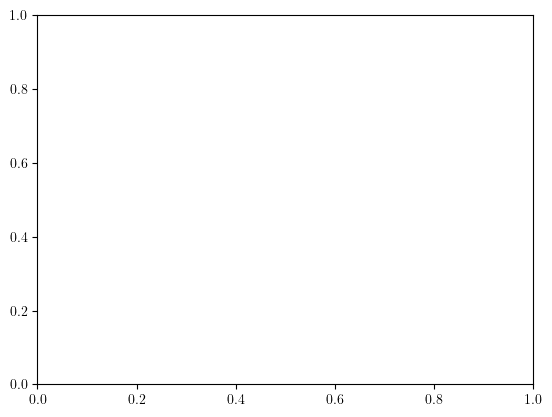

In [2]:
import cartopy.crs as ccrs
import cartopy.io.shapereader as shpreader
import cartopy
import shapely as shp
from shapely import Point
import psutil
import time
import sys
import numpy as np
import networkx as nx
import pandas as pd
import scipy as sp
import scipy.fftpack as fftpack
import re
from datetime import datetime
from tqdm.notebook import tqdm, trange
import gzip
import os
import pickle as pkl
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import matplotlib.patches as mpatches
# from mpl_toolkits.axes_grid1.inset_locator import inset_axes, zoomed_inset_axes, mark_inset
from matplotlib import rc
%matplotlib inline

np.set_printoptions(linewidth=250)


# rc('font', **{'family': 'serif', 'serif': ['Computer Modern']})
mpl.rcParams['font.family'] = 'sans-serif'
mpl.rcParams['font.sans-serif'] = ['Helvetica']
plt.xticks(fontname = 'Helvetica')
plt.yticks(fontname = 'Helvetica')
rc('text', usetex=True)
plt.rc('text.latex', preamble=r'\usepackage{amsmath}\usepackage{xfrac}')#\usepackage{cmbright}')


plt.rcParams['savefig.bbox'] = 'tight'

# !sudo apt-get install texlive-latex-recommended
# !sudo apt install texlive-latex-base texlive-latex-extra texlive-fonts-recommended texlive-fonts-extra cm-super dvipng

font_dir = '/usr/local/lib/python' + str(sys.version_info[0]) + '.' + str(sys.version_info[1]) + '/dist-packages/matplotlib/mpl-data/fonts/ttf/'


if 'Helvetica.ttf' not in os.listdir(font_dir):
  !wget "https://dl.freefontsfamily.com/download/Helvetica-Font"
  !rm LICENSE_OFL.txt README *.otf
  !unzip Helvetica-Font
  !mv Helvetica.ttf $font_dir

import matplotlib.font_manager as fm
# fm.FontProperties(fname='/content/gdrive/MyDrive/Helvetica.ttf', size= 24)
fm.fontManager.addfont(font_dir + 'Helvetica.ttf')
# fm.fontManager.ttflist += fm.createFontList(['/content/gdrive/MyDrive/Helvetica.ttf'])
# mpl.rc('font', family='Helvetica')
mpl.rcParams['font.family'] = 'sans-serif'
mpl.rcParams['font.sans-serif'] = ['Helvetica']

prop_helvetica = fm.FontProperties(fname=font_dir+'Helvetica.ttf')
font = {'fontname':'Helvetica'}

# Mount Drive

In [10]:
# mount drive
from google.colab import drive
drive.mount('/content/gdrive',force_remount=True)

# Set this as the directory in which to save figures
base_dir = '/content/gdrive/My Drive/Amazon Project/'
if not os.path.isdir(base_dir + 'Figures/'):
  os.mkdir(base_dir + 'Figures/')
fig_dir = base_dir + 'Figures/Network Metrics/'
if not os.path.isdir(fig_dir):
  os.mkdir(fig_dir)

data_dir = base_dir + 'Data/'
if not os.path.isdir(data_dir):
  os.mkdir(data_dir)

os.chdir(base_dir)

# Helper Functions

In [7]:
def haversine(lon1, lat1, lon2, lat2, r=6371):
    """
    Calculate the great circle distance between two points
    on the earth (specified in decimal degrees)
    """
    # convert decimal degrees to radians
#     lon1, lat1, lon2, lat2 = map(math.radians, [lon1, lat1, lon2, lat2])
    lon1, lat1, lon2, lat2 = np.radians([lon1, lat1, lon2, lat2])
    # haversine formula
    dlon = lon2 - lon1
    dlat = lat2 - lat1
    a = np.sin(dlat/2)**2 + np.cos(lat1) * np.cos(lat2) * np.sin(dlon/2)**2
    c = 2 * np.arcsin(np.sqrt(a))
    return c * r

def haversine_np(lon1, lat1, lon2, lat2, r=6371):
    """
    Calculate the great circle distance between two points
    on the earth (specified in decimal degrees)

    All args must be of equal length.

    """
    lon1, lat1, lon2, lat2 = map(np.radians, [lon1, lat1, lon2, lat2])

    dlon = lon2 - lon1
    dlat = lat2 - lat1

    a = np.sin(dlat/2.0)**2 + np.cos(lat1) * np.cos(lat2) * np.sin(dlon/2.0)**2

    c = 2 * np.arcsin(np.sqrt(a))
    return c * r

def nearest_neighbors(lat,lon,latlon_icos, r=6371, num_neighbors=4, radius=None):
    """
    Find nearest neighbors (using geodesic distance) of given point

    if radius is None, find closest num_neighbors neighbors
    else, find list of neighbors within radius
    """
    lats = np.zeros((len(latlon_icos),)) + lat
    lons = np.zeros((len(latlon_icos),)) + lon
    distances = haversine_np(lons,lats,latlon_icos[:,1],latlon_icos[:,0], r)

    if radius is not None:
        neighbors = []
        for i in range(len(latlon_icos)):
            lat_icos, lon_icos = latlon_icos[i]
            if distances[i] <= radius:
                neighbors.append((i,distances[i]))
        return neighbors
    else:
        neighbors = [(i,distances[i]) for i in range(len(distances))]

        neighbors.sort(key = lambda k: k[1])
        return neighbors[:num_neighbors]

def interpolate_point(lat,lon,latlon_icos,data, r=6371, num_neighbors=4, radius=None):
    """
    Interpolate point using convolution of nearest geodesic neighbors - found either via
    fixed 'num_neighbors' scheme or via all points within 'radius' geodesic distance of input
    """
    neighbors = nearest_neighbors(lat,lon,latlon_icos, r=r,
                                  num_neighbors=num_neighbors, radius=radius)
    return np.sum([(1/dist)*data[i] for (i,dist) in neighbors])/np.sum([(1/dist) for (i,dist) in neighbors])

def interpolate_points(lats,lons,latlon_icos,data, r=6371, num_neighbors=4, radius=None, desc=''):
    """
    Interpolate a sequence of latitude-longitude points given by 'lats' and 'lons' (equal size 1D array)
    using convolution of nearest geodesic neighbors - found either via
    fixed 'num_neighbors' scheme or via all points within 'radius' geodesic distance of input
    """
    results = np.zeros((len(lats),))
    for i in trange(len(lats), desc=desc, leave=False):
        lat, lon = lats[i], lons[i]
        results[i] = interpolate_point(lat,lon,latlon_icos,data, r=r,
                                       num_neighbors=num_neighbors,
                                       radius=radius)
    return results

def replace_points_near_poles(ilat, ilon, idat, latlon_icos, data,
                              threshold=15, num_neighbors=4, radius=None):
    """
    To fix artifacting near poles, manually interpolate with nearest neighbors

    ilon, ilat is meshgrid over globe
    idat is associated interpolation of data
    data is list of some value for each node in latlon_icos

    90-threshold and -90+threshold (in degrees) are latidues to replace

    """
    close_to_poles = np.concatenate((np.where(abs(ilat[:,0]-90) < threshold)[0],
                                     np.where(abs(ilat[:,0]+90) < threshold)[0]))

    lons = [lon for i in range(len(close_to_poles)) for lon in ilon[0,:]]
    lats = [ilat[lat,0] for lat in close_to_poles for i in range(len(ilon[0,:]))]

    results_close_to_poles = interpolate_points(lats,lons,latlon_icos,data,
                                                num_neighbors=num_neighbors,
                                                radius=radius,
                                                desc = 'Replacing Poles')

    nj = len(ilon[0,:])
    for i in range(len(close_to_poles)):
        lat_ind = close_to_poles[i]
        for j in range(nj):
            idat[lat_ind,j] = results_close_to_poles[nj*i + j]

    return idat

def replace_points_near_dateline(ilat, ilon, idat, latlon_icos, data,
                                 threshold=5, num_neighbors=4, radius=None):
    """
    To fix artifacting near dateline, manually interpolate with longitude periodicity from 0 to 360

    ilon, ilat is meshgrid over globe
    idat is associated interpolation of data
    data is list of some value for each node in latlon_icos

    +/- threshold (in degrees) are longitudes to replace

    """
    close_to_dateline = np.concatenate((np.where(abs(ilon[0,:]) < threshold)[0],
                                        np.where(abs(ilon[0,:]-360) < threshold)[0]))

    lons = [ilon[0,lon] for lon in close_to_dateline for i in range(len(ilat[:,0]))]
    lats = [lat for i in range(len(close_to_dateline)) for lat in ilat[:,0]]

    results_close_to_dateline = interpolate_points(lats,lons,latlon_icos,data,
                                                   num_neighbors=num_neighbors,
                                                   radius=radius,
                                                   desc = 'Replacing Dateline')

    nj = len(ilat[:,0])
    for i in range(len(close_to_dateline)):
        lon_ind = close_to_dateline[i]
        for j in range(nj):
            idat[j,lon_ind] = results_close_to_dateline[nj*i + j]

    return idat

def replace_points_where_nan(ilat, ilon, idat, latlon_icos, data, num_neighbors=4, radius=None):
    """
    Use custom interpolation (using nearest geodesic neighbors) for points that are np.nan

    Can be used to simply fill in values mixed in scipy griddata interpolation due to longitude
    or latitude outside input icosahedral range.

    However, it is not guaranteed that this will fix the seam at the dateline - values with longtidue
    slightly larger than 0 may not smoothly vary since usually the scipy griddata interpolation misses
    data just to the *WEST* of the dateline. Therefore even if those missing values are replaced, there
    may be a seam across the dateline (longutude 0 degrees). TO FIX THIS, SIMPLY USE THE
    replace_points_near_dateline FUNCTION TO INTERPOLATE DATA TO THE WEST *AND* EAST OF THE DATELINE.
    """
    where = np.where(np.isnan(idat))

    lats = ilat[where[0],0]
    lons = ilon[0,where[1]]

    results_where_nans = interpolate_points(lats,lons,latlon_icos,data,
                                            num_neighbors=num_neighbors,
                                            radius=radius,
                                            desc = 'Replacing NaNs')

    for i in range(len(lats)):
        lat_ind = where[0][i]
        lon_ind = where[1][i]

        idat[lat_ind,lon_ind] = results_where_nans[i]

    return idat

def replace_points_in_shapefile(shape_filename, ilat, ilon, idat, fill_value=np.nan, inside=True):
    """
    This function can read a shapefile and fill values from the interpolated grid with 'fill_value'
    when they fall inside of the shapefile. This is useful since the interpolation of scatter data will
    fill in all values - even those that are intentionally left blank.

    OPTIONALLY: Specify inside=False to reverse which points are excluded - here the points *OUTSIDE*
    the shapefile are filled with 'fill_value'.

    TODO: Check if shapefiles with multiple polygons will break function - it was only tested with a
    contiguous-polygon shapefile.
    """
    from shapely.ops import unary_union
    import shapely.vectorized

    reader = shpreader.Reader(shape_filename)

    shape_geom = unary_union(list(reader.geometries()))

    shape_mask = shapely.vectorized.contains(shape_geom, ilon, ilat)
    shape_mask = np.logical_or(shape_mask,
                   shapely.vectorized.contains(shape_geom, ilon-360, ilat))

    idat[np.where(shape_mask == inside)] = fill_value

    return idat

def interpolate_scatter_data(latlon_icos, data, method='linear',
                             threshold_dateline=5, threshold_poles=15,
                             replace_nans = True,
                             num_neighbors=4, radius=None,
                             extent=[0, 360, -90, 90], filler=0,
                             num_interp_pts=200, shape_filename=None,
                             fill_value=np.nan):
    """
    This function takes scatter data as input - with (presumably icosahedral) coordinates 'latlon_icos',
    which is an (N,2)-size list of latitude-longitude pairs, and length-N 'data' specifying the pertinent
    qualitative information for each latitude-longitude pair.

    The output of the function is interpolated grid data intended for use in a contourf plot, consiting of
    'ilon' longitudinal grid - (num_interp_pts,num_interp_pts)
    'ilat' latitudinal grid - (num_interp_pts,num_interp_pts)
    'idat' grid data - (num_interp_pts,num_interp_pts)

    The basic interpolation is performed with scipy.interpolate.griddata, which currently has the flaw of
    not extrapolating under a method='linear' interpolation scheme. It also currently has no way to make
    use of the periodicity over the dateline (longitude = 0 degrees).

    In order to fix the missing points left by scipy.interpolate.griddata, three methods were developed:
    1) Replace points within some degree longitude of the dateline
    2) Replace points within some degree of the poles
    3) Replace all points filled with np.nan
    All three methods utilize a nearest-neighbor convolution, where points with low geodesic distance to
    the grid point are put under a weighted average to fill the grid data. See the function
    interpolate_points for details.

    Lastly, optionally fill values that fall inside (or outside) a supplied shapefile with given 'fill_value'.
    """
    from scipy.interpolate import griddata

    ilon = np.linspace(extent[0]-filler, extent[1]+filler, num_interp_pts)
    ilat = np.linspace(extent[2]-filler, extent[3]+filler, num_interp_pts)
    ilon, ilat = np.meshgrid(ilon, ilat)
    idat = griddata((latlon_icos[:,1], latlon_icos[:,0]), data,
                    (ilon, ilat), method=method)

    if threshold_dateline > 0:
        idat = replace_points_near_dateline(ilat, ilon, idat, latlon_icos,
                                            data, threshold=threshold_dateline,
                                            num_neighbors=num_neighbors,
                                            radius=radius)
    if threshold_poles > 0:
        idat = replace_points_near_poles(ilat, ilon, idat, latlon_icos,
                                         data, threshold=threshold_poles,
                                         num_neighbors=num_neighbors,
                                         radius=radius)
    if replace_nans:
        idat = replace_points_where_nan(ilat, ilon, idat, latlon_icos, data,
                                        num_neighbors=num_neighbors,
                                        radius=radius)

    if shape_filename is not None:
        idat = replace_points_in_shapefile(shape_filename, ilat, ilon,
                                           idat, fill_value=fill_value)

    return ilat, ilon, idat

def shiftedColorMap(cmap, start=0, midpoint=0.5, stop=1.0, name='shiftedcmap'):
    '''
    Function to offset the "center" of a colormap. Useful for
    data with a negative min and positive max and you want the
    middle of the colormap's dynamic range to be at zero.

    Input
    -----
      cmap : The matplotlib colormap to be altered
      start : Offset from lowest point in the colormap's range.
          Defaults to 0.0 (no lower offset). Should be between
          0.0 and `midpoint`.
      midpoint : The new center of the colormap. Defaults to
          0.5 (no shift). Should be between 0.0 and 1.0. In
          general, this should be  1 - vmax / (vmax + abs(vmin))
          For example if your data range from -15.0 to +5.0 and
          you want the center of the colormap at 0.0, `midpoint`
          should be set to  1 - 5/(5 + 15)) or 0.75
      stop : Offset from highest point in the colormap's range.
          Defaults to 1.0 (no upper offset). Should be between
          `midpoint` and 1.0.
    '''
    cdict = {
        'red': [],
        'green': [],
        'blue': [],
        'alpha': []
    }

    # regular index to compute the colors
    reg_index = np.linspace(start, stop, 257)

    # shifted index to match the data
    shift_index = np.hstack([
        np.linspace(0.0, midpoint, 128, endpoint=False),
        np.linspace(midpoint, 1.0, 129, endpoint=True)
    ])

    for ri, si in zip(reg_index, shift_index):
        r, g, b, a = cmap(ri)

        cdict['red'].append((si, r, r))
        cdict['green'].append((si, g, g))
        cdict['blue'].append((si, b, b))
        cdict['alpha'].append((si, a, a))

    newcmap = mpl.colors.LinearSegmentedColormap(name, cdict)
    try:
        # mpl.cm.unregister_cmap(name)
        mpl.colormaps.unregister(name)
    except:
        pass
    # plt.register_cmap(cmap=newcmap)
    mpl.colormaps.register(cmap=newcmap)

    return newcmap

def yy_to_yyyy(yy):
    """
    Convert string of year in yy format to string in yyyy format
    """
    yy_int = int(yy)
    if yy_int < 10:
        return '200' + str(yy_int)
    elif yy_int < 48:
        return '20' + str(yy_int)
    else:
        return '19' + str(yy_int)


def start_year_to_date_range(start_year,year_interval=25):
    """
    Convert string of start year in yy format to date range string in yyyy-yyyy format
    """
    start = yy_to_yyyy(start_year)
    end = str(int(start) + year_interval)
    return start + '-' + end

def match_nodes(dates,finallons_dict,finallats_dict):
    f = gzip.open(data_dir + '/G/'+dates[0]+'.data','rb')
    G = pkl.load(f)
    f.close()
    N = G.number_of_nodes()

    node_matches = np.zeros((N,len(dates)))
    for node in G.nodes():
        node_matches[node,0] = node

    for i in trange(1,len(dates),desc='Matching'):
        for j in range(N):
            node_matches[j,i] = np.where(np.logical_and(finallons_dict[dates[i]] == finallons_dict[dates[0]][j],
                                   finallats_dict[dates[i]] == finallats_dict[dates[0]][j]))[0][0]

    return node_matches.astype(int)

def get_trend(trend_dict,dates,finallons_dict,finallats_dict,normalize=False):
    f = gzip.open(data_dir + '/G/'+dates[0]+'.data','rb')
    G = pkl.load(f)
    f.close()
    nodes = list(G.nodes())

    node_matches = match_nodes(dates,finallons_dict,finallats_dict)

    trend = np.zeros((len(nodes),1))

    for node in nodes:
#         slope, _ = np.polyfit(list(range(48)), [trend_dict[date][node,1] for date in dates], 1)
        slope, _ = np.polyfit(list(range(48)), [trend_dict[dates[i]][node_matches[node,i]] for i in range(len(dates))], 1)
        trend[node] = slope

    if normalize:
#         return np.interp(trend, (trend.min(), trend.max()), (-1, +1))
        return trend/abs(min(trend))
    else:
        return trend

# Random Boxes

In [13]:
with gzip.open(data_dir + 'icosahedral_grid.data', 'rb') as file:
  latlon_icos = np.array(pkl.load(file))

months = 300
offset = 365.25

knn = True

if knn:
  k = 50
  dir_end = '-months={:},offset={:},k={:}/'.format(months,offset,k)
else:
  density = 0.1
  dir_end = '-months={:},offset={:},density={:}/'.format(months,offset,density)


edge_dir = data_dir + 'edge_list' + dir_end



total_networks = len(os.listdir(edge_dir))

num_nodes = 10242

with gzip.open(data_dir + 'year_intervals-months='+str(months)+',offset='+str(offset) + '.data', 'rb') as file:
  year_intervals = pkl.load(file)

with gzip.open(data_dir + 'date_intervals-months='+str(months)+',offset='+str(offset) + '.data', 'rb') as file:
  date_intervals = pkl.load(file)

dates = [year_intervals[i][0] + '-' + year_intervals[i][1] for i in range(len(year_intervals))]
print(dates)

reader = shpreader.Reader(base_dir+'Amazon Biome/amazonia.shp')
amazon = cartopy.feature.ShapelyFeature(list(reader.geometries()), ccrs.PlateCarree())

recompute = False

if recompute:
  amazon_nodes = []

  for i in range(num_nodes):
    if amazon._geoms[0].contains(Point(latlon_icos[i,1]-360,latlon_icos[i,0])):
      amazon_nodes.append(i)

  with gzip.open(data_dir + 'amazon_nodes_new_networks.data', 'wb') as file:
    pkl.dump(amazon_nodes, file)
else:
  with gzip.open(data_dir + 'amazon_nodes_new_networks.data', 'rb') as file:
    amazon_nodes = pkl.load(file)

recompute = False

graph_dir = data_dir + 'G' + dir_end
if recompute:
  if not os.path.isdir(graph_dir):
    os.mkdir(graph_dir)

  for i in trange(len(dates)):
    date = dates[i]

    with gzip.open(edge_dir + str(i) + '.data', 'rb') as file:
      edge_list = pkl.load(file)

    G = nx.from_edgelist(edge_list) # initiall unsorted

    H = nx.Graph() # make sorted copy
    H.add_nodes_from(sorted(G.nodes(data=True)))
    H.add_edges_from(G.edges(data=True))
    G = H # write over original with sorted copy
    del H # delete sorted copy

    degrees = [d[1] for d in G.degree()]

    print(i, nx.density(G), nx.number_connected_components(G), G.number_of_edges(), min(degrees), max(degrees), np.mean(degrees))

    with gzip.open(graph_dir + date + '.data', 'wb') as file:
      pkl.dump(G, file)

['1948-1973', '1949-1974', '1950-1975', '1951-1976', '1952-1977', '1953-1978', '1954-1979', '1955-1980', '1956-1981', '1957-1982', '1958-1983', '1959-1984', '1960-1985', '1961-1986', '1962-1987', '1963-1988', '1964-1989', '1965-1990', '1966-1991', '1967-1992', '1968-1993', '1969-1994', '1970-1995', '1971-1996', '1972-1997', '1973-1998', '1974-1999', '1975-2000', '1976-2001', '1977-2002', '1978-2003', '1979-2004', '1980-2005', '1981-2006', '1982-2007', '1983-2008', '1984-2009', '1985-2010', '1986-2011', '1987-2012', '1988-2013', '1989-2014', '1990-2015', '1991-2016', '1992-2017', '1993-2018', '1994-2019', '1995-2020', '1996-2021', '1997-2022', '1998-2023']


In [ ]:
with gzip.open(graph_dir + dates[0] + '.data', 'rb') as file:
  G = pkl.load(file)

print(type(G) == type(nx.Graph()), type(G) == type(nx.DiGraph()))

True False


In [ ]:
print(dir_end)
print(edge_dir)
print(graph_dir)

-months=300,offset=365.25,k=5/
/content/gdrive/My Drive/Amazon Project/Data/edge_list-months=300,offset=365.25,k=5/
/content/gdrive/My Drive/Amazon Project/Data/G-months=300,offset=365.25,k=5/


In [ ]:
def get_num_in_box(center_lat,center_lon,width,height,latlon_icos):
    num = 0
    for i in range(len(latlon_icos)):
        lat, lon = latlon_icos[i]
        # num += 1 if (center_lat-height/2 <= lat <= center_lat+height/2) and (center_lon-width/2 % 360 <= lon <= center_lon+width/2 % 360) else 0
        num += ((center_lat-height/2 <= lat <= center_lat+height/2) and (center_lon-width/2 % 360 <= lon <= center_lon+width/2 % 360))
    return num

def get_random_box(n,latlon_icos,increment=0.5,lat_low=-80,lat_high=80):
    # NOTE: Allows for box to cross 0 deg longitude line (REMEMBER TO USE MODULAR ARITHMETIC)
#     center_lat = np.random.uniform(low=-90,high=90)
    center_lat = np.random.uniform(low=lat_low,high=lat_high)
    center_lon = np.random.uniform(low=0,high=360)
#     height, width = increment, increment
#     height, width = 20, 20
    start_ratio = 0.75
    aspect_ratio = 30/22
    height, width = start_ratio*22, start_ratio*30
    while get_num_in_box(center_lat,center_lon,width,height,latlon_icos) < n:
        height += increment/aspect_ratio
#         width += increment
        width += increment
        if center_lat-height/2 < -90 or center_lat+height/2 > 90:
            # Reset (box stetches past -90 or +90 latitude)
#             center_lat = np.random.uniform(low=-90,high=90)
            center_lat = np.random.uniform(low=lat_low,high=lat_high)
            center_lon = np.random.uniform(low=0,high=360)
#             height, width = 20, 20
            height, width = start_ratio*22, start_ratio*30
#     print(height,width)
    return center_lat, center_lon, height, width

def get_nodes_in_box(center_lat,center_lon,height,width,latlon_icos):
    nodes = []
    for i in range(len(latlon_icos)):
#         lat, lon = finallats[i], finallons[i]
        lat, lon = latlon_icos[i]
        if (center_lat-height/2 <= lat <= center_lat+height/2) and (center_lon-width/2 % 360 <= lon <= center_lon+width/2 % 360):
            nodes += [i]
#     print(len(nodes))
    return nodes  # RETURNS THE NODE **NAME**, NOT INDEX OF NODE IN G.nodes()

def get_random_box_samples(n,latlon_icos,random_box_dir,num_samples=1000,increment=0.5,disp_progress=False,excluded_nodes=amazon_nodes):
    target_nodes_lst_overall = []
    target_nodes_lst_tropical = []

    # excluded_nodes = set(excluded_nodes)

    if disp_progress:
        lst = trange(num_samples, leave=False, desc='Building samples')
    else:
        lst = range(num_samples)

    for k in lst:
        # Overall Random Boxes
        center_lat, center_lon, height, width = get_random_box(n,latlon_icos,increment)
        target_nodes = np.setdiff1d(get_nodes_in_box(center_lat,center_lon,height,width,
                                        latlon_icos),excluded_nodes) # NODE **NAMES**
        # target_nodes = sorted(list(set(target_nodes) - excluded_nodes))
        # target_nodes = [t for t in target_nodes if t not in [excluded_nodes]]
        target_nodes_lst_overall.append(target_nodes)


#         for date in dates:
#             target_nodes = get_nodes_in_box(center_lat,center_lon,height,width,
#                                             finallats_dict[date],finallons_dict[date],
#                                             node_index_dict[date]) # NODE **NAMES**
#             target_nodes = [t for t in target_nodes if t not in [excluded_nodes]]
#             if not date in target_nodes_dict_overall:
#                 target_nodes_dict_overall[date] = [target_nodes]
#             else:
#                 target_nodes_dict_overall[date].append(target_nodes)

        # Tropical Random Boxes
        center_lat, center_lon, height, width = get_random_box(n,latlon_icos,increment,-10,10)
        target_nodes = np.setdiff1d(get_nodes_in_box(center_lat,center_lon,height,width,
                                        latlon_icos),excluded_nodes) # NODE **NAMES**
        # target_nodes = sorted(list(set(target_nodes) - excluded_nodes))
        # target_nodes = [t for t in target_nodes if t not in [excluded_nodes]]
        target_nodes_lst_tropical.append(target_nodes)


#         for date in dates:
#             target_nodes = get_nodes_in_box(center_lat,center_lon,height,width,
#                                             finallats_dict[date],finallons_dict[date],
#                                             node_index_dict[date]) # NODE **NAMES**
#             target_nodes = [t for t in target_nodes if t not in [excluded_nodes]]
#             if not date in target_nodes_dict_tropical:
#                 target_nodes_dict_tropic al[date] = [target_nodes]
#             else:
#                 target_nodes_dict_tropical[date].append(target_nodes)

#     for date in tqdm(dates, leave=False, desc='Saving data', position=0):
#         with gzip.open(random_box_dir + 'Overall/'+date+'.data','wb') as file:
#             pkl.dump(target_nodes_dict_overall[date], file)

#         with gzip.open(random_box_dir + 'Tropical/'+date+'.data','wb') as file:
#             pkl.dump(target_nodes_dict_tropical[date], file)

    with gzip.open(random_box_dir + 'overall.data', 'wb') as file:
        pkl.dump(target_nodes_lst_overall, file)

    with gzip.open(random_box_dir + 'tropical.data', 'wb') as file:
        pkl.dump(target_nodes_lst_tropical, file)

    return target_nodes_lst_overall, target_nodes_lst_tropical

In [5]:
random_box_base_dir = data_dir + 'Random Boxes/'
if not os.path.isdir(random_box_base_dir):
  os.mkdir(random_box_base_dir)

random_box_dir = random_box_base_dir + 'Random Boxes' + dir_end
if not os.path.isdir(random_box_dir):
  os.mkdir(random_box_dir)

recompute = False

if recompute:
  target_nodes_lst_overall, target_nodes_lst_tropical = get_random_box_samples(len(amazon_nodes),latlon_icos,random_box_base_dir,num_samples=5000,increment=0.5,disp_progress=True,excluded_nodes=amazon_nodes)
else:
  with gzip.open(random_box_base_dir + 'overall.data', 'rb') as file:
      target_nodes_lst_overall = pkl.load(file)

  with gzip.open(random_box_base_dir + 'tropical.data', 'rb') as file:
      target_nodes_lst_tropical = pkl.load(file)

In [ ]:
def collect_geodesic_dist_from_boxes_cp(dates,target_nodes_lst_overall,target_nodes_lst_tropical,latlon_icos,data_dir,graph_dir,random_box_dir,dir_end,filename='collected_distances',save_each_iter=False,per_iter_filename='distances'):
  num_nodes = len(latlon_icos)
  num_samples_overall = len(target_nodes_lst_overall)
  num_samples_tropical = len(target_nodes_lst_tropical)

  geodesic_distances = np.zeros((num_nodes,num_nodes))
  for i in range(num_nodes):
    lats = np.zeros((num_nodes-i-1,)) + latlon_icos[i,0]
    lons = np.zeros((num_nodes-i-1,)) + latlon_icos[i,1]
    geodesic_distances[i,i+1:] = haversine_np(lons,lats,latlon_icos[i+1:,1],latlon_icos[i+1:,0])
    geodesic_distances[i+1:,i] = geodesic_distances[i,i+1:]
  geodesic_distances = cp.asarray(geodesic_distances)

  with gzip.open(graph_dir+dates[0]+'.data', 'rb') as file:
    G = pkl.load(file)

  is_digraph = type(G) == type(nx.DiGraph())

  avg_dist_overall = cp.zeros((len(dates),num_samples_overall))
  avg_dist_tropical = cp.zeros((len(dates),num_samples_tropical))

  for date_num in trange(len(dates), leave=False):
    date = dates[date_num]

    with gzip.open(graph_dir+date+'.data', 'rb') as file:
      G = pkl.load(file)

    all_edges = cp.array([e for e in G.edges])

    for sample_num in trange(num_samples_overall,leave=False,desc=date):
      target_nodes = cp.asarray(target_nodes_lst_overall[sample_num])
      edges = all_edges[cp.union1d(cp.where(cp.in1d(all_edges[:,0],target_nodes) == True)[0],cp.where(cp.in1d(all_edges[:,1],target_nodes) == True)[0])]

      avg_dist_overall[date_num,sample_num] = cp.mean(geodesic_distances[edges[:,0],edges[:,1]])



      target_nodes = cp.asarray(target_nodes_lst_tropical[sample_num])
      edges = all_edges[cp.union1d(cp.where(cp.in1d(all_edges[:,0],target_nodes) == True)[0],cp.where(cp.in1d(all_edges[:,1],target_nodes) == True)[0])]

      avg_dist_tropical[date_num,sample_num] = cp.mean(geodesic_distances[edges[:,0],edges[:,1]])


    if save_each_iter:
      vars = ['avg_dist_overall', 'avg_dist_tropical']
      with gzip.open(random_box_dir + per_iter_filename + ',date={:}'.format(date) + '.data', 'wb') as file:
        for var in vars:
          pkl.dump(cp.asnumpy(locals()[var])[date_num],file)


  # vars = ['betweenness_in_overall', 'betweenness_out_overall', 'avg_shortest_path_len_overall',
  #         'geo_dist_by_avg_shortest_path_len_overall', 'conn_ratio_overall', 'dist_ratio_overall',
  #         'betweenness_in_tropical', 'betweenness_out_tropical', 'avg_shortest_path_len_tropical',
  #         'geo_dist_by_avg_shortest_path_len_tropical', 'conn_ratio_tropical', 'dist_ratio_tropical']
  vars = ['avg_dist_overall', 'avg_dist_tropical']

  try:
    with gzip.open(random_box_dir + filename + '.data', 'wb') as file:
      for var in vars:
        pkl.dump(cp.asnumpy(locals()[var]),file)
  except:
    pass

  # return betweenness_in_overall, betweenness_out_overall, avg_shortest_path_len_overall, geo_dist_by_avg_shortest_path_len_overall, conn_ratio_overall, dist_ratio_overall, betweenness_in_tropical, betweenness_out_tropical, avg_shortest_path_len_tropical, geo_dist_by_avg_shortest_path_len_tropical, conn_ratio_tropical, dist_ratio_tropical
  return cp.asnumpy(avg_dist_overall), cp.asnumpy(avg_dist_tropical)


In [ ]:
def collect_geodesic_dist_from_boxes(dates,target_nodes_lst_overall,target_nodes_lst_tropical,latlon_icos,data_dir,graph_dir,random_box_dir,dir_end,filename='collected_distances',save_each_iter=False,per_iter_filename='distances'):
  num_nodes = len(latlon_icos)
  num_samples_overall = len(target_nodes_lst_overall)
  num_samples_tropical = len(target_nodes_lst_tropical)

  geodesic_distances = np.zeros((num_nodes,num_nodes))
  for i in range(num_nodes):
    lats = np.zeros((num_nodes-i-1,)) + latlon_icos[i,0]
    lons = np.zeros((num_nodes-i-1,)) + latlon_icos[i,1]
    geodesic_distances[i,i+1:] = haversine_np(lons,lats,latlon_icos[i+1:,1],latlon_icos[i+1:,0])
    geodesic_distances[i+1:,i] = geodesic_distances[i,i+1:]

  with gzip.open(graph_dir+dates[0]+'.data', 'rb') as file:
    G = pkl.load(file)

  is_digraph = type(G) == type(nx.DiGraph())

  avg_dist_overall = np.zeros((len(dates),num_samples_overall))
  avg_dist_tropical = np.zeros((len(dates),num_samples_tropical))

  for date_num in trange(len(dates), leave=False):
    date = dates[date_num]

    with gzip.open(graph_dir+date+'.data', 'rb') as file:
      G = pkl.load(file)

    all_edges = np.array([e for e in G.edges])

    for sample_num in trange(num_samples_overall,leave=False,desc=date):
      target_nodes = target_nodes_lst_overall[sample_num]
      edges = all_edges[np.union1d(np.where(np.in1d(all_edges[:,0],target_nodes) == True)[0],np.where(np.in1d(all_edges[:,1],target_nodes) == True)[0])]

      avg_dist_overall[date_num,sample_num] = np.mean(geodesic_distances[edges[:,0],edges[:,1]])



      target_nodes = target_nodes_lst_tropical[sample_num]
      edges = all_edges[np.union1d(np.where(np.in1d(all_edges[:,0],target_nodes) == True)[0],np.where(np.in1d(all_edges[:,1],target_nodes) == True)[0])]

      avg_dist_tropical[date_num,sample_num] = np.mean(geodesic_distances[edges[:,0],edges[:,1]])


    if save_each_iter:
      vars = ['avg_dist_overall', 'avg_dist_tropical']
      with gzip.open(random_box_dir + per_iter_filename + ',date={:}'.format(date) + '.data', 'wb') as file:
        for var in vars:
          pkl.dump(locals()[var],file)


  # vars = ['betweenness_in_overall', 'betweenness_out_overall', 'avg_shortest_path_len_overall',
  #         'geo_dist_by_avg_shortest_path_len_overall', 'conn_ratio_overall', 'dist_ratio_overall',
  #         'betweenness_in_tropical', 'betweenness_out_tropical', 'avg_shortest_path_len_tropical',
  #         'geo_dist_by_avg_shortest_path_len_tropical', 'conn_ratio_tropical', 'dist_ratio_tropical']
  vars = ['avg_dist_overall', 'avg_dist_tropical']

  try:
    with gzip.open(random_box_dir + filename + '.data', 'wb') as file:
      for var in vars:
        pkl.dump(locals()[var],file)
  except:
    pass

  # return betweenness_in_overall, betweenness_out_overall, avg_shortest_path_len_overall, geo_dist_by_avg_shortest_path_len_overall, conn_ratio_overall, dist_ratio_overall, betweenness_in_tropical, betweenness_out_tropical, avg_shortest_path_len_tropical, geo_dist_by_avg_shortest_path_len_tropical, conn_ratio_tropical, dist_ratio_tropical
  return avg_dist_overall, avg_dist_tropical


In [ ]:
ks = [50, 100, 250, 500, 1000]

random_box_base_dir = data_dir + 'Random Boxes/'
if not os.path.isdir(random_box_base_dir):
  os.mkdir(random_box_base_dir)

for k in ks:
  dir_end = '-months={:},offset={:},k={:}/'.format(months,offset,k)

  graph_dir = data_dir + 'G' + dir_end

  random_box_dir = random_box_base_dir + 'Random Boxes' + dir_end
  if not os.path.isdir(random_box_dir):
    os.mkdir(random_box_dir)

  recompute = False

  if recompute:
    target_nodes_lst_overall, target_nodes_lst_tropical = get_random_box_samples(len(amazon_nodes),latlon_icos,random_box_base_dir,num_samples=5000,increment=0.5,disp_progress=True,excluded_nodes=amazon_nodes)
  else:
    with gzip.open(random_box_base_dir + 'overall.data', 'rb') as file:
        target_nodes_lst_overall = pkl.load(file)

    with gzip.open(random_box_base_dir + 'tropical.data', 'rb') as file:
        target_nodes_lst_tropical = pkl.load(file)


  results = collect_geodesic_dist_from_boxes_cp(dates,target_nodes_lst_overall,target_nodes_lst_tropical,latlon_icos,data_dir,graph_dir,random_box_dir,dir_end,filename='collected_distances',save_each_iter=False)

In [ ]:
ks = [50, 100, 250, 500, 1000]

random_box_base_dir = data_dir + 'Random Boxes/'
if not os.path.isdir(random_box_base_dir):
  os.mkdir(random_box_base_dir)

for k in ks:
  dir_end = '-months={:},offset={:},k={:}/'.format(months,offset,k)

  graph_dir = data_dir + 'G' + dir_end

  random_box_dir = random_box_base_dir + 'Random Boxes' + dir_end
  if not os.path.isdir(random_box_dir):
    os.mkdir(random_box_dir)

  num_nodes = len(latlon_icos)

  geodesic_distances = np.zeros((num_nodes,num_nodes))
  for i in range(num_nodes):
    lats = np.zeros((num_nodes-i-1,)) + latlon_icos[i,0]
    lons = np.zeros((num_nodes-i-1,)) + latlon_icos[i,1]
    geodesic_distances[i,i+1:] = haversine_np(lons,lats,latlon_icos[i+1:,1],latlon_icos[i+1:,0])
    geodesic_distances[i+1:,i] = geodesic_distances[i,i+1:]
  geodesic_distances = cp.asarray(geodesic_distances)

  avg_dist_amazon = cp.zeros((len(dates),1))

  for date_num in trange(len(dates), leave=False):
    date = dates[date_num]

    with gzip.open(graph_dir+date+'.data', 'rb') as file:
      G = pkl.load(file)

    all_edges = cp.array([e for e in G.edges])

    for sample_num in trange(1,leave=False,desc=date):
      target_nodes = cp.asarray(amazon_nodes)
      edges = all_edges[cp.union1d(cp.where(cp.in1d(all_edges[:,0],target_nodes) == True)[0],cp.where(cp.in1d(all_edges[:,1],target_nodes) == True)[0])]

      avg_dist_amazon[date_num,sample_num] = cp.mean(geodesic_distances[edges[:,0],edges[:,1]])

  with gzip.open(random_box_dir + 'amazon_distances.data', 'wb') as file:
    pkl.dump(cp.asnumpy(avg_dist_amazon), file)

  0%|          | 0/51 [00:00<?, ?it/s]

1948-1973:   0%|          | 0/1 [00:00<?, ?it/s]

1949-1974:   0%|          | 0/1 [00:00<?, ?it/s]

1950-1975:   0%|          | 0/1 [00:00<?, ?it/s]

1951-1976:   0%|          | 0/1 [00:00<?, ?it/s]

1952-1977:   0%|          | 0/1 [00:00<?, ?it/s]

1953-1978:   0%|          | 0/1 [00:00<?, ?it/s]

1954-1979:   0%|          | 0/1 [00:00<?, ?it/s]

1955-1980:   0%|          | 0/1 [00:00<?, ?it/s]

1956-1981:   0%|          | 0/1 [00:00<?, ?it/s]

1957-1982:   0%|          | 0/1 [00:00<?, ?it/s]

1958-1983:   0%|          | 0/1 [00:00<?, ?it/s]

1959-1984:   0%|          | 0/1 [00:00<?, ?it/s]

1960-1985:   0%|          | 0/1 [00:00<?, ?it/s]

1961-1986:   0%|          | 0/1 [00:00<?, ?it/s]

1962-1987:   0%|          | 0/1 [00:00<?, ?it/s]

1963-1988:   0%|          | 0/1 [00:00<?, ?it/s]

1964-1989:   0%|          | 0/1 [00:00<?, ?it/s]

1965-1990:   0%|          | 0/1 [00:00<?, ?it/s]

1966-1991:   0%|          | 0/1 [00:00<?, ?it/s]

1967-1992:   0%|          | 0/1 [00:00<?, ?it/s]

1968-1993:   0%|          | 0/1 [00:00<?, ?it/s]

1969-1994:   0%|          | 0/1 [00:00<?, ?it/s]

1970-1995:   0%|          | 0/1 [00:00<?, ?it/s]

1971-1996:   0%|          | 0/1 [00:00<?, ?it/s]

1972-1997:   0%|          | 0/1 [00:00<?, ?it/s]

1973-1998:   0%|          | 0/1 [00:00<?, ?it/s]

1974-1999:   0%|          | 0/1 [00:00<?, ?it/s]

1975-2000:   0%|          | 0/1 [00:00<?, ?it/s]

1976-2001:   0%|          | 0/1 [00:00<?, ?it/s]

1977-2002:   0%|          | 0/1 [00:00<?, ?it/s]

1978-2003:   0%|          | 0/1 [00:00<?, ?it/s]

1979-2004:   0%|          | 0/1 [00:00<?, ?it/s]

1980-2005:   0%|          | 0/1 [00:00<?, ?it/s]

1981-2006:   0%|          | 0/1 [00:00<?, ?it/s]

1982-2007:   0%|          | 0/1 [00:00<?, ?it/s]

1983-2008:   0%|          | 0/1 [00:00<?, ?it/s]

1984-2009:   0%|          | 0/1 [00:00<?, ?it/s]

1985-2010:   0%|          | 0/1 [00:00<?, ?it/s]

1986-2011:   0%|          | 0/1 [00:00<?, ?it/s]

1987-2012:   0%|          | 0/1 [00:00<?, ?it/s]

1988-2013:   0%|          | 0/1 [00:00<?, ?it/s]

1989-2014:   0%|          | 0/1 [00:00<?, ?it/s]

1990-2015:   0%|          | 0/1 [00:00<?, ?it/s]

1991-2016:   0%|          | 0/1 [00:00<?, ?it/s]

1992-2017:   0%|          | 0/1 [00:00<?, ?it/s]

1993-2018:   0%|          | 0/1 [00:00<?, ?it/s]

1994-2019:   0%|          | 0/1 [00:00<?, ?it/s]

1995-2020:   0%|          | 0/1 [00:00<?, ?it/s]

1996-2021:   0%|          | 0/1 [00:00<?, ?it/s]

1997-2022:   0%|          | 0/1 [00:00<?, ?it/s]

1998-2023:   0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

1948-1973:   0%|          | 0/1 [00:00<?, ?it/s]

1949-1974:   0%|          | 0/1 [00:00<?, ?it/s]

1950-1975:   0%|          | 0/1 [00:00<?, ?it/s]

1951-1976:   0%|          | 0/1 [00:00<?, ?it/s]

1952-1977:   0%|          | 0/1 [00:00<?, ?it/s]

1953-1978:   0%|          | 0/1 [00:00<?, ?it/s]

1954-1979:   0%|          | 0/1 [00:00<?, ?it/s]

1955-1980:   0%|          | 0/1 [00:00<?, ?it/s]

1956-1981:   0%|          | 0/1 [00:00<?, ?it/s]

1957-1982:   0%|          | 0/1 [00:00<?, ?it/s]

1958-1983:   0%|          | 0/1 [00:00<?, ?it/s]

1959-1984:   0%|          | 0/1 [00:00<?, ?it/s]

1960-1985:   0%|          | 0/1 [00:00<?, ?it/s]

1961-1986:   0%|          | 0/1 [00:00<?, ?it/s]

1962-1987:   0%|          | 0/1 [00:00<?, ?it/s]

1963-1988:   0%|          | 0/1 [00:00<?, ?it/s]

1964-1989:   0%|          | 0/1 [00:00<?, ?it/s]

1965-1990:   0%|          | 0/1 [00:00<?, ?it/s]

1966-1991:   0%|          | 0/1 [00:00<?, ?it/s]

1967-1992:   0%|          | 0/1 [00:00<?, ?it/s]

1968-1993:   0%|          | 0/1 [00:00<?, ?it/s]

1969-1994:   0%|          | 0/1 [00:00<?, ?it/s]

1970-1995:   0%|          | 0/1 [00:00<?, ?it/s]

1971-1996:   0%|          | 0/1 [00:00<?, ?it/s]

1972-1997:   0%|          | 0/1 [00:00<?, ?it/s]

1973-1998:   0%|          | 0/1 [00:00<?, ?it/s]

1974-1999:   0%|          | 0/1 [00:00<?, ?it/s]

1975-2000:   0%|          | 0/1 [00:00<?, ?it/s]

1976-2001:   0%|          | 0/1 [00:00<?, ?it/s]

1977-2002:   0%|          | 0/1 [00:00<?, ?it/s]

1978-2003:   0%|          | 0/1 [00:00<?, ?it/s]

1979-2004:   0%|          | 0/1 [00:00<?, ?it/s]

1980-2005:   0%|          | 0/1 [00:00<?, ?it/s]

1981-2006:   0%|          | 0/1 [00:00<?, ?it/s]

1982-2007:   0%|          | 0/1 [00:00<?, ?it/s]

1983-2008:   0%|          | 0/1 [00:00<?, ?it/s]

1984-2009:   0%|          | 0/1 [00:00<?, ?it/s]

1985-2010:   0%|          | 0/1 [00:00<?, ?it/s]

1986-2011:   0%|          | 0/1 [00:00<?, ?it/s]

1987-2012:   0%|          | 0/1 [00:00<?, ?it/s]

1988-2013:   0%|          | 0/1 [00:00<?, ?it/s]

1989-2014:   0%|          | 0/1 [00:00<?, ?it/s]

1990-2015:   0%|          | 0/1 [00:00<?, ?it/s]

1991-2016:   0%|          | 0/1 [00:00<?, ?it/s]

1992-2017:   0%|          | 0/1 [00:00<?, ?it/s]

1993-2018:   0%|          | 0/1 [00:00<?, ?it/s]

1994-2019:   0%|          | 0/1 [00:00<?, ?it/s]

1995-2020:   0%|          | 0/1 [00:00<?, ?it/s]

1996-2021:   0%|          | 0/1 [00:00<?, ?it/s]

1997-2022:   0%|          | 0/1 [00:00<?, ?it/s]

1998-2023:   0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

1948-1973:   0%|          | 0/1 [00:00<?, ?it/s]

1949-1974:   0%|          | 0/1 [00:00<?, ?it/s]

1950-1975:   0%|          | 0/1 [00:00<?, ?it/s]

1951-1976:   0%|          | 0/1 [00:00<?, ?it/s]

1952-1977:   0%|          | 0/1 [00:00<?, ?it/s]

1953-1978:   0%|          | 0/1 [00:00<?, ?it/s]

1954-1979:   0%|          | 0/1 [00:00<?, ?it/s]

1955-1980:   0%|          | 0/1 [00:00<?, ?it/s]

1956-1981:   0%|          | 0/1 [00:00<?, ?it/s]

1957-1982:   0%|          | 0/1 [00:00<?, ?it/s]

1958-1983:   0%|          | 0/1 [00:00<?, ?it/s]

1959-1984:   0%|          | 0/1 [00:00<?, ?it/s]

1960-1985:   0%|          | 0/1 [00:00<?, ?it/s]

1961-1986:   0%|          | 0/1 [00:00<?, ?it/s]

1962-1987:   0%|          | 0/1 [00:00<?, ?it/s]

1963-1988:   0%|          | 0/1 [00:00<?, ?it/s]

1964-1989:   0%|          | 0/1 [00:00<?, ?it/s]

1965-1990:   0%|          | 0/1 [00:00<?, ?it/s]

1966-1991:   0%|          | 0/1 [00:00<?, ?it/s]

1967-1992:   0%|          | 0/1 [00:00<?, ?it/s]

1968-1993:   0%|          | 0/1 [00:00<?, ?it/s]

1969-1994:   0%|          | 0/1 [00:00<?, ?it/s]

1970-1995:   0%|          | 0/1 [00:00<?, ?it/s]

1971-1996:   0%|          | 0/1 [00:00<?, ?it/s]

1972-1997:   0%|          | 0/1 [00:00<?, ?it/s]

1973-1998:   0%|          | 0/1 [00:00<?, ?it/s]

1974-1999:   0%|          | 0/1 [00:00<?, ?it/s]

1975-2000:   0%|          | 0/1 [00:00<?, ?it/s]

1976-2001:   0%|          | 0/1 [00:00<?, ?it/s]

1977-2002:   0%|          | 0/1 [00:00<?, ?it/s]

1978-2003:   0%|          | 0/1 [00:00<?, ?it/s]

1979-2004:   0%|          | 0/1 [00:00<?, ?it/s]

1980-2005:   0%|          | 0/1 [00:00<?, ?it/s]

1981-2006:   0%|          | 0/1 [00:00<?, ?it/s]

1982-2007:   0%|          | 0/1 [00:00<?, ?it/s]

1983-2008:   0%|          | 0/1 [00:00<?, ?it/s]

1984-2009:   0%|          | 0/1 [00:00<?, ?it/s]

1985-2010:   0%|          | 0/1 [00:00<?, ?it/s]

1986-2011:   0%|          | 0/1 [00:00<?, ?it/s]

1987-2012:   0%|          | 0/1 [00:00<?, ?it/s]

1988-2013:   0%|          | 0/1 [00:00<?, ?it/s]

1989-2014:   0%|          | 0/1 [00:00<?, ?it/s]

1990-2015:   0%|          | 0/1 [00:00<?, ?it/s]

1991-2016:   0%|          | 0/1 [00:00<?, ?it/s]

1992-2017:   0%|          | 0/1 [00:00<?, ?it/s]

1993-2018:   0%|          | 0/1 [00:00<?, ?it/s]

1994-2019:   0%|          | 0/1 [00:00<?, ?it/s]

1995-2020:   0%|          | 0/1 [00:00<?, ?it/s]

1996-2021:   0%|          | 0/1 [00:00<?, ?it/s]

1997-2022:   0%|          | 0/1 [00:00<?, ?it/s]

1998-2023:   0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

1948-1973:   0%|          | 0/1 [00:00<?, ?it/s]

1949-1974:   0%|          | 0/1 [00:00<?, ?it/s]

1950-1975:   0%|          | 0/1 [00:00<?, ?it/s]

1951-1976:   0%|          | 0/1 [00:00<?, ?it/s]

1952-1977:   0%|          | 0/1 [00:00<?, ?it/s]

1953-1978:   0%|          | 0/1 [00:00<?, ?it/s]

1954-1979:   0%|          | 0/1 [00:00<?, ?it/s]

1955-1980:   0%|          | 0/1 [00:00<?, ?it/s]

1956-1981:   0%|          | 0/1 [00:00<?, ?it/s]

1957-1982:   0%|          | 0/1 [00:00<?, ?it/s]

1958-1983:   0%|          | 0/1 [00:00<?, ?it/s]

1959-1984:   0%|          | 0/1 [00:00<?, ?it/s]

1960-1985:   0%|          | 0/1 [00:00<?, ?it/s]

1961-1986:   0%|          | 0/1 [00:00<?, ?it/s]

1962-1987:   0%|          | 0/1 [00:00<?, ?it/s]

1963-1988:   0%|          | 0/1 [00:00<?, ?it/s]

1964-1989:   0%|          | 0/1 [00:00<?, ?it/s]

1965-1990:   0%|          | 0/1 [00:00<?, ?it/s]

1966-1991:   0%|          | 0/1 [00:00<?, ?it/s]

1967-1992:   0%|          | 0/1 [00:00<?, ?it/s]

1968-1993:   0%|          | 0/1 [00:00<?, ?it/s]

1969-1994:   0%|          | 0/1 [00:00<?, ?it/s]

1970-1995:   0%|          | 0/1 [00:00<?, ?it/s]

1971-1996:   0%|          | 0/1 [00:00<?, ?it/s]

1972-1997:   0%|          | 0/1 [00:00<?, ?it/s]

1973-1998:   0%|          | 0/1 [00:00<?, ?it/s]

1974-1999:   0%|          | 0/1 [00:00<?, ?it/s]

1975-2000:   0%|          | 0/1 [00:00<?, ?it/s]

1976-2001:   0%|          | 0/1 [00:00<?, ?it/s]

1977-2002:   0%|          | 0/1 [00:00<?, ?it/s]

1978-2003:   0%|          | 0/1 [00:00<?, ?it/s]

1979-2004:   0%|          | 0/1 [00:00<?, ?it/s]

1980-2005:   0%|          | 0/1 [00:00<?, ?it/s]

1981-2006:   0%|          | 0/1 [00:00<?, ?it/s]

1982-2007:   0%|          | 0/1 [00:00<?, ?it/s]

1983-2008:   0%|          | 0/1 [00:00<?, ?it/s]

1984-2009:   0%|          | 0/1 [00:00<?, ?it/s]

1985-2010:   0%|          | 0/1 [00:00<?, ?it/s]

1986-2011:   0%|          | 0/1 [00:00<?, ?it/s]

1987-2012:   0%|          | 0/1 [00:00<?, ?it/s]

1988-2013:   0%|          | 0/1 [00:00<?, ?it/s]

1989-2014:   0%|          | 0/1 [00:00<?, ?it/s]

1990-2015:   0%|          | 0/1 [00:00<?, ?it/s]

1991-2016:   0%|          | 0/1 [00:00<?, ?it/s]

1992-2017:   0%|          | 0/1 [00:00<?, ?it/s]

1993-2018:   0%|          | 0/1 [00:00<?, ?it/s]

1994-2019:   0%|          | 0/1 [00:00<?, ?it/s]

1995-2020:   0%|          | 0/1 [00:00<?, ?it/s]

1996-2021:   0%|          | 0/1 [00:00<?, ?it/s]

1997-2022:   0%|          | 0/1 [00:00<?, ?it/s]

1998-2023:   0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

1948-1973:   0%|          | 0/1 [00:00<?, ?it/s]

1949-1974:   0%|          | 0/1 [00:00<?, ?it/s]

1950-1975:   0%|          | 0/1 [00:00<?, ?it/s]

1951-1976:   0%|          | 0/1 [00:00<?, ?it/s]

1952-1977:   0%|          | 0/1 [00:00<?, ?it/s]

1953-1978:   0%|          | 0/1 [00:00<?, ?it/s]

1954-1979:   0%|          | 0/1 [00:00<?, ?it/s]

1955-1980:   0%|          | 0/1 [00:00<?, ?it/s]

1956-1981:   0%|          | 0/1 [00:00<?, ?it/s]

1957-1982:   0%|          | 0/1 [00:00<?, ?it/s]

1958-1983:   0%|          | 0/1 [00:00<?, ?it/s]

1959-1984:   0%|          | 0/1 [00:00<?, ?it/s]

1960-1985:   0%|          | 0/1 [00:00<?, ?it/s]

1961-1986:   0%|          | 0/1 [00:00<?, ?it/s]

1962-1987:   0%|          | 0/1 [00:00<?, ?it/s]

1963-1988:   0%|          | 0/1 [00:00<?, ?it/s]

1964-1989:   0%|          | 0/1 [00:00<?, ?it/s]

1965-1990:   0%|          | 0/1 [00:00<?, ?it/s]

1966-1991:   0%|          | 0/1 [00:00<?, ?it/s]

1967-1992:   0%|          | 0/1 [00:00<?, ?it/s]

1968-1993:   0%|          | 0/1 [00:00<?, ?it/s]

1969-1994:   0%|          | 0/1 [00:00<?, ?it/s]

1970-1995:   0%|          | 0/1 [00:00<?, ?it/s]

1971-1996:   0%|          | 0/1 [00:00<?, ?it/s]

1972-1997:   0%|          | 0/1 [00:00<?, ?it/s]

1973-1998:   0%|          | 0/1 [00:00<?, ?it/s]

1974-1999:   0%|          | 0/1 [00:00<?, ?it/s]

1975-2000:   0%|          | 0/1 [00:00<?, ?it/s]

1976-2001:   0%|          | 0/1 [00:00<?, ?it/s]

1977-2002:   0%|          | 0/1 [00:00<?, ?it/s]

1978-2003:   0%|          | 0/1 [00:00<?, ?it/s]

1979-2004:   0%|          | 0/1 [00:00<?, ?it/s]

1980-2005:   0%|          | 0/1 [00:00<?, ?it/s]

1981-2006:   0%|          | 0/1 [00:00<?, ?it/s]

1982-2007:   0%|          | 0/1 [00:00<?, ?it/s]

1983-2008:   0%|          | 0/1 [00:00<?, ?it/s]

1984-2009:   0%|          | 0/1 [00:00<?, ?it/s]

1985-2010:   0%|          | 0/1 [00:00<?, ?it/s]

1986-2011:   0%|          | 0/1 [00:00<?, ?it/s]

1987-2012:   0%|          | 0/1 [00:00<?, ?it/s]

1988-2013:   0%|          | 0/1 [00:00<?, ?it/s]

1989-2014:   0%|          | 0/1 [00:00<?, ?it/s]

1990-2015:   0%|          | 0/1 [00:00<?, ?it/s]

1991-2016:   0%|          | 0/1 [00:00<?, ?it/s]

1992-2017:   0%|          | 0/1 [00:00<?, ?it/s]

1993-2018:   0%|          | 0/1 [00:00<?, ?it/s]

1994-2019:   0%|          | 0/1 [00:00<?, ?it/s]

1995-2020:   0%|          | 0/1 [00:00<?, ?it/s]

1996-2021:   0%|          | 0/1 [00:00<?, ?it/s]

1997-2022:   0%|          | 0/1 [00:00<?, ?it/s]

1998-2023:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
densities = [0.005, 0.01, 0.025, 0.05, 0.1]

random_box_base_dir = data_dir + 'Random Boxes/'
if not os.path.isdir(random_box_base_dir):
  os.mkdir(random_box_base_dir)

for density in densities:
  dir_end = '-months={:},offset={:},density={:}/'.format(months,offset,density)

  graph_dir = data_dir + 'G' + dir_end

  random_box_dir = random_box_base_dir + 'Random Boxes' + dir_end
  if not os.path.isdir(random_box_dir):
    os.mkdir(random_box_dir)

  num_nodes = len(latlon_icos)

  geodesic_distances = np.zeros((num_nodes,num_nodes))
  for i in range(num_nodes):
    lats = np.zeros((num_nodes-i-1,)) + latlon_icos[i,0]
    lons = np.zeros((num_nodes-i-1,)) + latlon_icos[i,1]
    geodesic_distances[i,i+1:] = haversine_np(lons,lats,latlon_icos[i+1:,1],latlon_icos[i+1:,0])
    geodesic_distances[i+1:,i] = geodesic_distances[i,i+1:]
  geodesic_distances = cp.asarray(geodesic_distances)

  avg_dist_amazon = cp.zeros((len(dates),1))

  for date_num in trange(len(dates), leave=False):
    date = dates[date_num]

    with gzip.open(graph_dir+date+'.data', 'rb') as file:
      G = pkl.load(file)

    all_edges = cp.array([e for e in G.edges])

    for sample_num in trange(1,leave=False,desc=date):
      target_nodes = cp.asarray(amazon_nodes)
      edges = all_edges[cp.union1d(cp.where(cp.in1d(all_edges[:,0],target_nodes) == True)[0],cp.where(cp.in1d(all_edges[:,1],target_nodes) == True)[0])]

      avg_dist_amazon[date_num,sample_num] = cp.mean(geodesic_distances[edges[:,0],edges[:,1]])

  with gzip.open(random_box_dir + 'amazon_distances.data', 'wb') as file:
    pkl.dump(cp.asnumpy(avg_dist_amazon), file)

  0%|          | 0/51 [00:00<?, ?it/s]

1948-1973:   0%|          | 0/1 [00:00<?, ?it/s]

1949-1974:   0%|          | 0/1 [00:00<?, ?it/s]

1950-1975:   0%|          | 0/1 [00:00<?, ?it/s]

1951-1976:   0%|          | 0/1 [00:00<?, ?it/s]

1952-1977:   0%|          | 0/1 [00:00<?, ?it/s]

1953-1978:   0%|          | 0/1 [00:00<?, ?it/s]

1954-1979:   0%|          | 0/1 [00:00<?, ?it/s]

1955-1980:   0%|          | 0/1 [00:00<?, ?it/s]

1956-1981:   0%|          | 0/1 [00:00<?, ?it/s]

1957-1982:   0%|          | 0/1 [00:00<?, ?it/s]

1958-1983:   0%|          | 0/1 [00:00<?, ?it/s]

1959-1984:   0%|          | 0/1 [00:00<?, ?it/s]

1960-1985:   0%|          | 0/1 [00:00<?, ?it/s]

1961-1986:   0%|          | 0/1 [00:00<?, ?it/s]

1962-1987:   0%|          | 0/1 [00:00<?, ?it/s]

1963-1988:   0%|          | 0/1 [00:00<?, ?it/s]

1964-1989:   0%|          | 0/1 [00:00<?, ?it/s]

1965-1990:   0%|          | 0/1 [00:00<?, ?it/s]

1966-1991:   0%|          | 0/1 [00:00<?, ?it/s]

1967-1992:   0%|          | 0/1 [00:00<?, ?it/s]

1968-1993:   0%|          | 0/1 [00:00<?, ?it/s]

1969-1994:   0%|          | 0/1 [00:00<?, ?it/s]

1970-1995:   0%|          | 0/1 [00:00<?, ?it/s]

1971-1996:   0%|          | 0/1 [00:00<?, ?it/s]

1972-1997:   0%|          | 0/1 [00:00<?, ?it/s]

1973-1998:   0%|          | 0/1 [00:00<?, ?it/s]

1974-1999:   0%|          | 0/1 [00:00<?, ?it/s]

1975-2000:   0%|          | 0/1 [00:00<?, ?it/s]

1976-2001:   0%|          | 0/1 [00:00<?, ?it/s]

1977-2002:   0%|          | 0/1 [00:00<?, ?it/s]

1978-2003:   0%|          | 0/1 [00:00<?, ?it/s]

1979-2004:   0%|          | 0/1 [00:00<?, ?it/s]

1980-2005:   0%|          | 0/1 [00:00<?, ?it/s]

1981-2006:   0%|          | 0/1 [00:00<?, ?it/s]

1982-2007:   0%|          | 0/1 [00:00<?, ?it/s]

1983-2008:   0%|          | 0/1 [00:00<?, ?it/s]

1984-2009:   0%|          | 0/1 [00:00<?, ?it/s]

1985-2010:   0%|          | 0/1 [00:00<?, ?it/s]

1986-2011:   0%|          | 0/1 [00:00<?, ?it/s]

1987-2012:   0%|          | 0/1 [00:00<?, ?it/s]

1988-2013:   0%|          | 0/1 [00:00<?, ?it/s]

1989-2014:   0%|          | 0/1 [00:00<?, ?it/s]

1990-2015:   0%|          | 0/1 [00:00<?, ?it/s]

1991-2016:   0%|          | 0/1 [00:00<?, ?it/s]

1992-2017:   0%|          | 0/1 [00:00<?, ?it/s]

1993-2018:   0%|          | 0/1 [00:00<?, ?it/s]

1994-2019:   0%|          | 0/1 [00:00<?, ?it/s]

1995-2020:   0%|          | 0/1 [00:00<?, ?it/s]

1996-2021:   0%|          | 0/1 [00:00<?, ?it/s]

1997-2022:   0%|          | 0/1 [00:00<?, ?it/s]

1998-2023:   0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

1948-1973:   0%|          | 0/1 [00:00<?, ?it/s]

1949-1974:   0%|          | 0/1 [00:00<?, ?it/s]

1950-1975:   0%|          | 0/1 [00:00<?, ?it/s]

1951-1976:   0%|          | 0/1 [00:00<?, ?it/s]

1952-1977:   0%|          | 0/1 [00:00<?, ?it/s]

1953-1978:   0%|          | 0/1 [00:00<?, ?it/s]

1954-1979:   0%|          | 0/1 [00:00<?, ?it/s]

1955-1980:   0%|          | 0/1 [00:00<?, ?it/s]

1956-1981:   0%|          | 0/1 [00:00<?, ?it/s]

1957-1982:   0%|          | 0/1 [00:00<?, ?it/s]

1958-1983:   0%|          | 0/1 [00:00<?, ?it/s]

1959-1984:   0%|          | 0/1 [00:00<?, ?it/s]

1960-1985:   0%|          | 0/1 [00:00<?, ?it/s]

1961-1986:   0%|          | 0/1 [00:00<?, ?it/s]

1962-1987:   0%|          | 0/1 [00:00<?, ?it/s]

1963-1988:   0%|          | 0/1 [00:00<?, ?it/s]

1964-1989:   0%|          | 0/1 [00:00<?, ?it/s]

1965-1990:   0%|          | 0/1 [00:00<?, ?it/s]

1966-1991:   0%|          | 0/1 [00:00<?, ?it/s]

1967-1992:   0%|          | 0/1 [00:00<?, ?it/s]

1968-1993:   0%|          | 0/1 [00:00<?, ?it/s]

1969-1994:   0%|          | 0/1 [00:00<?, ?it/s]

1970-1995:   0%|          | 0/1 [00:00<?, ?it/s]

1971-1996:   0%|          | 0/1 [00:00<?, ?it/s]

1972-1997:   0%|          | 0/1 [00:00<?, ?it/s]

1973-1998:   0%|          | 0/1 [00:00<?, ?it/s]

1974-1999:   0%|          | 0/1 [00:00<?, ?it/s]

1975-2000:   0%|          | 0/1 [00:00<?, ?it/s]

1976-2001:   0%|          | 0/1 [00:00<?, ?it/s]

1977-2002:   0%|          | 0/1 [00:00<?, ?it/s]

1978-2003:   0%|          | 0/1 [00:00<?, ?it/s]

1979-2004:   0%|          | 0/1 [00:00<?, ?it/s]

1980-2005:   0%|          | 0/1 [00:00<?, ?it/s]

1981-2006:   0%|          | 0/1 [00:00<?, ?it/s]

1982-2007:   0%|          | 0/1 [00:00<?, ?it/s]

1983-2008:   0%|          | 0/1 [00:00<?, ?it/s]

1984-2009:   0%|          | 0/1 [00:00<?, ?it/s]

1985-2010:   0%|          | 0/1 [00:00<?, ?it/s]

1986-2011:   0%|          | 0/1 [00:00<?, ?it/s]

1987-2012:   0%|          | 0/1 [00:00<?, ?it/s]

1988-2013:   0%|          | 0/1 [00:00<?, ?it/s]

1989-2014:   0%|          | 0/1 [00:00<?, ?it/s]

1990-2015:   0%|          | 0/1 [00:00<?, ?it/s]

1991-2016:   0%|          | 0/1 [00:00<?, ?it/s]

1992-2017:   0%|          | 0/1 [00:00<?, ?it/s]

1993-2018:   0%|          | 0/1 [00:00<?, ?it/s]

1994-2019:   0%|          | 0/1 [00:00<?, ?it/s]

1995-2020:   0%|          | 0/1 [00:00<?, ?it/s]

1996-2021:   0%|          | 0/1 [00:00<?, ?it/s]

1997-2022:   0%|          | 0/1 [00:00<?, ?it/s]

1998-2023:   0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

1948-1973:   0%|          | 0/1 [00:00<?, ?it/s]

1949-1974:   0%|          | 0/1 [00:00<?, ?it/s]

1950-1975:   0%|          | 0/1 [00:00<?, ?it/s]

1951-1976:   0%|          | 0/1 [00:00<?, ?it/s]

1952-1977:   0%|          | 0/1 [00:00<?, ?it/s]

1953-1978:   0%|          | 0/1 [00:00<?, ?it/s]

1954-1979:   0%|          | 0/1 [00:00<?, ?it/s]

1955-1980:   0%|          | 0/1 [00:00<?, ?it/s]

1956-1981:   0%|          | 0/1 [00:00<?, ?it/s]

1957-1982:   0%|          | 0/1 [00:00<?, ?it/s]

1958-1983:   0%|          | 0/1 [00:00<?, ?it/s]

1959-1984:   0%|          | 0/1 [00:00<?, ?it/s]

1960-1985:   0%|          | 0/1 [00:00<?, ?it/s]

1961-1986:   0%|          | 0/1 [00:00<?, ?it/s]

1962-1987:   0%|          | 0/1 [00:00<?, ?it/s]

1963-1988:   0%|          | 0/1 [00:00<?, ?it/s]

1964-1989:   0%|          | 0/1 [00:00<?, ?it/s]

1965-1990:   0%|          | 0/1 [00:00<?, ?it/s]

1966-1991:   0%|          | 0/1 [00:00<?, ?it/s]

1967-1992:   0%|          | 0/1 [00:00<?, ?it/s]

1968-1993:   0%|          | 0/1 [00:00<?, ?it/s]

1969-1994:   0%|          | 0/1 [00:00<?, ?it/s]

1970-1995:   0%|          | 0/1 [00:00<?, ?it/s]

1971-1996:   0%|          | 0/1 [00:00<?, ?it/s]

1972-1997:   0%|          | 0/1 [00:00<?, ?it/s]

1973-1998:   0%|          | 0/1 [00:00<?, ?it/s]

1974-1999:   0%|          | 0/1 [00:00<?, ?it/s]

1975-2000:   0%|          | 0/1 [00:00<?, ?it/s]

1976-2001:   0%|          | 0/1 [00:00<?, ?it/s]

1977-2002:   0%|          | 0/1 [00:00<?, ?it/s]

1978-2003:   0%|          | 0/1 [00:00<?, ?it/s]

1979-2004:   0%|          | 0/1 [00:00<?, ?it/s]

1980-2005:   0%|          | 0/1 [00:00<?, ?it/s]

1981-2006:   0%|          | 0/1 [00:00<?, ?it/s]

1982-2007:   0%|          | 0/1 [00:00<?, ?it/s]

1983-2008:   0%|          | 0/1 [00:00<?, ?it/s]

1984-2009:   0%|          | 0/1 [00:00<?, ?it/s]

1985-2010:   0%|          | 0/1 [00:00<?, ?it/s]

1986-2011:   0%|          | 0/1 [00:00<?, ?it/s]

1987-2012:   0%|          | 0/1 [00:00<?, ?it/s]

1988-2013:   0%|          | 0/1 [00:00<?, ?it/s]

1989-2014:   0%|          | 0/1 [00:00<?, ?it/s]

1990-2015:   0%|          | 0/1 [00:00<?, ?it/s]

1991-2016:   0%|          | 0/1 [00:00<?, ?it/s]

1992-2017:   0%|          | 0/1 [00:00<?, ?it/s]

1993-2018:   0%|          | 0/1 [00:00<?, ?it/s]

1994-2019:   0%|          | 0/1 [00:00<?, ?it/s]

1995-2020:   0%|          | 0/1 [00:00<?, ?it/s]

1996-2021:   0%|          | 0/1 [00:00<?, ?it/s]

1997-2022:   0%|          | 0/1 [00:00<?, ?it/s]

1998-2023:   0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

1948-1973:   0%|          | 0/1 [00:00<?, ?it/s]

1949-1974:   0%|          | 0/1 [00:00<?, ?it/s]

1950-1975:   0%|          | 0/1 [00:00<?, ?it/s]

1951-1976:   0%|          | 0/1 [00:00<?, ?it/s]

1952-1977:   0%|          | 0/1 [00:00<?, ?it/s]

1953-1978:   0%|          | 0/1 [00:00<?, ?it/s]

1954-1979:   0%|          | 0/1 [00:00<?, ?it/s]

1955-1980:   0%|          | 0/1 [00:00<?, ?it/s]

1956-1981:   0%|          | 0/1 [00:00<?, ?it/s]

1957-1982:   0%|          | 0/1 [00:00<?, ?it/s]

1958-1983:   0%|          | 0/1 [00:00<?, ?it/s]

1959-1984:   0%|          | 0/1 [00:00<?, ?it/s]

1960-1985:   0%|          | 0/1 [00:00<?, ?it/s]

1961-1986:   0%|          | 0/1 [00:00<?, ?it/s]

1962-1987:   0%|          | 0/1 [00:00<?, ?it/s]

1963-1988:   0%|          | 0/1 [00:00<?, ?it/s]

1964-1989:   0%|          | 0/1 [00:00<?, ?it/s]

1965-1990:   0%|          | 0/1 [00:00<?, ?it/s]

1966-1991:   0%|          | 0/1 [00:00<?, ?it/s]

1967-1992:   0%|          | 0/1 [00:00<?, ?it/s]

1968-1993:   0%|          | 0/1 [00:00<?, ?it/s]

1969-1994:   0%|          | 0/1 [00:00<?, ?it/s]

1970-1995:   0%|          | 0/1 [00:00<?, ?it/s]

1971-1996:   0%|          | 0/1 [00:00<?, ?it/s]

1972-1997:   0%|          | 0/1 [00:00<?, ?it/s]

1973-1998:   0%|          | 0/1 [00:00<?, ?it/s]

1974-1999:   0%|          | 0/1 [00:00<?, ?it/s]

1975-2000:   0%|          | 0/1 [00:00<?, ?it/s]

1976-2001:   0%|          | 0/1 [00:00<?, ?it/s]

1977-2002:   0%|          | 0/1 [00:00<?, ?it/s]

1978-2003:   0%|          | 0/1 [00:00<?, ?it/s]

1979-2004:   0%|          | 0/1 [00:00<?, ?it/s]

1980-2005:   0%|          | 0/1 [00:00<?, ?it/s]

1981-2006:   0%|          | 0/1 [00:00<?, ?it/s]

1982-2007:   0%|          | 0/1 [00:00<?, ?it/s]

1983-2008:   0%|          | 0/1 [00:00<?, ?it/s]

1984-2009:   0%|          | 0/1 [00:00<?, ?it/s]

1985-2010:   0%|          | 0/1 [00:00<?, ?it/s]

1986-2011:   0%|          | 0/1 [00:00<?, ?it/s]

1987-2012:   0%|          | 0/1 [00:00<?, ?it/s]

1988-2013:   0%|          | 0/1 [00:00<?, ?it/s]

1989-2014:   0%|          | 0/1 [00:00<?, ?it/s]

1990-2015:   0%|          | 0/1 [00:00<?, ?it/s]

1991-2016:   0%|          | 0/1 [00:00<?, ?it/s]

1992-2017:   0%|          | 0/1 [00:00<?, ?it/s]

1993-2018:   0%|          | 0/1 [00:00<?, ?it/s]

1994-2019:   0%|          | 0/1 [00:00<?, ?it/s]

1995-2020:   0%|          | 0/1 [00:00<?, ?it/s]

1996-2021:   0%|          | 0/1 [00:00<?, ?it/s]

1997-2022:   0%|          | 0/1 [00:00<?, ?it/s]

1998-2023:   0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

1948-1973:   0%|          | 0/1 [00:00<?, ?it/s]

1949-1974:   0%|          | 0/1 [00:00<?, ?it/s]

1950-1975:   0%|          | 0/1 [00:00<?, ?it/s]

1951-1976:   0%|          | 0/1 [00:00<?, ?it/s]

1952-1977:   0%|          | 0/1 [00:00<?, ?it/s]

1953-1978:   0%|          | 0/1 [00:00<?, ?it/s]

1954-1979:   0%|          | 0/1 [00:00<?, ?it/s]

1955-1980:   0%|          | 0/1 [00:00<?, ?it/s]

1956-1981:   0%|          | 0/1 [00:00<?, ?it/s]

1957-1982:   0%|          | 0/1 [00:00<?, ?it/s]

1958-1983:   0%|          | 0/1 [00:00<?, ?it/s]

1959-1984:   0%|          | 0/1 [00:00<?, ?it/s]

1960-1985:   0%|          | 0/1 [00:00<?, ?it/s]

1961-1986:   0%|          | 0/1 [00:00<?, ?it/s]

1962-1987:   0%|          | 0/1 [00:00<?, ?it/s]

1963-1988:   0%|          | 0/1 [00:00<?, ?it/s]

1964-1989:   0%|          | 0/1 [00:00<?, ?it/s]

1965-1990:   0%|          | 0/1 [00:00<?, ?it/s]

1966-1991:   0%|          | 0/1 [00:00<?, ?it/s]

1967-1992:   0%|          | 0/1 [00:00<?, ?it/s]

1968-1993:   0%|          | 0/1 [00:00<?, ?it/s]

1969-1994:   0%|          | 0/1 [00:00<?, ?it/s]

1970-1995:   0%|          | 0/1 [00:00<?, ?it/s]

1971-1996:   0%|          | 0/1 [00:00<?, ?it/s]

1972-1997:   0%|          | 0/1 [00:00<?, ?it/s]

1973-1998:   0%|          | 0/1 [00:00<?, ?it/s]

1974-1999:   0%|          | 0/1 [00:00<?, ?it/s]

1975-2000:   0%|          | 0/1 [00:00<?, ?it/s]

1976-2001:   0%|          | 0/1 [00:00<?, ?it/s]

1977-2002:   0%|          | 0/1 [00:00<?, ?it/s]

1978-2003:   0%|          | 0/1 [00:00<?, ?it/s]

1979-2004:   0%|          | 0/1 [00:00<?, ?it/s]

1980-2005:   0%|          | 0/1 [00:00<?, ?it/s]

1981-2006:   0%|          | 0/1 [00:00<?, ?it/s]

1982-2007:   0%|          | 0/1 [00:00<?, ?it/s]

1983-2008:   0%|          | 0/1 [00:00<?, ?it/s]

1984-2009:   0%|          | 0/1 [00:00<?, ?it/s]

1985-2010:   0%|          | 0/1 [00:00<?, ?it/s]

1986-2011:   0%|          | 0/1 [00:00<?, ?it/s]

1987-2012:   0%|          | 0/1 [00:00<?, ?it/s]

1988-2013:   0%|          | 0/1 [00:00<?, ?it/s]

1989-2014:   0%|          | 0/1 [00:00<?, ?it/s]

1990-2015:   0%|          | 0/1 [00:00<?, ?it/s]

1991-2016:   0%|          | 0/1 [00:00<?, ?it/s]

1992-2017:   0%|          | 0/1 [00:00<?, ?it/s]

1993-2018:   0%|          | 0/1 [00:00<?, ?it/s]

1994-2019:   0%|          | 0/1 [00:00<?, ?it/s]

1995-2020:   0%|          | 0/1 [00:00<?, ?it/s]

1996-2021:   0%|          | 0/1 [00:00<?, ?it/s]

1997-2022:   0%|          | 0/1 [00:00<?, ?it/s]

1998-2023:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
def collect_metrics_from_boxes(dates,target_nodes_lst_overall,target_nodes_lst_tropical,latlon_icos,data_dir,graph_dir,random_box_dir,dir_end,filename='collected_data',save_each_iter=False,per_iter_filename='shortest_paths'):
  num_nodes = len(latlon_icos)
  num_samples_overall = len(target_nodes_lst_overall)
  num_samples_tropical = len(target_nodes_lst_tropical)

  geodesic_distances = np.zeros((num_nodes,num_nodes))
  for i in range(num_nodes):
    lats = np.zeros((num_nodes-i-1,)) + latlon_icos[i,0]
    lons = np.zeros((num_nodes-i-1,)) + latlon_icos[i,1]
    geodesic_distances[i,i+1:] = haversine_np(lons,lats,latlon_icos[i+1:,1],latlon_icos[i+1:,0])
    geodesic_distances[i+1:,i] = geodesic_distances[i,i+1:]


  with gzip.open(graph_dir+dates[0]+'.data', 'rb') as file:
    G = pkl.load(file)

  is_digraph = type(G) == type(nx.DiGraph())


  # Metrics
  betweenness_in_overall = np.zeros((len(dates),num_samples_overall))
  if is_digraph:
    betweenness_out_overall = {'in':np.zeros((len(dates),num_samples_overall)),
                               'out':np.zeros((len(dates),num_samples_overall))}
    conn_ratio_overall = {'in':np.zeros((len(dates),num_samples_overall)),
                          'out':np.zeros((len(dates),num_samples_overall))}
    dist_ratio_overall = {'in':np.zeros((len(dates),num_samples_overall)),
                          'out':np.zeros((len(dates),num_samples_overall))}
  else:
    betweenness_out_overall = np.zeros((len(dates),num_samples_overall))
    # avg_shortest_path_len_overall = np.zeros((len(dates),num_samples_overall))
    # geo_dist_by_avg_shortest_path_len_overall = np.zeros((len(dates),num_samples_overall))
    conn_ratio_overall = np.zeros((len(dates),num_samples_overall))
    dist_ratio_overall = np.zeros((len(dates),num_samples_overall))

  betweenness_in_tropical = np.zeros((len(dates),num_samples_tropical))
  if is_digraph:
    betweenness_out_tropical = {'in':np.zeros((len(dates),num_samples_tropical)),
                                'out':np.zeros((len(dates),num_samples_tropical))}
    conn_ratio_tropical = {'in':np.zeros((len(dates),num_samples_tropical)),
                           'out':np.zeros((len(dates),num_samples_tropical))}
    dist_ratio_tropical = {'in':np.zeros((len(dates),num_samples_tropical)),
                           'out':np.zeros((len(dates),num_samples_tropical))}
  else:
    betweenness_out_tropical = np.zeros((len(dates),num_samples_tropical))
    # avg_shortest_path_len_tropical = np.zeros((len(dates),num_samples_tropical))
    # geo_dist_by_avg_shortest_path_len_tropical = np.zeros((len(dates),num_samples_tropical))
    conn_ratio_tropical = np.zeros((len(dates),num_samples_tropical))
    dist_ratio_tropical = np.zeros((len(dates),num_samples_tropical))


  for date_num in trange(len(dates), leave=False):
    date = dates[date_num]

    with gzip.open(data_dir+'edge_betweenness'+dir_end+date+'.data', 'rb') as file:
      edge_betweenness = pkl.load(file)

    with gzip.open(graph_dir+date+'.data', 'rb') as file:
        G = pkl.load(file)


    all_edges = np.array([e for e in G.edges])

    edge_betweenness_mat = np.zeros((num_nodes,num_nodes))
    for e in G.edges:
      edge_betweenness_mat[e] = edge_betweenness[tuple(e)]

    del edge_betweenness

    for sample_num in trange(num_samples_overall,leave=False,desc=date):
      #### OVERALL
      # with gzip.open(data_dir + 'G'+dir_end+date+'.data', 'rb') as file:
      #   G = pkl.load(file)

      target_nodes = target_nodes_lst_overall[sample_num]
      # edges = np.array(list(G.edges(target_nodes)))
      edges = all_edges[np.union1d(np.where(np.in1d(all_edges[:,0],target_nodes) == True)[0],np.where(np.in1d(all_edges[:,1],target_nodes) == True)[0])]

      # edges_in = np.array([sorted(e) for e in edges if e[0] in target_nodes and e[1] in target_nodes])
      # edges_out = np.array([sorted(e) for e in edges if e[1] not in target_nodes or e[1] not in target_nodes])
      edges_in = edges[np.intersect1d(np.where(np.in1d(edges[:,0],target_nodes) == True)[0],np.where(np.in1d(edges[:,1],target_nodes) == True)[0])]
      if is_digraph:
        edges_out = {'in':edges[np.intersect1d(np.where(np.in1d(edges[:,0],target_nodes) == False)[0],np.where(np.in1d(edges[:,1],target_nodes) == True)[0])],
                     'out':edges[np.intersect1d(np.where(np.in1d(edges[:,0],target_nodes) == True)[0],np.where(np.in1d(edges[:,1],target_nodes) == False)[0])]}
      else:
        edges_out = edges[np.setdiff1d(np.where(np.in1d(edges[:,0],target_nodes) == True)[0],np.where(np.in1d(edges[:,1],target_nodes) == True)[0])]

      # Betweenness
      # betweenness_in_overall[date_num,sample_num] = np.mean([edge_betweenness[tuple(e)] for e in edges_in])/np.mean(geodesic_distances[edges[:,0],edges[:,1]])
      # betweenness_out_overall[date_num,sample_num] = np.mean([edge_betweenness[tuple(e)] for e in edges_out])/np.mean(geodesic_distances[edges[:,0],edges[:,1]])
      betweenness_in_overall[date_num,sample_num] = np.mean(edge_betweenness_mat[edges_in[:,0],edges_in[:,1]])/np.mean(geodesic_distances[edges[:,0],edges[:,1]])
      if is_digraph:
        betweenness_out_overall['in'][date_num,sample_num] = np.mean(edge_betweenness_mat[edges_out['in'][:,0],edges_out['in'][:,1]])/(np.mean(geodesic_distances[edges[:,0],edges[:,1]]))
        betweenness_out_overall['out'][date_num,sample_num] = np.mean(edge_betweenness_mat[edges_out['out'][:,0],edges_out['out'][:,1]])/(np.mean(geodesic_distances[edges[:,0],edges[:,1]]))
      else:
        betweenness_out_overall[date_num,sample_num] = np.mean(edge_betweenness_mat[edges_out[:,0],edges_out[:,1]])/np.mean(geodesic_distances[edges[:,0],edges[:,1]])


      # # Avg shortest path from contracted box
      # non_target_nodes = sorted(list(set(range(num_nodes)) - set(target_nodes)))
      # for node in target_nodes[1:]:
      #   nx.contracted_nodes(G, target_nodes[0], node, copy=False)

      # paths = nx.single_source_shortest_path(G, target_nodes[0])
      # shortest_paths_from_box = [paths[node] for node in non_target_nodes]

      # avg_shortest_path_len_overall[date_num,sample_num] = np.mean([len(p)-1 for p in shortest_paths_from_box])
      # geo_dist_by_avg_shortest_path_len_overall[date_num,sample_num] = np.mean([geodesic_distances[p[0],p[-1]]/(len(p)-1) for p in shortest_paths_from_box])


      # Connectivity ratio
      if is_digraph:
        conn_ratio_overall['in'][date_num,sample_num] = len(edges_out['in'])/len(edges)
        conn_ratio_overall['out'][date_num,sample_num] = len(edges_out['out'])/len(edges)
      else:
        conn_ratio_overall[date_num,sample_num] = len(edges_out)/len(edges)


      # Distance ratio
      if is_digraph:
        dist_ratio_overall['in'][date_num,sample_num] = np.mean(geodesic_distances[edges_out['in'][:,0],edges_out['in'][:,1]])/np.mean(geodesic_distances[edges[:,0],edges[:,1]])
        dist_ratio_overall['out'][date_num,sample_num] = np.mean(geodesic_distances[edges_out['out'][:,0],edges_out['out'][:,1]])/np.mean(geodesic_distances[edges[:,0],edges[:,1]])
      else:
        dist_ratio_overall[date_num,sample_num] = np.mean(geodesic_distances[edges_out[:,0],edges_out[:,1]])/np.mean(geodesic_distances[edges[:,0],edges[:,1]])
      #### END OVERALL



      #### TROPICAL
      # with gzip.open(graph_dir+date+'.data', 'rb') as file:
      #   G = pkl.load(file)

      target_nodes = target_nodes_lst_tropical[sample_num]
      # edges = np.array(list(G.edges(target_nodes)))
      edges = all_edges[np.union1d(np.where(np.in1d(all_edges[:,0],target_nodes) == True)[0],np.where(np.in1d(all_edges[:,1],target_nodes) == True)[0])]

      # edges_in = np.array([sorted(e) for e in edges if e[0] in target_nodes and e[1] in target_nodes])
      # edges_out = np.array([sorted(e) for e in edges if e[1] not in target_nodes or e[1] not in target_nodes])
      edges_in = edges[np.intersect1d(np.where(np.in1d(edges[:,0],target_nodes) == True)[0],np.where(np.in1d(edges[:,1],target_nodes) == True)[0])]
      if is_digraph:
        edges_out = {'in':edges[np.intersect1d(np.where(np.in1d(edges[:,0],target_nodes) == False)[0],np.where(np.in1d(edges[:,1],target_nodes) == True)[0])],
                     'out':edges[np.intersect1d(np.where(np.in1d(edges[:,0],target_nodes) == True)[0],np.where(np.in1d(edges[:,1],target_nodes) == False)[0])]}
      else:
        edges_out = edges[np.setdiff1d(np.where(np.in1d(edges[:,0],target_nodes) == True)[0],np.where(np.in1d(edges[:,1],target_nodes) == True)[0])]


      # Betweenness
      # betweenness_in_tropical[date_num,sample_num] = np.mean([edge_betweenness[tuple(e)] for e in edges_in])/np.mean(geodesic_distances[edges[:,0],edges[:,1]])
      # betweenness_out_tropical[date_num,sample_num] = np.mean([edge_betweenness[tuple(e)] for e in edges_out])/np.mean(geodesic_distances[edges[:,0],edges[:,1]])
      betweenness_in_tropical[date_num,sample_num] = np.mean(edge_betweenness_mat[edges_in[:,0],edges_in[:,1]])/np.mean(geodesic_distances[edges[:,0],edges[:,1]])
      if is_digraph:
        betweenness_out_tropical['in'][date_num,sample_num] = np.mean(edge_betweenness_mat[edges_out['in'][:,0],edges_out['in'][:,1]])/np.mean(geodesic_distances[edges[:,0],edges[:,1]])
        betweenness_out_tropical['out'][date_num,sample_num] = np.mean(edge_betweenness_mat[edges_out['out'][:,0],edges_out['out'][:,1]])/np.mean(geodesic_distances[edges[:,0],edges[:,1]])
      else:
        betweenness_out_tropical[date_num,sample_num] = np.mean(edge_betweenness_mat[edges_out[:,0],edges_out[:,1]])/np.mean(geodesic_distances[edges[:,0],edges[:,1]])


      # # Avg shortest path from contracted box
      # non_target_nodes = sorted(list(set(range(num_nodes)) - set(target_nodes)))
      # for node in target_nodes[1:]:
      #   nx.contracted_nodes(G, target_nodes[0], node, copy=False)

      # paths = nx.single_source_shortest_path(G, target_nodes[0])
      # shortest_paths_from_box = [paths[node] for node in non_target_nodes]

      # avg_shortest_path_len_tropical[date_num,sample_num] = np.mean([len(p)-1 for p in shortest_paths_from_box])
      # geo_dist_by_avg_shortest_path_len_tropical[date_num,sample_num] = np.mean([geodesic_distances[p[0],p[-1]]/(len(p)-1) for p in shortest_paths_from_box])


      # Connectivity ratio
      if is_digraph:
        conn_ratio_tropical['in'][date_num,sample_num] = len(edges_out['in'])/len(edges)
        conn_ratio_tropical['out'][date_num,sample_num] = len(edges_out['out'])/len(edges)
      else:
        conn_ratio_tropical[date_num,sample_num] = len(edges_out)/len(edges)


      # Distance ratio
      if is_digraph:
        dist_ratio_tropical['in'][date_num,sample_num] = np.mean(geodesic_distances[edges_out['in'][:,0],edges_out['in'][:,1]])/np.mean(geodesic_distances[edges[:,0],edges[:,1]])
        dist_ratio_tropical['out'][date_num,sample_num] = np.mean(geodesic_distances[edges_out['out'][:,0],edges_out['out'][:,1]])/np.mean(geodesic_distances[edges[:,0],edges[:,1]])
      else:
        dist_ratio_tropical[date_num,sample_num] = np.mean(geodesic_distances[edges_out[:,0],edges_out[:,1]])/np.mean(geodesic_distances[edges[:,0],edges[:,1]])
      #### END TROPICAL

    if save_each_iter:
      vars = ['betweenness_in_overall', 'betweenness_out_overall', 'conn_ratio_overall', 'dist_ratio_overall',
              'betweenness_in_tropical', 'betweenness_out_tropical', 'conn_ratio_tropical', 'dist_ratio_tropical']
      with gzip.open(random_box_dir + per_iter_filename + ',date={:}'.format(date) + '.data', 'wb') as file:
        for var in vars:
          pkl.dump(locals()[var],file)


  # vars = ['betweenness_in_overall', 'betweenness_out_overall', 'avg_shortest_path_len_overall',
  #         'geo_dist_by_avg_shortest_path_len_overall', 'conn_ratio_overall', 'dist_ratio_overall',
  #         'betweenness_in_tropical', 'betweenness_out_tropical', 'avg_shortest_path_len_tropical',
  #         'geo_dist_by_avg_shortest_path_len_tropical', 'conn_ratio_tropical', 'dist_ratio_tropical']
  vars = ['betweenness_in_overall', 'betweenness_out_overall', 'conn_ratio_overall', 'dist_ratio_overall',
          'betweenness_in_tropical', 'betweenness_out_tropical', 'conn_ratio_tropical', 'dist_ratio_tropical']

  try:
    with gzip.open(random_box_dir + filename + '.data', 'wb') as file:
      for var in vars:
        pkl.dump(locals()[var],file)
  except:
    pass

  # return betweenness_in_overall, betweenness_out_overall, avg_shortest_path_len_overall, geo_dist_by_avg_shortest_path_len_overall, conn_ratio_overall, dist_ratio_overall, betweenness_in_tropical, betweenness_out_tropical, avg_shortest_path_len_tropical, geo_dist_by_avg_shortest_path_len_tropical, conn_ratio_tropical, dist_ratio_tropical
  return betweenness_in_overall, betweenness_out_overall, conn_ratio_overall, dist_ratio_overall, betweenness_in_tropical, betweenness_out_tropical, conn_ratio_tropical, dist_ratio_tropical

In [ ]:
def collect_shortest_paths_from_boxes(dates,target_nodes_lst_overall,target_nodes_lst_tropical,latlon_icos,data_dir,graph_dir,random_box_dir,dir_end,filename='collected_data',save_each_iter=True,per_iter_filename='shortest_paths'):
  num_nodes = len(latlon_icos)
  num_samples_overall = len(target_nodes_lst_overall)
  num_samples_tropical = len(target_nodes_lst_tropical)

  geodesic_distances = np.zeros((num_nodes,num_nodes))
  for i in range(num_nodes):
    lats = np.zeros((num_nodes-i-1,)) + latlon_icos[i,0]
    lons = np.zeros((num_nodes-i-1,)) + latlon_icos[i,1]
    geodesic_distances[i,i+1:] = haversine_np(lons,lats,latlon_icos[i+1:,1],latlon_icos[i+1:,0])
    geodesic_distances[i+1:,i] = geodesic_distances[i,i+1:]

  vars = ['avg_shortest_path_len_overall', 'geo_dist_by_avg_shortest_path_len_overall',
          'avg_shortest_path_len_tropical', 'geo_dist_by_avg_shortest_path_len_tropical']

  # Metrics
  avg_shortest_path_len_overall = np.zeros((len(dates),num_samples_overall))
  geo_dist_by_avg_shortest_path_len_overall = np.zeros((len(dates),num_samples_overall))

  avg_shortest_path_len_tropical = np.zeros((len(dates),num_samples_tropical))
  geo_dist_by_avg_shortest_path_len_tropical = np.zeros((len(dates),num_samples_tropical))


  for date_num in trange(len(dates)):
    date = dates[date_num]

    with gzip.open(graph_dir+date+'.data', 'rb') as file:
      G = pkl.load(file)

    all_edges = np.array([sorted(e) for e in G.edges])

    for sample_num in trange(num_samples_overall,leave=False,desc=date):
      #### OVERALL
      target_nodes = target_nodes_lst_overall[sample_num]

      target_neighbors = list(G.neighbors(target_nodes[0]))
      for j in range(1,len(target_nodes)):
        target_neighbors = np.union1d(target_neighbors,list(G.neighbors(target_nodes[j])))
      target_neighbors.sort()
      target_neighbors = np.setdiff1d(target_neighbors,target_nodes)

      # Avg shortest path from contracted box
      non_target_nodes = sorted(list(set(range(num_nodes)) - set(target_nodes)))
      # for node in target_nodes[1:]:
      #   nx.contracted_nodes(G, target_nodes[0], node, copy=False)

      old_edges = tuple(map(tuple, all_edges[np.union1d(np.where(np.in1d(all_edges[:,0],target_nodes) == True)[0],np.where(np.in1d(all_edges[:,1],target_nodes) == True)[0])]))
      new_edges = [(target_nodes[0],n) for n in target_neighbors]
      G.remove_nodes_from(target_nodes)
      G.add_edges_from(new_edges)

      paths = nx.single_source_shortest_path(G, target_nodes[0])
      shortest_paths_from_box = [paths[node] for node in non_target_nodes]

      avg_shortest_path_len_overall[date_num,sample_num] = np.mean([len(p)-1 for p in shortest_paths_from_box])
      geo_dist_by_avg_shortest_path_len_overall[date_num,sample_num] = np.mean([geodesic_distances[p[0],p[-1]]/(len(p)-1) for p in shortest_paths_from_box])

      G.remove_node(target_nodes[0])
      G.add_edges_from(old_edges)
      #### END OVERALL



      #### TROPICAL
      target_nodes = target_nodes_lst_tropical[sample_num]

      target_neighbors = list(G.neighbors(target_nodes[0]))
      for j in range(1,len(target_nodes)):
        target_neighbors = np.union1d(target_neighbors,list(G.neighbors(target_nodes[j])))
      target_neighbors.sort()
      target_neighbors = np.setdiff1d(target_neighbors,target_nodes)

      # Avg shortest path from contracted box
      non_target_nodes = sorted(list(set(range(num_nodes)) - set(target_nodes)))
      # for node in target_nodes[1:]:
      #   nx.contracted_nodes(G, target_nodes[0], node, copy=False)

      old_edges = tuple(map(tuple, all_edges[np.union1d(np.where(np.in1d(all_edges[:,0],target_nodes) == True)[0],np.where(np.in1d(all_edges[:,1],target_nodes) == True)[0])]))
      new_edges = [(target_nodes[0],n) for n in target_neighbors]
      G.remove_nodes_from(target_nodes)
      G.add_edges_from(new_edges)

      paths = nx.single_source_shortest_path(G, target_nodes[0])
      shortest_paths_from_box = [paths[node] for node in non_target_nodes]

      avg_shortest_path_len_tropical[date_num,sample_num] = np.mean([len(p)-1 for p in shortest_paths_from_box])
      geo_dist_by_avg_shortest_path_len_tropical[date_num,sample_num] = np.mean([geodesic_distances[p[0],p[-1]]/(len(p)-1) for p in shortest_paths_from_box])

      G.remove_node(target_nodes[0])
      G.add_edges_from(old_edges)
      #### END TROPICAL

    if save_each_iter:
      with gzip.open(random_box_dir + per_iter_filename + ',date={:}'.format(date) + '.data', 'wb') as file:
        for var in vars:
          pkl.dump(locals()[var][date_num,:],file)


  # vars = ['betweenness_in_overall', 'betweenness_out_overall', 'avg_shortest_path_len_overall',
  #         'geo_dist_by_avg_shortest_path_len_overall', 'conn_ratio_overall', 'dist_ratio_overall',
  #         'betweenness_in_tropical', 'betweenness_out_tropical', 'avg_shortest_path_len_tropical',
  #         'geo_dist_by_avg_shortest_path_len_tropical', 'conn_ratio_tropical', 'dist_ratio_tropical']
  # vars = ['avg_shortest_path_len_overall', 'geo_dist_by_avg_shortest_path_len_overall',
  #         'avg_shortest_path_len_tropical', 'geo_dist_by_avg_shortest_path_len_tropical']

  try:
    with gzip.open(random_box_dir + filename + '.data', 'wb') as file:
      for var in vars:
        pkl.dump(locals()[var],file)
  except:
    pass

  # return betweenness_in_overall, betweenness_out_overall, avg_shortest_path_len_overall, geo_dist_by_avg_shortest_path_len_overall, conn_ratio_overall, dist_ratio_overall, betweenness_in_tropical, betweenness_out_tropical, avg_shortest_path_len_tropical, geo_dist_by_avg_shortest_path_len_tropical, conn_ratio_tropical, dist_ratio_tropical
  return avg_shortest_path_len_overall, geo_dist_by_avg_shortest_path_len_overall, avg_shortest_path_len_tropical, geo_dist_by_avg_shortest_path_len_tropical

In [ ]:
ks = [500]

random_box_base_dir = data_dir + 'Random Boxes/'
if not os.path.isdir(random_box_base_dir):
  os.mkdir(random_box_base_dir)

for k in ks:
  dir_end = '-months={:},offset={:},k={:}/'.format(months,offset,k)

  graph_dir = data_dir + 'G' + dir_end

  random_box_dir = random_box_base_dir + 'Random Boxes' + dir_end
  if not os.path.isdir(random_box_dir):
    os.mkdir(random_box_dir)

  recompute = False

  if recompute:
    target_nodes_lst_overall, target_nodes_lst_tropical = get_random_box_samples(len(amazon_nodes),latlon_icos,random_box_base_dir,num_samples=5000,increment=0.5,disp_progress=True,excluded_nodes=amazon_nodes)
  else:
    with gzip.open(random_box_base_dir + 'overall.data', 'rb') as file:
        target_nodes_lst_overall = pkl.load(file)

    with gzip.open(random_box_base_dir + 'tropical.data', 'rb') as file:
        target_nodes_lst_tropical = pkl.load(file)

  date_intervals = np.arange(0,len(dates),10)
  lst = trange(2,len(date_intervals)-1, leave=False)
  for i in lst:
    start, end = date_intervals[i:i+2]
    if i == len(date_intervals)-2:
      end += 1
    # print('{:}-{:}'.format(start,end-1))
    # print(os.path.isfile(random_box_dir + '{:}-{:}.data'.format(start,end-1)))
    # print(dates[start], dates[end-1])
    lst.set_description('k={:}, {:}-{:}'.format(k,start,end-1))



    results = collect_metrics_from_boxes(dates[start:end],target_nodes_lst_overall,target_nodes_lst_tropical,latlon_icos,data_dir,graph_dir,random_box_dir,dir_end,filename='{:}-{:}'.format(start,end-1),save_each_iter=False)

In [ ]:
ks = [50, 100, 250, 500, 1000]

random_box_base_dir = data_dir + 'Random Boxes/'
if not os.path.isdir(random_box_base_dir):
  os.mkdir(random_box_base_dir)

for k in ks:
  dir_end = '-months={:},offset={:},k={:}/'.format(months,offset,k)

  graph_dir = data_dir + 'G' + dir_end

  random_box_dir = random_box_base_dir + 'Random Boxes' + dir_end
  if not os.path.isdir(random_box_dir):
    os.mkdir(random_box_dir)

  recompute = True

  if recompute:
    geodesic_distances = np.zeros((num_nodes,num_nodes))
    for i in range(num_nodes):
      lats = np.zeros((num_nodes-i-1,)) + latlon_icos[i,0]
      lons = np.zeros((num_nodes-i-1,)) + latlon_icos[i,1]
      geodesic_distances[i,i+1:] = haversine_np(lons,lats,latlon_icos[i+1:,1],latlon_icos[i+1:,0])
      geodesic_distances[i+1:,i] = geodesic_distances[i,i+1:]


  with gzip.open(graph_dir+dates[0]+'.data', 'rb') as file:
    G = pkl.load(file)

  is_digraph = type(G) == type(nx.DiGraph())


  # Metrics
  betweenness_in_amazon = np.zeros((len(dates),1))
  if is_digraph:
    betweenness_out_amazon = {'in':np.zeros((len(dates),1)),
                               'out':np.zeros((len(dates),1))}
    conn_ratio_amazon = {'in':np.zeros((len(dates),1)),
                          'out':np.zeros((len(dates),1))}
    dist_ratio_amazon = {'in':np.zeros((len(dates),1)),
                          'out':np.zeros((len(dates),1))}
  else:
    betweenness_out_amazon = np.zeros((len(dates),1))
    # avg_shortest_path_len_amazon = np.zeros((len(dates),1))
    # geo_dist_by_avg_shortest_path_len_amazon = np.zeros((len(dates),1))
    conn_ratio_amazon = np.zeros((len(dates),1))
    dist_ratio_amazon = np.zeros((len(dates),1))


  for date_num in trange(len(dates), leave=False):
    date = dates[date_num]

    with gzip.open(data_dir+'edge_betweenness'+dir_end+date+'.data', 'rb') as file:
      edge_betweenness = pkl.load(file)

    with gzip.open(graph_dir+date+'.data', 'rb') as file:
        G = pkl.load(file)


    all_edges = np.array([e for e in G.edges])

    edge_betweenness_mat = np.zeros((num_nodes,num_nodes))
    for e in G.edges:
      edge_betweenness_mat[e] = edge_betweenness[tuple(e)]

    del edge_betweenness

    for sample_num in trange(1,leave=False,desc=date):
      #### amazon
      # with gzip.open(data_dir + 'G'+dir_end+date+'.data', 'rb') as file:
      #   G = pkl.load(file)

      target_nodes = amazon_nodes
      # edges = np.array(list(G.edges(target_nodes)))
      edges = all_edges[np.union1d(np.where(np.in1d(all_edges[:,0],target_nodes) == True)[0],np.where(np.in1d(all_edges[:,1],target_nodes) == True)[0])]

      # edges_in = np.array([sorted(e) for e in edges if e[0] in target_nodes and e[1] in target_nodes])
      # edges_out = np.array([sorted(e) for e in edges if e[1] not in target_nodes or e[1] not in target_nodes])
      edges_in = edges[np.intersect1d(np.where(np.in1d(edges[:,0],target_nodes) == True)[0],np.where(np.in1d(edges[:,1],target_nodes) == True)[0])]
      if is_digraph:
        edges_out = {'in':edges[np.intersect1d(np.where(np.in1d(edges[:,0],target_nodes) == False)[0],np.where(np.in1d(edges[:,1],target_nodes) == True)[0])],
                     'out':edges[np.intersect1d(np.where(np.in1d(edges[:,0],target_nodes) == True)[0],np.where(np.in1d(edges[:,1],target_nodes) == False)[0])]}
      else:
        edges_out = edges[np.setdiff1d(np.where(np.in1d(edges[:,0],target_nodes) == True)[0],np.where(np.in1d(edges[:,1],target_nodes) == True)[0])]

      # Betweenness
      # betweenness_in_amazon[date_num,sample_num] = np.mean([edge_betweenness[tuple(e)] for e in edges_in])/np.mean(geodesic_distances[edges[:,0],edges[:,1]])
      # betweenness_out_amazon[date_num,sample_num] = np.mean([edge_betweenness[tuple(e)] for e in edges_out])/np.mean(geodesic_distances[edges[:,0],edges[:,1]])
      betweenness_in_amazon[date_num,sample_num] = np.mean(edge_betweenness_mat[edges_in[:,0],edges_in[:,1]])/np.mean(geodesic_distances[edges[:,0],edges[:,1]])
      if is_digraph:
        betweenness_out_amazon['in'][date_num,sample_num] = np.mean(edge_betweenness_mat[edges_out['in'][:,0],edges_out['in'][:,1]])/(np.mean(geodesic_distances[edges[:,0],edges[:,1]]))
        betweenness_out_amazon['out'][date_num,sample_num] = np.mean(edge_betweenness_mat[edges_out['out'][:,0],edges_out['out'][:,1]])/(np.mean(geodesic_distances[edges[:,0],edges[:,1]]))
      else:
        betweenness_out_amazon[date_num,sample_num] = np.mean(edge_betweenness_mat[edges_out[:,0],edges_out[:,1]])/np.mean(geodesic_distances[edges[:,0],edges[:,1]])


      # # Avg shortest path from contracted box
      # non_target_nodes = sorted(list(set(range(num_nodes)) - set(target_nodes)))
      # for node in target_nodes[1:]:
      #   nx.contracted_nodes(G, target_nodes[0], node, copy=False)

      # paths = nx.single_source_shortest_path(G, target_nodes[0])
      # shortest_paths_from_box = [paths[node] for node in non_target_nodes]

      # avg_shortest_path_len_amazon[date_num,sample_num] = np.mean([len(p)-1 for p in shortest_paths_from_box])
      # geo_dist_by_avg_shortest_path_len_amazon[date_num,sample_num] = np.mean([geodesic_distances[p[0],p[-1]]/(len(p)-1) for p in shortest_paths_from_box])


      # Connectivity ratio
      if is_digraph:
        conn_ratio_amazon['in'][date_num,sample_num] = len(edges_out['in'])/len(edges)
        conn_ratio_amazon['out'][date_num,sample_num] = len(edges_out['out'])/len(edges)
      else:
        conn_ratio_amazon[date_num,sample_num] = len(edges_out)/len(edges)


      # Distance ratio
      if is_digraph:
        dist_ratio_amazon['in'][date_num,sample_num] = np.mean(geodesic_distances[edges_out['in'][:,0],edges_out['in'][:,1]])/np.mean(geodesic_distances[edges[:,0],edges[:,1]])
        dist_ratio_amazon['out'][date_num,sample_num] = np.mean(geodesic_distances[edges_out['out'][:,0],edges_out['out'][:,1]])/np.mean(geodesic_distances[edges[:,0],edges[:,1]])
      else:
        dist_ratio_amazon[date_num,sample_num] = np.mean(geodesic_distances[edges_out[:,0],edges_out[:,1]])/np.mean(geodesic_distances[edges[:,0],edges[:,1]])
      #### END amazon

    vars = ['betweenness_in_amazon', 'betweenness_out_amazon', 'conn_ratio_amazon', 'dist_ratio_amazon']
    with gzip.open(random_box_dir + 'amazon_properties' + '.data', 'wb') as file:
      for var in vars:
        pkl.dump(globals()[var],file)
  else:
    vars = ['betweenness_in_amazon', 'betweenness_out_amazon', 'conn_ratio_amazon', 'dist_ratio_amazon']
    with gzip.open(random_box_dir + 'amazon_properties' + '.data', 'rb') as file:
      for var in vars:
        globals()[var] = pkl.load(file)

In [ ]:
densities = [0.005, 0.01, 0.025, 0.05, 0.1]

random_box_base_dir = data_dir + 'Random Boxes/'
if not os.path.isdir(random_box_base_dir):
  os.mkdir(random_box_base_dir)

for density in densities:
  dir_end = '-months={:},offset={:},density={:}/'.format(months,offset,density)

  graph_dir = data_dir + 'G' + dir_end

  random_box_dir = random_box_base_dir + 'Random Boxes' + dir_end
  if not os.path.isdir(random_box_dir):
    os.mkdir(random_box_dir)

  recompute = True

  if recompute:
    geodesic_distances = np.zeros((num_nodes,num_nodes))
    for i in range(num_nodes):
      lats = np.zeros((num_nodes-i-1,)) + latlon_icos[i,0]
      lons = np.zeros((num_nodes-i-1,)) + latlon_icos[i,1]
      geodesic_distances[i,i+1:] = haversine_np(lons,lats,latlon_icos[i+1:,1],latlon_icos[i+1:,0])
      geodesic_distances[i+1:,i] = geodesic_distances[i,i+1:]


    # Metrics
    betweenness_in_amazon = np.zeros((len(dates),1))
    betweenness_out_amazon = np.zeros((len(dates),1))
    # avg_shortest_path_len_amazon = np.zeros((len(dates),num_samples_amazon))
    # geo_dist_by_avg_shortest_path_len_amazon = np.zeros((len(dates),num_samples_amazon))
    conn_ratio_amazon = np.zeros((len(dates),1))
    dist_ratio_amazon = np.zeros((len(dates),1))

    for date_num in trange(len(dates)):
      date = dates[date_num]

      with gzip.open(data_dir+'edge_betweenness'+dir_end+date+'.data', 'rb') as file:
        edge_betweenness = pkl.load(file)

      with gzip.open(graph_dir+date+'.data', 'rb') as file:
          G = pkl.load(file)

      all_edges = np.array([sorted(e) for e in G.edges])

      edge_betweenness_mat = np.zeros((num_nodes,num_nodes))
      for e in G.edges:
        edge_betweenness_mat[e] = edge_betweenness[tuple(e)]

      del edge_betweenness

      for sample_num in trange(1,leave=False,desc=date):
        #### amazon
        # with gzip.open(data_dir + 'G'+dir_end+date+'.data', 'rb') as file:
        #   G = pkl.load(file)

        target_nodes = amazon_nodes
        # edges = np.array(list(G.edges(target_nodes)))
        edges = all_edges[np.union1d(np.where(np.in1d(all_edges[:,0],target_nodes) == True)[0],np.where(np.in1d(all_edges[:,1],target_nodes) == True)[0])]

        # edges_in = np.array([sorted(e) for e in edges if e[0] in target_nodes and e[1] in target_nodes])
        # edges_out = np.array([sorted(e) for e in edges if e[1] not in target_nodes or e[1] not in target_nodes])
        edges_in = edges[np.intersect1d(np.where(np.in1d(edges[:,0],target_nodes) == True)[0],np.where(np.in1d(edges[:,1],target_nodes) == True)[0])]
        edges_out = edges[np.setdiff1d(np.where(np.in1d(edges[:,0],target_nodes) == True)[0],np.where(np.in1d(edges[:,1],target_nodes) == True)[0])]

        # Betweenness
        # betweenness_in_amazon[date_num,sample_num] = np.mean([edge_betweenness[tuple(e)] for e in edges_in])/np.mean(geodesic_distances[edges[:,0],edges[:,1]])
        # betweenness_out_amazon[date_num,sample_num] = np.mean([edge_betweenness[tuple(e)] for e in edges_out])/np.mean(geodesic_distances[edges[:,0],edges[:,1]])
        betweenness_in_amazon[date_num,sample_num] = np.mean(edge_betweenness_mat[edges_in[:,0],edges_in[:,1]])/np.mean(geodesic_distances[edges[:,0],edges[:,1]])
        betweenness_out_amazon[date_num,sample_num] = np.mean(edge_betweenness_mat[edges_out[:,0],edges_out[:,1]])/np.mean(geodesic_distances[edges[:,0],edges[:,1]])


        # # Avg shortest path from contracted box
        # non_target_nodes = sorted(list(set(range(num_nodes)) - set(target_nodes)))
        # for node in target_nodes[1:]:
        #   nx.contracted_nodes(G, target_nodes[0], node, copy=False)

        # paths = nx.single_source_shortest_path(G, target_nodes[0])
        # shortest_paths_from_box = [paths[node] for node in non_target_nodes]

        # avg_shortest_path_len_amazon[date_num,sample_num] = np.mean([len(p)-1 for p in shortest_paths_from_box])
        # geo_dist_by_avg_shortest_path_len_amazon[date_num,sample_num] = np.mean([geodesic_distances[p[0],p[-1]]/(len(p)-1) for p in shortest_paths_from_box])


        # Connectivity ratio
        conn_ratio_amazon[date_num,sample_num] = len(edges_out)/len(edges)


        # Distance ratio
        dist_ratio_amazon[date_num,sample_num] = np.mean(geodesic_distances[edges_out[:,0],edges_out[:,1]])/np.mean(geodesic_distances[edges[:,0],edges[:,1]])
        #### END amazon

    vars = ['betweenness_in_amazon', 'betweenness_out_amazon', 'conn_ratio_amazon', 'dist_ratio_amazon']
    with gzip.open(random_box_dir + 'amazon_properties' + '.data', 'wb') as file:
      for var in vars:
        pkl.dump(globals()[var],file)
  else:
    vars = ['betweenness_in_amazon', 'betweenness_out_amazon', 'conn_ratio_amazon', 'dist_ratio_amazon']
    with gzip.open(random_box_dir + 'amazon_properties' + '.data', 'rb') as file:
      for var in vars:
        globals()[var] = pkl.load(file)

In [ ]:
vars = ['betweenness_in_overall', 'betweenness_out_overall', 'conn_ratio_overall', 'dist_ratio_overall',
        'betweenness_in_tropical', 'betweenness_out_tropical', 'conn_ratio_tropical', 'dist_ratio_tropical']

ks = [50, 100, 250, 500, 1000]

random_box_base_dir = data_dir + 'Random Boxes/'
if not os.path.isdir(random_box_base_dir):
  os.mkdir(random_box_base_dir)

for k in ks:
  dir_end = '-months={:},offset={:},k={:}/'.format(months,offset,k)

  graph_dir = data_dir + 'G' + dir_end

  random_box_dir = random_box_base_dir + 'Random Boxes' + dir_end
  if not os.path.isdir(random_box_dir):
    os.mkdir(random_box_dir)

  date_intervals = np.arange(0,len(dates),10)
  lst = trange(len(date_intervals)-1)
  for i in lst:
    start, end = date_intervals[i:i+2]
    if i == len(date_intervals)-2:
      end += 1

    if i == 0:
      with gzip.open(random_box_dir + '{:}-{:}.data'.format(start,end-1), 'rb') as file:
        for var in vars:
          globals()[var] = pkl.load(file)

    else:
      with gzip.open(random_box_dir + '{:}-{:}.data'.format(start,end-1), 'rb') as file:
        for var in vars:
          data = pkl.load(file)
          try:
            globals()[var]['in'] = np.vstack((globals()[var]['in'],data['in']))
            globals()[var]['out'] = np.vstack((globals()[var]['out'],data['out']))
          except:
            globals()[var] = np.vstack((globals()[var],data))

  for var in vars:
    try:
      print(var, globals()[var]['in'].shape)
    except:
      print(var, globals()[var].shape)

  with gzip.open(random_box_dir + 'collected_data.data', 'wb') as file:
    for var in vars:
      pkl.dump(globals()[var], file)

In [ ]:
vars = ['betweenness_in_overall', 'betweenness_out_overall', 'conn_ratio_overall', 'dist_ratio_overall',
        'betweenness_in_tropical', 'betweenness_out_tropical', 'conn_ratio_tropical', 'dist_ratio_tropical']

densities = [0.005, 0.01, 0.025, 0.05, 0.1]

random_box_base_dir = data_dir + 'Random Boxes/'
if not os.path.isdir(random_box_base_dir):
  os.mkdir(random_box_base_dir)

for density in densities:
  dir_end = '-months={:},offset={:},density={:}/'.format(months,offset,density)

  graph_dir = data_dir + 'G' + dir_end

  random_box_dir = random_box_base_dir + 'Random Boxes' + dir_end
  if not os.path.isdir(random_box_dir):
    os.mkdir(random_box_dir)

  date_intervals = np.arange(0,len(dates),10)
  lst = trange(len(date_intervals)-1)
  for i in lst:
    start, end = date_intervals[i:i+2]
    if i == len(date_intervals)-2:
      end += 1

    if i == 0:
      with gzip.open(random_box_dir + '{:}-{:}.data'.format(start,end-1), 'rb') as file:
        for var in vars:
          globals()[var] = pkl.load(file)

    else:
      with gzip.open(random_box_dir + '{:}-{:}.data'.format(start,end-1), 'rb') as file:
        for var in vars:
          globals()[var] = np.vstack((globals()[var],pkl.load(file)))

  with gzip.open(random_box_dir + 'collected_data.data', 'wb') as file:
    for var in vars:
      pkl.dump(globals()[var], file)

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

In [6]:
densities = [0.005, 0.01, 0.025, 0.05, 0.1]

import matplotlib.mlab as mlab
import matplotlib.patches as mpatches
from matplotlib.path import Path
from matplotlib.collections import PatchCollection
from matplotlib.collections import LineCollection

class MagnitudeFormatter(mpl.ticker.ScalarFormatter):
    def __init__(self, exponent=None):
        super().__init__()
        self._fixed_exponent = exponent

    def _set_order_of_magnitude(self):
        if self._fixed_exponent:
            self.orderOfMagnitude = self._fixed_exponent
        else:
            super()._set_order_of_magnitude()

class Overall(object):
    pass

class Tropical(object):
    pass

class ColorHandler(object):
    def __init__(self, color_fill, alpha_fill, color_bounds, alpha_bounds):
      super().__init__()
      self.color_fill = color_fill
      self.alpha_fill = alpha_fill
      self.color_bounds = color_bounds
      self.alpha_bounds = alpha_bounds

    def legend_artist(self, legend, orig_handle, fontsize, handlebox):
        x0, y0 = handlebox.xdescent, handlebox.ydescent
        width, height = handlebox.width, handlebox.height
        hw = 0.5*width; hh = 0.5*height

        extra_box_height = 0.2*height
        line_height = 0.2*height

        patches = [mpl.patches.Rectangle((0,0-extra_box_height/2),width,height+extra_box_height,color=self.color_fill,alpha=self.alpha_fill,ec=None),
                  mpl.patches.Rectangle((0,0.5*height-line_height/2),width,line_height,color=self.color_bounds,alpha=self.alpha_bounds,ec=None)]


        patch = PatchCollection(patches,match_original=True)

        handlebox.add_artist(patch)
        return patch

random_box_base_dir = data_dir + 'Random Boxes/'
if not os.path.isdir(random_box_base_dir):
  os.mkdir(random_box_base_dir)

for density in densities:
  dir_end = '-months={:},offset={:},density={:}/'.format(months,offset,density)

  graph_dir = data_dir + 'G' + dir_end

  random_box_dir = random_box_base_dir + 'Random Boxes' + dir_end
  if not os.path.isdir(random_box_dir):
    os.mkdir(random_box_dir)

  vars = ['betweenness_in_amazon', 'betweenness_out_amazon', 'conn_ratio_amazon', 'dist_ratio_amazon']
  with gzip.open(random_box_dir + 'amazon_properties' + '.data', 'rb') as file:
    for var in vars:
      globals()[var] = pkl.load(file)

  with gzip.open(random_box_dir + 'amazon_distances.data', 'rb') as file:
    avg_dist_amazon = pkl.load(file)

  vars = ['betweenness_in_overall', 'betweenness_out_overall', 'conn_ratio_overall', 'dist_ratio_overall',
        'betweenness_in_tropical', 'betweenness_out_tropical', 'conn_ratio_tropical', 'dist_ratio_tropical']
  with gzip.open(random_box_dir + 'collected_data.data', 'rb') as file:
    for var in vars:
      globals()[var] = pkl.load(file)

  vars = ['avg_dist_overall', 'avg_dist_tropical']
  with gzip.open(random_box_dir + 'collected_distances.data', 'rb') as file:
    for var in vars:
      globals()[var] = pkl.load(file)


  vars = ['betweenness_in_', 'betweenness_out_', 'conn_ratio_', 'dist_ratio_']
  # var_labels = [r'$\left\langle \bar{B}_{in} \right\rangle / \left\langle d_g \right\rangle$',
  #           r'$\left\langle \bar{B}_{out} \right\rangle / \left\langle d_g \right\rangle$',
  #           r'$\Gamma$',
  #           r'$\left\langle d_{g,out} \right\rangle / \left\langle d_g \right\rangle$']
  var_labels = [r'$\left\langle \bar{B}_{in} \right\rangle$',
            r'$\left\langle \bar{B}_{out} \right\rangle$',
            r'$\Gamma$',
            r'$\left\langle d_{g,out} \right\rangle$']

  def mid_and_bounds(data,p_val,mid_function=np.median):
    low = np.percentile(data, p_val, axis=1)
    upp = np.percentile(data, 100-p_val, axis=1)
    mid = mid_function(data, axis=1)

    return low, upp, mid

  fontsize = 30

  plt.rc('text', usetex=True)
  plt.rc('xtick',labelsize=fontsize)
  plt.rc('ytick',labelsize=fontsize)

  p_val = 25
  alpha = 0.75
  alpha_bounds = 1
  color_overall = '#fee8c8'
  color_tropical = '#fdbb84'
  color_mid_overall = '#fdbb84'
  color_mid_tropical = '#e34a33'
  ms = 7.5
  lw = 2
  legendsize = 18

  xy_annotate = (0.01, 0.975)
  xy_annotate_1 = (0.02, 0.975)

  fig, axs = plt.subplots(len(vars),2, sharex=False, figsize=(18,5*len(vars)), gridspec_kw={'width_ratios':[2,1]})

  i_annotate = 0
  for i_var in range(len(vars)):
    var = vars[i_var]
    ax = axs[i_var, 0]

    if i_var > 0:
      ax.sharex(axs[i_var-1,0])

    max_value = 0

    if 'conn' not in var:
      var_amazon = globals()[var + 'amazon']*avg_dist_amazon
    else:
      var_amazon = globals()[var + 'amazon']
    ax.plot(np.arange(len(dates)),var_amazon,'ko',ms=ms,lw=lw,label='Amazon',zorder=3)
    p = np.polyfit(np.arange(len(dates)),var_amazon,1)
    print(p[0])
    ax.plot([np.arange(len(dates))[0],np.arange(len(dates))[-1]],[p[0]*np.arange(len(dates))[0]+p[1],p[0]*np.arange(len(dates))[-1]+p[1]],
            'k',lw=lw,zorder=3)

    max_value = max(max_value, np.max(var_amazon))

    if 'conn' not in var:
      var_overall = globals()[var + 'overall']*avg_dist_overall
    else:
      var_overall = globals()[var + 'overall']
    low, upp, mid = mid_and_bounds(var_overall, p_val)

    ax.plot(np.arange(len(dates)),mid,color_mid_overall,alpha=alpha_bounds,zorder=2)
    ax.plot(np.arange(len(dates)),low,'-',c=color_mid_overall,alpha=alpha_bounds,zorder=2)
    ax.plot(np.arange(len(dates)),upp,'-',c=color_mid_overall,alpha=alpha_bounds,zorder=2)
    ax.fill_between(np.arange(len(dates)),low, upp, color=color_overall,
                    alpha=alpha,zorder=1,label='Overall Random Boxes')

    max_value = max(max_value, np.max(upp))

    if 'conn' not in var:
      var_tropical = globals()[var + 'tropical']*avg_dist_tropical
    else:
      var_tropical = globals()[var + 'tropical']
    low, upp, mid = mid_and_bounds(var_tropical, p_val)

    ax.plot(np.arange(len(dates)),mid,color_mid_tropical,alpha=alpha_bounds,zorder=2)
    ax.plot(np.arange(len(dates)),low,'-',c=color_mid_tropical,alpha=alpha_bounds,zorder=2)
    ax.plot(np.arange(len(dates)),upp,'-',c=color_mid_tropical,alpha=alpha_bounds,zorder=2)
    ax.fill_between(np.arange(len(dates)),low, upp, color=color_tropical,
                    alpha=alpha,zorder=1,label='Tropical Random Boxes')

    max_value = max(max_value, np.max(upp))

    ax.set_xlim(0,len(dates)-1)
    ax.set_ylim(0,max_value*1.1)

    ax.yaxis.set_major_locator(plt.MaxNLocator(3))

    yticks = ax.get_yticks()[:-1]

    multiplier = int('{:e}'.format(yticks[-1]).split('e')[1])
    fmt = MagnitudeFormatter(multiplier)
    ax.yaxis.set_major_formatter(fmt)
    # plt.ticklabel_format(style='sci', axis='y')
    # print(ax.yaxis.get_major_formatter().__dict__)
    ax.yaxis.offsetText.set_visible(False)

    # print(yticks)
    ax.set_yticks(yticks)
    ax.set_yticklabels(['{:.1f}'.format(ytick/10**multiplier) for ytick in yticks])

    if multiplier != 0:
      ax.annotate(r'$\times 10^{'+str(multiplier)+r'}$', xy=(-0.09,1.02), xycoords='axes fraction', ha='left', va='bottom', fontsize=fontsize)


    ax.annotate(r'\textbf{('+chr(97+i_annotate)+')}', xy=xy_annotate, xycoords='axes fraction', ha='left', va='top', fontsize=fontsize)
    i_annotate += 1

    xticks = np.arange(7,len(dates),10)
    xticklabels = [dates[i].split('-')[1] for i in xticks]
    ax.set_xticks(xticks)



    if i_var == len(vars) - 1:
      ax.set_xlabel('End Year', fontsize=fontsize)
      ax.set_xticklabels(xticklabels, fontsize=fontsize)

      # ax.tick_params(bottom=True, top=False, left=True, right=False)
    elif i_var == 0:
      # handles, labels = ax.get_legend_handles_labels()
      handles = [mpl.lines.Line2D([], [], color='k', marker='o', ms=ms, lw=lw), Overall(), Tropical()]
      labels = ['Amazon', 'Overall Random Boxes', 'Tropical Random Boxes']

      ax.legend(handles, labels, ncols=3, loc='lower center', bbox_to_anchor=(0.5,.9),
                bbox_transform=fig.transFigure, prop={'size': legendsize},
                handler_map={Overall: ColorHandler(color_overall, alpha, color_mid_overall, alpha_bounds),
                             Tropical: ColorHandler(color_tropical, alpha, color_mid_tropical, alpha_bounds)})
      # ax.tick_params(bottom=False, top=False, left=True, right=False)
    # else:
      # ax.tick_params(bottom=False, top=False, left=True, right=False)

    prop = fm.FontProperties(fname=font_dir+'Helvetica.ttf')

    ax.set_ylabel(var_labels[i_var], fontproperties=prop, fontsize=fontsize, usetex=True)



    ax.tick_params(length=15,width=3)
    plt.setp(ax.spines.values(), linewidth=3, zorder=10)




    ax = axs[i_var, 1]
    # if i_var > 0:
    #   ax.sharex(axs[i_var-1,1])

    slopes_overall = np.zeros((var_overall.shape[1],))
    for i in range(var_overall.shape[1]):
      slopes_overall[i] = np.polyfit(np.arange(len(dates)),var_overall[:,i],1)[0]
    slopes_overall = slopes_overall[(slopes_overall>np.quantile(slopes_overall,0.025)) & (slopes_overall<np.quantile(slopes_overall,0.975))]
    slopes_tropical = np.zeros((var_tropical.shape[1],))
    for i in range(var_tropical.shape[1]):
      slopes_tropical[i] = np.polyfit(np.arange(len(dates)),var_tropical[:,i],1)[0]
    slopes_tropical = slopes_tropical[(slopes_tropical>np.quantile(slopes_tropical,0.025)) & (slopes_tropical<np.quantile(slopes_tropical,0.975))]

    slope_amazon = np.polyfit(np.arange(len(dates)),var_amazon,1)[0][0]

    max_val = max(abs(min(min(slopes_overall),min(slopes_tropical),slope_amazon*1.4)), max(max(slopes_overall), max(slopes_tropical), slope_amazon*1.4))
    min_val = -max_val
    pts = np.linspace(min_val, max_val,1000)

    kernel_overall = sp.stats.gaussian_kde(slopes_overall)
    kernel_tropical = sp.stats.gaussian_kde(slopes_tropical)

    kde_overall = kernel_overall.evaluate(pts)
    # kde_overall /= np.sum(kde_overall)
    kde_tropical = kernel_tropical.evaluate(pts)
    # kde_tropical /= np.sum(kde_tropical)


    ax.fill_between(pts,0,kde_overall,color=color_overall,alpha=alpha)
    med = np.median(slopes_overall)
    ax.plot([med]*2,[0,kde_overall[np.argmin(np.abs(pts - med))]],color=color_mid_overall,lw=2,alpha=alpha_bounds)
    ax.plot(pts,kde_overall,color=color_mid_overall,lw=2,alpha=alpha_bounds)
    ax.fill_between(pts,0,kde_tropical,color=color_tropical,alpha=alpha)
    med = np.median(slopes_tropical)
    ax.plot([med]*2,[0,kde_tropical[np.argmin(np.abs(pts - med))]],color=color_mid_tropical,lw=2,alpha=alpha_bounds)
    ax.plot(pts,kde_tropical,color=color_mid_tropical,lw=2,alpha=alpha_bounds)

    max_value = 1.1*max(np.max(kde_overall), np.max(kde_tropical))
    ax.set_xlim(pts[0],pts[-1])
    ax.set_ylim(0,max_value)

    # max_intercept = max(kernel_overall.evaluate(slope_amazon)[0], kernel_tropical.evaluate(slope_amazon)[0])
    i_pts_closest = np.argmin(np.abs(pts - slope_amazon))
    max_intercept = max(kde_overall[i_pts_closest],kde_tropical[i_pts_closest])
    # if max_intercept < 0.05*max_value:
    max_intercept = max_value

    ax.plot([slope_amazon]*2,[0,max_intercept],'k--',lw=3)

    if slope_amazon >= 0:
      ax.annotate('Amazon', xy=(slope_amazon-0.01*(pts[-1]-pts[0]),0.99*max_value), xycoords='data', fontsize=fontsize-4, ha='right',va='top')
    else:
      ax.annotate('Amazon', xy=(slope_amazon+0.01*(pts[-1]-pts[0]),0.99*max_value), xycoords='data', fontsize=fontsize-4, ha='left', va='top')

    ax.annotate(r'\textbf{('+chr(97+i_annotate)+')}', xy=xy_annotate_1, xycoords='axes fraction', ha='left', va='top', fontsize=fontsize)
    i_annotate += 1




    ax.yaxis.set_major_locator(plt.MaxNLocator(3))

    yticks = ax.get_yticks()[:-1]

    multiplier = int('{:e}'.format(yticks[-1]).split('e')[1])
    fmt = MagnitudeFormatter(multiplier)
    ax.yaxis.set_major_formatter(fmt)
    # plt.ticklabel_format(style='sci', axis='y')
    # print(ax.yaxis.get_major_formatter().__dict__)
    ax.yaxis.offsetText.set_visible(False)

    # print(yticks)
    ax.set_yticks(yticks)
    ax.set_yticklabels(['{:.1f}'.format(ytick/10**multiplier) for ytick in yticks])

    if multiplier != 0:
      ax.annotate(r'$\times 10^{'+str(multiplier)+r'}$', xy=(-0.175,1.02), xycoords='axes fraction', ha='left', va='bottom', fontsize=fontsize)


    ax.xaxis.set_major_locator(plt.MaxNLocator(4))

    xticks = ax.get_xticks()[1:-1]

    multiplier = int('{:e}'.format(max(np.abs(xticks))).split('e')[1])
    fmt = MagnitudeFormatter(multiplier)
    ax.xaxis.set_major_formatter(fmt)
    # plt.ticklabel_format(style='sci', axis='y')
    # print(ax.xaxis.get_major_formatter().__dict__)
    ax.xaxis.offsetText.set_visible(False)

    # print(xticks)
    ax.set_xticks(xticks)
    ax.set_xticklabels(['{:.1f}'.format(xtick/10**multiplier) for xtick in xticks])

    if multiplier != 0:
      ax.annotate(r'$\times 10^{'+str(multiplier)+r'}$', xy=(1.01,-.2), xycoords='axes fraction', ha='right', va='top', fontsize=fontsize)


    ax.set_xlabel(r'$m_w(\cdot)$', fontsize=fontsize)
    ax.set_ylabel(r'$\text{KDE}(m_w(\cdot))$', fontsize=fontsize)

    ax.tick_params(length=15,width=3)
    plt.setp(ax.spines.values(), linewidth=3, zorder=10)




  plt.subplots_adjust(hspace=0.5,wspace=0.25)

  fig.align_labels()

  title = 'No_Dist-k='+dir_end[1:-1].split(',k=')[-1]
  plt.savefig(fig_dir+title+'.jpg',bbox_inches='tight',pad_inches=0.2, dpi=300)
  plt.savefig(fig_dir+title+'.pdf',bbox_inches='tight',pad_inches=0.2, dpi=300)

  plt.show()

Output hidden; open in https://colab.research.google.com to view.

In [7]:
ks = [50, 100, 250, 500, 1000]

import matplotlib.mlab as mlab
import matplotlib.patches as mpatches
from matplotlib.path import Path
from matplotlib.collections import PatchCollection
from matplotlib.collections import LineCollection

class MagnitudeFormatter(mpl.ticker.ScalarFormatter):
    def __init__(self, exponent=None):
        super().__init__()
        self._fixed_exponent = exponent

    def _set_order_of_magnitude(self):
        if self._fixed_exponent:
            self.orderOfMagnitude = self._fixed_exponent
        else:
            super()._set_order_of_magnitude()

class Overall(object):
    pass

class Tropical(object):
    pass

class ColorHandler(object):
    def __init__(self, color_fill, alpha_fill, color_bounds, alpha_bounds):
      super().__init__()
      self.color_fill = color_fill
      self.alpha_fill = alpha_fill
      self.color_bounds = color_bounds
      self.alpha_bounds = alpha_bounds

    def legend_artist(self, legend, orig_handle, fontsize, handlebox):
        x0, y0 = handlebox.xdescent, handlebox.ydescent
        width, height = handlebox.width, handlebox.height
        hw = 0.5*width; hh = 0.5*height

        extra_box_height = 0.2*height
        line_height = 0.2*height

        patches = [mpl.patches.Rectangle((0,0-extra_box_height/2),width,height+extra_box_height,color=self.color_fill,alpha=self.alpha_fill,ec=None),
                  mpl.patches.Rectangle((0,0.5*height-line_height/2),width,line_height,color=self.color_bounds,alpha=self.alpha_bounds,ec=None)]


        patch = PatchCollection(patches,match_original=True)

        handlebox.add_artist(patch)
        return patch

random_box_base_dir = data_dir + 'Random Boxes/'
if not os.path.isdir(random_box_base_dir):
  os.mkdir(random_box_base_dir)

for k in ks:
  dir_end = '-months={:},offset={:},k={:}/'.format(months,offset,k)

  graph_dir = data_dir + 'G' + dir_end

  random_box_dir = random_box_base_dir + 'Random Boxes' + dir_end
  if not os.path.isdir(random_box_dir):
    os.mkdir(random_box_dir)

  vars = ['betweenness_in_amazon', 'betweenness_out_amazon', 'conn_ratio_amazon', 'dist_ratio_amazon']
  with gzip.open(random_box_dir + 'amazon_properties' + '.data', 'rb') as file:
    for var in vars:
      globals()[var] = pkl.load(file)

  vars = ['betweenness_in_overall', 'betweenness_out_overall', 'conn_ratio_overall', 'dist_ratio_overall',
        'betweenness_in_tropical', 'betweenness_out_tropical', 'conn_ratio_tropical', 'dist_ratio_tropical']
  with gzip.open(random_box_dir + 'collected_data.data', 'rb') as file:
    for var in vars:
      globals()[var] = pkl.load(file)

  with gzip.open(random_box_dir + 'amazon_distances.data', 'rb') as file:
    avg_dist_amazon = pkl.load(file)

  vars = ['avg_dist_overall', 'avg_dist_tropical']
  with gzip.open(random_box_dir + 'collected_distances.data', 'rb') as file:
    for var in vars:
      globals()[var] = pkl.load(file)


  vars = ['betweenness_in_', 'betweenness_out_', 'conn_ratio_', 'dist_ratio_']
  # var_labels = [r'$\left\langle \bar{B}_{in} \right\rangle / \left\langle d_g \right\rangle$',
  #           r'$\left\langle \bar{B}_{out} \right\rangle / \left\langle d_g \right\rangle$',
  #           r'$\Gamma$',
  #           r'$\left\langle d_{g,out} \right\rangle / \left\langle d_g \right\rangle$']
  var_labels = [r'$\left\langle \bar{B}_{in} \right\rangle$',
            r'$\left\langle \bar{B}_{out} \right\rangle$',
            r'$\Gamma$',
            r'$\left\langle d_{g,out} \right\rangle$']

  num_vars = 0
  for var in vars:
    try:
      _ = globals()[var+'amazon']['in']
      num_vars += 2
    except:
      num_vars += 1

  def mid_and_bounds(data,p_val,mid_function=np.median):
    low = np.percentile(data, p_val, axis=1)
    upp = np.percentile(data, 100-p_val, axis=1)
    mid = mid_function(data, axis=1)

    return low, upp, mid

  fontsize = 30

  plt.rc('text', usetex=True)
  plt.rc('xtick',labelsize=fontsize)
  plt.rc('ytick',labelsize=fontsize)

  _val = 25
  alpha = 0.75
  alpha_bounds = 1
  color_overall = '#fee8c8'
  color_tropical = '#fdbb84'
  color_mid_overall = '#fdbb84'
  color_mid_tropical = '#e34a33'
  ms = 7.5
  lw = 2
  legendsize = 18

  xy_annotate = (0.01, 0.975)
  xy_annotate_1 = (0.02, 0.975)

  fig, axs = plt.subplots(num_vars,2, sharex=False, figsize=(18,5*num_vars), gridspec_kw={'width_ratios':[2,1]})

  i_annotate = 0
  i_var = 0
  var = vars[0]
  var_label = var_labels[0]
  while i_var < num_vars:
    # print(var_label)



    ax = axs[i_var,0]

    if i_var > 0:
      ax.sharex(axs[i_var-1,0])

    try:
      max_value = 0

      if 'conn' not in var:
        var_amazon = globals()[var + 'amazon']['in']*avg_dist_amazon
      else:
        var_amazon = globals()[var + 'amazon']['in']
      ax.plot(np.arange(len(dates)),var_amazon,'ko',ms=ms,lw=lw,label='Amazon',zorder=3)
      p = np.polyfit(np.arange(len(dates)),var_amazon,1)
      print(p[0])
      ax.plot([np.arange(len(dates))[0],np.arange(len(dates))[-1]],[p[0]*np.arange(len(dates))[0]+p[1],p[0]*np.arange(len(dates))[-1]+p[1]],
              'k',lw=lw,zorder=3)

      max_value = max(max_value, np.max(var_amazon))

      if 'conn' not in var:
        var_overall = globals()[var + 'overall']['in']*avg_dist_overall
      else:
        var_overall = globals()[var + 'overall']['in']
      low, upp, mid = mid_and_bounds(var_overall, p_val)

      ax.plot(np.arange(len(dates)),mid,color_mid_overall,alpha=alpha_bounds,zorder=2)
      ax.plot(np.arange(len(dates)),low,'-',c=color_mid_overall,alpha=alpha_bounds,zorder=2)
      ax.plot(np.arange(len(dates)),upp,'-',c=color_mid_overall,alpha=alpha_bounds,zorder=2)
      ax.fill_between(np.arange(len(dates)),low, upp, color=color_overall,
                      alpha=alpha,zorder=1,label='Overall Random Boxes')

      max_value = max(max_value, np.max(upp))

      if 'conn' not in var:
        var_tropical = globals()[var + 'tropical']['in']*avg_dist_tropical
      else:
        var_tropical = globals()[var + 'tropical']['in']
      low, upp, mid = mid_and_bounds(var_tropical, p_val)

      ax.plot(np.arange(len(dates)),mid,color_mid_tropical,alpha=alpha_bounds,zorder=2)
      ax.plot(np.arange(len(dates)),low,'-',c=color_mid_tropical,alpha=alpha_bounds,zorder=2)
      ax.plot(np.arange(len(dates)),upp,'-',c=color_mid_tropical,alpha=alpha_bounds,zorder=2)
      ax.fill_between(np.arange(len(dates)),low, upp, color=color_tropical,
                      alpha=alpha,zorder=1,label='Tropical Random Boxes')

      max_value = max(max_value, np.max(upp))

      ax.set_xlim(0,len(dates)-1)
      ax.set_ylim(0,max_value*1.1)

      ax.yaxis.set_major_locator(plt.MaxNLocator(3))

      yticks = ax.get_yticks()[:-1]

      multiplier = int('{:e}'.format(yticks[-1]).split('e')[1])
      fmt = MagnitudeFormatter(multiplier)
      ax.yaxis.set_major_formatter(fmt)
      # plt.ticklabel_format(style='sci', axis='y')
      # print(ax.yaxis.get_major_formatter().__dict__)
      ax.yaxis.offsetText.set_visible(False)

      # print(yticks)
      ax.set_yticks(yticks)
      ax.set_yticklabels(['{:.1f}'.format(ytick/10**multiplier) for ytick in yticks])

      if multiplier != 0:
        ax.annotate(r'$\times 10^{'+str(multiplier)+r'}$', xy=(-0.09,1.02), xycoords='axes fraction', ha='left', va='bottom', fontsize=fontsize)

      ax.annotate(r'\textbf{('+chr(97+i_annotate)+')}', xy=xy_annotate, xycoords='axes fraction', ha='left', va='top', fontsize=fontsize)
      i_annotate += 1

      xticks = np.arange(7,len(dates),10)
      xticklabels = [dates[i].split('-')[1] for i in xticks]
      ax.set_xticks(xticks)



      if i_var == num_vars - 1:
        ax.set_xlabel('End Year', fontsize=fontsize)
        ax.set_xticklabels(xticklabels, fontsize=fontsize)

        # ax.tick_params(bottom=True, top=False, left=True, right=False)
      elif i_var == 0:
        handles = [mpl.lines.Line2D([], [], color='k', marker='o', ms=ms, lw=lw), Overall(), Tropical()]
        labels = ['Amazon', 'Overall Random Boxes', 'Tropical Random Boxes']

        ax.legend(handles, labels, ncols=3, loc='lower center', bbox_to_anchor=(0.5,.89),
                  bbox_transform=fig.transFigure, prop={'size': legendsize},
                  handler_map={Overall: ColorHandler(color_overall, alpha, color_mid_overall, alpha_bounds),
                              Tropical: ColorHandler(color_tropical, alpha, color_mid_tropical, alpha_bounds)})
      #   ax.tick_params(bottom=False, top=False, left=True, right=False)
      # else:
      #   ax.tick_params(bottom=False, top=False, left=True, right=False)

      if var_label == r'$\Gamma$':
        ax.set_ylabel(r'$\Gamma^{(\leftarrow)}$', fontsize=fontsize)
      else:
        ax.set_ylabel(var_label.replace('_',r'^{(\leftarrow)}_',1), fontsize=fontsize)



      ax.tick_params(length=15,width=3)
      plt.setp(ax.spines.values(), linewidth=3, zorder=10)


      ax = axs[i_var, 1]
      # if i_var > 0:
      #   ax.sharex(axs[i_var-1,1])

      slopes_overall = np.zeros((var_overall.shape[1],))
      for i in range(var_overall.shape[1]):
        slopes_overall[i] = np.polyfit(np.arange(len(dates)),var_overall[:,i],1)[0]
      slopes_overall = slopes_overall[(slopes_overall>np.quantile(slopes_overall,0.025)) & (slopes_overall<np.quantile(slopes_overall,0.975))]
      slopes_tropical = np.zeros((var_tropical.shape[1],))
      for i in range(var_tropical.shape[1]):
        slopes_tropical[i] = np.polyfit(np.arange(len(dates)),var_tropical[:,i],1)[0]
      slopes_tropical = slopes_tropical[(slopes_tropical>np.quantile(slopes_tropical,0.025)) & (slopes_tropical<np.quantile(slopes_tropical,0.975))]
      slope_amazon = np.polyfit(np.arange(len(dates)),var_amazon,1)[0][0]

      max_val = max(abs(min(min(slopes_overall),min(slopes_tropical),slope_amazon*1.5)), max(max(slopes_overall), max(slopes_tropical), slope_amazon*1.5))
      min_val = -max_val
      pts = np.linspace(min_val, max_val,1000)

      kernel_overall = sp.stats.gaussian_kde(slopes_overall)
      kernel_tropical = sp.stats.gaussian_kde(slopes_tropical)

      kde_overall = kernel_overall.evaluate(pts)
      # kde_overall /= np.sum(kde_overall)
      kde_tropical = kernel_tropical.evaluate(pts)
      # kde_tropical /= np.sum(kde_tropical)


      ax.fill_between(pts,0,kde_overall,color=color_overall,alpha=alpha)
      med = np.median(slopes_overall)
      ax.plot([med]*2,[0,kde_overall[np.argmin(np.abs(pts - med))]],color=color_mid_overall,lw=2,alpha=alpha_bounds)
      ax.plot(pts,kde_overall,color=color_mid_overall,lw=2,alpha=alpha_bounds)
      ax.fill_between(pts,0,kde_tropical,color=color_tropical,alpha=alpha)
      med = np.median(slopes_tropical)
      ax.plot([med]*2,[0,kde_tropical[np.argmin(np.abs(pts - med))]],color=color_mid_tropical,lw=2,alpha=alpha_bounds)
      ax.plot(pts,kde_tropical,color=color_mid_tropical,lw=2,alpha=alpha_bounds)

      max_value = 1.1*max(np.max(kde_overall), np.max(kde_tropical))
      ax.set_xlim(pts[0],pts[-1])
      ax.set_ylim(0,max_value)

      # max_intercept = max(kernel_overall.evaluate(slope_amazon)[0], kernel_tropical.evaluate(slope_amazon)[0])
      i_pts_closest = np.argmin(np.abs(pts - slope_amazon))
      max_intercept = max(kde_overall[i_pts_closest],kde_tropical[i_pts_closest])
      # if max_intercept < 0.05*max_value:
      max_intercept = max_value

      ax.plot([slope_amazon]*2,[0,max_intercept],'k--',lw=3)

      if slope_amazon >= 0:
        ax.annotate('Amazon', xy=(slope_amazon-0.01*(pts[-1]-pts[0]),0.99*max_value), xycoords='data', fontsize=fontsize-4, ha='right',va='top')
      else:
        ax.annotate('Amazon', xy=(slope_amazon+0.01*(pts[-1]-pts[0]),0.99*max_value), xycoords='data', fontsize=fontsize-4, ha='left', va='top')

      ax.yaxis.set_major_locator(plt.MaxNLocator(3))

      yticks = ax.get_yticks()[:-1]

      multiplier = int('{:e}'.format(yticks[-1]).split('e')[1])
      fmt = MagnitudeFormatter(multiplier)
      ax.yaxis.set_major_formatter(fmt)
      # plt.ticklabel_format(style='sci', axis='y')
      # print(ax.yaxis.get_major_formatter().__dict__)
      ax.yaxis.offsetText.set_visible(False)

      # print(yticks)
      ax.set_yticks(yticks)
      ax.set_yticklabels(['{:.1f}'.format(ytick/10**multiplier) for ytick in yticks])

      if multiplier != 0:
        ax.annotate(r'$\times 10^{'+str(multiplier)+r'}$', xy=(-0.175,1.02), xycoords='axes fraction', ha='left', va='bottom', fontsize=fontsize)


      ax.xaxis.set_major_locator(plt.MaxNLocator(4))

      xticks = ax.get_xticks()[1:-1]

      multiplier = int('{:e}'.format(max(np.abs(xticks))).split('e')[1])
      fmt = MagnitudeFormatter(multiplier)
      ax.xaxis.set_major_formatter(fmt)
      # plt.ticklabel_format(style='sci', axis='y')
      # print(ax.xaxis.get_major_formatter().__dict__)
      ax.xaxis.offsetText.set_visible(False)

      # print(xticks)
      ax.set_xticks(xticks)
      ax.set_xticklabels(['{:.1f}'.format(xtick/10**multiplier) for xtick in xticks])

      if multiplier != 0:
        ax.annotate(r'$\times 10^{'+str(multiplier)+r'}$', xy=(1.01,-.2), xycoords='axes fraction', ha='right', va='top', fontsize=fontsize)


      ax.set_xlabel(r'$m_w(\cdot)$', fontsize=fontsize)
      ax.set_ylabel(r'$\text{KDE}(m_w(\cdot))$', fontsize=fontsize)

      ax.tick_params(length=15,width=3)
      plt.setp(ax.spines.values(), linewidth=3, zorder=10)

      ax.annotate(r'\textbf{('+chr(97+i_annotate)+')}', xy=xy_annotate_1, xycoords='axes fraction', ha='left', va='top', fontsize=fontsize)
      i_annotate += 1



      i_var += 1


      # var = vars[i_var]
      ax = axs[i_var, 0]

      if i_var > 0:
        ax.sharex(axs[i_var-1,0])

      max_value = 0

      if 'conn' not in var:
        var_amazon = globals()[var + 'amazon']['out']*avg_dist_amazon
      else:
        var_amazon = globals()[var + 'amazon']['out']
      ax.plot(np.arange(len(dates)),var_amazon,'ko',ms=ms,lw=lw,label='Amazon',zorder=3)
      p = np.polyfit(np.arange(len(dates)),var_amazon,1)
      print(p[0])
      ax.plot([np.arange(len(dates))[0],np.arange(len(dates))[-1]],[p[0]*np.arange(len(dates))[0]+p[1],p[0]*np.arange(len(dates))[-1]+p[1]],
              'k',lw=lw,zorder=3)

      max_value = max(max_value, np.max(var_amazon))

      if 'conn' not in var:
        var_overall = globals()[var + 'overall']['out']*avg_dist_overall
      else:
        var_overall = globals()[var + 'overall']['out']
      low, upp, mid = mid_and_bounds(var_overall, p_val)

      ax.plot(np.arange(len(dates)),mid,color_mid_overall,alpha=alpha_bounds,zorder=2)
      ax.plot(np.arange(len(dates)),low,'-',c=color_mid_overall,alpha=alpha_bounds,zorder=2)
      ax.plot(np.arange(len(dates)),upp,'-',c=color_mid_overall,alpha=alpha_bounds,zorder=2)
      ax.fill_between(np.arange(len(dates)),low, upp, color=color_overall,
                      alpha=alpha,zorder=1,label='Overall Random Boxes')

      max_value = max(max_value, np.max(upp))

      if 'conn' not in var:
        var_tropical = globals()[var + 'tropical']['out']*avg_dist_tropical
      else:
        var_tropical = globals()[var + 'tropical']['out']
      low, upp, mid = mid_and_bounds(var_tropical, p_val)

      ax.plot(np.arange(len(dates)),mid,color_mid_tropical,alpha=alpha_bounds,zorder=2)
      ax.plot(np.arange(len(dates)),low,'-',c=color_mid_tropical,alpha=alpha_bounds,zorder=2)
      ax.plot(np.arange(len(dates)),upp,'-',c=color_mid_tropical,alpha=alpha_bounds,zorder=2)
      ax.fill_between(np.arange(len(dates)),low, upp, color=color_tropical,
                      alpha=alpha,zorder=1,label='Tropical Random Boxes')

      max_value = max(max_value, np.max(upp))

      ax.set_xlim(0,len(dates)-1)
      ax.set_ylim(0,max_value*1.1)

      ax.yaxis.set_major_locator(plt.MaxNLocator(3))


      yticks = ax.get_yticks()[:-1]

      multiplier = int('{:e}'.format(yticks[-1]).split('e')[1])
      fmt = MagnitudeFormatter(multiplier)
      ax.yaxis.set_major_formatter(fmt)
      # plt.ticklabel_format(style='sci', axis='y')
      # print(ax.yaxis.get_major_formatter().__dict__)
      ax.yaxis.offsetText.set_visible(False)

      # print(yticks)
      ax.set_yticks(yticks)
      ax.set_yticklabels(['{:.1f}'.format(ytick/10**multiplier) for ytick in yticks])

      if multiplier != 0:
        ax.annotate(r'$\times 10^{'+str(multiplier)+r'}$', xy=(-0.09,1.02), xycoords='axes fraction', ha='left', va='bottom', fontsize=fontsize)


      ax.annotate(r'\textbf{('+chr(97+i_annotate)+')}', xy=xy_annotate, xycoords='axes fraction', ha='left', va='top', fontsize=fontsize)
      i_annotate += 1

      xticks = np.arange(7,len(dates),10)
      xticklabels = [dates[i].split('-')[1] for i in xticks]
      ax.set_xticks(xticks)



      if i_var == num_vars - 1:
        ax.set_xlabel('End Year', fontsize=fontsize)
        ax.set_xticklabels(xticklabels, fontsize=fontsize)

        # ax.tick_params(bottom=True, top=False, left=True, right=False)
      elif i_var == 0:
        handles = [mpl.lines.Line2D([], [], color='k', marker='o', ms=ms, lw=lw), Overall(), Tropical()]
        labels = ['Amazon', 'Overall Random Boxes', 'Tropical Random Boxes']

        ax.legend(handles, labels, ncols=3, loc='lower center', bbox_to_anchor=(0.5,.89),
                  bbox_transform=fig.transFigure, prop={'size': legendsize},
                  handler_map={Overall: ColorHandler(color_overall, alpha, color_mid_overall, alpha_bounds),
                              Tropical: ColorHandler(color_tropical, alpha, color_mid_tropical, alpha_bounds)})
        # ax.tick_params(bottom=False, top=False, left=True, right=False)
      # else:
      #   ax.tick_params(bottom=False, top=False, left=True, right=False)

      if var_label == r'$\Gamma$':
        ax.set_ylabel(r'$\Gamma^{(\rightarrow)}$', fontsize=fontsize)
      else:
        ax.set_ylabel(var_label.replace('_',r'^{(\rightarrow)}_',1), fontsize=fontsize)

      ax.tick_params(length=15,width=3)
      plt.setp(ax.spines.values(), linewidth=3, zorder=10)


      ax = axs[i_var, 1]
      # if i_var > 0:
      #   ax.sharex(axs[i_var-1,1])

      slopes_overall = np.zeros((var_overall.shape[1],))
      for i in range(var_overall.shape[1]):
        slopes_overall[i] = np.polyfit(np.arange(len(dates)),var_overall[:,i],1)[0]
      slopes_overall = slopes_overall[(slopes_overall>np.quantile(slopes_overall,0.025)) & (slopes_overall<np.quantile(slopes_overall,0.975))]
      slopes_tropical = np.zeros((var_tropical.shape[1],))
      for i in range(var_tropical.shape[1]):
        slopes_tropical[i] = np.polyfit(np.arange(len(dates)),var_tropical[:,i],1)[0]
      slopes_tropical = slopes_tropical[(slopes_tropical>np.quantile(slopes_tropical,0.025)) & (slopes_tropical<np.quantile(slopes_tropical,0.975))]
      slope_amazon = np.polyfit(np.arange(len(dates)),var_amazon,1)[0][0]

      max_val = max(abs(min(min(slopes_overall),min(slopes_tropical),slope_amazon*1.5)), max(max(slopes_overall), max(slopes_tropical), slope_amazon*1.5))
      min_val = -max_val
      pts = np.linspace(min_val, max_val,1000)

      kernel_overall = sp.stats.gaussian_kde(slopes_overall)
      kernel_tropical = sp.stats.gaussian_kde(slopes_tropical)

      kde_overall = kernel_overall.evaluate(pts)
      # kde_overall /= np.sum(kde_overall)
      kde_tropical = kernel_tropical.evaluate(pts)
      # kde_tropical /= np.sum(kde_tropical)


      ax.fill_between(pts,0,kde_overall,color=color_overall,alpha=alpha)
      med = np.median(slopes_overall)
      ax.plot([med]*2,[0,kde_overall[np.argmin(np.abs(pts - med))]],color=color_mid_overall,lw=2,alpha=alpha_bounds)
      ax.plot(pts,kde_overall,color=color_mid_overall,lw=2,alpha=alpha_bounds)
      ax.fill_between(pts,0,kde_tropical,color=color_tropical,alpha=alpha)
      med = np.median(slopes_tropical)
      ax.plot([med]*2,[0,kde_tropical[np.argmin(np.abs(pts - med))]],color=color_mid_tropical,lw=2,alpha=alpha_bounds)
      ax.plot(pts,kde_tropical,color=color_mid_tropical,lw=2,alpha=alpha_bounds)

      max_value = 1.1*max(np.max(kde_overall), np.max(kde_tropical))
      ax.set_xlim(pts[0],pts[-1])
      ax.set_ylim(0,max_value)

      # max_intercept = max(kernel_overall.evaluate(slope_amazon)[0], kernel_tropical.evaluate(slope_amazon)[0])
      i_pts_closest = np.argmin(np.abs(pts - slope_amazon))
      max_intercept = max(kde_overall[i_pts_closest],kde_tropical[i_pts_closest])
      # if max_intercept < 0.05*max_value:
      max_intercept = max_value

      ax.plot([slope_amazon]*2,[0,max_intercept],'k--',lw=3)

      if slope_amazon >= 0:
        ax.annotate('Amazon', xy=(slope_amazon-0.01*(pts[-1]-pts[0]),0.99*max_value), xycoords='data', fontsize=fontsize-4, ha='right',va='top')
      else:
        ax.annotate('Amazon', xy=(slope_amazon+0.01*(pts[-1]-pts[0]),0.99*max_value), xycoords='data', fontsize=fontsize-4, ha='left', va='top')

      ax.yaxis.set_major_locator(plt.MaxNLocator(3))

      yticks = ax.get_yticks()[:-1]

      multiplier = int('{:e}'.format(yticks[-1]).split('e')[1])
      fmt = MagnitudeFormatter(multiplier)
      ax.yaxis.set_major_formatter(fmt)
      # plt.ticklabel_format(style='sci', axis='y')
      # print(ax.yaxis.get_major_formatter().__dict__)
      ax.yaxis.offsetText.set_visible(False)

      # print(yticks)
      ax.set_yticks(yticks)
      ax.set_yticklabels(['{:.1f}'.format(ytick/10**multiplier) for ytick in yticks])

      if multiplier != 0:
        ax.annotate(r'$\times 10^{'+str(multiplier)+r'}$', xy=(-0.175,1.02), xycoords='axes fraction', ha='left', va='bottom', fontsize=fontsize)


      ax.xaxis.set_major_locator(plt.MaxNLocator(4))

      xticks = ax.get_xticks()[1:-1]

      multiplier = int('{:e}'.format(max(np.abs(xticks))).split('e')[1])
      fmt = MagnitudeFormatter(multiplier)
      ax.xaxis.set_major_formatter(fmt)
      # plt.ticklabel_format(style='sci', axis='y')
      # print(ax.xaxis.get_major_formatter().__dict__)
      ax.xaxis.offsetText.set_visible(False)

      # print(xticks)
      ax.set_xticks(xticks)
      ax.set_xticklabels(['{:.1f}'.format(xtick/10**multiplier) for xtick in xticks])

      if multiplier != 0:
        ax.annotate(r'$\times 10^{'+str(multiplier)+r'}$', xy=(1.01,-.2), xycoords='axes fraction', ha='right', va='top', fontsize=fontsize)


      ax.set_xlabel(r'$m_w(\cdot)$', fontsize=fontsize)
      ax.set_ylabel(r'$\text{KDE}(m_w(\cdot))$', fontsize=fontsize)

      ax.tick_params(length=15,width=3)
      plt.setp(ax.spines.values(), linewidth=3, zorder=10)

      ax.annotate(r'\textbf{('+chr(97+i_annotate)+')}', xy=xy_annotate_1, xycoords='axes fraction', ha='left', va='top', fontsize=fontsize)
      i_annotate += 1

      # var_label = var_labels[var_labels.index(var_label)+1]

      # var = vars[vars.index(var)+1]
    except Exception as e:
      print(e)

      max_value = 0

      if 'conn' not in var:
        var_amazon = globals()[var + 'amazon']*avg_dist_amazon
      else:
        var_amazon = globals()[var + 'amazon']
      ax.plot(np.arange(len(dates)),var_amazon,'ko',ms=ms,lw=lw,label='Amazon',zorder=3)
      p = np.polyfit(np.arange(len(dates)),var_amazon,1)
      print(p[0])
      ax.plot([np.arange(len(dates))[0],np.arange(len(dates))[-1]],[p[0]*np.arange(len(dates))[0]+p[1],p[0]*np.arange(len(dates))[-1]+p[1]],
              'k',lw=lw,zorder=3)

      max_value = max(max_value, np.max(var_amazon))

      if 'conn' not in var:
        var_overall = globals()[var + 'overall']*avg_dist_overall
      else:
        var_overall = globals()[var + 'overall']
      low, upp, mid = mid_and_bounds(var_overall, p_val)

      ax.plot(np.arange(len(dates)),mid,color_mid_overall,alpha=alpha_bounds,zorder=2)
      ax.plot(np.arange(len(dates)),low,'-',c=color_mid_overall,alpha=alpha_bounds,zorder=2)
      ax.plot(np.arange(len(dates)),upp,'-',c=color_mid_overall,alpha=alpha_bounds,zorder=2)
      ax.fill_between(np.arange(len(dates)),low, upp, color=color_overall,
                      alpha=alpha,zorder=1,label='Overall Random Boxes')

      max_value = max(max_value, np.max(upp))

      if 'conn' not in var:
        var_tropical = globals()[var + 'tropical']*avg_dist_tropical
      else:
        var_tropical = globals()[var + 'tropical']
      low, upp, mid = mid_and_bounds(var_tropical, p_val)

      ax.plot(np.arange(len(dates)),mid,color_mid_tropical,alpha=alpha_bounds,zorder=2)
      ax.plot(np.arange(len(dates)),low,'-',c=color_mid_tropical,alpha=alpha_bounds,zorder=2)
      ax.plot(np.arange(len(dates)),upp,'-',c=color_mid_tropical,alpha=alpha_bounds,zorder=2)
      ax.fill_between(np.arange(len(dates)),low, upp, color=color_tropical,
                      alpha=alpha,zorder=1,label='Tropical Random Boxes')

      max_value = max(max_value, np.max(upp))

      ax.set_xlim(0,len(dates)-1)
      ax.set_ylim(0,max_value*1.1)

      ax.yaxis.set_major_locator(plt.MaxNLocator(3))

      yticks = ax.get_yticks()[:-1]

      multiplier = int('{:e}'.format(yticks[-1]).split('e')[1])
      fmt = MagnitudeFormatter(multiplier)
      ax.yaxis.set_major_formatter(fmt)
      # plt.ticklabel_format(style='sci', axis='y')
      # print(ax.yaxis.get_major_formatter().__dict__)
      ax.yaxis.offsetText.set_visible(False)

      # print(yticks)
      ax.set_yticks(yticks)
      ax.set_yticklabels(['{:.1f}'.format(ytick/10**multiplier) for ytick in yticks])

      if multiplier != 0:
        ax.annotate(r'$\times 10^{'+str(multiplier)+r'}$', xy=(-0.09,1.02), xycoords='axes fraction', ha='left', va='bottom', fontsize=fontsize)

      ax.annotate(r'\textbf{('+chr(97+i_annotate)+')}', xy=xy_annotate, xycoords='axes fraction', ha='left', va='top', fontsize=fontsize)
      i_annotate += 1

      xticks = np.arange(7,len(dates),10)
      xticklabels = [dates[i].split('-')[1] for i in xticks]
      ax.set_xticks(xticks)



      if i_var == num_vars - 1:
        ax.set_xlabel('End Year', fontsize=fontsize)
        ax.set_xticklabels(xticklabels, fontsize=fontsize)

        # ax.tick_params(bottom=True, top=False, left=True, right=False)
      elif i_var == 0:
        handles = [mpl.lines.Line2D([], [], color='k', marker='o', ms=ms, lw=lw), Overall(), Tropical()]
        labels = ['Amazon', 'Overall Random Boxes', 'Tropical Random Boxes']

        ax.legend(handles, labels, ncols=3, loc='lower center', bbox_to_anchor=(0.5,.89),
                  bbox_transform=fig.transFigure, prop={'size': legendsize},
                  handler_map={Overall: ColorHandler(color_overall, alpha, color_mid_overall, alpha_bounds),
                              Tropical: ColorHandler(color_tropical, alpha, color_mid_tropical, alpha_bounds)})
        # ax.tick_params(bottom=False, top=False, left=True, right=False)
      # else:
        # ax.tick_params(bottom=False, top=False, left=True, right=False)


      ax.set_ylabel(var_label, fontsize=fontsize)

      ax.tick_params(length=15,width=3)
      plt.setp(ax.spines.values(), linewidth=3, zorder=10)


      ax = axs[i_var, 1]
      # if i_var > 0:
      #   ax.sharex(axs[i_var-1,1])

      slopes_overall = np.zeros((var_overall.shape[1],))
      for i in range(var_overall.shape[1]):
        slopes_overall[i] = np.polyfit(np.arange(len(dates)),var_overall[:,i],1)[0]
      slopes_overall = slopes_overall[(slopes_overall>np.quantile(slopes_overall,0.025)) & (slopes_overall<np.quantile(slopes_overall,0.975))]
      slopes_tropical = np.zeros((var_tropical.shape[1],))
      for i in range(var_tropical.shape[1]):
        slopes_tropical[i] = np.polyfit(np.arange(len(dates)),var_tropical[:,i],1)[0]
      slopes_tropical = slopes_tropical[(slopes_tropical>np.quantile(slopes_tropical,0.025)) & (slopes_tropical<np.quantile(slopes_tropical,0.975))]

      slope_amazon = np.polyfit(np.arange(len(dates)),var_amazon,1)[0][0]

      max_val = max(abs(min(min(slopes_overall),min(slopes_tropical),slope_amazon*1.5)), max(max(slopes_overall), max(slopes_tropical), slope_amazon*1.5))
      min_val = -max_val
      pts = np.linspace(min_val, max_val,1000)

      kernel_overall = sp.stats.gaussian_kde(slopes_overall)
      kernel_tropical = sp.stats.gaussian_kde(slopes_tropical)

      kde_overall = kernel_overall.evaluate(pts)
      # kde_overall /= np.sum(kde_overall)
      kde_tropical = kernel_tropical.evaluate(pts)
      # kde_tropical /= np.sum(kde_tropical)


      ax.fill_between(pts,0,kde_overall,color=color_overall,alpha=alpha)
      med = np.median(slopes_overall)
      ax.plot([med]*2,[0,kde_overall[np.argmin(np.abs(pts - med))]],color=color_mid_overall,lw=2,alpha=alpha_bounds)
      ax.plot(pts,kde_overall,color=color_mid_overall,lw=2,alpha=alpha_bounds)
      ax.fill_between(pts,0,kde_tropical,color=color_tropical,alpha=alpha)
      med = np.median(slopes_tropical)
      ax.plot([med]*2,[0,kde_tropical[np.argmin(np.abs(pts - med))]],color=color_mid_tropical,lw=2,alpha=alpha_bounds)
      ax.plot(pts,kde_tropical,color=color_mid_tropical,lw=2,alpha=alpha_bounds)

      max_value = 1.1*max(np.max(kde_overall), np.max(kde_tropical))
      ax.set_xlim(pts[0],pts[-1])
      ax.set_ylim(0,max_value)

      # max_intercept = max(kernel_overall.evaluate(slope_amazon)[0], kernel_tropical.evaluate(slope_amazon)[0])
      i_pts_closest = np.argmin(np.abs(pts - slope_amazon))
      max_intercept = max(kde_overall[i_pts_closest],kde_tropical[i_pts_closest])
      # if max_intercept < 0.05*max_value:
      max_intercept = max_value

      ax.plot([slope_amazon]*2,[0,max_intercept],'k--',lw=3)

      if slope_amazon >= 0:
        ax.annotate('Amazon', xy=(slope_amazon-0.01*(pts[-1]-pts[0]),0.99*max_value), xycoords='data', fontsize=fontsize-4, ha='right',va='top')
      else:
        ax.annotate('Amazon', xy=(slope_amazon+0.01*(pts[-1]-pts[0]),0.99*max_value), xycoords='data', fontsize=fontsize-4, ha='left', va='top')





      ax.yaxis.set_major_locator(plt.MaxNLocator(3))

      yticks = ax.get_yticks()[:-1]

      multiplier = int('{:e}'.format(yticks[-1]).split('e')[1])
      fmt = MagnitudeFormatter(multiplier)
      ax.yaxis.set_major_formatter(fmt)
      # plt.ticklabel_format(style='sci', axis='y')
      # print(ax.yaxis.get_major_formatter().__dict__)
      ax.yaxis.offsetText.set_visible(False)

      # print(yticks)
      ax.set_yticks(yticks)
      ax.set_yticklabels(['{:.1f}'.format(ytick/10**multiplier) for ytick in yticks])

      if multiplier != 0:
        ax.annotate(r'$\times 10^{'+str(multiplier)+r'}$', xy=(-0.175,1.02), xycoords='axes fraction', ha='left', va='bottom', fontsize=fontsize)


      ax.xaxis.set_major_locator(plt.MaxNLocator(4))

      xticks = ax.get_xticks()[1:-1]

      multiplier = int('{:e}'.format(max(np.abs(xticks))).split('e')[1])
      fmt = MagnitudeFormatter(multiplier)
      ax.xaxis.set_major_formatter(fmt)
      # plt.ticklabel_format(style='sci', axis='y')
      # print(ax.xaxis.get_major_formatter().__dict__)
      ax.xaxis.offsetText.set_visible(False)

      # print(xticks)
      ax.set_xticks(xticks)
      ax.set_xticklabels(['{:.1f}'.format(xtick/10**multiplier) for xtick in xticks])

      if multiplier != 0:
        ax.annotate(r'$\times 10^{'+str(multiplier)+r'}$', xy=(1.01,-.2), xycoords='axes fraction', ha='right', va='top', fontsize=fontsize)


      ax.set_xlabel(r'$m_w(\cdot)$', fontsize=fontsize)
      ax.set_ylabel(r'$\text{KDE}(m_w(\cdot))$', fontsize=fontsize)

      ax.tick_params(length=15,width=3)
      plt.setp(ax.spines.values(), linewidth=3, zorder=10)

      ax.annotate(r'\textbf{('+chr(97+i_annotate)+')}', xy=xy_annotate_1, xycoords='axes fraction', ha='left', va='top', fontsize=fontsize)
      i_annotate += 1

    if i_var < num_vars - 1:
      var = vars[vars.index(var)+1]
      var_label = var_labels[var_labels.index(var_label)+1]
    # except:
    #   pass
    i_var += 1




  plt.subplots_adjust(hspace=0.5, wspace=0.25)

  fig.align_labels()

  title = 'No_Dist-density='+dir_end[1:-1].split(',density=')[-1]
  plt.savefig(fig_dir+title+'.jpg',bbox_inches='tight',pad_inches=0.2, dpi=300)
  plt.savefig(fig_dir+title+'.pdf',bbox_inches='tight',pad_inches=0.2, dpi=300)

  plt.show()

Output hidden; open in https://colab.research.google.com to view.

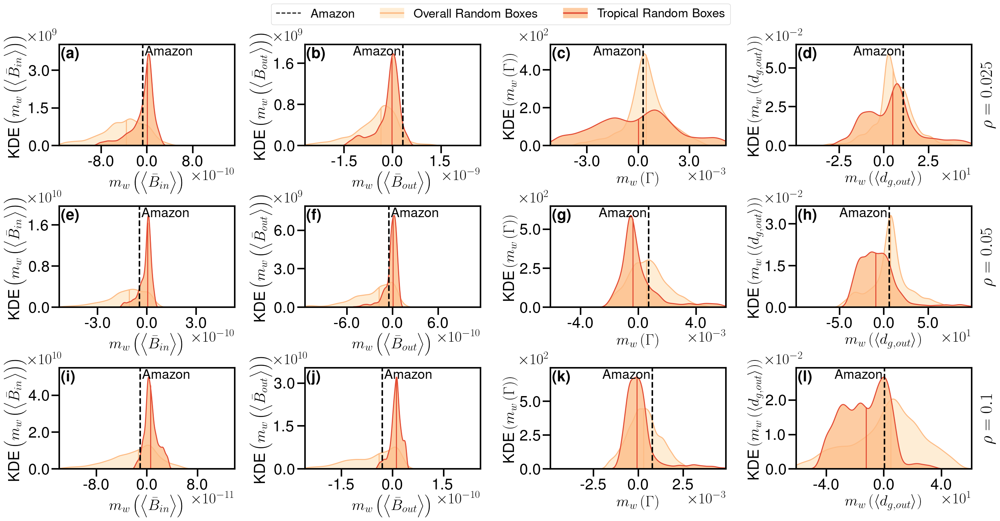

In [8]:
densities = [0.025, 0.05, 0.1]

import matplotlib.mlab as mlab
import matplotlib.patches as mpatches
from matplotlib.path import Path
from matplotlib.collections import PatchCollection
from matplotlib.collections import LineCollection

class MagnitudeFormatter(mpl.ticker.ScalarFormatter):
    def __init__(self, exponent=None):
        super().__init__()
        self._fixed_exponent = exponent

    def _set_order_of_magnitude(self):
        if self._fixed_exponent:
            self.orderOfMagnitude = self._fixed_exponent
        else:
            super()._set_order_of_magnitude()

class Overall(object):
    pass

class Tropical(object):
    pass

class ColorHandler(object):
    def __init__(self, color_fill, alpha_fill, color_bounds, alpha_bounds):
      super().__init__()
      self.color_fill = color_fill
      self.alpha_fill = alpha_fill
      self.color_bounds = color_bounds
      self.alpha_bounds = alpha_bounds

    def legend_artist(self, legend, orig_handle, fontsize, handlebox):
        x0, y0 = handlebox.xdescent, handlebox.ydescent
        width, height = handlebox.width, handlebox.height
        hw = 0.5*width; hh = 0.5*height

        extra_box_height = 0.2*height
        line_height = 0.2*height

        patches = [mpl.patches.Rectangle((0,0-extra_box_height/2),width,height+extra_box_height,color=self.color_fill,alpha=self.alpha_fill,ec=None),
                  mpl.patches.Rectangle((0,0.5*height-line_height/2),width,line_height,color=self.color_bounds,alpha=self.alpha_bounds,ec=None)]


        patch = PatchCollection(patches,match_original=True)

        handlebox.add_artist(patch)
        return patch

random_box_base_dir = data_dir + 'Random Boxes/'
if not os.path.isdir(random_box_base_dir):
  os.mkdir(random_box_base_dir)

vars = ['betweenness_in_', 'betweenness_out_', 'conn_ratio_', 'dist_ratio_']
# var_labels = [r'$\sfrac{\left\langle \bar{B}_{in} \right\rangle}{\left\langle d_g \right\rangle}$',
#           r'$\sfrac{\left\langle \bar{B}_{out} \right\rangle}{\left\langle d_g \right\rangle}$',
#           r'$\Gamma$',
#           r'$\sfrac{\left\langle d_{g,out} \right\rangle}{\left\langle d_g \right\rangle}$']
var_labels = [r'$\left\langle \bar{B}_{in} \right\rangle$',
          r'$\left\langle \bar{B}_{out} \right\rangle$',
          r'$\Gamma$',
          r'$\left\langle d_{g,out} \right\rangle$']


fontsize = 30

plt.rc('text', usetex=True)
plt.rc('xtick',labelsize=fontsize)
plt.rc('ytick',labelsize=fontsize)


fig, axs = plt.subplots(len(densities),len(vars), sharex=False, figsize=(8*len(vars), 5*len(densities)))



p_val = 25
alpha = 0.75
alpha_bounds = 1
color_overall = '#fee8c8'
color_tropical = '#fdbb84'
color_mid_overall = '#fdbb84'
color_mid_tropical = '#e34a33'
ms = 7.5
lw = 2
legendsize = 24

xy_annotate = (0.01, 0.975)

handles = [mpl.lines.Line2D([], [], color='k', ls='--', ms=ms, lw=lw), Overall(), Tropical()]
labels = ['Amazon', 'Overall Random Boxes', 'Tropical Random Boxes']

axs[0,0].legend(handles, labels, ncols=3, loc='lower center', bbox_to_anchor=(0.5,.905),
          bbox_transform=fig.transFigure, prop={'size': legendsize},
          handler_map={Overall: ColorHandler(color_overall, alpha, color_mid_overall, alpha_bounds),
                        Tropical: ColorHandler(color_tropical, alpha, color_mid_tropical, alpha_bounds)})


for i_density in range(len(densities)):
  density = densities[i_density]

  dir_end = '-months={:},offset={:},density={:}/'.format(months,offset,density)

  graph_dir = data_dir + 'G' + dir_end

  random_box_dir = random_box_base_dir + 'Random Boxes' + dir_end
  if not os.path.isdir(random_box_dir):
    os.mkdir(random_box_dir)

  vars = ['betweenness_in_amazon', 'betweenness_out_amazon', 'conn_ratio_amazon', 'dist_ratio_amazon']
  with gzip.open(random_box_dir + 'amazon_properties' + '.data', 'rb') as file:
    for var in vars:
      globals()[var] = pkl.load(file)

  vars = ['betweenness_in_overall', 'betweenness_out_overall', 'conn_ratio_overall', 'dist_ratio_overall',
        'betweenness_in_tropical', 'betweenness_out_tropical', 'conn_ratio_tropical', 'dist_ratio_tropical']
  with gzip.open(random_box_dir + 'collected_data.data', 'rb') as file:
    for var in vars:
      globals()[var] = pkl.load(file)

  with gzip.open(random_box_dir + 'amazon_distances.data', 'rb') as file:
    avg_dist_amazon = pkl.load(file)

  vars = ['avg_dist_overall', 'avg_dist_tropical']
  with gzip.open(random_box_dir + 'collected_distances.data', 'rb') as file:
    for var in vars:
      globals()[var] = pkl.load(file)

  vars = ['betweenness_in_', 'betweenness_out_', 'conn_ratio_', 'dist_ratio_']

  var_label = var_labels[0]
  var = vars[0]
  for i_var in range(len(vars)):
    ax = axs[i_density, i_var]

    if i_var == len(vars)-1:
      ax.annotate(r'$\rho = {:}$'.format(density), xy=(1.05,0.5), xycoords='axes fraction',
                  ha='left', va='center', fontsize=fontsize+4,  rotation='vertical')

    if 'conn' not in var:
      var_amazon = globals()[var + 'amazon']*avg_dist_amazon
      var_overall = globals()[var + 'overall']*avg_dist_overall
      var_tropical = globals()[var + 'tropical']*avg_dist_tropical
    else:
      var_amazon = globals()[var + 'amazon']
      var_overall = globals()[var + 'overall']
      var_tropical = globals()[var + 'tropical']


    slopes_overall = np.zeros((var_overall.shape[1],))
    for i in range(var_overall.shape[1]):
      slopes_overall[i] = np.polyfit(np.arange(len(dates)),var_overall[:,i],1)[0]
    slopes_overall = slopes_overall[(slopes_overall>np.quantile(slopes_overall,0.025)) & (slopes_overall<np.quantile(slopes_overall,0.975))]
    slopes_tropical = np.zeros((var_tropical.shape[1],))
    for i in range(var_tropical.shape[1]):
      slopes_tropical[i] = np.polyfit(np.arange(len(dates)),var_tropical[:,i],1)[0]
    slopes_tropical = slopes_tropical[(slopes_tropical>np.quantile(slopes_tropical,0.025)) & (slopes_tropical<np.quantile(slopes_tropical,0.975))]

    slope_amazon = np.polyfit(np.arange(len(dates)),var_amazon,1)[0][0]

    max_val = max(abs(min(min(slopes_overall),min(slopes_tropical),slope_amazon*1.5)), max(max(slopes_overall), max(slopes_tropical), slope_amazon*1.5))
    min_val = -max_val
    pts = np.linspace(min_val, max_val,1000)

    kernel_overall = sp.stats.gaussian_kde(slopes_overall)
    kernel_tropical = sp.stats.gaussian_kde(slopes_tropical)

    kde_overall = kernel_overall.evaluate(pts)
    # kde_overall /= np.sum(kde_overall)
    kde_tropical = kernel_tropical.evaluate(pts)
    # kde_tropical /= np.sum(kde_tropical)


    ax.fill_between(pts,0,kde_overall,color=color_overall,alpha=alpha)
    med = np.median(slopes_overall)
    ax.plot([med]*2,[0,kde_overall[np.argmin(np.abs(pts - med))]],color=color_mid_overall,lw=2,alpha=alpha_bounds)
    ax.plot(pts,kde_overall,color=color_mid_overall,lw=2,alpha=alpha_bounds)
    ax.fill_between(pts,0,kde_tropical,color=color_tropical,alpha=alpha)
    med = np.median(slopes_tropical)
    ax.plot([med]*2,[0,kde_tropical[np.argmin(np.abs(pts - med))]],color=color_mid_tropical,lw=2,alpha=alpha_bounds)
    ax.plot(pts,kde_tropical,color=color_mid_tropical,lw=2,alpha=alpha_bounds)

    max_value = 1.1*max(np.max(kde_overall), np.max(kde_tropical))
    ax.set_xlim(pts[0],pts[-1])
    ax.set_ylim(0,max_value)

    # max_intercept = max(kernel_overall.evaluate(slope_amazon)[0], kernel_tropical.evaluate(slope_amazon)[0])
    i_pts_closest = np.argmin(np.abs(pts - slope_amazon))
    max_intercept = max(kde_overall[i_pts_closest],kde_tropical[i_pts_closest])
    # if max_intercept < 0.05*max_value:
    max_intercept = max_value

    ax.plot([slope_amazon]*2,[0,max_intercept],'k--',lw=3)

    if slope_amazon >= 0:
      ax.annotate('Amazon', xy=(slope_amazon-0.01*(pts[-1]-pts[0]),0.99*max_value), xycoords='data', fontsize=fontsize-4, ha='right',va='top')
    else:
      ax.annotate('Amazon', xy=(slope_amazon+0.01*(pts[-1]-pts[0]),0.99*max_value), xycoords='data', fontsize=fontsize-4, ha='left', va='top')

    ax.annotate(r'\textbf{('+chr(97+i_var + i_density*len(vars))+')}', xy=xy_annotate, xycoords='axes fraction', ha='left', va='top', fontsize=fontsize)


    ax.yaxis.set_major_locator(plt.MaxNLocator(3))

    yticks = ax.get_yticks()[:-1]

    multiplier = int('{:e}'.format(yticks[-1]).split('e')[1])
    fmt = MagnitudeFormatter(multiplier)
    ax.yaxis.set_major_formatter(fmt)
    # plt.ticklabel_format(style='sci', axis='y')
    # print(ax.yaxis.get_major_formatter().__dict__)
    ax.yaxis.offsetText.set_visible(False)

    # print(yticks)
    ax.set_yticks(yticks)
    ax.set_yticklabels(['{:.1f}'.format(ytick/10**multiplier) for ytick in yticks])

    if multiplier != 0:
      ax.annotate(r'$\times 10^{'+str(multiplier)+r'}$', xy=(-0.175,1.02), xycoords='axes fraction', ha='left', va='bottom', fontsize=fontsize)


    ax.xaxis.set_major_locator(plt.MaxNLocator(4))

    xticks = ax.get_xticks()[1:-1]

    multiplier = int('{:e}'.format(max(np.abs(xticks))).split('e')[1])
    fmt = MagnitudeFormatter(multiplier)
    ax.xaxis.set_major_formatter(fmt)
    # plt.ticklabel_format(style='sci', axis='y')
    # print(ax.xaxis.get_major_formatter().__dict__)
    ax.xaxis.offsetText.set_visible(False)

    # print(xticks)
    ax.set_xticks(xticks)
    ax.set_xticklabels(['{:.1f}'.format(xtick/10**multiplier) for xtick in xticks])

    if multiplier != 0:
      ax.annotate(r'$\times 10^{'+str(multiplier)+r'}$', xy=(1.01,-.22), xycoords='axes fraction', ha='right', va='top', fontsize=fontsize)

    string = var_label
    ax.set_xlabel(r'$m_w\left('+string.replace('$','')+r'\right)$', fontsize=fontsize)
    ax.set_ylabel(r'$\text{KDE}\left(m_w\left('+string.replace('$','')+r'\right)\right)$', fontsize=fontsize)

    ax.tick_params(length=15,width=3)
    plt.setp(ax.spines.values(), linewidth=3, zorder=10)


    if i_var < len(vars)-1:
      var_label = var_labels[var_labels.index(var_label)+1]
      var = vars[vars.index(var)+1]


plt.subplots_adjust(hspace=0.6,wspace=0.4)

fig.align_labels()

title = 'Landscape No Dist Metric Slope Distributions (Vary density)'
plt.savefig(fig_dir+title+'.jpg',bbox_inches='tight',pad_inches=0.2, dpi=300)
plt.savefig(fig_dir+title+'.pdf',bbox_inches='tight',pad_inches=0.2, dpi=300)

plt.show()

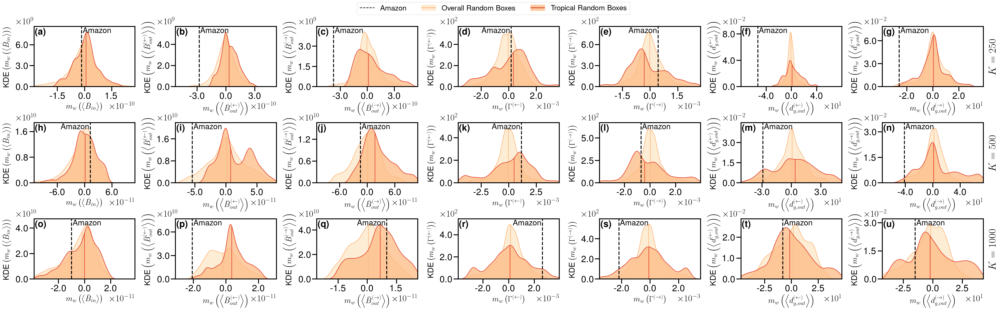

In [9]:
ks = [250, 500, 1000]

import matplotlib.mlab as mlab
import matplotlib.patches as mpatches
from matplotlib.path import Path
from matplotlib.collections import PatchCollection
from matplotlib.collections import LineCollection

class MagnitudeFormatter(mpl.ticker.ScalarFormatter):
    def __init__(self, exponent=None):
        super().__init__()
        self._fixed_exponent = exponent

    def _set_order_of_magnitude(self):
        if self._fixed_exponent:
            self.orderOfMagnitude = self._fixed_exponent
        else:
            super()._set_order_of_magnitude()

class Overall(object):
    pass

class Tropical(object):
    pass

class ColorHandler(object):
    def __init__(self, color_fill, alpha_fill, color_bounds, alpha_bounds):
      super().__init__()
      self.color_fill = color_fill
      self.alpha_fill = alpha_fill
      self.color_bounds = color_bounds
      self.alpha_bounds = alpha_bounds

    def legend_artist(self, legend, orig_handle, fontsize, handlebox):
        x0, y0 = handlebox.xdescent, handlebox.ydescent
        width, height = handlebox.width, handlebox.height
        hw = 0.5*width; hh = 0.5*height

        extra_box_height = 0.2*height
        line_height = 0.2*height

        patches = [mpl.patches.Rectangle((0,0-extra_box_height/2),width,height+extra_box_height,color=self.color_fill,alpha=self.alpha_fill,ec=None),
                  mpl.patches.Rectangle((0,0.5*height-line_height/2),width,line_height,color=self.color_bounds,alpha=self.alpha_bounds,ec=None)]


        patch = PatchCollection(patches,match_original=True)

        handlebox.add_artist(patch)
        return patch

random_box_base_dir = data_dir + 'Random Boxes/'
if not os.path.isdir(random_box_base_dir):
  os.mkdir(random_box_base_dir)

vars = ['betweenness_in_', 'betweenness_out_', 'conn_ratio_', 'dist_ratio_']
# var_labels = [r'$\sfrac{\left\langle \bar{B}_{in} \right\rangle}{\left\langle d_g \right\rangle}$',
#           r'$\sfrac{\left\langle \bar{B}_{out} \right\rangle}{\left\langle d_g \right\rangle}$',
#           r'$\Gamma$',
#           r'$\sfrac{\left\langle d_{g,out} \right\rangle}{\left\langle d_g \right\rangle}$']
var_labels = [r'$\left\langle \bar{B}_{in} \right\rangle$',
          r'$\left\langle \bar{B}_{out} \right\rangle$',
          r'$\Gamma$',
          r'$\left\langle d_{g,out} \right\rangle$']

k = ks[0]
dir_end = '-months={:},offset={:},k={:}/'.format(months,offset,k)
random_box_dir = random_box_base_dir + 'Random Boxes' + dir_end


vars = ['betweenness_in_', 'betweenness_out_', 'conn_ratio_', 'dist_ratio_']
with gzip.open(random_box_dir + 'amazon_properties' + '.data', 'rb') as file:
  for var in vars:
    globals()[var+'amazon'] = pkl.load(file)

num_vars = 0
for var in vars:
  try:
    _ = globals()[var+'amazon']['in']
    num_vars += 2
  except:
    num_vars += 1

fontsize = 30

plt.rc('text', usetex=True)
plt.rc('xtick',labelsize=fontsize)
plt.rc('ytick',labelsize=fontsize)

fig, axs = plt.subplots(len(ks),num_vars, sharex=False, figsize=(8*num_vars,5*len(ks)))



p_val = 25
alpha = 0.75
alpha_bounds = 1
color_overall = '#fee8c8'
color_tropical = '#fdbb84'
color_mid_overall = '#fdbb84'
color_mid_tropical = '#e34a33'
ms = 7.5
lw = 2
legendsize = 24

xy_annotate = (0.01, 0.975)

handles = [mpl.lines.Line2D([], [], color='k', ls='--', ms=ms, lw=lw), Overall(), Tropical()]
labels = ['Amazon', 'Overall Random Boxes', 'Tropical Random Boxes']

axs[0,0].legend(handles, labels, ncols=3, loc='lower center', bbox_to_anchor=(0.5,.905),
          bbox_transform=fig.transFigure, prop={'size': legendsize},
          handler_map={Overall: ColorHandler(color_overall, alpha, color_mid_overall, alpha_bounds),
                        Tropical: ColorHandler(color_tropical, alpha, color_mid_tropical, alpha_bounds)})


for i_k in range(len(ks)):
  k = ks[i_k]

  dir_end = '-months={:},offset={:},k={:}/'.format(months,offset,k)

  graph_dir = data_dir + 'G' + dir_end

  random_box_dir = random_box_base_dir + 'Random Boxes' + dir_end
  if not os.path.isdir(random_box_dir):
    os.mkdir(random_box_dir)

  vars = ['betweenness_in_amazon', 'betweenness_out_amazon', 'conn_ratio_amazon', 'dist_ratio_amazon']
  with gzip.open(random_box_dir + 'amazon_properties' + '.data', 'rb') as file:
    for var in vars:
      globals()[var] = pkl.load(file)

  vars = ['betweenness_in_overall', 'betweenness_out_overall', 'conn_ratio_overall', 'dist_ratio_overall',
        'betweenness_in_tropical', 'betweenness_out_tropical', 'conn_ratio_tropical', 'dist_ratio_tropical']
  with gzip.open(random_box_dir + 'collected_data.data', 'rb') as file:
    for var in vars:
      globals()[var] = pkl.load(file)

  with gzip.open(random_box_dir + 'amazon_distances.data', 'rb') as file:
    avg_dist_amazon = pkl.load(file)

  vars = ['avg_dist_overall', 'avg_dist_tropical']
  with gzip.open(random_box_dir + 'collected_distances.data', 'rb') as file:
    for var in vars:
      globals()[var] = pkl.load(file)

  vars = ['betweenness_in_', 'betweenness_out_', 'conn_ratio_', 'dist_ratio_']

  var_label = var_labels[0]
  var = vars[0]
  i_var = 0
  while i_var < num_vars:
    ax = axs[i_k,i_var]

    if i_var == num_vars-1:
      ax.annotate(r'$K = {:}$'.format(k), xy=(1.05,.5), xycoords='axes fraction',
                  ha='left', va='center', fontsize=fontsize+4, rotation='vertical')

    var_amazon = globals()[var + 'amazon']
    var_overall = globals()[var + 'overall']
    var_tropical = globals()[var + 'tropical']

    if type(var_amazon) == dict:
      if 'conn' not in var:
        var_amazon = globals()[var + 'amazon']['in']*avg_dist_amazon
        var_overall = globals()[var + 'overall']['in']*avg_dist_overall
        var_tropical = globals()[var + 'tropical']['in']*avg_dist_tropical
      else:
        var_amazon = globals()[var + 'amazon']['in']
        var_overall = globals()[var + 'overall']['in']
        var_tropical = globals()[var + 'tropical']['in']

      slopes_overall = np.zeros((var_overall.shape[1],))
      for i in range(var_overall.shape[1]):
        slopes_overall[i] = np.polyfit(np.arange(len(dates)),var_overall[:,i],1)[0]
      slopes_overall = slopes_overall[(slopes_overall>np.quantile(slopes_overall,0.025)) & (slopes_overall<np.quantile(slopes_overall,0.975))]
      slopes_tropical = np.zeros((var_tropical.shape[1],))
      for i in range(var_tropical.shape[1]):
        slopes_tropical[i] = np.polyfit(np.arange(len(dates)),var_tropical[:,i],1)[0]
      slopes_tropical = slopes_tropical[(slopes_tropical>np.quantile(slopes_tropical,0.025)) & (slopes_tropical<np.quantile(slopes_tropical,0.975))]

      slope_amazon = np.polyfit(np.arange(len(dates)),var_amazon,1)[0][0]

      max_val = max(abs(min(min(slopes_overall),min(slopes_tropical),slope_amazon*1.5)), max(max(slopes_overall), max(slopes_tropical), slope_amazon*1.5))
      min_val = -max_val
      pts = np.linspace(min_val, max_val,1000)

      kernel_overall = sp.stats.gaussian_kde(slopes_overall)
      kernel_tropical = sp.stats.gaussian_kde(slopes_tropical)

      kde_overall = kernel_overall.evaluate(pts)
      # kde_overall /= np.sum(kde_overall)
      kde_tropical = kernel_tropical.evaluate(pts)
      # kde_tropical /= np.sum(kde_tropical)


      ax.fill_between(pts,0,kde_overall,color=color_overall,alpha=alpha)
      med = np.median(slopes_overall)
      ax.plot([med]*2,[0,kde_overall[np.argmin(np.abs(pts - med))]],color=color_mid_overall,lw=2,alpha=alpha_bounds)
      ax.plot(pts,kde_overall,color=color_mid_overall,lw=2,alpha=alpha_bounds)
      ax.fill_between(pts,0,kde_tropical,color=color_tropical,alpha=alpha)
      med = np.median(slopes_tropical)
      ax.plot([med]*2,[0,kde_tropical[np.argmin(np.abs(pts - med))]],color=color_mid_tropical,lw=2,alpha=alpha_bounds)
      ax.plot(pts,kde_tropical,color=color_mid_tropical,lw=2,alpha=alpha_bounds)

      max_value = 1.1*max(np.max(kde_overall), np.max(kde_tropical))
      ax.set_xlim(pts[0],pts[-1])
      ax.set_ylim(0,max_value)

      # max_intercept = max(kernel_overall.evaluate(slope_amazon)[0], kernel_tropical.evaluate(slope_amazon)[0])
      i_pts_closest = np.argmin(np.abs(pts - slope_amazon))
      max_intercept = max(kde_overall[i_pts_closest],kde_tropical[i_pts_closest])
      # if max_intercept < 0.05*max_value:
      max_intercept = max_value

      ax.plot([slope_amazon]*2,[0,max_intercept],'k--',lw=3)

      if slope_amazon >= 0:
        ax.annotate('Amazon', xy=(slope_amazon-0.01*(pts[-1]-pts[0]),0.99*max_value), xycoords='data', fontsize=fontsize-4, ha='right',va='top')
      else:
        ax.annotate('Amazon', xy=(slope_amazon+0.01*(pts[-1]-pts[0]),0.99*max_value), xycoords='data', fontsize=fontsize-4, ha='left', va='top')

      ax.annotate(r'\textbf{('+chr(97+i_var + i_k*num_vars)+')}', xy=xy_annotate, xycoords='axes fraction', ha='left', va='top', fontsize=fontsize)


      ax.yaxis.set_major_locator(plt.MaxNLocator(3))

      yticks = ax.get_yticks()[:-1]

      multiplier = int('{:e}'.format(yticks[-1]).split('e')[1])
      fmt = MagnitudeFormatter(multiplier)
      ax.yaxis.set_major_formatter(fmt)
      # plt.ticklabel_format(style='sci', axis='y')
      # print(ax.yaxis.get_major_formatter().__dict__)
      ax.yaxis.offsetText.set_visible(False)

      # print(yticks)
      ax.set_yticks(yticks)
      ax.set_yticklabels(['{:.1f}'.format(ytick/10**multiplier) for ytick in yticks])

      if multiplier != 0:
        ax.annotate(r'$\times 10^{'+str(multiplier)+r'}$', xy=(-0.175,1.02), xycoords='axes fraction', ha='left', va='bottom', fontsize=fontsize)


      ax.xaxis.set_major_locator(plt.MaxNLocator(4))

      xticks = ax.get_xticks()[1:-1]

      multiplier = int('{:e}'.format(max(np.abs(xticks))).split('e')[1])
      fmt = MagnitudeFormatter(multiplier)
      ax.xaxis.set_major_formatter(fmt)
      # plt.ticklabel_format(style='sci', axis='y')
      # print(ax.xaxis.get_major_formatter().__dict__)
      ax.xaxis.offsetText.set_visible(False)

      # print(xticks)
      ax.set_xticks(xticks)
      ax.set_xticklabels(['{:.1f}'.format(xtick/10**multiplier) for xtick in xticks])

      if multiplier != 0:
        ax.annotate(r'$\times 10^{'+str(multiplier)+r'}$', xy=(1.01,-.25), xycoords='axes fraction', ha='right', va='top', fontsize=fontsize)

      string = var_label
      if var_label == r'$\Gamma$':
        string = r'$\Gamma^{(\leftarrow)}$'
      else:
        string = var_label.replace('_','^{(\leftarrow)}_',1)
      ax.set_xlabel(r'$m_w\left('+string.replace('$','')+r'\right)$', fontsize=fontsize-4)
      ax.set_ylabel(r'$\text{KDE}\left(m_w\left('+string.replace('$','')+r'\right)\right)$', fontsize=fontsize-4, va='center', labelpad=30)

      ax.tick_params(length=15,width=3)
      plt.setp(ax.spines.values(), linewidth=3, zorder=10)




      i_var += 1
      ax = axs[i_k,i_var]

      if i_var == num_vars-1:
        ax.annotate(r'$K = {:}$'.format(k), xy=(1.05,.5), xycoords='axes fraction',
                    ha='left', va='center', fontsize=fontsize+4, rotation='vertical')

      if 'conn' not in var:
        var_amazon = globals()[var + 'amazon']['out']*avg_dist_amazon
        var_overall = globals()[var + 'overall']['out']*avg_dist_overall
        var_tropical = globals()[var + 'tropical']['out']*avg_dist_tropical
      else:
        var_amazon = globals()[var + 'amazon']['out']
        var_overall = globals()[var + 'overall']['out']
        var_tropical = globals()[var + 'tropical']['out']

      slopes_overall = np.zeros((var_overall.shape[1],))
      for i in range(var_overall.shape[1]):
        slopes_overall[i] = np.polyfit(np.arange(len(dates)),var_overall[:,i],1)[0]
      slopes_overall = slopes_overall[(slopes_overall>np.quantile(slopes_overall,0.025)) & (slopes_overall<np.quantile(slopes_overall,0.975))]
      slopes_tropical = np.zeros((var_tropical.shape[1],))
      for i in range(var_tropical.shape[1]):
        slopes_tropical[i] = np.polyfit(np.arange(len(dates)),var_tropical[:,i],1)[0]
      slopes_tropical = slopes_tropical[(slopes_tropical>np.quantile(slopes_tropical,0.025)) & (slopes_tropical<np.quantile(slopes_tropical,0.975))]

      slope_amazon = np.polyfit(np.arange(len(dates)),var_amazon,1)[0][0]

      max_val = max(abs(min(min(slopes_overall),min(slopes_tropical),slope_amazon*1.5)), max(max(slopes_overall), max(slopes_tropical), slope_amazon*1.5))
      min_val = -max_val
      pts = np.linspace(min_val, max_val,1000)

      kernel_overall = sp.stats.gaussian_kde(slopes_overall)
      kernel_tropical = sp.stats.gaussian_kde(slopes_tropical)

      kde_overall = kernel_overall.evaluate(pts)
      # kde_overall /= np.sum(kde_overall)
      kde_tropical = kernel_tropical.evaluate(pts)
      # kde_tropical /= np.sum(kde_tropical)


      ax.fill_between(pts,0,kde_overall,color=color_overall,alpha=alpha)
      med = np.median(slopes_overall)
      ax.plot([med]*2,[0,kde_overall[np.argmin(np.abs(pts - med))]],color=color_mid_overall,lw=2,alpha=alpha_bounds)
      ax.plot(pts,kde_overall,color=color_mid_overall,lw=2,alpha=alpha_bounds)
      ax.fill_between(pts,0,kde_tropical,color=color_tropical,alpha=alpha)
      med = np.median(slopes_tropical)
      ax.plot([med]*2,[0,kde_tropical[np.argmin(np.abs(pts - med))]],color=color_mid_tropical,lw=2,alpha=alpha_bounds)
      ax.plot(pts,kde_tropical,color=color_mid_tropical,lw=2,alpha=alpha_bounds)

      max_value = 1.1*max(np.max(kde_overall), np.max(kde_tropical))
      ax.set_xlim(pts[0],pts[-1])
      ax.set_ylim(0,max_value)

      # max_intercept = max(kernel_overall.evaluate(slope_amazon)[0], kernel_tropical.evaluate(slope_amazon)[0])
      i_pts_closest = np.argmin(np.abs(pts - slope_amazon))
      max_intercept = max(kde_overall[i_pts_closest],kde_tropical[i_pts_closest])
      # if max_intercept < 0.05*max_value:
      max_intercept = max_value

      ax.plot([slope_amazon]*2,[0,max_intercept],'k--',lw=3)

      if slope_amazon >= 0:
        ax.annotate('Amazon', xy=(slope_amazon-0.01*(pts[-1]-pts[0]),0.99*max_value), xycoords='data', fontsize=fontsize-4, ha='right',va='top')
      else:
        ax.annotate('Amazon', xy=(slope_amazon+0.01*(pts[-1]-pts[0]),0.99*max_value), xycoords='data', fontsize=fontsize-4, ha='left', va='top')

      ax.annotate(r'\textbf{('+chr(97+i_var + i_k*num_vars)+')}', xy=xy_annotate, xycoords='axes fraction', ha='left', va='top', fontsize=fontsize)


      ax.yaxis.set_major_locator(plt.MaxNLocator(3))

      yticks = ax.get_yticks()[:-1]

      multiplier = int('{:e}'.format(yticks[-1]).split('e')[1])
      fmt = MagnitudeFormatter(multiplier)
      ax.yaxis.set_major_formatter(fmt)
      # plt.ticklabel_format(style='sci', axis='y')
      # print(ax.yaxis.get_major_formatter().__dict__)
      ax.yaxis.offsetText.set_visible(False)

      # print(yticks)
      ax.set_yticks(yticks)
      ax.set_yticklabels(['{:.1f}'.format(ytick/10**multiplier) for ytick in yticks])

      if multiplier != 0:
        ax.annotate(r'$\times 10^{'+str(multiplier)+r'}$', xy=(-0.175,1.02), xycoords='axes fraction', ha='left', va='bottom', fontsize=fontsize)


      ax.xaxis.set_major_locator(plt.MaxNLocator(4))

      xticks = ax.get_xticks()[1:-1]

      multiplier = int('{:e}'.format(max(np.abs(xticks))).split('e')[1])
      fmt = MagnitudeFormatter(multiplier)
      ax.xaxis.set_major_formatter(fmt)
      # plt.ticklabel_format(style='sci', axis='y')
      # print(ax.xaxis.get_major_formatter().__dict__)
      ax.xaxis.offsetText.set_visible(False)

      # print(xticks)
      ax.set_xticks(xticks)
      ax.set_xticklabels(['{:.1f}'.format(xtick/10**multiplier) for xtick in xticks])

      if multiplier != 0:
        ax.annotate(r'$\times 10^{'+str(multiplier)+r'}$', xy=(1.01,-.25), xycoords='axes fraction', ha='right', va='top', fontsize=fontsize)

      string = var_label
      if var_label == r'$\Gamma$':
        string = r'$\Gamma^{(\rightarrow)}$'
      else:
        string = var_label.replace('_',r'^{(\rightarrow)}_',1)
      ax.set_xlabel(r'$m_w\left('+string.replace('$','')+r'\right)$', fontsize=fontsize-4)
      ax.set_ylabel(r'$\text{KDE}\left(m_w\left('+string.replace('$','')+r'\right)\right)$', fontsize=fontsize-4, va='center', labelpad=30)

      ax.tick_params(length=15,width=3)
      plt.setp(ax.spines.values(), linewidth=3, zorder=10)


    else:
      if 'conn' not in var:
        var_amazon = var_amazon*avg_dist_amazon
        var_overall = var_overall*avg_dist_overall
        var_tropical = var_tropical*avg_dist_tropical

      slopes_overall = np.zeros((var_overall.shape[1],))
      for i in range(var_overall.shape[1]):
        slopes_overall[i] = np.polyfit(np.arange(len(dates)),var_overall[:,i],1)[0]
      slopes_overall = slopes_overall[(slopes_overall>np.quantile(slopes_overall,0.025)) & (slopes_overall<np.quantile(slopes_overall,0.975))]
      slopes_tropical = np.zeros((var_tropical.shape[1],))
      for i in range(var_tropical.shape[1]):
        slopes_tropical[i] = np.polyfit(np.arange(len(dates)),var_tropical[:,i],1)[0]
      slopes_tropical = slopes_tropical[(slopes_tropical>np.quantile(slopes_tropical,0.025)) & (slopes_tropical<np.quantile(slopes_tropical,0.975))]

      slope_amazon = np.polyfit(np.arange(len(dates)),var_amazon,1)[0][0]

      max_val = max(abs(min(min(slopes_overall),min(slopes_tropical),slope_amazon*1.5)), max(max(slopes_overall), max(slopes_tropical), slope_amazon*1.5))
      min_val = -max_val
      pts = np.linspace(min_val, max_val,1000)

      kernel_overall = sp.stats.gaussian_kde(slopes_overall)
      kernel_tropical = sp.stats.gaussian_kde(slopes_tropical)

      kde_overall = kernel_overall.evaluate(pts)
      # kde_overall /= np.sum(kde_overall)
      kde_tropical = kernel_tropical.evaluate(pts)
      # kde_tropical /= np.sum(kde_tropical)


      ax.fill_between(pts,0,kde_overall,color=color_overall,alpha=alpha)
      med = np.median(slopes_overall)
      ax.plot([med]*2,[0,kde_overall[np.argmin(np.abs(pts - med))]],color=color_mid_overall,lw=2,alpha=alpha_bounds)
      ax.plot(pts,kde_overall,color=color_mid_overall,lw=2,alpha=alpha_bounds)
      ax.fill_between(pts,0,kde_tropical,color=color_tropical,alpha=alpha)
      med = np.median(slopes_tropical)
      ax.plot([med]*2,[0,kde_tropical[np.argmin(np.abs(pts - med))]],color=color_mid_tropical,lw=2,alpha=alpha_bounds)
      ax.plot(pts,kde_tropical,color=color_mid_tropical,lw=2,alpha=alpha_bounds)

      max_value = 1.1*max(np.max(kde_overall), np.max(kde_tropical))
      ax.set_xlim(pts[0],pts[-1])
      ax.set_ylim(0,max_value)

      # max_intercept = max(kernel_overall.evaluate(slope_amazon)[0], kernel_tropical.evaluate(slope_amazon)[0])
      i_pts_closest = np.argmin(np.abs(pts - slope_amazon))
      max_intercept = max(kde_overall[i_pts_closest],kde_tropical[i_pts_closest])
      # if max_intercept < 0.05*max_value:
      max_intercept = max_value

      ax.plot([slope_amazon]*2,[0,max_intercept],'k--',lw=3)

      if slope_amazon >= 0:
        ax.annotate('Amazon', xy=(slope_amazon-0.01*(pts[-1]-pts[0]),0.99*max_value), xycoords='data', fontsize=fontsize-4, ha='right',va='top')
      else:
        ax.annotate('Amazon', xy=(slope_amazon+0.01*(pts[-1]-pts[0]),0.99*max_value), xycoords='data', fontsize=fontsize-4, ha='left', va='top')

      ax.annotate(r'\textbf{('+chr(97+i_var + i_k*num_vars)+')}', xy=xy_annotate, xycoords='axes fraction', ha='left', va='top', fontsize=fontsize)


      ax.yaxis.set_major_locator(plt.MaxNLocator(3))

      yticks = ax.get_yticks()[:-1]

      multiplier = int('{:e}'.format(yticks[-1]).split('e')[1])
      fmt = MagnitudeFormatter(multiplier)
      ax.yaxis.set_major_formatter(fmt)
      # plt.ticklabel_format(style='sci', axis='y')
      # print(ax.yaxis.get_major_formatter().__dict__)
      ax.yaxis.offsetText.set_visible(False)

      # print(yticks)
      ax.set_yticks(yticks)
      ax.set_yticklabels(['{:.1f}'.format(ytick/10**multiplier) for ytick in yticks])

      if multiplier != 0:
        ax.annotate(r'$\times 10^{'+str(multiplier)+r'}$', xy=(-0.175,1.02), xycoords='axes fraction', ha='left', va='bottom', fontsize=fontsize)


      ax.xaxis.set_major_locator(plt.MaxNLocator(4))

      xticks = ax.get_xticks()[1:-1]

      multiplier = int('{:e}'.format(max(np.abs(xticks))).split('e')[1])
      fmt = MagnitudeFormatter(multiplier)
      ax.xaxis.set_major_formatter(fmt)
      # plt.ticklabel_format(style='sci', axis='y')
      # print(ax.xaxis.get_major_formatter().__dict__)
      ax.xaxis.offsetText.set_visible(False)

      # print(xticks)
      ax.set_xticks(xticks)
      ax.set_xticklabels(['{:.1f}'.format(xtick/10**multiplier) for xtick in xticks])

      if multiplier != 0:
        ax.annotate(r'$\times 10^{'+str(multiplier)+r'}$', xy=(1.01,-.25), xycoords='axes fraction', ha='right', va='top', fontsize=fontsize)

      string = var_label
      ax.set_xlabel(r'$m_w\left('+string.replace('$','')+r'\right)$', fontsize=fontsize-4)
      ax.set_ylabel(r'$\text{KDE}\left(m_w\left('+string.replace('$','')+r'\right)\right)$', fontsize=fontsize-4, va='center', labelpad=30)

      ax.tick_params(length=15,width=3)
      plt.setp(ax.spines.values(), linewidth=3, zorder=10)


    if i_var < num_vars-1:
      var_label = var_labels[var_labels.index(var_label)+1]
      var = vars[vars.index(var)+1]
    i_var += 1

fig.align_labels()

plt.subplots_adjust(hspace=0.6,wspace=0.4)


title = 'Landscape No Dist Metric Slope Distributions (Vary k)'
plt.savefig(fig_dir+title+'.jpg',bbox_inches='tight',pad_inches=0.2, dpi=300)
plt.savefig(fig_dir+title+'.pdf',bbox_inches='tight',pad_inches=0.2, dpi=300)

plt.show()

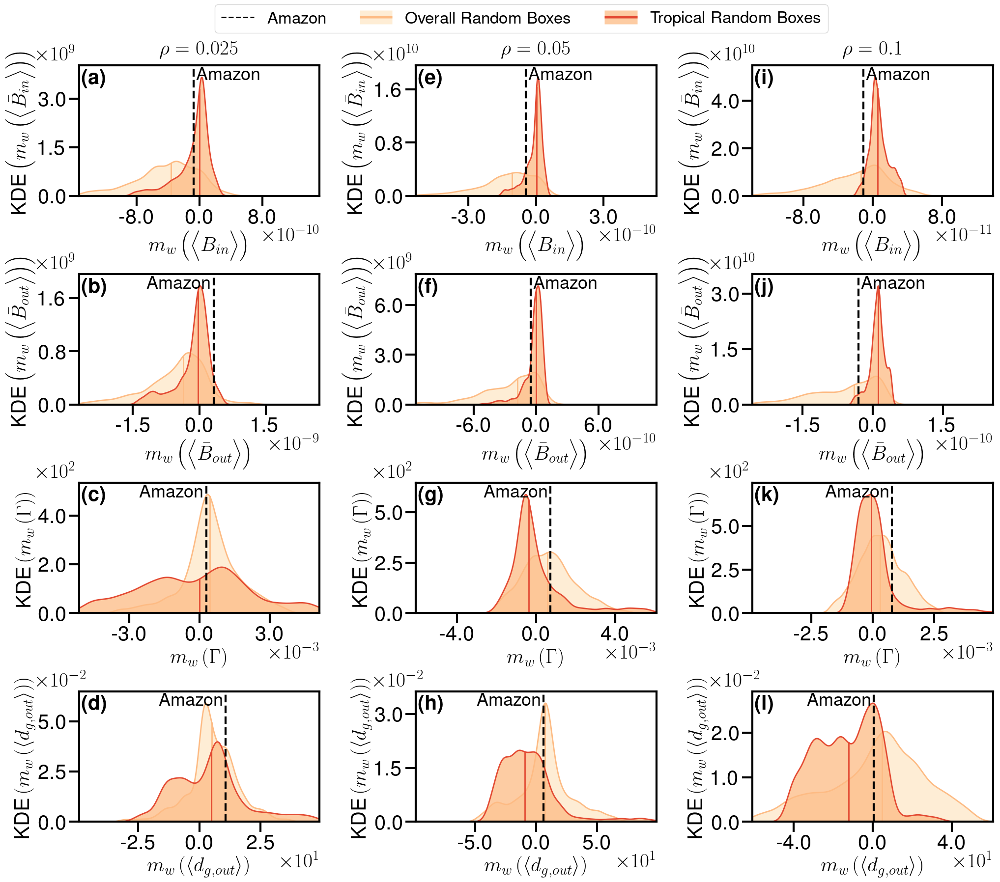

In [10]:
densities = [0.025, 0.05, 0.1]

import matplotlib.mlab as mlab
import matplotlib.patches as mpatches
from matplotlib.path import Path
from matplotlib.collections import PatchCollection
from matplotlib.collections import LineCollection

class MagnitudeFormatter(mpl.ticker.ScalarFormatter):
    def __init__(self, exponent=None):
        super().__init__()
        self._fixed_exponent = exponent

    def _set_order_of_magnitude(self):
        if self._fixed_exponent:
            self.orderOfMagnitude = self._fixed_exponent
        else:
            super()._set_order_of_magnitude()

class Overall(object):
    pass

class Tropical(object):
    pass

class ColorHandler(object):
    def __init__(self, color_fill, alpha_fill, color_bounds, alpha_bounds):
      super().__init__()
      self.color_fill = color_fill
      self.alpha_fill = alpha_fill
      self.color_bounds = color_bounds
      self.alpha_bounds = alpha_bounds

    def legend_artist(self, legend, orig_handle, fontsize, handlebox):
        x0, y0 = handlebox.xdescent, handlebox.ydescent
        width, height = handlebox.width, handlebox.height
        hw = 0.5*width; hh = 0.5*height

        extra_box_height = 0.2*height
        line_height = 0.2*height

        patches = [mpl.patches.Rectangle((0,0-extra_box_height/2),width,height+extra_box_height,color=self.color_fill,alpha=self.alpha_fill,ec=None),
                  mpl.patches.Rectangle((0,0.5*height-line_height/2),width,line_height,color=self.color_bounds,alpha=self.alpha_bounds,ec=None)]


        patch = PatchCollection(patches,match_original=True)

        handlebox.add_artist(patch)
        return patch

random_box_base_dir = data_dir + 'Random Boxes/'
if not os.path.isdir(random_box_base_dir):
  os.mkdir(random_box_base_dir)

vars = ['betweenness_in_', 'betweenness_out_', 'conn_ratio_', 'dist_ratio_']
# var_labels = [r'$\sfrac{\left\langle \bar{B}_{in} \right\rangle}{\left\langle d_g \right\rangle}$',
#           r'$\sfrac{\left\langle \bar{B}_{out} \right\rangle}{\left\langle d_g \right\rangle}$',
#           r'$\Gamma$',
#           r'$\sfrac{\left\langle d_{g,out} \right\rangle}{\left\langle d_g \right\rangle}$']
var_labels = [r'$\left\langle \bar{B}_{in} \right\rangle$',
          r'$\left\langle \bar{B}_{out} \right\rangle$',
          r'$\Gamma$',
          r'$\left\langle d_{g,out} \right\rangle$']


fontsize = 30

plt.rc('text', usetex=True)
plt.rc('xtick',labelsize=fontsize)
plt.rc('ytick',labelsize=fontsize)


fig, axs = plt.subplots(len(vars),len(densities), sharex=False, figsize=(8*len(densities),5*len(vars)))



p_val = 25
alpha = 0.75
alpha_bounds = 1
color_overall = '#fee8c8'
color_tropical = '#fdbb84'
color_mid_overall = '#fdbb84'
color_mid_tropical = '#e34a33'
ms = 7.5
lw = 2
legendsize = 24

xy_annotate = (0.01, 0.975)

handles = [mpl.lines.Line2D([], [], color='k', ls='--', ms=ms, lw=lw), Overall(), Tropical()]
labels = ['Amazon', 'Overall Random Boxes', 'Tropical Random Boxes']

axs[0,0].legend(handles, labels, ncols=3, loc='lower center', bbox_to_anchor=(0.5,.905),
          bbox_transform=fig.transFigure, prop={'size': legendsize},
          handler_map={Overall: ColorHandler(color_overall, alpha, color_mid_overall, alpha_bounds),
                        Tropical: ColorHandler(color_tropical, alpha, color_mid_tropical, alpha_bounds)})


for i_density in range(len(densities)):
  density = densities[i_density]

  dir_end = '-months={:},offset={:},density={:}/'.format(months,offset,density)

  graph_dir = data_dir + 'G' + dir_end

  random_box_dir = random_box_base_dir + 'Random Boxes' + dir_end
  if not os.path.isdir(random_box_dir):
    os.mkdir(random_box_dir)

  vars = ['betweenness_in_amazon', 'betweenness_out_amazon', 'conn_ratio_amazon', 'dist_ratio_amazon']
  with gzip.open(random_box_dir + 'amazon_properties' + '.data', 'rb') as file:
    for var in vars:
      globals()[var] = pkl.load(file)

  vars = ['betweenness_in_overall', 'betweenness_out_overall', 'conn_ratio_overall', 'dist_ratio_overall',
        'betweenness_in_tropical', 'betweenness_out_tropical', 'conn_ratio_tropical', 'dist_ratio_tropical']
  with gzip.open(random_box_dir + 'collected_data.data', 'rb') as file:
    for var in vars:
      globals()[var] = pkl.load(file)

  with gzip.open(random_box_dir + 'amazon_distances.data', 'rb') as file:
    avg_dist_amazon = pkl.load(file)

  vars = ['avg_dist_overall', 'avg_dist_tropical']
  with gzip.open(random_box_dir + 'collected_distances.data', 'rb') as file:
    for var in vars:
      globals()[var] = pkl.load(file)

  vars = ['betweenness_in_', 'betweenness_out_', 'conn_ratio_', 'dist_ratio_']

  var_label = var_labels[0]
  var = vars[0]
  for i_var in range(len(vars)):
    ax = axs[i_var,i_density]

    if i_var == 0:
      ax.annotate(r'$\rho = {:}$'.format(density), xy=(0.5,1.05), xycoords='axes fraction',
                  ha='center', va='bottom', fontsize=fontsize)

    if 'conn' not in var:
      var_amazon = globals()[var + 'amazon']*avg_dist_amazon
      var_overall = globals()[var + 'overall']*avg_dist_overall
      var_tropical = globals()[var + 'tropical']*avg_dist_tropical
    else:
      var_amazon = globals()[var + 'amazon']
      var_overall = globals()[var + 'overall']
      var_tropical = globals()[var + 'tropical']


    slopes_overall = np.zeros((var_overall.shape[1],))
    for i in range(var_overall.shape[1]):
      slopes_overall[i] = np.polyfit(np.arange(len(dates)),var_overall[:,i],1)[0]
    slopes_overall = slopes_overall[(slopes_overall>np.quantile(slopes_overall,0.025)) & (slopes_overall<np.quantile(slopes_overall,0.975))]
    slopes_tropical = np.zeros((var_tropical.shape[1],))
    for i in range(var_tropical.shape[1]):
      slopes_tropical[i] = np.polyfit(np.arange(len(dates)),var_tropical[:,i],1)[0]
    slopes_tropical = slopes_tropical[(slopes_tropical>np.quantile(slopes_tropical,0.025)) & (slopes_tropical<np.quantile(slopes_tropical,0.975))]

    slope_amazon = np.polyfit(np.arange(len(dates)),var_amazon,1)[0][0]

    max_val = max(abs(min(min(slopes_overall),min(slopes_tropical),slope_amazon*1.5)), max(max(slopes_overall), max(slopes_tropical), slope_amazon*1.5))
    min_val = -max_val
    pts = np.linspace(min_val, max_val,1000)

    kernel_overall = sp.stats.gaussian_kde(slopes_overall)
    kernel_tropical = sp.stats.gaussian_kde(slopes_tropical)

    kde_overall = kernel_overall.evaluate(pts)
    # kde_overall /= np.sum(kde_overall)
    kde_tropical = kernel_tropical.evaluate(pts)
    # kde_tropical /= np.sum(kde_tropical)


    ax.fill_between(pts,0,kde_overall,color=color_overall,alpha=alpha)
    med = np.median(slopes_overall)
    ax.plot([med]*2,[0,kde_overall[np.argmin(np.abs(pts - med))]],color=color_mid_overall,lw=2,alpha=alpha_bounds)
    ax.plot(pts,kde_overall,color=color_mid_overall,lw=2,alpha=alpha_bounds)
    ax.fill_between(pts,0,kde_tropical,color=color_tropical,alpha=alpha)
    med = np.median(slopes_tropical)
    ax.plot([med]*2,[0,kde_tropical[np.argmin(np.abs(pts - med))]],color=color_mid_tropical,lw=2,alpha=alpha_bounds)
    ax.plot(pts,kde_tropical,color=color_mid_tropical,lw=2,alpha=alpha_bounds)

    max_value = 1.1*max(np.max(kde_overall), np.max(kde_tropical))
    ax.set_xlim(pts[0],pts[-1])
    ax.set_ylim(0,max_value)

    # max_intercept = max(kernel_overall.evaluate(slope_amazon)[0], kernel_tropical.evaluate(slope_amazon)[0])
    i_pts_closest = np.argmin(np.abs(pts - slope_amazon))
    max_intercept = max(kde_overall[i_pts_closest],kde_tropical[i_pts_closest])
    # if max_intercept < 0.05*max_value:
    max_intercept = max_value

    ax.plot([slope_amazon]*2,[0,max_intercept],'k--',lw=3)

    if slope_amazon >= 0:
      ax.annotate('Amazon', xy=(slope_amazon-0.01*(pts[-1]-pts[0]),0.99*max_value), xycoords='data', fontsize=fontsize-4, ha='right',va='top')
    else:
      ax.annotate('Amazon', xy=(slope_amazon+0.01*(pts[-1]-pts[0]),0.99*max_value), xycoords='data', fontsize=fontsize-4, ha='left', va='top')

    ax.annotate(r'\textbf{('+chr(97+i_var + i_density*len(vars))+')}', xy=xy_annotate, xycoords='axes fraction', ha='left', va='top', fontsize=fontsize)


    ax.yaxis.set_major_locator(plt.MaxNLocator(3))

    yticks = ax.get_yticks()[:-1]

    multiplier = int('{:e}'.format(yticks[-1]).split('e')[1])
    fmt = MagnitudeFormatter(multiplier)
    ax.yaxis.set_major_formatter(fmt)
    # plt.ticklabel_format(style='sci', axis='y')
    # print(ax.yaxis.get_major_formatter().__dict__)
    ax.yaxis.offsetText.set_visible(False)

    # print(yticks)
    ax.set_yticks(yticks)
    ax.set_yticklabels(['{:.1f}'.format(ytick/10**multiplier) for ytick in yticks])

    if multiplier != 0:
      ax.annotate(r'$\times 10^{'+str(multiplier)+r'}$', xy=(-0.175,1.02), xycoords='axes fraction', ha='left', va='bottom', fontsize=fontsize)


    ax.xaxis.set_major_locator(plt.MaxNLocator(4))

    xticks = ax.get_xticks()[1:-1]

    multiplier = int('{:e}'.format(max(np.abs(xticks))).split('e')[1])
    fmt = MagnitudeFormatter(multiplier)
    ax.xaxis.set_major_formatter(fmt)
    # plt.ticklabel_format(style='sci', axis='y')
    # print(ax.xaxis.get_major_formatter().__dict__)
    ax.xaxis.offsetText.set_visible(False)

    # print(xticks)
    ax.set_xticks(xticks)
    ax.set_xticklabels(['{:.1f}'.format(xtick/10**multiplier) for xtick in xticks])

    if multiplier != 0:
      ax.annotate(r'$\times 10^{'+str(multiplier)+r'}$', xy=(1.01,-.22), xycoords='axes fraction', ha='right', va='top', fontsize=fontsize)

    string = var_label
    ax.set_xlabel(r'$m_w\left('+string.replace('$','')+r'\right)$', fontsize=fontsize)
    ax.set_ylabel(r'$\text{KDE}\left(m_w\left('+string.replace('$','')+r'\right)\right)$', fontsize=fontsize)

    ax.tick_params(length=15,width=3)
    plt.setp(ax.spines.values(), linewidth=3, zorder=10)


    if i_var < len(vars)-1:
      var_label = var_labels[var_labels.index(var_label)+1]
      var = vars[vars.index(var)+1]


plt.subplots_adjust(hspace=0.6,wspace=0.4)

fig.align_labels()

title = 'No Dist Metric Slope Distributions (Vary density)'
plt.savefig(fig_dir+title+'.jpg',bbox_inches='tight',pad_inches=0.2, dpi=300)
plt.savefig(fig_dir+title+'.pdf',bbox_inches='tight',pad_inches=0.2, dpi=300)

plt.show()

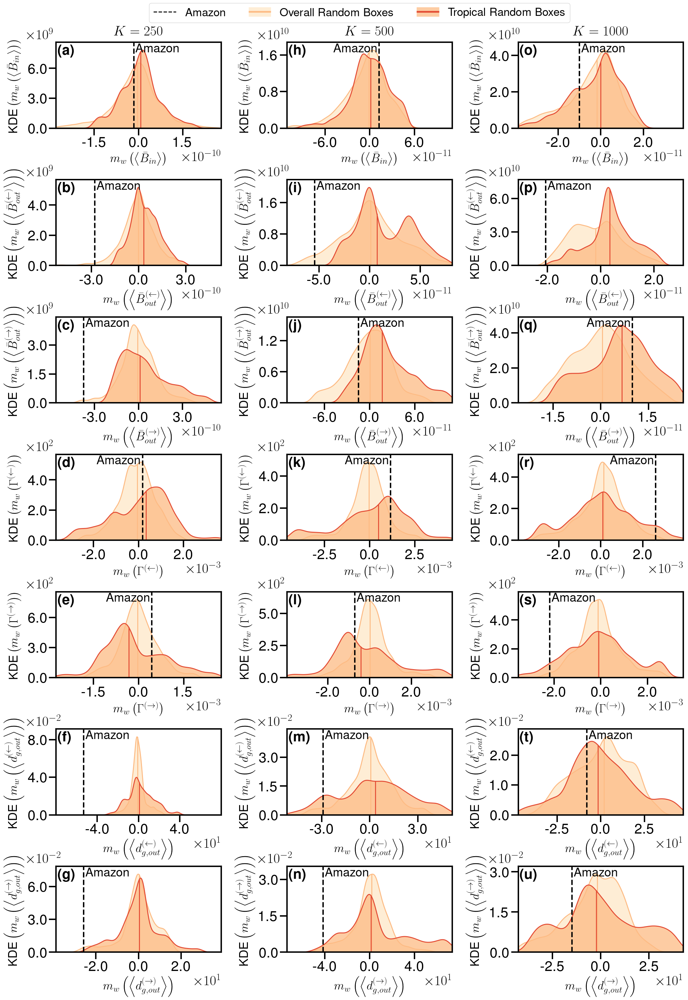

In [11]:
ks = [250, 500, 1000]

import matplotlib.mlab as mlab
import matplotlib.patches as mpatches
from matplotlib.path import Path
from matplotlib.collections import PatchCollection
from matplotlib.collections import LineCollection

class MagnitudeFormatter(mpl.ticker.ScalarFormatter):
    def __init__(self, exponent=None):
        super().__init__()
        self._fixed_exponent = exponent

    def _set_order_of_magnitude(self):
        if self._fixed_exponent:
            self.orderOfMagnitude = self._fixed_exponent
        else:
            super()._set_order_of_magnitude()

class Overall(object):
    pass

class Tropical(object):
    pass

class ColorHandler(object):
    def __init__(self, color_fill, alpha_fill, color_bounds, alpha_bounds):
      super().__init__()
      self.color_fill = color_fill
      self.alpha_fill = alpha_fill
      self.color_bounds = color_bounds
      self.alpha_bounds = alpha_bounds

    def legend_artist(self, legend, orig_handle, fontsize, handlebox):
        x0, y0 = handlebox.xdescent, handlebox.ydescent
        width, height = handlebox.width, handlebox.height
        hw = 0.5*width; hh = 0.5*height

        extra_box_height = 0.2*height
        line_height = 0.2*height

        patches = [mpl.patches.Rectangle((0,0-extra_box_height/2),width,height+extra_box_height,color=self.color_fill,alpha=self.alpha_fill,ec=None),
                  mpl.patches.Rectangle((0,0.5*height-line_height/2),width,line_height,color=self.color_bounds,alpha=self.alpha_bounds,ec=None)]


        patch = PatchCollection(patches,match_original=True)

        handlebox.add_artist(patch)
        return patch

random_box_base_dir = data_dir + 'Random Boxes/'
if not os.path.isdir(random_box_base_dir):
  os.mkdir(random_box_base_dir)

vars = ['betweenness_in_', 'betweenness_out_', 'conn_ratio_', 'dist_ratio_']
# var_labels = [r'$\sfrac{\left\langle \bar{B}_{in} \right\rangle}{\left\langle d_g \right\rangle}$',
#           r'$\sfrac{\left\langle \bar{B}_{out} \right\rangle}{\left\langle d_g \right\rangle}$',
#           r'$\Gamma$',
#           r'$\sfrac{\left\langle d_{g,out} \right\rangle}{\left\langle d_g \right\rangle}$']
var_labels = [r'$\left\langle \bar{B}_{in} \right\rangle$',
          r'$\left\langle \bar{B}_{out} \right\rangle$',
          r'$\Gamma$',
          r'$\left\langle d_{g,out} \right\rangle$']

k = ks[0]
dir_end = '-months={:},offset={:},k={:}/'.format(months,offset,k)
random_box_dir = random_box_base_dir + 'Random Boxes' + dir_end


vars = ['betweenness_in_', 'betweenness_out_', 'conn_ratio_', 'dist_ratio_']
with gzip.open(random_box_dir + 'amazon_properties' + '.data', 'rb') as file:
  for var in vars:
    globals()[var+'amazon'] = pkl.load(file)

num_vars = 0
for var in vars:
  try:
    _ = globals()[var+'amazon']['in']
    num_vars += 2
  except:
    num_vars += 1

fontsize = 30

plt.rc('text', usetex=True)
plt.rc('xtick',labelsize=fontsize)
plt.rc('ytick',labelsize=fontsize)

fig, axs = plt.subplots(num_vars,len(ks), sharex=False, figsize=(8*len(ks),5*num_vars))



p_val = 25
alpha = 0.75
alpha_bounds = 1
color_overall = '#fee8c8'
color_tropical = '#fdbb84'
color_mid_overall = '#fdbb84'
color_mid_tropical = '#e34a33'
ms = 7.5
lw = 2
legendsize = 24

xy_annotate = (0.01, 0.975)

handles = [mpl.lines.Line2D([], [], color='k', ls='--', ms=ms, lw=lw), Overall(), Tropical()]
labels = ['Amazon', 'Overall Random Boxes', 'Tropical Random Boxes']

axs[0,0].legend(handles, labels, ncols=3, loc='lower center', bbox_to_anchor=(0.5,.892),
          bbox_transform=fig.transFigure, prop={'size': legendsize},
          handler_map={Overall: ColorHandler(color_overall, alpha, color_mid_overall, alpha_bounds),
                        Tropical: ColorHandler(color_tropical, alpha, color_mid_tropical, alpha_bounds)})


for i_k in range(len(ks)):
  k = ks[i_k]

  dir_end = '-months={:},offset={:},k={:}/'.format(months,offset,k)

  graph_dir = data_dir + 'G' + dir_end

  random_box_dir = random_box_base_dir + 'Random Boxes' + dir_end
  if not os.path.isdir(random_box_dir):
    os.mkdir(random_box_dir)

  vars = ['betweenness_in_amazon', 'betweenness_out_amazon', 'conn_ratio_amazon', 'dist_ratio_amazon']
  with gzip.open(random_box_dir + 'amazon_properties' + '.data', 'rb') as file:
    for var in vars:
      globals()[var] = pkl.load(file)

  vars = ['betweenness_in_overall', 'betweenness_out_overall', 'conn_ratio_overall', 'dist_ratio_overall',
        'betweenness_in_tropical', 'betweenness_out_tropical', 'conn_ratio_tropical', 'dist_ratio_tropical']
  with gzip.open(random_box_dir + 'collected_data.data', 'rb') as file:
    for var in vars:
      globals()[var] = pkl.load(file)

  with gzip.open(random_box_dir + 'amazon_distances.data', 'rb') as file:
    avg_dist_amazon = pkl.load(file)

  vars = ['avg_dist_overall', 'avg_dist_tropical']
  with gzip.open(random_box_dir + 'collected_distances.data', 'rb') as file:
    for var in vars:
      globals()[var] = pkl.load(file)

  vars = ['betweenness_in_', 'betweenness_out_', 'conn_ratio_', 'dist_ratio_']

  var_label = var_labels[0]
  var = vars[0]
  i_var = 0
  while i_var < num_vars:
    ax = axs[i_var,i_k]

    if i_var == 0:
      ax.annotate(r'$K = {:}$'.format(k), xy=(0.5,1.05), xycoords='axes fraction',
                  ha='center', va='bottom', fontsize=fontsize)

    var_amazon = globals()[var + 'amazon']
    var_overall = globals()[var + 'overall']
    var_tropical = globals()[var + 'tropical']

    if type(var_amazon) == dict:
      if 'conn' not in var:
        var_amazon = globals()[var + 'amazon']['in']*avg_dist_amazon
        var_overall = globals()[var + 'overall']['in']*avg_dist_overall
        var_tropical = globals()[var + 'tropical']['in']*avg_dist_tropical
      else:
        var_amazon = globals()[var + 'amazon']['in']
        var_overall = globals()[var + 'overall']['in']
        var_tropical = globals()[var + 'tropical']['in']

      slopes_overall = np.zeros((var_overall.shape[1],))
      for i in range(var_overall.shape[1]):
        slopes_overall[i] = np.polyfit(np.arange(len(dates)),var_overall[:,i],1)[0]
      slopes_overall = slopes_overall[(slopes_overall>np.quantile(slopes_overall,0.025)) & (slopes_overall<np.quantile(slopes_overall,0.975))]
      slopes_tropical = np.zeros((var_tropical.shape[1],))
      for i in range(var_tropical.shape[1]):
        slopes_tropical[i] = np.polyfit(np.arange(len(dates)),var_tropical[:,i],1)[0]
      slopes_tropical = slopes_tropical[(slopes_tropical>np.quantile(slopes_tropical,0.025)) & (slopes_tropical<np.quantile(slopes_tropical,0.975))]

      slope_amazon = np.polyfit(np.arange(len(dates)),var_amazon,1)[0][0]

      max_val = max(abs(min(min(slopes_overall),min(slopes_tropical),slope_amazon*1.5)), max(max(slopes_overall), max(slopes_tropical), slope_amazon*1.5))
      min_val = -max_val
      pts = np.linspace(min_val, max_val,1000)

      kernel_overall = sp.stats.gaussian_kde(slopes_overall)
      kernel_tropical = sp.stats.gaussian_kde(slopes_tropical)

      kde_overall = kernel_overall.evaluate(pts)
      # kde_overall /= np.sum(kde_overall)
      kde_tropical = kernel_tropical.evaluate(pts)
      # kde_tropical /= np.sum(kde_tropical)


      ax.fill_between(pts,0,kde_overall,color=color_overall,alpha=alpha)
      med = np.median(slopes_overall)
      ax.plot([med]*2,[0,kde_overall[np.argmin(np.abs(pts - med))]],color=color_mid_overall,lw=2,alpha=alpha_bounds)
      ax.plot(pts,kde_overall,color=color_mid_overall,lw=2,alpha=alpha_bounds)
      ax.fill_between(pts,0,kde_tropical,color=color_tropical,alpha=alpha)
      med = np.median(slopes_tropical)
      ax.plot([med]*2,[0,kde_tropical[np.argmin(np.abs(pts - med))]],color=color_mid_tropical,lw=2,alpha=alpha_bounds)
      ax.plot(pts,kde_tropical,color=color_mid_tropical,lw=2,alpha=alpha_bounds)

      max_value = 1.1*max(np.max(kde_overall), np.max(kde_tropical))
      ax.set_xlim(pts[0],pts[-1])
      ax.set_ylim(0,max_value)

      # max_intercept = max(kernel_overall.evaluate(slope_amazon)[0], kernel_tropical.evaluate(slope_amazon)[0])
      i_pts_closest = np.argmin(np.abs(pts - slope_amazon))
      max_intercept = max(kde_overall[i_pts_closest],kde_tropical[i_pts_closest])
      # if max_intercept < 0.05*max_value:
      max_intercept = max_value

      ax.plot([slope_amazon]*2,[0,max_intercept],'k--',lw=3)

      if slope_amazon >= 0:
        ax.annotate('Amazon', xy=(slope_amazon-0.01*(pts[-1]-pts[0]),0.99*max_value), xycoords='data', fontsize=fontsize-4, ha='right',va='top')
      else:
        ax.annotate('Amazon', xy=(slope_amazon+0.01*(pts[-1]-pts[0]),0.99*max_value), xycoords='data', fontsize=fontsize-4, ha='left', va='top')

      ax.annotate(r'\textbf{('+chr(97+i_var + i_k*num_vars)+')}', xy=xy_annotate, xycoords='axes fraction', ha='left', va='top', fontsize=fontsize)


      ax.yaxis.set_major_locator(plt.MaxNLocator(3))

      yticks = ax.get_yticks()[:-1]

      multiplier = int('{:e}'.format(yticks[-1]).split('e')[1])
      fmt = MagnitudeFormatter(multiplier)
      ax.yaxis.set_major_formatter(fmt)
      # plt.ticklabel_format(style='sci', axis='y')
      # print(ax.yaxis.get_major_formatter().__dict__)
      ax.yaxis.offsetText.set_visible(False)

      # print(yticks)
      ax.set_yticks(yticks)
      ax.set_yticklabels(['{:.1f}'.format(ytick/10**multiplier) for ytick in yticks])

      if multiplier != 0:
        ax.annotate(r'$\times 10^{'+str(multiplier)+r'}$', xy=(-0.175,1.02), xycoords='axes fraction', ha='left', va='bottom', fontsize=fontsize)


      ax.xaxis.set_major_locator(plt.MaxNLocator(4))

      xticks = ax.get_xticks()[1:-1]

      multiplier = int('{:e}'.format(max(np.abs(xticks))).split('e')[1])
      fmt = MagnitudeFormatter(multiplier)
      ax.xaxis.set_major_formatter(fmt)
      # plt.ticklabel_format(style='sci', axis='y')
      # print(ax.xaxis.get_major_formatter().__dict__)
      ax.xaxis.offsetText.set_visible(False)

      # print(xticks)
      ax.set_xticks(xticks)
      ax.set_xticklabels(['{:.1f}'.format(xtick/10**multiplier) for xtick in xticks])

      if multiplier != 0:
        ax.annotate(r'$\times 10^{'+str(multiplier)+r'}$', xy=(1.01,-.25), xycoords='axes fraction', ha='right', va='top', fontsize=fontsize)

      string = var_label
      if var_label == r'$\Gamma$':
        string = r'$\Gamma^{(\leftarrow)}$'
      else:
        string = var_label.replace('_','^{(\leftarrow)}_',1)
      ax.set_xlabel(r'$m_w\left('+string.replace('$','')+r'\right)$', fontsize=fontsize-4)
      ax.set_ylabel(r'$\text{KDE}\left(m_w\left('+string.replace('$','')+r'\right)\right)$', fontsize=fontsize-4, va='center', labelpad=30)

      ax.tick_params(length=15,width=3)
      plt.setp(ax.spines.values(), linewidth=3, zorder=10)




      i_var += 1
      ax = axs[i_var, i_k]

      if 'conn' not in var:
        var_amazon = globals()[var + 'amazon']['out']*avg_dist_amazon
        var_overall = globals()[var + 'overall']['out']*avg_dist_overall
        var_tropical = globals()[var + 'tropical']['out']*avg_dist_tropical
      else:
        var_amazon = globals()[var + 'amazon']['out']
        var_overall = globals()[var + 'overall']['out']
        var_tropical = globals()[var + 'tropical']['out']

      slopes_overall = np.zeros((var_overall.shape[1],))
      for i in range(var_overall.shape[1]):
        slopes_overall[i] = np.polyfit(np.arange(len(dates)),var_overall[:,i],1)[0]
      slopes_overall = slopes_overall[(slopes_overall>np.quantile(slopes_overall,0.025)) & (slopes_overall<np.quantile(slopes_overall,0.975))]
      slopes_tropical = np.zeros((var_tropical.shape[1],))
      for i in range(var_tropical.shape[1]):
        slopes_tropical[i] = np.polyfit(np.arange(len(dates)),var_tropical[:,i],1)[0]
      slopes_tropical = slopes_tropical[(slopes_tropical>np.quantile(slopes_tropical,0.025)) & (slopes_tropical<np.quantile(slopes_tropical,0.975))]

      slope_amazon = np.polyfit(np.arange(len(dates)),var_amazon,1)[0][0]

      max_val = max(abs(min(min(slopes_overall),min(slopes_tropical),slope_amazon*1.5)), max(max(slopes_overall), max(slopes_tropical), slope_amazon*1.5))
      min_val = -max_val
      pts = np.linspace(min_val, max_val,1000)

      kernel_overall = sp.stats.gaussian_kde(slopes_overall)
      kernel_tropical = sp.stats.gaussian_kde(slopes_tropical)

      kde_overall = kernel_overall.evaluate(pts)
      # kde_overall /= np.sum(kde_overall)
      kde_tropical = kernel_tropical.evaluate(pts)
      # kde_tropical /= np.sum(kde_tropical)


      ax.fill_between(pts,0,kde_overall,color=color_overall,alpha=alpha)
      med = np.median(slopes_overall)
      ax.plot([med]*2,[0,kde_overall[np.argmin(np.abs(pts - med))]],color=color_mid_overall,lw=2,alpha=alpha_bounds)
      ax.plot(pts,kde_overall,color=color_mid_overall,lw=2,alpha=alpha_bounds)
      ax.fill_between(pts,0,kde_tropical,color=color_tropical,alpha=alpha)
      med = np.median(slopes_tropical)
      ax.plot([med]*2,[0,kde_tropical[np.argmin(np.abs(pts - med))]],color=color_mid_tropical,lw=2,alpha=alpha_bounds)
      ax.plot(pts,kde_tropical,color=color_mid_tropical,lw=2,alpha=alpha_bounds)

      max_value = 1.1*max(np.max(kde_overall), np.max(kde_tropical))
      ax.set_xlim(pts[0],pts[-1])
      ax.set_ylim(0,max_value)

      # max_intercept = max(kernel_overall.evaluate(slope_amazon)[0], kernel_tropical.evaluate(slope_amazon)[0])
      i_pts_closest = np.argmin(np.abs(pts - slope_amazon))
      max_intercept = max(kde_overall[i_pts_closest],kde_tropical[i_pts_closest])
      # if max_intercept < 0.05*max_value:
      max_intercept = max_value

      ax.plot([slope_amazon]*2,[0,max_intercept],'k--',lw=3)

      if slope_amazon >= 0:
        ax.annotate('Amazon', xy=(slope_amazon-0.01*(pts[-1]-pts[0]),0.99*max_value), xycoords='data', fontsize=fontsize-4, ha='right',va='top')
      else:
        ax.annotate('Amazon', xy=(slope_amazon+0.01*(pts[-1]-pts[0]),0.99*max_value), xycoords='data', fontsize=fontsize-4, ha='left', va='top')

      ax.annotate(r'\textbf{('+chr(97+i_var + i_k*num_vars)+')}', xy=xy_annotate, xycoords='axes fraction', ha='left', va='top', fontsize=fontsize)


      ax.yaxis.set_major_locator(plt.MaxNLocator(3))

      yticks = ax.get_yticks()[:-1]

      multiplier = int('{:e}'.format(yticks[-1]).split('e')[1])
      fmt = MagnitudeFormatter(multiplier)
      ax.yaxis.set_major_formatter(fmt)
      # plt.ticklabel_format(style='sci', axis='y')
      # print(ax.yaxis.get_major_formatter().__dict__)
      ax.yaxis.offsetText.set_visible(False)

      # print(yticks)
      ax.set_yticks(yticks)
      ax.set_yticklabels(['{:.1f}'.format(ytick/10**multiplier) for ytick in yticks])

      if multiplier != 0:
        ax.annotate(r'$\times 10^{'+str(multiplier)+r'}$', xy=(-0.175,1.02), xycoords='axes fraction', ha='left', va='bottom', fontsize=fontsize)


      ax.xaxis.set_major_locator(plt.MaxNLocator(4))

      xticks = ax.get_xticks()[1:-1]

      multiplier = int('{:e}'.format(max(np.abs(xticks))).split('e')[1])
      fmt = MagnitudeFormatter(multiplier)
      ax.xaxis.set_major_formatter(fmt)
      # plt.ticklabel_format(style='sci', axis='y')
      # print(ax.xaxis.get_major_formatter().__dict__)
      ax.xaxis.offsetText.set_visible(False)

      # print(xticks)
      ax.set_xticks(xticks)
      ax.set_xticklabels(['{:.1f}'.format(xtick/10**multiplier) for xtick in xticks])

      if multiplier != 0:
        ax.annotate(r'$\times 10^{'+str(multiplier)+r'}$', xy=(1.01,-.25), xycoords='axes fraction', ha='right', va='top', fontsize=fontsize)

      string = var_label
      if var_label == r'$\Gamma$':
        string = r'$\Gamma^{(\rightarrow)}$'
      else:
        string = var_label.replace('_',r'^{(\rightarrow)}_',1)
      ax.set_xlabel(r'$m_w\left('+string.replace('$','')+r'\right)$', fontsize=fontsize-4)
      ax.set_ylabel(r'$\text{KDE}\left(m_w\left('+string.replace('$','')+r'\right)\right)$', fontsize=fontsize-4, va='center', labelpad=30)

      ax.tick_params(length=15,width=3)
      plt.setp(ax.spines.values(), linewidth=3, zorder=10)


    else:
      if 'conn' not in var:
        var_amazon = var_amazon*avg_dist_amazon
        var_overall = var_overall*avg_dist_overall
        var_tropical = var_tropical*avg_dist_tropical

      slopes_overall = np.zeros((var_overall.shape[1],))
      for i in range(var_overall.shape[1]):
        slopes_overall[i] = np.polyfit(np.arange(len(dates)),var_overall[:,i],1)[0]
      slopes_overall = slopes_overall[(slopes_overall>np.quantile(slopes_overall,0.025)) & (slopes_overall<np.quantile(slopes_overall,0.975))]
      slopes_tropical = np.zeros((var_tropical.shape[1],))
      for i in range(var_tropical.shape[1]):
        slopes_tropical[i] = np.polyfit(np.arange(len(dates)),var_tropical[:,i],1)[0]
      slopes_tropical = slopes_tropical[(slopes_tropical>np.quantile(slopes_tropical,0.025)) & (slopes_tropical<np.quantile(slopes_tropical,0.975))]

      slope_amazon = np.polyfit(np.arange(len(dates)),var_amazon,1)[0][0]

      max_val = max(abs(min(min(slopes_overall),min(slopes_tropical),slope_amazon*1.5)), max(max(slopes_overall), max(slopes_tropical), slope_amazon*1.5))
      min_val = -max_val
      pts = np.linspace(min_val, max_val,1000)

      kernel_overall = sp.stats.gaussian_kde(slopes_overall)
      kernel_tropical = sp.stats.gaussian_kde(slopes_tropical)

      kde_overall = kernel_overall.evaluate(pts)
      # kde_overall /= np.sum(kde_overall)
      kde_tropical = kernel_tropical.evaluate(pts)
      # kde_tropical /= np.sum(kde_tropical)


      ax.fill_between(pts,0,kde_overall,color=color_overall,alpha=alpha)
      med = np.median(slopes_overall)
      ax.plot([med]*2,[0,kde_overall[np.argmin(np.abs(pts - med))]],color=color_mid_overall,lw=2,alpha=alpha_bounds)
      ax.plot(pts,kde_overall,color=color_mid_overall,lw=2,alpha=alpha_bounds)
      ax.fill_between(pts,0,kde_tropical,color=color_tropical,alpha=alpha)
      med = np.median(slopes_tropical)
      ax.plot([med]*2,[0,kde_tropical[np.argmin(np.abs(pts - med))]],color=color_mid_tropical,lw=2,alpha=alpha_bounds)
      ax.plot(pts,kde_tropical,color=color_mid_tropical,lw=2,alpha=alpha_bounds)

      max_value = 1.1*max(np.max(kde_overall), np.max(kde_tropical))
      ax.set_xlim(pts[0],pts[-1])
      ax.set_ylim(0,max_value)

      # max_intercept = max(kernel_overall.evaluate(slope_amazon)[0], kernel_tropical.evaluate(slope_amazon)[0])
      i_pts_closest = np.argmin(np.abs(pts - slope_amazon))
      max_intercept = max(kde_overall[i_pts_closest],kde_tropical[i_pts_closest])
      # if max_intercept < 0.05*max_value:
      max_intercept = max_value

      ax.plot([slope_amazon]*2,[0,max_intercept],'k--',lw=3)

      if slope_amazon >= 0:
        ax.annotate('Amazon', xy=(slope_amazon-0.01*(pts[-1]-pts[0]),0.99*max_value), xycoords='data', fontsize=fontsize-4, ha='right',va='top')
      else:
        ax.annotate('Amazon', xy=(slope_amazon+0.01*(pts[-1]-pts[0]),0.99*max_value), xycoords='data', fontsize=fontsize-4, ha='left', va='top')

      ax.annotate(r'\textbf{('+chr(97+i_var + i_k*num_vars)+')}', xy=xy_annotate, xycoords='axes fraction', ha='left', va='top', fontsize=fontsize)


      ax.yaxis.set_major_locator(plt.MaxNLocator(3))

      yticks = ax.get_yticks()[:-1]

      multiplier = int('{:e}'.format(yticks[-1]).split('e')[1])
      fmt = MagnitudeFormatter(multiplier)
      ax.yaxis.set_major_formatter(fmt)
      # plt.ticklabel_format(style='sci', axis='y')
      # print(ax.yaxis.get_major_formatter().__dict__)
      ax.yaxis.offsetText.set_visible(False)

      # print(yticks)
      ax.set_yticks(yticks)
      ax.set_yticklabels(['{:.1f}'.format(ytick/10**multiplier) for ytick in yticks])

      if multiplier != 0:
        ax.annotate(r'$\times 10^{'+str(multiplier)+r'}$', xy=(-0.175,1.02), xycoords='axes fraction', ha='left', va='bottom', fontsize=fontsize)


      ax.xaxis.set_major_locator(plt.MaxNLocator(4))

      xticks = ax.get_xticks()[1:-1]

      multiplier = int('{:e}'.format(max(np.abs(xticks))).split('e')[1])
      fmt = MagnitudeFormatter(multiplier)
      ax.xaxis.set_major_formatter(fmt)
      # plt.ticklabel_format(style='sci', axis='y')
      # print(ax.xaxis.get_major_formatter().__dict__)
      ax.xaxis.offsetText.set_visible(False)

      # print(xticks)
      ax.set_xticks(xticks)
      ax.set_xticklabels(['{:.1f}'.format(xtick/10**multiplier) for xtick in xticks])

      if multiplier != 0:
        ax.annotate(r'$\times 10^{'+str(multiplier)+r'}$', xy=(1.01,-.25), xycoords='axes fraction', ha='right', va='top', fontsize=fontsize)

      string = var_label
      ax.set_xlabel(r'$m_w\left('+string.replace('$','')+r'\right)$', fontsize=fontsize-4)
      ax.set_ylabel(r'$\text{KDE}\left(m_w\left('+string.replace('$','')+r'\right)\right)$', fontsize=fontsize-4, va='center', labelpad=30)

      ax.tick_params(length=15,width=3)
      plt.setp(ax.spines.values(), linewidth=3, zorder=10)


    if i_var < num_vars-1:
      var_label = var_labels[var_labels.index(var_label)+1]
      var = vars[vars.index(var)+1]
    i_var += 1

fig.align_labels()

plt.subplots_adjust(hspace=0.6,wspace=0.4)


title = 'No Dist Metric Slope Distributions (Vary k)'
plt.savefig(fig_dir+title+'.jpg',bbox_inches='tight',pad_inches=0.2, dpi=300)
plt.savefig(fig_dir+title+'.pdf',bbox_inches='tight',pad_inches=0.2, dpi=300)

plt.show()

In [ ]:
k = ks[0]
dir_end = '-months={:},offset={:},k={:}/'.format(months,offset,k)
random_box_dir = random_box_base_dir + 'Random Boxes' + dir_end


vars = ['betweenness_in_', 'betweenness_out_', 'conn_ratio_', 'dist_ratio_']
with gzip.open(random_box_dir + 'amazon_properties' + '.data', 'rb') as file:
  for var in vars:
    globals()[var] = pkl.load(file)

num_vars = 0
for var in vars:
  try:
    _ = globals()[var+'amazon']['in']
    num_vars += 2
  except:
    num_vars += 1

print(num_vars)

In [ ]:
betweenness_out_amazon

{'in': array([[6.94919536e-12],
        [6.57475856e-12],
        [8.07378083e-12],
        [7.76342381e-12],
        [9.29129843e-12],
        [7.00036254e-12],
        [7.15891232e-12],
        [6.68761853e-12],
        [9.19909647e-12],
        [1.24433527e-11],
        [1.23220681e-11],
        [9.09354845e-12],
        [1.00522891e-11],
        [9.93155698e-12],
        [1.04086600e-11],
        [1.16604738e-11],
        [1.11153801e-11],
        [1.14589859e-11],
        [1.31110689e-11],
        [1.72289654e-11],
        [1.20752931e-11],
        [1.89032529e-11],
        [1.60179505e-11],
        [1.11000546e-11],
        [1.26204073e-11],
        [1.36974999e-11],
        [1.23745316e-11],
        [1.29886466e-11],
        [1.16793154e-11],
        [1.01936101e-11],
        [8.03850280e-12],
        [9.37802137e-12],
        [8.45583608e-12],
        [8.75838223e-12],
        [9.73405614e-12],
        [1.05315909e-11],
        [1.10608085e-11],
        [1.03363853e-11],
      

In [ ]:
k = 50

dir_end = '-months={:},offset={:},k={:}/'.format(months,offset,k)

graph_dir = data_dir + 'G' + dir_end

random_box_dir = random_box_base_dir + 'Random Boxes' + dir_end
if not os.path.isdir(random_box_dir):
  os.mkdir(random_box_dir)

In [ ]:
vars = ['betweenness_in_amazon', 'betweenness_out_amazon', 'conn_ratio_amazon', 'dist_ratio_amazon']
with gzip.open(random_box_dir + 'amazon_properties' + '.data', 'rb') as file:
  for var in vars:
    globals()[var] = pkl.load(file)

In [ ]:
print(type(globals()['betweenness_out_amazon']) == dict)

True


In [ ]:
var_labels[2] == r'$\Gamma$'

True

In [ ]:
print(vars, var)

['betweenness_in_', 'betweenness_out_', 'conn_ratio_', 'dist_ratio_'] dist_ratio_


In [ ]:
print(num_vars)

14


In [ ]:
print(var)

betweenness_out_


In [ ]:
print(globals()[var + 'amazon'])

{'in': array([[5.38531972e-10],
       [4.25754731e-10],
       [4.24410766e-10],
       [4.72323461e-10],
       [5.23437462e-10],
       [6.13104571e-10],
       [5.08218103e-10],
       [4.27470292e-10],
       [3.45368650e-10],
       [4.88066894e-10],
       [3.94176761e-10],
       [4.34542649e-10],
       [4.15791678e-10],
       [4.69798857e-10],
       [4.72820739e-10],
       [5.00093920e-10],
       [4.89011437e-10],
       [4.31457152e-10],
       [5.91969162e-10],
       [5.25481333e-10],
       [3.94945391e-10],
       [4.93687208e-10],
       [3.91595498e-10],
       [4.25457548e-10],
       [4.63000827e-10],
       [4.01317013e-10],
       [4.15923066e-10],
       [4.97928059e-10],
       [5.66034276e-10],
       [5.77844104e-10],
       [5.99317218e-10],
       [4.98345105e-10],
       [4.37137752e-10],
       [4.36184455e-10],
       [5.67377658e-10],
       [6.49305453e-10],
       [5.57132040e-10],
       [8.57083077e-10],
       [5.55887476e-10],
       [6.27532352

In [ ]:


vars = ['betweenness_in_', 'betweenness_out_', 'conn_ratio_', 'dist_ratio_']

def mid_and_bounds(data,p_val,mid_function=np.median):
  low = np.percentile(data, p_val, axis=1)
  upp = np.percentile(data, 100-p_val, axis=1)
  mid = mid_function(data, axis=1)

  return low, upp, mid

fontsize = 34

plt.rc('text', usetex=True)
plt.rc('xtick',labelsize=fontsize)
plt.rc('ytick',labelsize=fontsize)

p_val = 25
alpha = 1
alpha_bounds = 0.75
color_overall = '#fee8c8'
color_tropical = '#fdbb84'
color_mid_overall = '#fdbb84'
color_mid_tropical = '#e34a33'
ms = 7.5
lw = 2
legendsize = 18

xy_annotate = (0.005, 0.85)

fig, axs = plt.subplots(len(vars),1, sharex=True, figsize=(12,4*len(vars)))


for i_var in range(len(vars)):
  var = vars[i_var]
  ax = axs[i_var]


  var_amazon = globals()[var + 'amazon']
  ax.plot(np.arange(len(dates)),var_amazon,'ko',ms=ms,lw=lw,label='Amazon',zorder=3)
  p = np.polyfit(np.arange(len(dates)),var_amazon,1)
  print(p[0])
  ax.plot([np.arange(len(dates))[0],np.arange(len(dates))[-1]],[p[0]*np.arange(len(dates))[0]+p[1],p[0]*np.arange(len(dates))[-1]+p[1]],
          'k',lw=lw,zorder=3)


  var_overall = globals()[var + 'overall']
  low, upp, mid = mid_and_bounds(var_overall, p_val)

  ax.plot(np.arange(len(dates)),mid,color_mid_overall,alpha=alpha_bounds,zorder=2)
  ax.plot(np.arange(len(dates)),low,'-',c=color_mid_overall,alpha=alpha_bounds,zorder=2)
  ax.plot(np.arange(len(dates)),upp,'-',c=color_mid_overall,alpha=alpha_bounds,zorder=2)
  ax.fill_between(np.arange(len(dates)),low, upp, color=color_overall,
                  alpha=alpha,zorder=1,label='Overall Random Boxes')


  var_tropical = globals()[var + 'tropical']
  low, upp, mid = mid_and_bounds(var_tropical, p_val)

  ax.plot(np.arange(len(dates)),mid,color_mid_tropical,alpha=alpha_bounds,zorder=2)
  ax.plot(np.arange(len(dates)),low,'-',c=color_mid_tropical,alpha=alpha_bounds,zorder=2)
  ax.plot(np.arange(len(dates)),upp,'-',c=color_mid_tropical,alpha=alpha_bounds,zorder=2)
  ax.fill_between(np.arange(len(dates)),low, upp, color=color_tropical,
                  alpha=alpha,zorder=1,label='Tropical Random Boxes')


  ax.annotate(r'\textbf{('+chr(97+i_var)+')}', xy=xy_annotate, xycoords='axes fraction', fontsize=fontsize)

  xticks = np.arange(7,len(dates),10)
  xticklabels = [dates[i].split('-')[1] for i in xticks]
  ax.set_xticks(xticks)



  if i_var == len(vars) - 1:
    ax.set_xlabel('End Year', fontsize=fontsize)
    ax.set_xticklabels(xticklabels, fontsize=fontsize)

    ax.tick_params(bottom=True, top=False, left=True, right=False)
  elif i_var == 0:
    handles, labels = ax.get_legend_handles_labels()

    ax.legend(handles, labels, loc='upper right',prop={'size': legendsize})
    ax.tick_params(bottom=False, top=False, left=True, right=False)
  else:
    ax.tick_params(bottom=False, top=False, left=True, right=False)


  ax.set_title(var.replace('_',' '), fontsize=fontsize)

  ax.set_xlim(0,len(dates)-1)


plt.subplots_adjust(hspace=0.2)

plt.show()

In [ ]:
densities = [0.01]

random_box_base_dir = data_dir + 'Random Boxes/'
if not os.path.isdir(random_box_base_dir):
  os.mkdir(random_box_base_dir)

for density in densities:
  dir_end = '-months={:},offset={:},density={:}/'.format(months,offset,density)

  graph_dir = data_dir + 'G' + dir_end

  random_box_dir = random_box_base_dir + 'Random Boxes' + dir_end
  if not os.path.isdir(random_box_dir):
    os.mkdir(random_box_dir)

  recompute = False

  if recompute:
    target_nodes_lst_overall, target_nodes_lst_tropical = get_random_box_samples(len(amazon_nodes),latlon_icos,random_box_base_dir,num_samples=5000,increment=0.5,disp_progress=True,excluded_nodes=amazon_nodes)
  else:
    with gzip.open(random_box_base_dir + 'overall.data', 'rb') as file:
        target_nodes_lst_overall = pkl.load(file)

    with gzip.open(random_box_base_dir + 'tropical.data', 'rb') as file:
        target_nodes_lst_tropical = pkl.load(file)

  date_intervals = np.arange(0,len(dates),10)
  lst = trange(len(date_intervals)-1, leave=False)
  for i in lst:
    start, end = date_intervals[i:i+2]
    if i == len(date_intervals)-2:
      end += 1
    # print('{:}-{:}'.format(start,end-1))
    # print(os.path.isfile(random_box_dir + '{:}-{:}.data'.format(start,end-1)))
    # print(dates[start], dates[end-1])
    lst.set_description('k={:}, {:}-{:}'.format(k,start,end-1))



    results = collect_metrics_from_boxes(dates[start:end],target_nodes_lst_overall,target_nodes_lst_tropical,latlon_icos,data_dir,graph_dir,random_box_dir,dir_end,filename='{:}-{:}'.format(start,end-1),save_each_iter=False)

  0%|          | 0/3 [00:00<?, ?it/s]

KeyboardInterrupt: ignored

In [ ]:
ks = [1000]

random_box_base_dir = data_dir + 'Random Boxes/'
if not os.path.isdir(random_box_base_dir):
  os.mkdir(random_box_base_dir)

for k in ks:
  dir_end = '-months={:},offset={:},k={:}/'.format(months,offset,k)

  graph_dir = data_dir + 'G' + dir_end

  random_box_dir = random_box_base_dir + 'Random Boxes' + dir_end
  if not os.path.isdir(random_box_dir):
    os.mkdir(random_box_dir)

  recompute = False

  if recompute:
    target_nodes_lst_overall, target_nodes_lst_tropical = get_random_box_samples(len(amazon_nodes),latlon_icos,random_box_base_dir,num_samples=5000,increment=0.5,disp_progress=True,excluded_nodes=amazon_nodes)
  else:
    with gzip.open(random_box_base_dir + 'overall.data', 'rb') as file:
        target_nodes_lst_overall = pkl.load(file)

    with gzip.open(random_box_base_dir + 'tropical.data', 'rb') as file:
        target_nodes_lst_tropical = pkl.load(file)

  date_intervals = np.arange(0,len(dates),10)
  lst = trange(len(date_intervals)-1, leave=False)
  for i in lst:
    start, end = date_intervals[i:i+2]
    if i == len(date_intervals)-2:
      end += 1
    print('{:}-{:}'.format(start,end-1))
    print(os.path.isfile(random_box_dir + '{:}-{:}.data'.format(start,end-1)))
    print(dates[start], dates[end-1])
    lst.set_description('k={:}, {:}-{:}'.format(k,start,end-1))


    if not os.path.isfile(random_box_dir + '{:}-{:}.data'.format(start,end-1)):
      num_samples_overall = len(target_nodes_lst_overall)

      betweenness_in_overall = np.zeros((end-start,num_samples_overall))
      betweenness_out_overall = {'in':np.zeros((end-start,num_samples_overall)),
                                  'out':np.zeros((end-start,num_samples_overall))}
      conn_ratio_overall = {'in':np.zeros((end-start,num_samples_overall)),
                            'out':np.zeros((end-start,num_samples_overall))}
      dist_ratio_overall = {'in':np.zeros((end-start,num_samples_overall)),
                            'out':np.zeros((end-start,num_samples_overall))}

      num_samples_tropical = len(target_nodes_lst_tropical)

      betweenness_in_tropical = np.zeros((end-start,num_samples_tropical))
      betweenness_out_tropical = {'in':np.zeros((end-start,num_samples_tropical)),
                                  'out':np.zeros((end-start,num_samples_tropical))}
      conn_ratio_tropical = {'in':np.zeros((end-start,num_samples_tropical)),
                              'out':np.zeros((end-start,num_samples_tropical))}
      dist_ratio_tropical = {'in':np.zeros((end-start,num_samples_tropical)),
                              'out':np.zeros((end-start,num_samples_tropical))}

      vars = ['betweenness_in_overall', 'betweenness_out_overall', 'conn_ratio_overall', 'dist_ratio_overall',
              'betweenness_in_tropical', 'betweenness_out_tropical', 'conn_ratio_tropical', 'dist_ratio_tropical']

      for j in range(end-start):
        with gzip.open(random_box_dir + 'shortest_paths,date={:}.data'.format(dates[start+j]), 'rb') as file:
          for var in vars:
            data = pkl.load(file)
            try:
              globals()[var]['in'][j,:] = data['in'][data['in'].any(1), :][-1,:]
              globals()[var]['out'][j,:] = data['out'][data['out'].any(1), :][-1,:]
            except:
              globals()[var][j,:] = data[data.any(1), :][-1,:]

      with gzip.open(random_box_dir + '{:}-{:}.data'.format(start,end-1), 'wb') as file:
        for var in vars:
          pkl.dump(globals()[var], file)

    # results = collect_metrics_from_boxes(dates[start:end],target_nodes_lst_overall,target_nodes_lst_tropical,latlon_icos,data_dir,graph_dir,random_box_dir,dir_end,filename='{:}-{:}'.format(start,end-1))

  0%|          | 0/5 [00:00<?, ?it/s]

0-9
True
1948-1973 1957-1982
10-19
True
1958-1983 1967-1992
20-29
True
1968-1993 1977-2002
30-39
True
1978-2003 1987-2012
40-50
False
1988-2013 1998-2023


In [ ]:
for var in vars:
  try:
    print(globals()[var]['in'].shape)
  except:
    print(globals()[var].shape)

(11, 5000)
(11, 5000)
(11, 5000)
(11, 5000)
(11, 5000)
(11, 5000)
(11, 5000)
(11, 5000)


In [ ]:
print(var)
print(data['in'])#[data['in'].any(1), :][-1,:])

dist_ratio_overall
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


In [ ]:
for var in vars:
  globals()[var+'1'] = globals()[var]

In [ ]:
with gzip.open(random_box_dir + '0-9.data', 'rb') as file:
  for var in vars:
    globals()[var+'1'] = pkl.load(file)

In [ ]:
dist_ratio_overall1

{'in': array([[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]]),
 'out': array([[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]])}

In [ ]:
print(data[data.any(1), :][-1,:])

[3.25457876e-13 5.94738054e-13 1.47498701e-13 ... 1.85274637e-13 1.55313691e-13 2.21052037e-13]


In [ ]:
print(data[data.any(1), :])

[[4.23525724e-13 7.08587525e-13 1.34000917e-13 ... 1.19236101e-13 3.52896524e-13 3.51244070e-13]]


In [ ]:
results = collect_metrics_from_boxes(dates[19:20],target_nodes_lst_overall,target_nodes_lst_tropical,latlon_icos,data_dir,graph_dir,random_box_dir,dir_end,filename='{:}-{:}'.format(start,end-1))

  0%|          | 0/1 [00:00<?, ?it/s]

1967-1992:   0%|          | 0/5000 [00:00<?, ?it/s]

In [ ]:
date_intervals = np.arange(0,len(dates),10)
lst = trange(len(date_intervals)-1)
for i in lst:
  start, end = date_intervals[i:i+2]
  if i == len(date_intervals)-2:
    end += 1
  # print('{:}-{:}'.format(start,end-1))
  lst.set_description('{:}-{:}'.format(start,end-1))

  results = collect_metrics_from_boxes(dates[start:end],target_nodes_lst_overall,target_nodes_lst_tropical,latlon_icos,data_dir,graph_dir,random_box_dir,dir_end,filename='{:}-{:}'.format(start,end-1))

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

1948-1973:   0%|          | 0/5000 [00:00<?, ?it/s]

KeyboardInterrupt: ignored

In [ ]:
date_intervals = np.arange(0,len(dates),10)
start_samples, end_samples = 1400, 1499
lst = trange(len(date_intervals)-1)
for i in lst:
  start, end = date_intervals[i:i+2]
  if i == len(date_intervals)-2:
    end += 1
  # print('{:}-{:}'.format(start,end-1))
  lst.set_description('{:}-{:}'.format(start,end-1))

  results = collect_shortest_paths_from_boxes(dates[start:end],target_nodes_lst_overall[start_samples:end_samples+1],
                                              target_nodes_lst_tropical[start_samples:end_samples+1],latlon_icos,
                                              data_dir,graph_dir,random_box_dir,dir_end,
                                              filename='shortest_paths,samples={:}-{:},{:}-{:}'.format(start_samples,end_samples,start,end-1),
                                              per_iter_filename='shortest_paths,samples={:}-{:}'.format(start_samples,end_samples))

In [ ]:
print(np.arange(0,1401,100).astype(int))


NameError: ignored

In [ ]:
print(random_box_dir)

/content/gdrive/My Drive/Amazon Project/Data/Random Boxes-months=300,offset=365.25,density=0.1/


In [ ]:
vars = ['betweenness_in_overall', 'betweenness_out_overall', 'conn_ratio_overall', 'dist_ratio_overall',
        'betweenness_in_tropical', 'betweenness_out_tropical', 'conn_ratio_tropical', 'dist_ratio_tropical']

date_intervals = np.arange(0,len(dates),10)
lst = trange(len(date_intervals)-1)
for i in lst:
  start, end = date_intervals[i:i+2]
  if i == len(date_intervals)-2:
    end += 1

  if i == 0:
    with gzip.open(random_box_dir + '{:}-{:}.data'.format(start,end-1), 'rb') as file:
      for var in vars:
        globals()[var] = pkl.load(file)

  else:
    with gzip.open(random_box_dir + '{:}-{:}.data'.format(start,end-1), 'rb') as file:
      for var in vars:
        globals()[var] = np.vstack((globals()[var],pkl.load(file)))


for var in vars:
  print(globals()[var].shape)

  0%|          | 0/5 [00:00<?, ?it/s]

(51, 5000)
(51, 5000)
(51, 5000)
(51, 5000)
(51, 5000)
(51, 5000)
(51, 5000)
(51, 5000)


In [ ]:
recompute = False

if recompute:
  geodesic_distances = np.zeros((num_nodes,num_nodes))
  for i in range(num_nodes):
    lats = np.zeros((num_nodes-i-1,)) + latlon_icos[i,0]
    lons = np.zeros((num_nodes-i-1,)) + latlon_icos[i,1]
    geodesic_distances[i,i+1:] = haversine_np(lons,lats,latlon_icos[i+1:,1],latlon_icos[i+1:,0])
    geodesic_distances[i+1:,i] = geodesic_distances[i,i+1:]


  # Metrics
  betweenness_in_amazon = np.zeros((len(dates),1))
  betweenness_out_amazon = np.zeros((len(dates),1))
  # avg_shortest_path_len_amazon = np.zeros((len(dates),num_samples_amazon))
  # geo_dist_by_avg_shortest_path_len_amazon = np.zeros((len(dates),num_samples_amazon))
  conn_ratio_amazon = np.zeros((len(dates),1))
  dist_ratio_amazon = np.zeros((len(dates),1))

  for date_num in trange(len(dates)):
    date = dates[date_num]

    with gzip.open(data_dir+'edge_betweenness'+dir_end+date+'.data', 'rb') as file:
      edge_betweenness = pkl.load(file)

    with gzip.open(graph_dir+date+'.data', 'rb') as file:
        G = pkl.load(file)

    all_edges = np.array([sorted(e) for e in G.edges])

    edge_betweenness_mat = np.zeros((num_nodes,num_nodes))
    for e in G.edges:
      edge_betweenness_mat[e] = edge_betweenness[tuple(e)]

    del edge_betweenness

    for sample_num in trange(1,leave=False,desc=date):
      #### amazon
      # with gzip.open(data_dir + 'G'+dir_end+date+'.data', 'rb') as file:
      #   G = pkl.load(file)

      target_nodes = amazon_nodes
      # edges = np.array(list(G.edges(target_nodes)))
      edges = all_edges[np.union1d(np.where(np.in1d(all_edges[:,0],target_nodes) == True)[0],np.where(np.in1d(all_edges[:,1],target_nodes) == True)[0])]

      # edges_in = np.array([sorted(e) for e in edges if e[0] in target_nodes and e[1] in target_nodes])
      # edges_out = np.array([sorted(e) for e in edges if e[1] not in target_nodes or e[1] not in target_nodes])
      edges_in = edges[np.intersect1d(np.where(np.in1d(edges[:,0],target_nodes) == True)[0],np.where(np.in1d(edges[:,1],target_nodes) == True)[0])]
      edges_out = edges[np.setdiff1d(np.where(np.in1d(edges[:,0],target_nodes) == True)[0],np.where(np.in1d(edges[:,1],target_nodes) == True)[0])]

      # Betweenness
      # betweenness_in_amazon[date_num,sample_num] = np.mean([edge_betweenness[tuple(e)] for e in edges_in])/np.mean(geodesic_distances[edges[:,0],edges[:,1]])
      # betweenness_out_amazon[date_num,sample_num] = np.mean([edge_betweenness[tuple(e)] for e in edges_out])/np.mean(geodesic_distances[edges[:,0],edges[:,1]])
      betweenness_in_amazon[date_num,sample_num] = np.mean(edge_betweenness_mat[edges_in[:,0],edges_in[:,1]])/np.mean(geodesic_distances[edges[:,0],edges[:,1]])
      betweenness_out_amazon[date_num,sample_num] = np.mean(edge_betweenness_mat[edges_out[:,0],edges_out[:,1]])/np.mean(geodesic_distances[edges[:,0],edges[:,1]])


      # # Avg shortest path from contracted box
      # non_target_nodes = sorted(list(set(range(num_nodes)) - set(target_nodes)))
      # for node in target_nodes[1:]:
      #   nx.contracted_nodes(G, target_nodes[0], node, copy=False)

      # paths = nx.single_source_shortest_path(G, target_nodes[0])
      # shortest_paths_from_box = [paths[node] for node in non_target_nodes]

      # avg_shortest_path_len_amazon[date_num,sample_num] = np.mean([len(p)-1 for p in shortest_paths_from_box])
      # geo_dist_by_avg_shortest_path_len_amazon[date_num,sample_num] = np.mean([geodesic_distances[p[0],p[-1]]/(len(p)-1) for p in shortest_paths_from_box])


      # Connectivity ratio
      conn_ratio_amazon[date_num,sample_num] = len(edges_out)/len(edges)


      # Distance ratio
      dist_ratio_amazon[date_num,sample_num] = np.mean(geodesic_distances[edges_out[:,0],edges_out[:,1]])/np.mean(geodesic_distances[edges[:,0],edges[:,1]])
      #### END amazon

  vars = ['betweenness_in_amazon', 'betweenness_out_amazon', 'conn_ratio_amazon', 'dist_ratio_amazon']
  with gzip.open(random_box_dir + 'amazon_properties' + '.data', 'wb') as file:
    for var in vars:
      pkl.dump(globals()[var],file)
else:
  vars = ['betweenness_in_amazon', 'betweenness_out_amazon', 'conn_ratio_amazon', 'dist_ratio_amazon']
  with gzip.open(random_box_dir + 'amazon_properties' + '.data', 'rb') as file:
    for var in vars:
      globals()[var] = pkl.load(file)

In [ ]:
vars = ['avg_shortest_path_len_overall', 'geo_dist_by_avg_shortest_path_len_overall',
        'avg_shortest_path_len_tropical', 'geo_dist_by_avg_shortest_path_len_tropical']

for var in vars:
  try:
    del globals()[var]
  except:
    pass

for start_samples in trange(0,1401,100):
  end_samples = start_samples + 99

  date_intervals = np.arange(0,len(dates),10)
  lst = range(len(date_intervals)-1)
  for i in lst:
    start, end = date_intervals[i:i+2]
    if i == len(date_intervals)-2:
      end += 1


    # print('shortest_paths,samples={:}-{:},{:}-{:}.data'.format(start_samples,end_samples,start,end-1))


    if i == 0:
      with gzip.open(random_box_dir + 'shortest_paths,samples={:}-{:},{:}-{:}.data'.format(start_samples,end_samples,start,end-1), 'rb') as file:
        for var in vars:
          globals()[var+'_tmp'] = pkl.load(file)
    else:
      with gzip.open(random_box_dir + 'shortest_paths,samples={:}-{:},{:}-{:}.data'.format(start_samples,end_samples,start,end-1), 'rb') as file:
        for var in vars:
          globals()[var+'_tmp'] = np.vstack((globals()[var+'_tmp'],pkl.load(file)))

  # for var in vars:
  #   print(globals()[var+'_tmp'].shape)


  if start_samples == 0:
    for var in vars:
      globals()[var] = globals()[var+'_tmp']
  else:
    for var in vars:
      globals()[var] = np.hstack((globals()[var],globals()[var+'_tmp']))

for var in vars:
  print(globals()[var].shape)

  0%|          | 0/15 [00:00<?, ?it/s]

(51, 1500)
(51, 1500)
(51, 1500)
(51, 1500)


In [ ]:
recompute = False

if recompute:
  geodesic_distances = np.zeros((num_nodes,num_nodes))
  for i in range(num_nodes):
    lats = np.zeros((num_nodes-i-1,)) + latlon_icos[i,0]
    lons = np.zeros((num_nodes-i-1,)) + latlon_icos[i,1]
    geodesic_distances[i,i+1:] = haversine_np(lons,lats,latlon_icos[i+1:,1],latlon_icos[i+1:,0])
    geodesic_distances[i+1:,i] = geodesic_distances[i,i+1:]

  vars = ['avg_shortest_path_len_amazon', 'geo_dist_by_avg_shortest_path_len_amazon']


  # Metrics
  avg_shortest_path_len_amazon = np.zeros((len(dates),1))
  geo_dist_by_avg_shortest_path_len_amazon = np.zeros((len(dates),1))


  for date_num in trange(len(dates)):
    date = dates[date_num]

    with gzip.open(graph_dir+date+'.data', 'rb') as file:
      G = pkl.load(file)

    all_edges = np.array([sorted(e) for e in G.edges])

    for sample_num in trange(1,leave=False,desc=date):
      #### amazon
      target_nodes = amazon_nodes

      target_neighbors = list(G.neighbors(target_nodes[0]))
      for j in range(1,len(target_nodes)):
        target_neighbors = np.union1d(target_neighbors,list(G.neighbors(target_nodes[j])))
      target_neighbors.sort()
      target_neighbors = np.setdiff1d(target_neighbors,target_nodes)

      # Avg shortest path from contracted box
      non_target_nodes = sorted(list(set(range(num_nodes)) - set(target_nodes)))
      # for node in target_nodes[1:]:
      #   nx.contracted_nodes(G, target_nodes[0], node, copy=False)

      old_edges = tuple(map(tuple, all_edges[np.union1d(np.where(np.in1d(all_edges[:,0],target_nodes) == True)[0],np.where(np.in1d(all_edges[:,1],target_nodes) == True)[0])]))
      new_edges = [(target_nodes[0],n) for n in target_neighbors]
      G.remove_nodes_from(target_nodes)
      G.add_edges_from(new_edges)

      paths = nx.single_source_shortest_path(G, target_nodes[0])
      shortest_paths_from_box = [paths[node] for node in non_target_nodes]

      avg_shortest_path_len_amazon[date_num,sample_num] = np.mean([len(p)-1 for p in shortest_paths_from_box])
      geo_dist_by_avg_shortest_path_len_amazon[date_num,sample_num] = np.mean([geodesic_distances[p[0],p[-1]]/(len(p)-1) for p in shortest_paths_from_box])

      G.remove_node(target_nodes[0])
      G.add_edges_from(old_edges)
      #### END amazon


  with gzip.open(random_box_dir + 'shortest_paths,amazon_properties' + '.data', 'wb') as file:
    for var in vars:
      pkl.dump(globals()[var],file)
else:
  vars = ['avg_shortest_path_len_amazon', 'geo_dist_by_avg_shortest_path_len_amazon']
  with gzip.open(random_box_dir + 'shortest_paths,amazon_properties' + '.data', 'rb') as file:
    for var in vars:
      globals()[var] = pkl.load(file)

[-8.3046057e-15]
[-1.22925714e-14]
[0.00072829]
[-0.00024311]


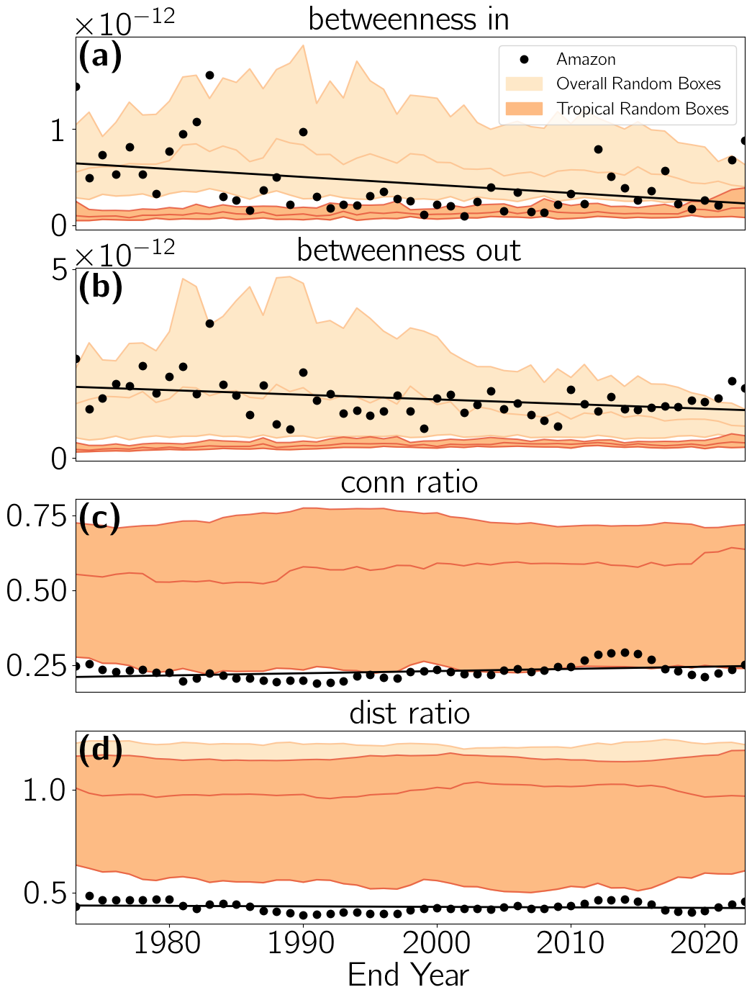

In [ ]:
# 0.1

vars = ['betweenness_in_', 'betweenness_out_', 'conn_ratio_', 'dist_ratio_']

def mid_and_bounds(data,p_val,mid_function=np.median):
  low = np.percentile(data, p_val, axis=1)
  upp = np.percentile(data, 100-p_val, axis=1)
  mid = mid_function(data, axis=1)

  return low, upp, mid

fontsize = 34

plt.rc('text', usetex=True)
plt.rc('xtick',labelsize=fontsize)
plt.rc('ytick',labelsize=fontsize)

p_val = 25
alpha = 1
alpha_bounds = 0.75
color_overall = '#fee8c8'
color_tropical = '#fdbb84'
color_mid_overall = '#fdbb84'
color_mid_tropical = '#e34a33'
ms = 7.5
lw = 2
legendsize = 18

xy_annotate = (0.005, 0.85)

fig, axs = plt.subplots(len(vars),1, sharex=True, figsize=(12,4*len(vars)))


for i_var in range(len(vars)):
  var = vars[i_var]
  ax = axs[i_var]


  var_amazon = globals()[var + 'amazon']
  ax.plot(np.arange(len(dates)),var_amazon,'ko',ms=ms,lw=lw,label='Amazon',zorder=3)
  p = np.polyfit(np.arange(len(dates)),var_amazon,1)
  print(p[0])
  ax.plot([np.arange(len(dates))[0],np.arange(len(dates))[-1]],[p[0]*np.arange(len(dates))[0]+p[1],p[0]*np.arange(len(dates))[-1]+p[1]],
          'k',lw=lw,zorder=3)


  var_overall = globals()[var + 'overall']
  low, upp, mid = mid_and_bounds(var_overall, p_val)

  ax.plot(np.arange(len(dates)),mid,color_mid_overall,alpha=alpha_bounds,zorder=2)
  ax.plot(np.arange(len(dates)),low,'-',c=color_mid_overall,alpha=alpha_bounds,zorder=2)
  ax.plot(np.arange(len(dates)),upp,'-',c=color_mid_overall,alpha=alpha_bounds,zorder=2)
  ax.fill_between(np.arange(len(dates)),low, upp, color=color_overall,
                  alpha=alpha,zorder=1,label='Overall Random Boxes')


  var_tropical = globals()[var + 'tropical']
  low, upp, mid = mid_and_bounds(var_tropical, p_val)

  ax.plot(np.arange(len(dates)),mid,color_mid_tropical,alpha=alpha_bounds,zorder=2)
  ax.plot(np.arange(len(dates)),low,'-',c=color_mid_tropical,alpha=alpha_bounds,zorder=2)
  ax.plot(np.arange(len(dates)),upp,'-',c=color_mid_tropical,alpha=alpha_bounds,zorder=2)
  ax.fill_between(np.arange(len(dates)),low, upp, color=color_tropical,
                  alpha=alpha,zorder=1,label='Tropical Random Boxes')


  ax.annotate(r'\textbf{('+chr(97+i_var)+')}', xy=xy_annotate, xycoords='axes fraction', fontsize=fontsize)

  xticks = np.arange(7,len(dates),10)
  xticklabels = [dates[i].split('-')[1] for i in xticks]
  ax.set_xticks(xticks)



  if i_var == len(vars) - 1:
    ax.set_xlabel('End Year', fontsize=fontsize)
    ax.set_xticklabels(xticklabels, fontsize=fontsize)

    ax.tick_params(bottom=True, top=False, left=True, right=False)
  elif i_var == 0:
    handles, labels = ax.get_legend_handles_labels()

    ax.legend(handles, labels, loc='upper right',prop={'size': legendsize})
    ax.tick_params(bottom=False, top=False, left=True, right=False)
  else:
    ax.tick_params(bottom=False, top=False, left=True, right=False)


  ax.set_title(var.replace('_',' '), fontsize=fontsize)

  ax.set_xlim(0,len(dates)-1)


plt.subplots_adjust(hspace=0.2)

plt.show()

[-8.3046057e-15]
[-1.22925714e-14]
[0.00072829]
[-0.00024311]


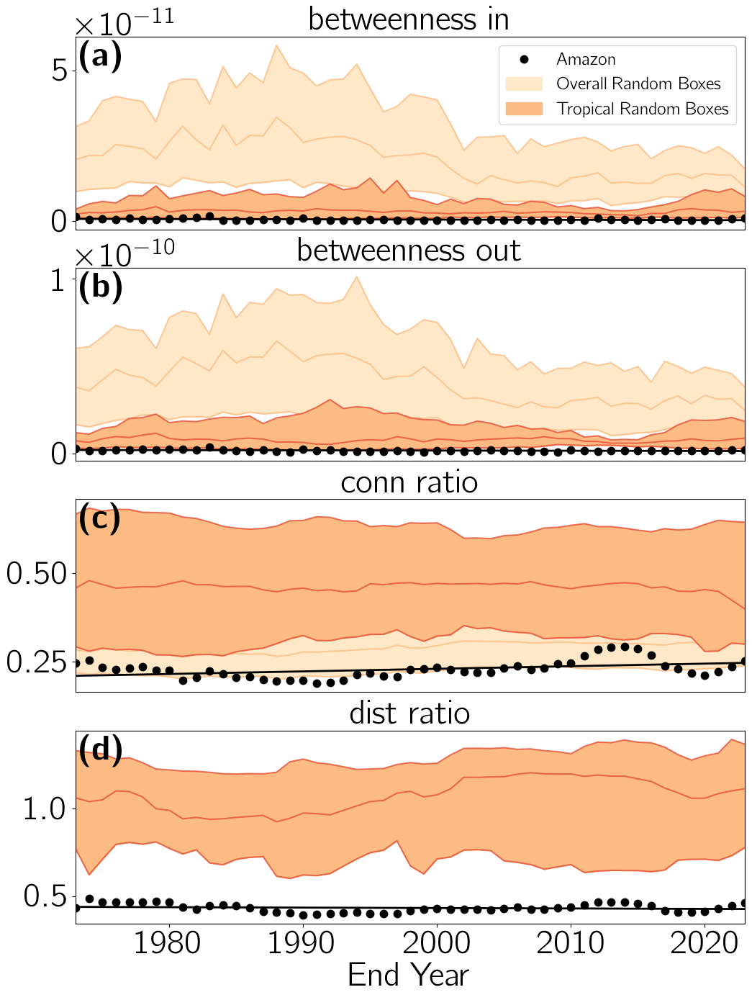

In [ ]:
# 0.025

vars = ['betweenness_in_', 'betweenness_out_', 'conn_ratio_', 'dist_ratio_']

def mid_and_bounds(data,p_val,mid_function=np.median):
  low = np.percentile(data, p_val, axis=1)
  upp = np.percentile(data, 100-p_val, axis=1)
  mid = mid_function(data, axis=1)

  return low, upp, mid

fontsize = 34

plt.rc('text', usetex=True)
plt.rc('xtick',labelsize=fontsize)
plt.rc('ytick',labelsize=fontsize)

p_val = 25
alpha = 1
alpha_bounds = 0.75
color_overall = '#fee8c8'
color_tropical = '#fdbb84'
color_mid_overall = '#fdbb84'
color_mid_tropical = '#e34a33'
ms = 7.5
lw = 2
legendsize = 18

xy_annotate = (0.005, 0.85)

fig, axs = plt.subplots(len(vars),1, sharex=True, figsize=(12,4*len(vars)))


for i_var in range(len(vars)):
  var = vars[i_var]
  ax = axs[i_var]


  var_amazon = globals()[var + 'amazon']
  ax.plot(np.arange(len(dates)),var_amazon,'ko',ms=ms,lw=lw,label='Amazon',zorder=3)
  p = np.polyfit(np.arange(len(dates)),var_amazon,1)
  print(p[0])
  ax.plot([np.arange(len(dates))[0],np.arange(len(dates))[-1]],[p[0]*np.arange(len(dates))[0]+p[1],p[0]*np.arange(len(dates))[-1]+p[1]],
          'k',lw=lw,zorder=3)


  var_overall = globals()[var + 'overall']
  low, upp, mid = mid_and_bounds(var_overall, p_val)

  ax.plot(np.arange(len(dates)),mid,color_mid_overall,alpha=alpha_bounds,zorder=2)
  ax.plot(np.arange(len(dates)),low,'-',c=color_mid_overall,alpha=alpha_bounds,zorder=2)
  ax.plot(np.arange(len(dates)),upp,'-',c=color_mid_overall,alpha=alpha_bounds,zorder=2)
  ax.fill_between(np.arange(len(dates)),low, upp, color=color_overall,
                  alpha=alpha,zorder=1,label='Overall Random Boxes')


  var_tropical = globals()[var + 'tropical']
  low, upp, mid = mid_and_bounds(var_tropical, p_val)

  ax.plot(np.arange(len(dates)),mid,color_mid_tropical,alpha=alpha_bounds,zorder=2)
  ax.plot(np.arange(len(dates)),low,'-',c=color_mid_tropical,alpha=alpha_bounds,zorder=2)
  ax.plot(np.arange(len(dates)),upp,'-',c=color_mid_tropical,alpha=alpha_bounds,zorder=2)
  ax.fill_between(np.arange(len(dates)),low, upp, color=color_tropical,
                  alpha=alpha,zorder=1,label='Tropical Random Boxes')


  ax.annotate(r'\textbf{('+chr(97+i_var)+')}', xy=xy_annotate, xycoords='axes fraction', fontsize=fontsize)

  xticks = np.arange(7,len(dates),10)
  xticklabels = [dates[i].split('-')[1] for i in xticks]
  ax.set_xticks(xticks)



  if i_var == len(vars) - 1:
    ax.set_xlabel('End Year', fontsize=fontsize)
    ax.set_xticklabels(xticklabels, fontsize=fontsize)

    ax.tick_params(bottom=True, top=False, left=True, right=False)
  elif i_var == 0:
    handles, labels = ax.get_legend_handles_labels()

    ax.legend(handles, labels, loc='upper right',prop={'size': legendsize})
    ax.tick_params(bottom=False, top=False, left=True, right=False)
  else:
    ax.tick_params(bottom=False, top=False, left=True, right=False)


  ax.set_title(var.replace('_',' '), fontsize=fontsize)

  ax.set_xlim(0,len(dates)-1)


plt.subplots_adjust(hspace=0.2)

plt.show()

In [ ]:
print(np.median(betweenness_in_overall, axis=1).shape)

(51,)


[-8.3046057e-15]


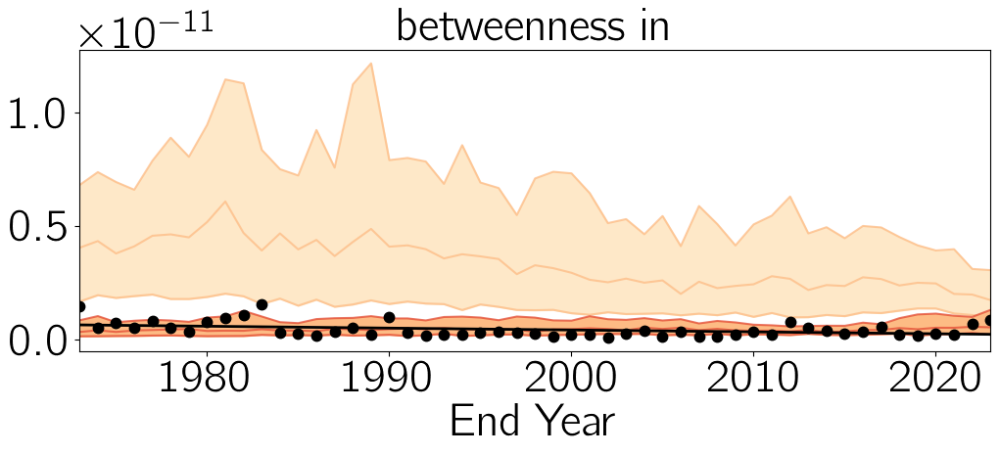

[-1.22925714e-14]


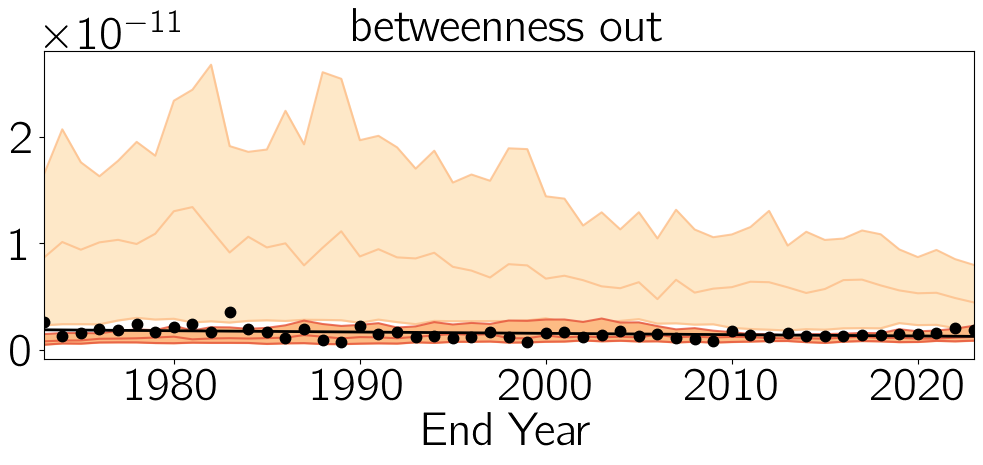

[0.00072829]


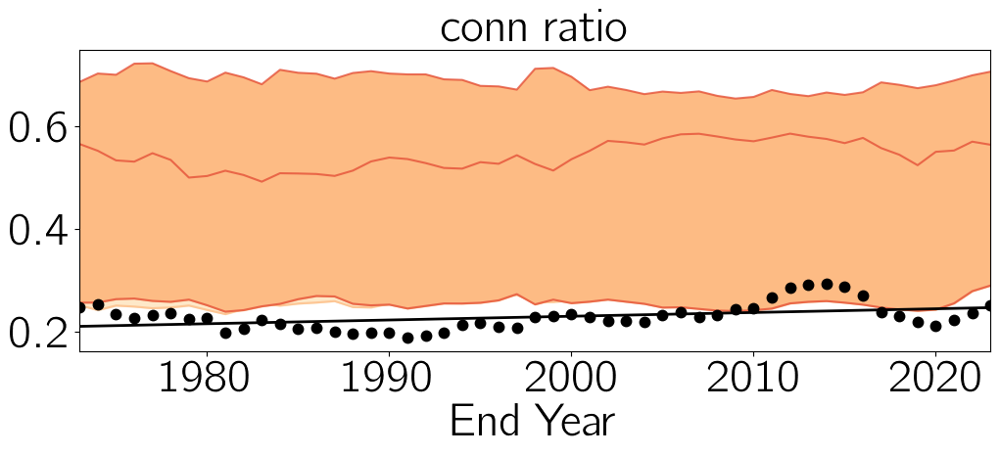

[-0.00024311]


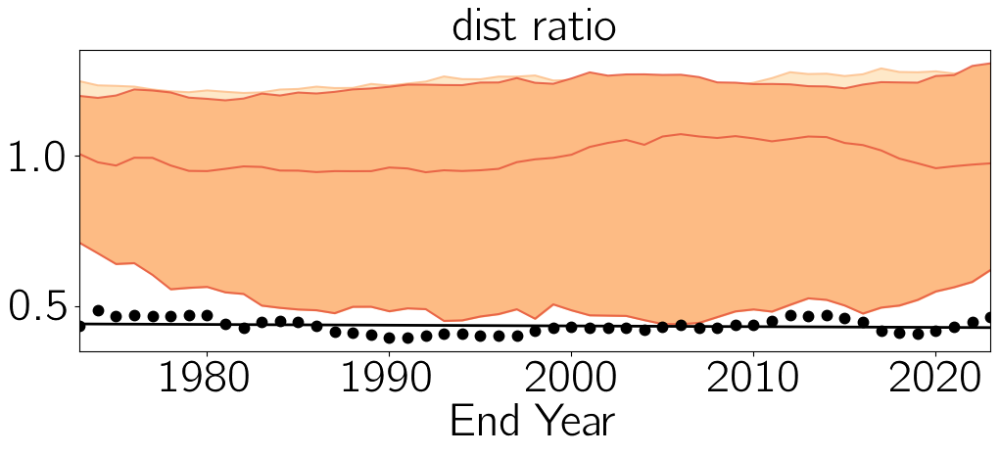

[-0.00729916]


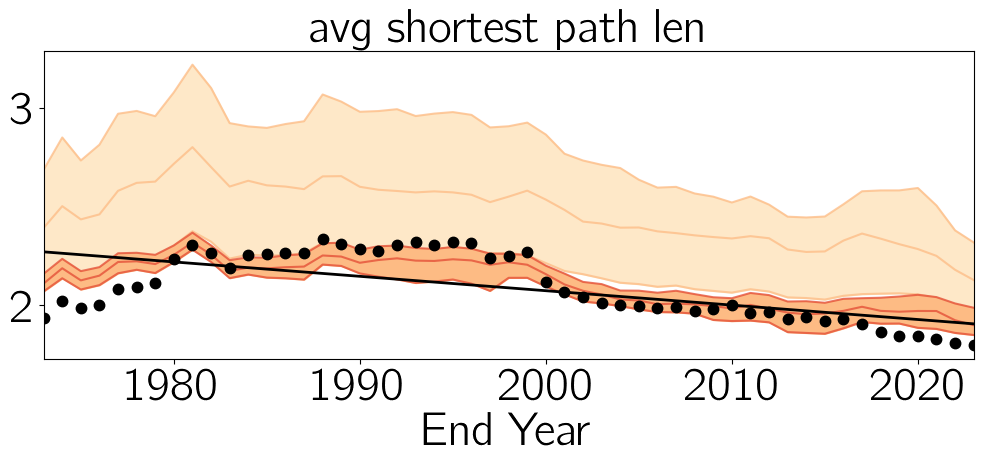

[14.02776315]


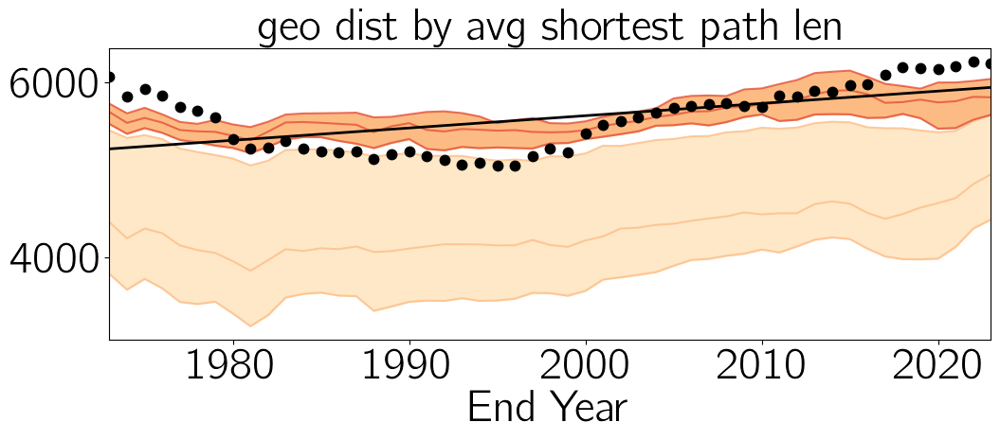

In [ ]:
vars = ['betweenness_in_', 'betweenness_out_', 'conn_ratio_', 'dist_ratio_', 'avg_shortest_path_len_', 'geo_dist_by_avg_shortest_path_len_']

def mid_and_bounds(data,p_val,mid_function=np.median):
  low = np.percentile(data, p_val, axis=1)
  upp = np.percentile(data, 100-p_val, axis=1)
  mid = mid_function(data, axis=1)

  return low, upp, mid

for var in vars:
  fontsize = 34

  plt.rc('text', usetex=True)
  plt.rc('xtick',labelsize=fontsize)
  plt.rc('ytick',labelsize=fontsize)

  p_val = 25
  alpha = 1
  alpha_bounds = 0.75
  color_overall = '#fee8c8'
  color_tropical = '#fdbb84'
  color_mid_overall = '#fdbb84'
  color_mid_tropical = '#e34a33'
  ms = 7.5
  lw = 2

  fig, ax = plt.subplots(1,1, figsize=(12,4))

  var_amazon = globals()[var + 'amazon']
  ax.plot(np.arange(len(dates)),var_amazon,'ko',ms=ms,lw=lw,label='Amazon',zorder=3)
  p = np.polyfit(np.arange(len(dates)),var_amazon,1)
  print(p[0])
  ax.plot([np.arange(len(dates))[0],np.arange(len(dates))[-1]],[p[0]*np.arange(len(dates))[0]+p[1],p[0]*np.arange(len(dates))[-1]+p[1]],
          'k',lw=lw,zorder=3)


  var_overall = globals()[var + 'overall']
  low, upp, mid = mid_and_bounds(var_overall, p_val)

  ax.plot(np.arange(len(dates)),mid,color_mid_overall,alpha=alpha_bounds,zorder=2)
  ax.plot(np.arange(len(dates)),low,'-',c=color_mid_overall,alpha=alpha_bounds,zorder=2)
  ax.plot(np.arange(len(dates)),upp,'-',c=color_mid_overall,alpha=alpha_bounds,zorder=2)
  ax.fill_between(np.arange(len(dates)),low, upp, color=color_overall,
                  alpha=alpha,zorder=1,label='Overall Random Boxes')


  var_tropical = globals()[var + 'tropical']
  low, upp, mid = mid_and_bounds(var_tropical, p_val)

  ax.plot(np.arange(len(dates)),mid,color_mid_tropical,alpha=alpha_bounds,zorder=2)
  ax.plot(np.arange(len(dates)),low,'-',c=color_mid_tropical,alpha=alpha_bounds,zorder=2)
  ax.plot(np.arange(len(dates)),upp,'-',c=color_mid_tropical,alpha=alpha_bounds,zorder=2)
  ax.fill_between(np.arange(len(dates)),low, upp, color=color_tropical,
                  alpha=alpha,zorder=1,label='Tropical Random Boxes')


  xticks = np.arange(7,len(dates),10)
  xticklabels = [dates[i].split('-')[1] for i in xticks]
  ax.set_xticks(xticks)
  ax.set_xticklabels(xticklabels, fontsize=fontsize)


  ax.set_xlabel('End Year', fontsize=fontsize)
  ax.set_title(var.replace('_',' '), fontsize=fontsize)

  ax.set_xlim(0,len(dates)-1)

  plt.show()




[-8.3046057e-15]
[-1.22925714e-14]
[0.00072829]
[-0.00024311]
[-0.00729916]
[14.02776315]


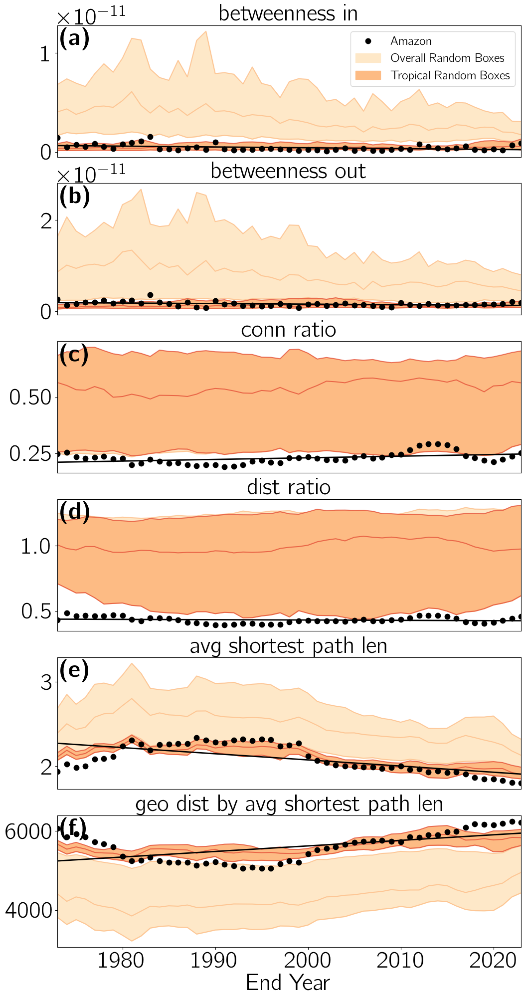

In [ ]:
vars = ['betweenness_in_', 'betweenness_out_', 'conn_ratio_', 'dist_ratio_', 'avg_shortest_path_len_', 'geo_dist_by_avg_shortest_path_len_']

def mid_and_bounds(data,p_val,mid_function=np.median):
  low = np.percentile(data, p_val, axis=1)
  upp = np.percentile(data, 100-p_val, axis=1)
  mid = mid_function(data, axis=1)

  return low, upp, mid

fontsize = 34

plt.rc('text', usetex=True)
plt.rc('xtick',labelsize=fontsize)
plt.rc('ytick',labelsize=fontsize)

p_val = 25
alpha = 1
alpha_bounds = 0.75
color_overall = '#fee8c8'
color_tropical = '#fdbb84'
color_mid_overall = '#fdbb84'
color_mid_tropical = '#e34a33'
ms = 7.5
lw = 2
legendsize = 18

xy_annotate = (0.005, 0.85)

fig, axs = plt.subplots(len(vars),1, sharex=True, figsize=(12,4*len(vars)))


for i_var in range(len(vars)):
  var = vars[i_var]
  ax = axs[i_var]


  var_amazon = globals()[var + 'amazon']
  ax.plot(np.arange(len(dates)),var_amazon,'ko',ms=ms,lw=lw,label='Amazon',zorder=3)
  p = np.polyfit(np.arange(len(dates)),var_amazon,1)
  print(p[0])
  ax.plot([np.arange(len(dates))[0],np.arange(len(dates))[-1]],[p[0]*np.arange(len(dates))[0]+p[1],p[0]*np.arange(len(dates))[-1]+p[1]],
          'k',lw=lw,zorder=3)


  var_overall = globals()[var + 'overall']
  low, upp, mid = mid_and_bounds(var_overall, p_val)

  ax.plot(np.arange(len(dates)),mid,color_mid_overall,alpha=alpha_bounds,zorder=2)
  ax.plot(np.arange(len(dates)),low,'-',c=color_mid_overall,alpha=alpha_bounds,zorder=2)
  ax.plot(np.arange(len(dates)),upp,'-',c=color_mid_overall,alpha=alpha_bounds,zorder=2)
  ax.fill_between(np.arange(len(dates)),low, upp, color=color_overall,
                  alpha=alpha,zorder=1,label='Overall Random Boxes')


  var_tropical = globals()[var + 'tropical']
  low, upp, mid = mid_and_bounds(var_tropical, p_val)

  ax.plot(np.arange(len(dates)),mid,color_mid_tropical,alpha=alpha_bounds,zorder=2)
  ax.plot(np.arange(len(dates)),low,'-',c=color_mid_tropical,alpha=alpha_bounds,zorder=2)
  ax.plot(np.arange(len(dates)),upp,'-',c=color_mid_tropical,alpha=alpha_bounds,zorder=2)
  ax.fill_between(np.arange(len(dates)),low, upp, color=color_tropical,
                  alpha=alpha,zorder=1,label='Tropical Random Boxes')


  ax.annotate(r'\textbf{('+chr(97+i_var)+')}', xy=xy_annotate, xycoords='axes fraction', fontsize=fontsize)

  xticks = np.arange(7,len(dates),10)
  xticklabels = [dates[i].split('-')[1] for i in xticks]
  ax.set_xticks(xticks)



  if i_var == len(vars) - 1:
    ax.set_xlabel('End Year', fontsize=fontsize)
    ax.set_xticklabels(xticklabels, fontsize=fontsize)

    ax.tick_params(bottom=True, top=False, left=True, right=False)
  elif i_var == 0:
    handles, labels = ax.get_legend_handles_labels()

    ax.legend(handles, labels, loc='upper right',prop={'size': legendsize})
    ax.tick_params(bottom=False, top=False, left=True, right=False)
  else:
    ax.tick_params(bottom=False, top=False, left=True, right=False)


  ax.set_title(var.replace('_',' '), fontsize=fontsize)

  ax.set_xlim(0,len(dates)-1)


plt.subplots_adjust(hspace=0.2)

plt.show()




In [ ]:
print([dates[i].split('-')[1] for i in np.arange(7,len(dates),10)])

['1980', '1990', '2000', '2010', '2020']


In [ ]:
vars = ['avg_shortest_path_len_overall', 'geo_dist_by_avg_shortest_path_len_overall',
        'avg_shortest_path_len_tropical', 'geo_dist_by_avg_shortest_path_len_tropical']

with gzip.open(random_box_dir + 'shortest_paths,date=1948-1973.data', 'rb') as file:
  for var in vars:
    exec(var + ' = pkl.load(file)')
    # pkl.dump(locals()[var][date_num,:],file)

In [ ]:
print(avg_shortest_path_len_overall)

[2.14153754 2.05726479 2.63672457 2.97508438 3.08926621 2.93062035 2.11859356 2.48402144 2.17455268 2.17654652]


In [ ]:
print(np.arange(0,len(dates),10))

[ 0 10 20 30 40 50]


In [ ]:
betweenness_in_overall, betweenness_out_overall, conn_ratio_overall, dist_ratio_overall, betweenness_in_tropical, betweenness_out_tropical, conn_ratio_tropical, dist_ratio_tropical = results

In [ ]:
vars = ['betweenness_in_overall', 'betweenness_out_overall', 'conn_ratio_overall', 'dist_ratio_overall',
        'betweenness_in_tropical', 'betweenness_out_tropical', 'conn_ratio_tropical', 'dist_ratio_tropical']


with gzip.open(random_box_dir + 'test' + '.data', 'wb') as file:
  for var in vars:
    pkl.dump(locals()[var],file)


In [ ]:
print(target_nodes)

NameError: ignored

In [ ]:
ind = np.where(np.in1d(all_edges[:,0],target_nodes) == True)[0]
print(all_edges[ind])

[[2987 9861]
 [2987 9921]
 [2987 5774]
 ...
 [3871 4547]
 [3871 4551]
 [3871 4561]]


In [ ]:
edges1 = all_edges[np.union1d(np.where(np.in1d(all_edges[:,0],target_nodes) == True)[0],np.where(np.in1d(all_edges[:,1],target_nodes) == True)[0])]
edges2 = np.array(list(G.edges(target_nodes)))

for e in edges2:
  if e not in edges1 and e[::-1] not in edges1:
    print(e)

In [ ]:
for e in edges2:
  if e[0] >= e[1]:
    print(e)

In [ ]:
print(edges1[0])

[ 433 3042]


In [ ]:
print([1173, 2987] in edges2)

False


In [ ]:
print([2987, 1173] in edges2)

True


In [ ]:
print(np.array([2987, 9861]) in edges2)

True


In [ ]:
print()
print()

[[ 433 3042]
 [ 606 3101]
 [ 617 3101]
 ...
 [3871 4547]
 [3871 4551]
 [3871 4561]]
[[2987 9861]
 [2987 9921]
 [2987 5774]
 ...
 [3871 4547]
 [3871 4551]
 [3871 4561]]


In [ ]:
%timeit edges = all_edges[np.union1d(np.where(np.in1d(all_edges[:,0],target_nodes) == True)[0],np.where(np.in1d(all_edges[:,1],target_nodes) == True)[0])]

38.5 ms ± 7.5 ms per loop (mean ± std. dev. of 7 runs, 10 loops each)


In [ ]:
%timeit edges_in = edges[np.intersect1d(np.where(np.in1d(edges[:,0],target_nodes) == True)[0],np.where(np.in1d(edges[:,1],target_nodes) == True)[0])]

5.39 ms ± 1.13 ms per loop (mean ± std. dev. of 7 runs, 100 loops each)


In [ ]:
%timeit edges_out = edges[np.setdiff1d(np.where(np.in1d(edges[:,0],target_nodes) == True)[0],np.where(np.in1d(edges[:,1],target_nodes) == True)[0])]

3.25 ms ± 265 µs per loop (mean ± std. dev. of 7 runs, 100 loops each)


In [ ]:
%%timeit

#### OVERALL
# with gzip.open(data_dir + 'G'+dir_end+date+'.data', 'rb') as file:
#   G = pkl.load(file)

target_nodes = target_nodes_lst_overall[0]
edges = np.array(list(G.edges(target_nodes)))

edges_in = np.array([sorted(e) for e in edges if e[0] in target_nodes and e[1] in target_nodes])
edges_out = np.array([sorted(e) for e in edges if e[1] not in target_nodes or e[1] not in target_nodes])



# # Avg shortest path from contracted box
# non_target_nodes = sorted(list(set(range(num_nodes)) - set(target_nodes)))
# for node in target_nodes[1:]:
#   nx.contracted_nodes(G, target_nodes[0], node, copy=False)

# paths = nx.single_source_shortest_path(G, target_nodes[0])
# shortest_paths_from_box = [paths[node] for node in non_target_nodes]

# avg_shortest_path_len_overall[date_num,0] = np.mean([len(p)-1 for p in shortest_paths_from_box])
# geo_dist_by_avg_shortest_path_len_overall[date_num,0] = np.mean([geodesic_distances[p[0],p[-1]]/(len(p)-1) for p in shortest_paths_from_box])


# Connectivity ratio
# len(edges_out)/len(edges)


# Distance ratio
# np.mean(geodesic_distances[edges_out[:,0],edges_out[:,1]])/np.mean(geodesic_distances[edges[:,0],edges[:,1]])
#### END OVERALL

1.25 s ± 256 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


In [ ]:
%%timeit

# Betweenness
np.mean([edge_betweenness[tuple(e)] for e in edges_in])/np.mean(geodesic_distances[edges[:,0],edges[:,1]])
np.mean([edge_betweenness[tuple(e)] for e in edges_out])/np.mean(geodesic_distances[edges[:,0],edges[:,1]])


891 ms ± 130 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


In [ ]:
print(np.mean([edge_betweenness[tuple(e)] for e in edges_in])/np.mean(geodesic_distances[edges[:,0],edges[:,1]]))
print(np.mean([edge_betweenness[tuple(e)] for e in edges_out])/np.mean(geodesic_distances[edges[:,0],edges[:,1]]))

4.175340122996859e-12
4.422688500983232e-12


In [ ]:
edge_betweenness_mat = np.zeros((num_nodes,num_nodes))
for e in G.edges:
  edge_betweenness_mat[e] = edge_betweenness[tuple(e)]

In [ ]:
print(edge_betweenness_mat[edges[:,0],edges[:,1]].shape)

(60130,)


In [ ]:
%%timeit

# Betweenness
np.mean(edge_betweenness_mat[edges_in[:,0],edges_in[:,1]])/np.mean(geodesic_distances[edges[:,0],edges[:,1]])
np.mean(edge_betweenness_mat[edges_out[:,0],edges_out[:,1]])/np.mean(geodesic_distances[edges[:,0],edges[:,1]])


2.49 ms ± 161 µs per loop (mean ± std. dev. of 7 runs, 100 loops each)


In [ ]:
print(np.mean(edge_betweenness_mat[edges_in[:,0],edges_in[:,1]])/np.mean(geodesic_distances[edges[:,0],edges[:,1]]))
print(np.mean(edge_betweenness_mat[edges_out[:,0],edges_out[:,1]])/np.mean(geodesic_distances[edges[:,0],edges[:,1]]))

4.175340122996859e-12
4.422688500983232e-12


In [ ]:
%%timeit
len(edges_out)/len(edges)

183 ns ± 9.12 ns per loop (mean ± std. dev. of 7 runs, 10000000 loops each)


In [ ]:
%%timeit
np.mean(geodesic_distances[edges_out[:,0],edges_out[:,1]])/np.mean(geodesic_distances[edges[:,0],edges[:,1]])

10.8 ms ± 89.7 µs per loop (mean ± std. dev. of 7 runs, 100 loops each)


In [ ]:
edges = np.array(list(G.edges(target_nodes)))

print([e for e in edges][:10])

[array([7003, 9992]), array([7003,   16]), array([7003,   17]), array([7003,   95]), array([7003,  105]), array([7003,  157]), array([7003,  178]), array([7003,  236]), array([7003,  289]), array([7003,  349])]


In [ ]:
with gzip.open(data_dir+'edge_betweenness'+dir_end+dates[0]+'.data', 'rb') as file:
  edge_betweenness = pkl.load(file)

with gzip.open(graph_dir+dates[0]+'.data', 'rb') as file:
  G = pkl.load(file)

In [ ]:
for e in G.edges:
  if e not in edge_betweenness:
    print(e)

In [ ]:
print(target_nodes_lst_tropical[0])

[7003 7004 7007 7008 7013 7023 7024 7029 7030 7041 7046 7047 7052 7058 7059 7066 7067 7078 7082 7083 7090 7091 7096 7105 7106 7113 7119 7120 7129 7130 7137 7141 7142 7153 7155 7166 7167 7174 7176 7177 7188 7189 7204 7205 7206 7214 7215 7225 7226
 7239 7240 7241 7253 7254 7263 7264 7269 7273 7280 7290 7291 7300 7301 7306 7318 7319 7326 7327 7332 7334 7345 7353 7354 7363 7364 7373 7379 7380 7385 7386 7399 7404 7410 7416 7417 7424 7425 7442 7448 7449 7454 7455 7460 7467 7473 7481 7482 7489
 7490 7505 7511 7512 7515 7516 7521 7540 7544 7548 7549 7552 7553 7572 7578 7579 7582 7583 7586 7605 7607 7611 7612 7615 7616 7643 7645 7646 7647 7648 7649 7674 7676 7678 7679 7680 7681 7710 7711 7712 7713 7714 7715 7745 7746 7747 7748 7749 7751
 7777 7778 7779 7780 7781 7782 7810 7811 7814 7815 7818 7820 7840 7843 7844 7847 7848 7853 7873 7874 7877 7878 7881 7885 7905]


In [ ]:
target_nodes = target_nodes_lst_tropical[0]
edges = np.array(list(G.edges(target_nodes)))

edges_in = np.array([sorted(e) for e in edges if e[0] in target_nodes and e[1] in target_nodes])
edges_out = np.array([sorted(e) for e in edges if e[1] not in target_nodes or e[1] not in target_nodes])

In [ ]:
np.mean([edge_betweenness[tuple(e)] for e in edges_in])
np.mean([edge_betweenness[tuple(e)] for e in edges_out])

3.1100108548796658e-09

In [ ]:
print((0,1) in G.edges)

True


In [ ]:
#### TROPICAL
      target_nodes = target_nodes_lst_tropical[sample_num]
      edges = np.array(list(G.edges(target_nodes)))

      edges_in = np.array([sorted(e) for e in edges if e[0] in target_nodes and e[1] in target_nodes])
      edges_out = np.array([sorted(e) for e in edges if e[1] not in target_nodes or e[1] not in target_nodes])


      # Betweenness
      betweenness_in_tropical[date_num,sample_num] = np.mean([edge_betweenness[tuple(e)] for e in edges_in])/np.mean(geodesic_distances[edges[:,0],edges[:,1]])
      betweenness_out_tropical[date_num,sample_num] = np.mean([edge_betweenness[tuple(e)] for e in edges_out])/np.mean(geodesic_distances[edges[:,0],edges[:,1]])


      # Avg shortest path from contracted box
      with gzip.open(data_dir + 'G'+dir_end+date+'.data', 'rb') as file:
        G = pkl.load(file)

      non_target_nodes = sorted(list(set(range(num_nodes)) - set(target_nodes)))
      for node in target_nodes[1:]:
        nx.contracted_nodes(G, target_nodes[0], node, copy=False)

      paths = nx.single_source_shortest_path(G, target_nodes[0])
      shortest_paths_from_box = [paths[node] for node in non_target_nodes]

      avg_shortest_path_len_tropical[date_num,sample_num] = np.mean([len(p)-1 for p in shortest_paths_from_box])
      geo_dist_by_avg_shortest_path_len_tropical[date_num,sample_num] = np.mean([geodesic_distances[p[0],p[-1]]/(len(p)-1) for p in shortest_paths_from_box])


      # Connectivity ratio
      conn_ratio_tropical[date_num,sample_num] = len(edges_out)/len(edges)


      # Distance ratio
      dist_ratio_tropical[date_num,sample_num] = np.mean(geodesic_distances[edges_out[:,0],edges_out[:,1]])/np.mean(geodesic_distances[edges[:,0],edges[:,1]])
      #### END TROPICAL

# Network Metrics

In [11]:
ks = [50, 100, 250, 500, 1000]

betweenness_dict = {}
recompute = False

if recompute:
  for k in ks:
    dir_end = '-months={:},offset={:},k={:}/'.format(months,offset,k)

    betw_dir = data_dir + 'betweenness' + dir_end

    betweenness_dict[k] = np.zeros((len(dates),len(amazon_nodes)))

    for i in trange(len(dates)):
      date = dates[i]
      with gzip.open(betw_dir + date + '.data', 'rb') as file:
        betw = pkl.load(file)

      for j in range(len(amazon_nodes)):
        betweenness_dict[k][i,j] = betw[amazon_nodes[j]]

  densities = [0.005, 0.01, 0.025, 0.05, 0.1]

  for density in densities:
    dir_end = '-months={:},offset={:},density={:}/'.format(months,offset,density)

    betw_dir = data_dir + 'betweenness' + dir_end

    betweenness_dict[density] = np.zeros((len(dates),len(amazon_nodes)))

    for i in trange(len(dates)):
      date = dates[i]
      with gzip.open(betw_dir + date + '.data', 'rb') as file:
        betw = pkl.load(file)

      for j in range(len(amazon_nodes)):
        betweenness_dict[density][i,j] = betw[amazon_nodes[j]]

  with gzip.open(data_dir + 'amazon_betweenness.data', 'wb') as file:
    pkl.dump(betweenness_dict, file)
else:
  with gzip.open(data_dir + 'amazon_betweenness.data', 'rb') as file:
    betweenness_dict = pkl.load(file)

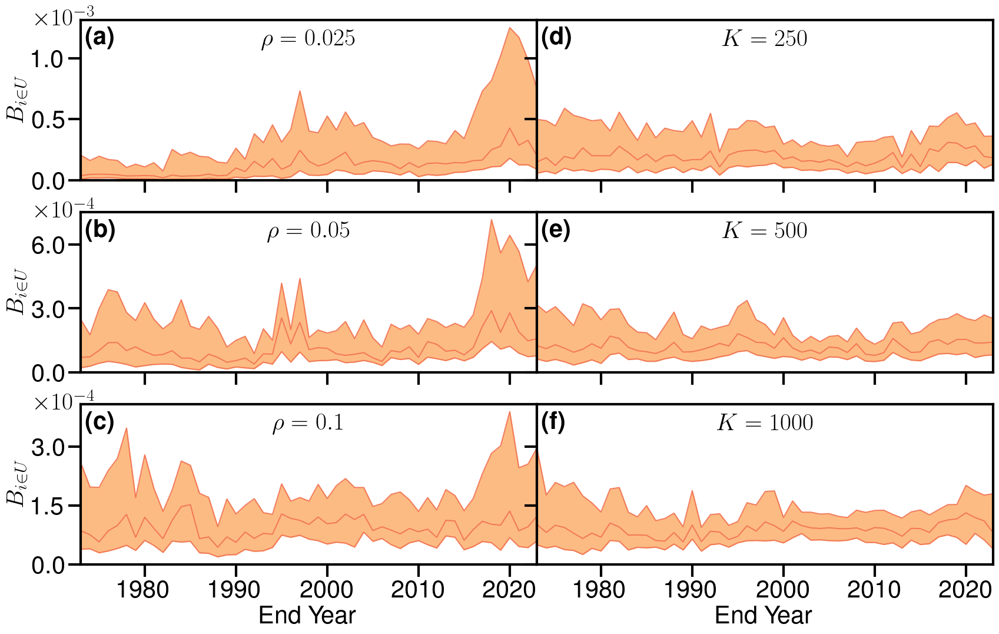

In [14]:
from matplotlib.ticker import ScalarFormatter

ks = [250, 500, 1000]
densities = [0.025, 0.05, 0.1]

class MagnitudeFormatter(mpl.ticker.ScalarFormatter):
    def __init__(self, exponent=None):
        super().__init__()
        self._fixed_exponent = exponent

    def _set_order_of_magnitude(self):
        if self._fixed_exponent:
            self.orderOfMagnitude = self._fixed_exponent
        else:
            super()._set_order_of_magnitude()

def mid_and_bounds(data,p_val,mid_function=np.median):
  low = np.percentile(data, p_val, axis=1)
  upp = np.percentile(data, 100-p_val, axis=1)
  mid = mid_function(data, axis=1)

  return low, upp, mid

fontsize = 30

plt.rc('text', usetex=True)
plt.rc('xtick',labelsize=fontsize)
plt.rc('ytick',labelsize=fontsize)

p_val = 25
alpha = 1
alpha_bounds = 0.75
color_bounds = '#fee8c8'
color = '#fdbb84'
color_mid = '#ef6548'
ms = 7.5
lw = 2
legendsize = 18

xy_annotate = (0.01, 0.85)

fig, axs = plt.subplots(max(len(ks),len(densities)), 2, sharex=True, sharey=False, figsize=(20,4*max(len(ks),len(densities))))

max_value = 0

for i in range(len(ks)+len(densities)):


  if i < len(densities):
    betweenness = betweenness_dict[densities[i]]
    title = r'$\rho=' + str(densities[i]) + r'$'
    ax = axs[i,0]

    if i == len(densities) - 1:
      ax.set_xlabel('End Year', fontsize=fontsize)
      ax.set_xticklabels(xticklabels, fontsize=fontsize)

    #   ax.tick_params(bottom=True, top=False, left=True, right=False)
    # elif i == 0:
      # handles, labels = ax.get_legend_handles_labels()

    #   # ax.legend(handles, labels, loc='upper right',prop={'size': legendsize})
    #   ax.tick_params(bottom=False, top=False, left=True, right=False)
    # else:
    #   ax.tick_params(bottom=False, top=False, left=True, right=False)
  else:
    betweenness = betweenness_dict[ks[i-len(densities)]]
    title = r'$K=' + str(ks[i-len(densities)]) + r'$'
    ax = axs[i-len(densities),1]
    ax.sharey(axs[i-len(densities),0])

    plt.setp(ax.get_yticklabels(), visible=False)

    if i == len(densities) + len(ks) - 1:
      ax.set_xlabel('End Year', fontsize=fontsize)
      ax.set_xticklabels(xticklabels, fontsize=fontsize)

    #   ax.tick_params(bottom=True, top=False, left=True, right=False)
    # elif i == len(densities):
      # handles, labels = ax.get_legend_handles_labels()

      # ax.legend(handles, labels, loc='upper right',prop={'size': legendsize})
    #   ax.tick_params(bottom=False, top=False, left=True, right=False)
    # else:
    #   ax.tick_params(bottom=False, top=False, left=True, right=False)

  # low, upp, mid = mid_and_bounds(betweenness, 5)

  # ax.plot(np.arange(len(dates)),mid,color,alpha=alpha_bounds,zorder=2)
  # ax.plot(np.arange(len(dates)),low,'-',c=color,alpha=alpha_bounds,zorder=2)
  # ax.plot(np.arange(len(dates)),upp,'-',c=color,alpha=alpha_bounds,zorder=2)
  # ax.fill_between(np.arange(len(dates)),low, upp, color=color_bounds,
  #                 alpha=alpha,zorder=1)

  low, upp, mid = mid_and_bounds(betweenness, p_val)

  ax.plot(np.arange(len(dates)),mid,color_mid,alpha=alpha_bounds,zorder=2)
  ax.plot(np.arange(len(dates)),low,'-',c=color_mid,alpha=alpha_bounds,zorder=2)
  ax.plot(np.arange(len(dates)),upp,'-',c=color_mid,alpha=alpha_bounds,zorder=2)
  ax.fill_between(np.arange(len(dates)),low, upp, color=color,
                  alpha=alpha,zorder=1)

  max_value = None#max(max_value, np.max(upp))


  ax.annotate(r'\textbf{('+chr(97+i)+')}', xy=xy_annotate, xycoords='axes fraction', fontsize=fontsize)

  xticks = np.arange(7,len(dates),10)
  xticklabels = [dates[i].split('-')[1] for i in xticks]
  ax.set_xticks(xticks)

  if i < len(densities):
    ax.set_ylabel(r'$B_{i\in U}$', fontsize=fontsize)



  # if i == len(densities) or i == len(ks):
  #   ax.set_xlabel('End Year', fontsize=fontsize)
  #   ax.set_xticklabels(xticklabels, fontsize=fontsize)

  #   ax.tick_params(bottom=True, top=False, left=True, right=False)
  # elif i == 0 or i == len(densities):
  #   handles, labels = ax.get_legend_handles_labels()

  #   ax.legend(handles, labels, loc='upper right',prop={'size': legendsize})
  #   ax.tick_params(bottom=False, top=False, left=True, right=False)
  # else:
  #   ax.tick_params(bottom=False, top=False, left=True, right=False)


  # ax.set_title(title, fontsize=fontsize)
  ax.annotate(title, xy=(0.5,0.95), xycoords='axes fraction', ha='center', va='top', fontsize=fontsize)

  ax.set_xlim(0,len(dates)-1)

  ax.tick_params(length=15,width=3)
  plt.setp(ax.spines.values(), linewidth=3, zorder=10)

  # fmt = ScalarFormatter()
  # fmt.set_powerlimits((-3,3))
  # ax.yaxis.set_major_formatter(fmt)
  # plt.ticklabel_format(style='sci', axis='y')
  # print(ax.yaxis.get_major_formatter().__dict__)

  ax.set_xlim(0,len(dates)-1)
  ax.set_ylim(0,max_value)

  ax.yaxis.set_major_locator(plt.MaxNLocator(3))



  yticks = ax.get_yticks()[:-1]

  multiplier = int('{:e}'.format(yticks[-1]).split('e')[1])
  fmt = MagnitudeFormatter(multiplier)
  ax.yaxis.set_major_formatter(fmt)
  # plt.ticklabel_format(style='sci', axis='y')
  # print(ax.yaxis.get_major_formatter().__dict__)
  ax.yaxis.offsetText.set_visible(False)

  # print(yticks)
  ax.set_yticks(yticks)
  ax.set_yticklabels(['{:.1f}'.format(ytick/10**multiplier) for ytick in yticks])

  if multiplier != 0 and i < len(densities):
      ax.annotate(r'$\times 10^{'+str(multiplier)+r'}$', xy=(-0.1,1.02), xycoords='axes fraction', ha='left', va='center', fontsize=fontsize)

plt.subplots_adjust(hspace=0.2, wspace=0.0)

fig.align_labels()

title = 'Betweenness of Amazon'
# plt.savefig(fig_dir+title+'.jpg',bbox_inches='tight',pad_inches=0.2, dpi=300)
# plt.savefig(fig_dir+title+'.pdf',bbox_inches='tight',pad_inches=0.2, dpi=300)

plt.show()

In [15]:
ks = [50, 100, 250, 500, 1000]

edge_betweenness_dict = {}
recompute = False

if recompute:
  for k in ks:
    dir_end = '-months={:},offset={:},k={:}/'.format(months,offset,k)

    graph_dir = data_dir + 'G' + dir_end

    with gzip.open(graph_dir+dates[0]+'.data', 'rb') as file:
      G = pkl.load(file)

    is_digraph = type(G) == type(nx.DiGraph())

    betw_dir = data_dir + 'edge_betweenness' + dir_end

    if is_digraph:
      edge_betweenness_dict[k] = {'in':[],
                                  'out':{'in':[],'out':[]}}
    else:
      edge_betweenness_dict[k] = {'in':[],
                                  'out':[]}

    for i in trange(len(dates)):
      date = dates[i]

      all_edges = np.array([e for e in G.edges])


      with gzip.open(betw_dir + date + '.data', 'rb') as file:
        edge_betweenness = pkl.load(file)

      with gzip.open(graph_dir+date+'.data', 'rb') as file:
        G = pkl.load(file)

      edge_betweenness_mat = np.zeros((num_nodes,num_nodes))
      for e in G.edges:
        edge_betweenness_mat[e] = edge_betweenness[tuple(e)]


      edges = all_edges[np.union1d(np.where(np.in1d(all_edges[:,0],amazon_nodes) == True)[0],np.where(np.in1d(all_edges[:,1],amazon_nodes) == True)[0])]

      # edges_in = np.array([sorted(e) for e in edges if e[0] in amazon_nodes and e[1] in amazon_nodes])
      # edges_out = np.array([sorted(e) for e in edges if e[1] not in amazon_nodes or e[1] not in amazon_nodes])
      edges_in = edges[np.intersect1d(np.where(np.in1d(edges[:,0],amazon_nodes) == True)[0],np.where(np.in1d(edges[:,1],amazon_nodes) == True)[0])]
      if is_digraph:
        edges_out = {'in':edges[np.intersect1d(np.where(np.in1d(edges[:,0],amazon_nodes) == False)[0],np.where(np.in1d(edges[:,1],amazon_nodes) == True)[0])],
                      'out':edges[np.intersect1d(np.where(np.in1d(edges[:,0],amazon_nodes) == True)[0],np.where(np.in1d(edges[:,1],amazon_nodes) == False)[0])]}
      else:
        edges_out = edges[np.setdiff1d(np.where(np.in1d(edges[:,0],amazon_nodes) == True)[0],np.where(np.in1d(edges[:,1],amazon_nodes) == True)[0])]

      edge_betweenness_dict[k]['in'].append(edge_betweenness_mat[edges_in[:,0],edges_in[:,1]])
      if is_digraph:
        edge_betweenness_dict[k]['out']['in'].append(edge_betweenness_mat[edges_out['in'][:,0],edges_out['in'][:,1]])
        edge_betweenness_dict[k]['out']['out'].append(edge_betweenness_mat[edges_out['out'][:,0],edges_out['out'][:,1]])
      else:
        edge_betweenness_dict[k]['out'].append(edge_betweenness_mat[edges_out[:,0],edges_out[:,1]])


  densities = [0.005, 0.01, 0.025, 0.05, 0.1]

  for density in densities:
    dir_end = '-months={:},offset={:},density={:}/'.format(months,offset,density)

    graph_dir = data_dir + 'G' + dir_end

    with gzip.open(graph_dir+dates[0]+'.data', 'rb') as file:
      G = pkl.load(file)

    is_digraph = type(G) == type(nx.DiGraph())

    betw_dir = data_dir + 'edge_betweenness' + dir_end

    if is_digraph:
      edge_betweenness_dict[density] = {'in':[],
                                  'out':{'in':[],'out':[]}}
    else:
      edge_betweenness_dict[density] = {'in':[],
                                  'out':[]}

    for i in trange(len(dates)):
      date = dates[i]

      all_edges = np.array([e for e in G.edges])

      with gzip.open(graph_dir+date+'.data', 'rb') as file:
        G = pkl.load(file)

      with gzip.open(betw_dir + date + '.data', 'rb') as file:
        edge_betweenness = pkl.load(file)

      edge_betweenness_mat = np.zeros((num_nodes,num_nodes))
      for e in G.edges:
        edge_betweenness_mat[e] = edge_betweenness[tuple(e)]


      edges = all_edges[np.union1d(np.where(np.in1d(all_edges[:,0],amazon_nodes) == True)[0],np.where(np.in1d(all_edges[:,1],amazon_nodes) == True)[0])]

      # edges_in = np.array([sorted(e) for e in edges if e[0] in amazon_nodes and e[1] in amazon_nodes])
      # edges_out = np.array([sorted(e) for e in edges if e[1] not in amazon_nodes or e[1] not in amazon_nodes])
      edges_in = edges[np.intersect1d(np.where(np.in1d(edges[:,0],amazon_nodes) == True)[0],np.where(np.in1d(edges[:,1],amazon_nodes) == True)[0])]
      if is_digraph:
        edges_out = {'in':edges[np.intersect1d(np.where(np.in1d(edges[:,0],amazon_nodes) == False)[0],np.where(np.in1d(edges[:,1],amazon_nodes) == True)[0])],
                      'out':edges[np.intersect1d(np.where(np.in1d(edges[:,0],amazon_nodes) == True)[0],np.where(np.in1d(edges[:,1],amazon_nodes) == False)[0])]}
      else:
        edges_out = edges[np.setdiff1d(np.where(np.in1d(edges[:,0],amazon_nodes) == True)[0],np.where(np.in1d(edges[:,1],amazon_nodes) == True)[0])]

      edge_betweenness_dict[density]['in'].append(edge_betweenness_mat[edges_in[:,0],edges_in[:,1]])
      if is_digraph:
        edge_betweenness_dict[density]['out']['in'].append(edge_betweenness_mat[edges_out['in'][:,0],edges_out['in'][:,1]])
        edge_betweenness_dict[density]['out']['out'].append(edge_betweenness_mat[edges_out['out'][:,0],edges_out['out'][:,1]])
      else:
        edge_betweenness_dict[density]['out'].append(edge_betweenness_mat[edges_out[:,0],edges_out[:,1]])

  with gzip.open(data_dir + 'amazon_edge_betweenness.data', 'wb') as file:
    pkl.dump(edge_betweenness_dict, file)
else:
  with gzip.open(data_dir + 'amazon_edge_betweenness.data', 'rb') as file:
    edge_betweenness_dict = pkl.load(file)

In [ ]:
print(edge_betweenness_dict[50]['out'])

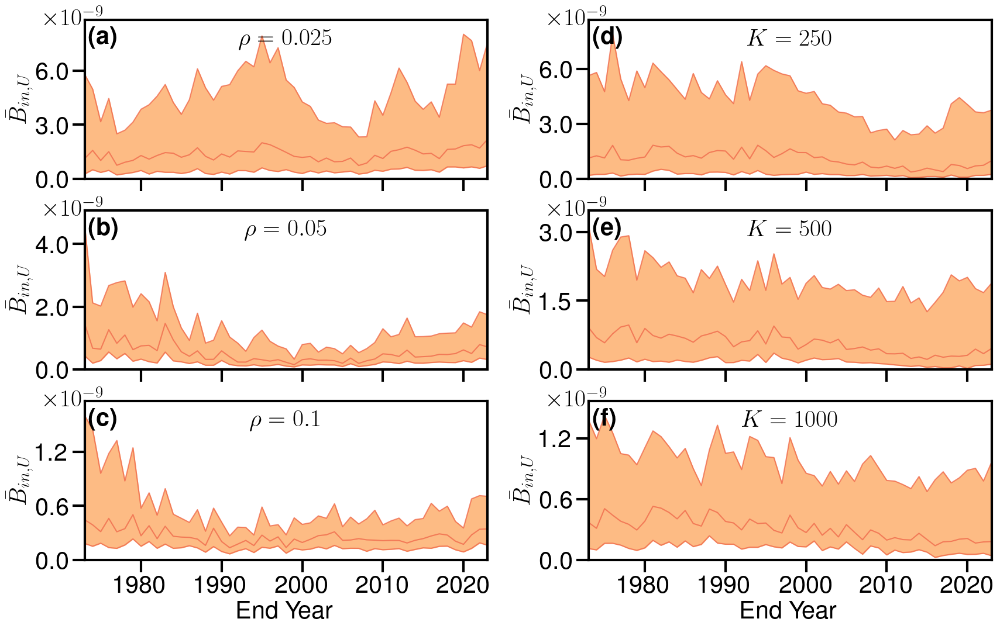

In [17]:
from matplotlib.ticker import ScalarFormatter

ks = [250, 500, 1000]
densities = [0.025, 0.05, 0.1]

class MagnitudeFormatter(mpl.ticker.ScalarFormatter):
    def __init__(self, exponent=None):
        super().__init__()
        self._fixed_exponent = exponent

    def _set_order_of_magnitude(self):
        if self._fixed_exponent:
            self.orderOfMagnitude = self._fixed_exponent
        else:
            super()._set_order_of_magnitude()

def mid_and_bounds(data,p_val,mid_function=np.median):
  low, upp, mid = [], [], []
  for i in range(len(data)):
    low.append(np.percentile(data[i], p_val))
    upp.append(np.percentile(data[i], 100-p_val))
    mid.append(mid_function(data[i]))

  return low, upp, mid

fontsize = 30

plt.rc('text', usetex=True)
plt.rc('xtick',labelsize=fontsize)
plt.rc('ytick',labelsize=fontsize)

p_val = 25
alpha = 1
alpha_bounds = 0.75
color_bounds = '#fee8c8'
color = '#fdbb84'
color_mid = '#ef6548'
ms = 7.5
lw = 2
legendsize = 18

xy_annotate = (0.01, 0.85)

fig, axs = plt.subplots(max(len(ks),len(densities)), 2, sharex=True, sharey=False, figsize=(20,4*max(len(ks),len(densities))))

max_value = 0

for i in range(len(ks)+len(densities)):


  if i < len(densities):
    betweenness = edge_betweenness_dict[densities[i]]['in']
    title = r'$\rho=' + str(densities[i]) + r'$'
    ax = axs[i,0]

    if i == len(densities) - 1:
      ax.set_xlabel('End Year', fontsize=fontsize)
      ax.set_xticklabels(xticklabels, fontsize=fontsize)

    #   ax.tick_params(bottom=True, top=False, left=True, right=False)
    # elif i == 0:
    #   # handles, labels = ax.get_legend_handles_labels()

    #   # ax.legend(handles, labels, loc='upper right',prop={'size': legendsize})
    #   ax.tick_params(bottom=False, top=False, left=True, right=False)
    # else:
    #   ax.tick_params(bottom=False, top=False, left=True, right=False)
  else:
    betweenness = edge_betweenness_dict[ks[i-len(densities)]]['in']
    title = r'$K=' + str(ks[i-len(densities)]) + r'$'
    ax = axs[i-len(densities),1]

    if i == len(densities) + len(ks) - 1:
      ax.set_xlabel('End Year', fontsize=fontsize)
      ax.set_xticklabels(xticklabels, fontsize=fontsize)

    #   ax.tick_params(bottom=True, top=False, left=True, right=False)
    # elif i == len(densities):
    #   # handles, labels = ax.get_legend_handles_labels()

    #   # ax.legend(handles, labels, loc='upper right',prop={'size': legendsize})
    #   ax.tick_params(bottom=False, top=False, left=True, right=False)
    # else:
    #   ax.tick_params(bottom=False, top=False, left=True, right=False)

  # low, upp, mid = mid_and_bounds(betweenness, 5)

  # ax.plot(np.arange(len(dates)),mid,color,alpha=alpha_bounds,zorder=2)
  # ax.plot(np.arange(len(dates)),low,'-',c=color,alpha=alpha_bounds,zorder=2)
  # ax.plot(np.arange(len(dates)),upp,'-',c=color,alpha=alpha_bounds,zorder=2)
  # ax.fill_between(np.arange(len(dates)),low, upp, color=color_bounds,
  #                 alpha=alpha,zorder=1)

  low, upp, mid = mid_and_bounds(betweenness, p_val)

  ax.plot(np.arange(len(dates)),mid,color_mid,alpha=alpha_bounds,zorder=2)
  ax.plot(np.arange(len(dates)),low,'-',c=color_mid,alpha=alpha_bounds,zorder=2)
  ax.plot(np.arange(len(dates)),upp,'-',c=color_mid,alpha=alpha_bounds,zorder=2)
  ax.fill_between(np.arange(len(dates)),low, upp, color=color,
                  alpha=alpha,zorder=1)

  max_value = np.max(upp)


  ax.annotate(r'\textbf{('+chr(97+i)+')}', xy=xy_annotate, xycoords='axes fraction', fontsize=fontsize)

  xticks = np.arange(7,len(dates),10)
  xticklabels = [dates[i].split('-')[1] for i in xticks]
  ax.set_xticks(xticks)

  # if i < len(densities):
  ax.set_ylabel(r'$\bar{B}_{in,U}$', fontsize=fontsize)



  # if i == len(densities) or i == len(ks):
  #   ax.set_xlabel('End Year', fontsize=fontsize)
  #   ax.set_xticklabels(xticklabels, fontsize=fontsize)

  #   ax.tick_params(bottom=True, top=False, left=True, right=False)
  # elif i == 0 or i == len(densities):
  #   handles, labels = ax.get_legend_handles_labels()

  #   ax.legend(handles, labels, loc='upper right',prop={'size': legendsize})
  #   ax.tick_params(bottom=False, top=False, left=True, right=False)
  # else:
  #   ax.tick_params(bottom=False, top=False, left=True, right=False)


  # ax.set_title(title, fontsize=fontsize)
  ax.annotate(title, xy=(0.5,0.95), xycoords='axes fraction', ha='center', va='top', fontsize=fontsize)

  ax.set_xlim(0,len(dates)-1)

  ax.tick_params(length=15,width=3)
  plt.setp(ax.spines.values(), linewidth=3, zorder=10)

  # fmt = ScalarFormatter()
  # fmt.set_powerlimits((-3,3))
  # ax.yaxis.set_major_formatter(fmt)
  # plt.ticklabel_format(style='sci', axis='y')
  # print(ax.yaxis.get_major_formatter().__dict__)

  ax.set_xlim(0,len(dates)-1)
  ax.set_ylim(0,max_value*1.1)

  ax.yaxis.set_major_locator(plt.MaxNLocator(3))



  yticks = ax.get_yticks()[:-1]

  multiplier = int('{:e}'.format(yticks[-1]).split('e')[1])
  fmt = MagnitudeFormatter(multiplier)
  ax.yaxis.set_major_formatter(fmt)
  # plt.ticklabel_format(style='sci', axis='y')
  # print(ax.yaxis.get_major_formatter().__dict__)
  ax.yaxis.offsetText.set_visible(False)

  # print(yticks)
  ax.set_yticks(yticks)
  ax.set_yticklabels(['{:.1f}'.format(ytick/10**multiplier) for ytick in yticks])

  if multiplier != 0:
      ax.annotate(r'$\times 10^{'+str(multiplier)+r'}$', xy=(-0.1,1.02), xycoords='axes fraction', ha='left', va='center', fontsize=fontsize)

plt.subplots_adjust(hspace=0.2, wspace=0.25)

fig.align_labels()

title = 'Edge Betweenness In Amazon'
# plt.savefig(fig_dir+title+'.jpg',bbox_inches='tight',pad_inches=0.2, dpi=300)
# plt.savefig(fig_dir+title+'.pdf',bbox_inches='tight',pad_inches=0.2, dpi=300)

plt.show()

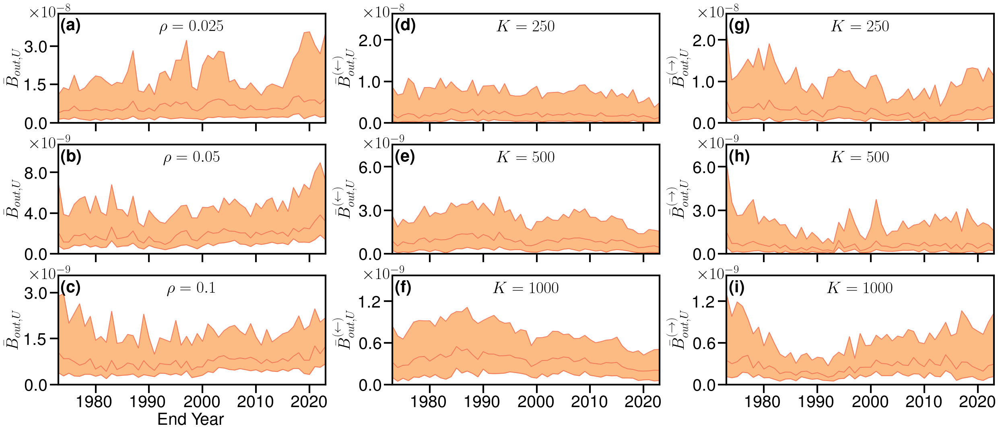

In [18]:
from matplotlib.ticker import ScalarFormatter

class MagnitudeFormatter(mpl.ticker.ScalarFormatter):
    def __init__(self, exponent=None):
        super().__init__()
        self._fixed_exponent = exponent

    def _set_order_of_magnitude(self):
        if self._fixed_exponent:
            self.orderOfMagnitude = self._fixed_exponent
        else:
            super()._set_order_of_magnitude()

def mid_and_bounds(data,p_val,mid_function=np.median):
  low, upp, mid = [], [], []
  for i in range(len(data)):
    low.append(np.percentile(data[i], p_val))
    upp.append(np.percentile(data[i], 100-p_val))
    mid.append(mid_function(data[i]))

  return low, upp, mid

fontsize = 30

plt.rc('text', usetex=True)
plt.rc('xtick',labelsize=fontsize)
plt.rc('ytick',labelsize=fontsize)

p_val = 25
alpha = 1
alpha_bounds = 0.75
color_bounds = '#fee8c8'
color = '#fdbb84'
color_mid = '#ef6548'
ms = 7.5
lw = 2
legendsize = 18

xy_annotate = (0.01, 0.85)

fig, axs = plt.subplots(len(ks), 3, sharex=True, sharey=False, figsize=(30,4*len(ks)))

max_values = np.zeros((len(ks),))

for i in range(len(densities) + 2*len(ks)):
  if i < len(densities):
    betweenness = edge_betweenness_dict[densities[i]]['out']
    title = r'$\rho=' + str(densities[i]) + r'$'
    ax = axs[i,0]

    if i == len(densities) - 1:
      ax.set_xlabel('End Year', fontsize=fontsize)
      ax.set_xticklabels(xticklabels, fontsize=fontsize)
  elif i < len(densities) + len(ks):
    betweenness = edge_betweenness_dict[ks[i-len(densities)]]['out']['in']
    title = r'$K=' + str(ks[i-len(densities)]) + r'$'
    ax = axs[i-len(densities),1]

    if i == len(ks) - 1:
      ax.set_xlabel('End Year', fontsize=fontsize)
      ax.set_xticklabels(xticklabels, fontsize=fontsize)
  else:
    betweenness = edge_betweenness_dict[ks[i-len(densities)-len(ks)]]['out']['out']
    title = r'$K=' + str(ks[i-len(densities)-len(ks)]) + r'$'
    ax = axs[i-len(densities)-len(ks),2]

    if i == 2*len(ks) - 1:
      ax.set_xlabel('End Year', fontsize=fontsize)
      ax.set_xticklabels(xticklabels, fontsize=fontsize)

    ax.sharey(axs[i-len(densities)-len(ks),1])

  #   ax.tick_params(bottom=True, top=False, left=True, right=False)
  # elif i == 0:
  #   # handles, labels = ax.get_legend_handles_labels()

  #   # ax.legend(handles, labels, loc='upper right',prop={'size': legendsize})
  #   ax.tick_params(bottom=False, top=False, left=True, right=False)
  # else:
  #   ax.tick_params(bottom=False, top=False, left=True, right=False)


  # low, upp, mid = mid_and_bounds(betweenness, 5)

  # ax.plot(np.arange(len(dates)),mid,color,alpha=alpha_bounds,zorder=2)
  # ax.plot(np.arange(len(dates)),low,'-',c=color,alpha=alpha_bounds,zorder=2)
  # ax.plot(np.arange(len(dates)),upp,'-',c=color,alpha=alpha_bounds,zorder=2)
  # ax.fill_between(np.arange(len(dates)),low, upp, color=color_bounds,
  #                 alpha=alpha,zorder=1)

  low, upp, mid = mid_and_bounds(betweenness, p_val)

  ax.plot(np.arange(len(dates)),mid,color_mid,alpha=alpha_bounds,zorder=2)
  ax.plot(np.arange(len(dates)),low,'-',c=color_mid,alpha=alpha_bounds,zorder=2)
  ax.plot(np.arange(len(dates)),upp,'-',c=color_mid,alpha=alpha_bounds,zorder=2)
  ax.fill_between(np.arange(len(dates)),low, upp, color=color,
                  alpha=alpha,zorder=1)

  if i < len(densities):
    max_value = np.max(upp)
  elif i < len(densities) + len(ks):
    max_values[i-len(densities)] = max(max_values[i-len(densities)], np.max(upp))
  else:
    max_values[i-len(densities)-len(ks)] = max(max_values[i-len(densities)-len(ks)], np.max(upp))


  ax.annotate(r'\textbf{('+chr(97+i)+')}', xy=xy_annotate, xycoords='axes fraction', fontsize=fontsize)

  xticks = np.arange(7,len(dates),10)
  xticklabels = [dates[i].split('-')[1] for i in xticks]
  ax.set_xticks(xticks)

  if i < len(densities):
    ax.set_ylabel(r'$\bar{B}_{out,U}$', fontsize=fontsize)
  elif i < len(densities)+len(ks):
    ax.set_ylabel(r'$\bar{B}^{(\leftarrow)}_{out,U}$', fontsize=fontsize)
  else:
    ax.set_ylabel(r'$\bar{B}^{(\rightarrow)}_{out,U}$', fontsize=fontsize)



  # if i == len(ks) or i == len(ks):
  #   ax.set_xlabel('End Year', fontsize=fontsize)
  #   ax.set_xticklabels(xticklabels, fontsize=fontsize)

  #   ax.tick_params(bottom=True, top=False, left=True, right=False)
  # elif i == 0 or i == len(ks):
  #   handles, labels = ax.get_legend_handles_labels()

  #   ax.legend(handles, labels, loc='upper right',prop={'size': legendsize})
  #   ax.tick_params(bottom=False, top=False, left=True, right=False)
  # else:
  #   ax.tick_params(bottom=False, top=False, left=True, right=False)


  # ax.set_title(title, fontsize=fontsize)
  ax.annotate(title, xy=(0.5,0.95), xycoords='axes fraction', ha='center', va='top', fontsize=fontsize)

  ax.set_xlim(0,len(dates)-1)

  ax.tick_params(length=15,width=3)
  plt.setp(ax.spines.values(), linewidth=3, zorder=10)

  # fmt = ScalarFormatter()
  # fmt.set_powerlimits((-3,3))
  # ax.yaxis.set_major_formatter(fmt)
  # plt.ticklabel_format(style='sci', axis='y')
  # print(ax.yaxis.get_major_formatter().__dict__)

  ax.set_xlim(0,len(dates)-1)
  if i < len(densities):
    ax.set_ylim(0,max_value*1.2)
  elif i < len(densities) + len(ks):
    ax.set_ylim(0,max_values[i-len(densities)]*1.2)
  else:
    ax.set_ylim(0,max_values[i-len(densities)-len(ks)]*1.2)

  ax.yaxis.set_major_locator(plt.MaxNLocator(3))



  yticks = ax.get_yticks()[:-1]

  multiplier = int('{:e}'.format(yticks[-1]).split('e')[1])
  fmt = MagnitudeFormatter(multiplier)
  ax.yaxis.set_major_formatter(fmt)
  # plt.ticklabel_format(style='sci', axis='y')
  # print(ax.yaxis.get_major_formatter().__dict__)
  ax.yaxis.offsetText.set_visible(False)

  # print(yticks)
  ax.set_yticks(yticks)
  ax.set_yticklabels(['{:.1f}'.format(ytick/10**multiplier) for ytick in yticks])



  if multiplier != 0:
      ax.annotate(r'$\times 10^{'+str(multiplier)+r'}$', xy=(-0.105,1.02), xycoords='axes fraction', ha='left', va='center', fontsize=fontsize)

  ax.yaxis.set_tick_params(labelbottom=True)

plt.subplots_adjust(hspace=0.2, wspace=0.25)

fig.align_labels()

title = 'Edge Betweenness Out Amazon'
# plt.savefig(fig_dir+title+'.jpg',bbox_inches='tight',pad_inches=0.2, dpi=300)
# plt.savefig(fig_dir+title+'.pdf',bbox_inches='tight',pad_inches=0.2, dpi=300)

plt.show()

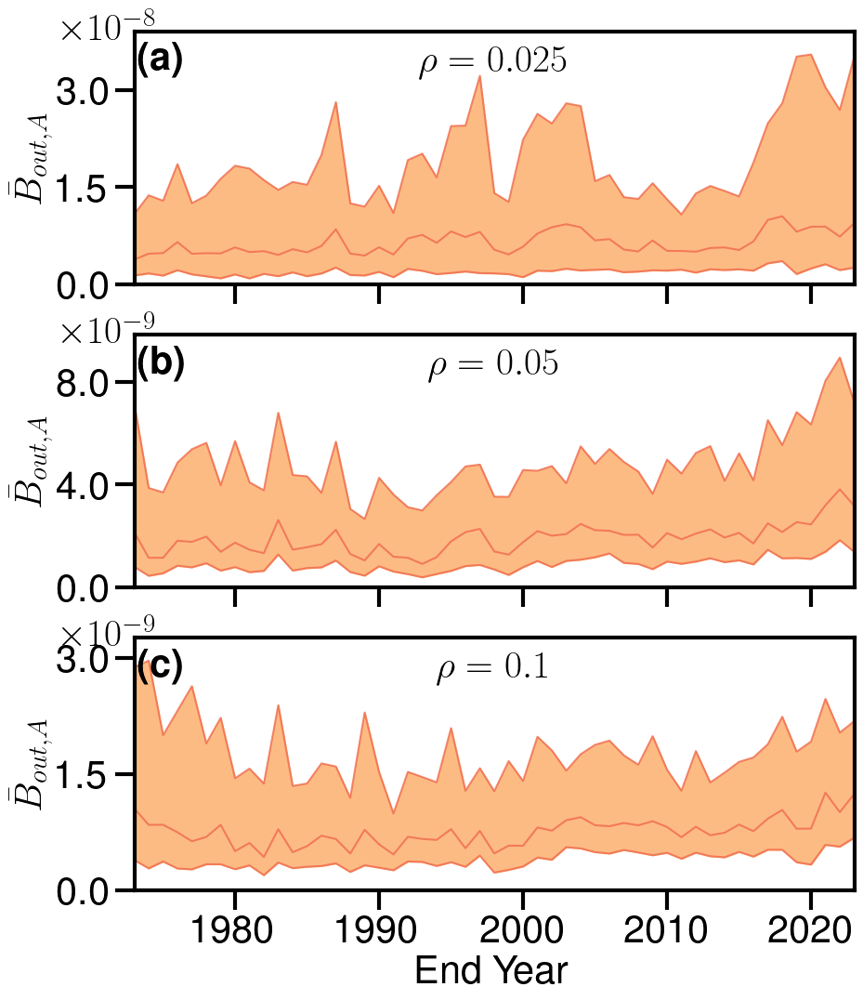

In [19]:
from matplotlib.ticker import ScalarFormatter

class MagnitudeFormatter(mpl.ticker.ScalarFormatter):
    def __init__(self, exponent=None):
        super().__init__()
        self._fixed_exponent = exponent

    def _set_order_of_magnitude(self):
        if self._fixed_exponent:
            self.orderOfMagnitude = self._fixed_exponent
        else:
            super()._set_order_of_magnitude()

def mid_and_bounds(data,p_val,mid_function=np.median):
  low, upp, mid = [], [], []
  for i in range(len(data)):
    low.append(np.percentile(data[i], p_val))
    upp.append(np.percentile(data[i], 100-p_val))
    mid.append(mid_function(data[i]))

  return low, upp, mid

fontsize = 30

plt.rc('text', usetex=True)
plt.rc('xtick',labelsize=fontsize)
plt.rc('ytick',labelsize=fontsize)

p_val = 25
alpha = 1
alpha_bounds = 0.75
color_bounds = '#fee8c8'
color = '#fdbb84'
color_mid = '#ef6548'
ms = 7.5
lw = 2
legendsize = 18

xy_annotate = (0.005, 0.85)

fig, axs = plt.subplots(max(len(ks),len(densities)), 1, sharex=True, sharey=False, figsize=(10,4*max(len(ks),len(densities))))

max_value = 0

for i in range(len(densities)):


  betweenness = edge_betweenness_dict[densities[i]]['out']
  title = r'$\rho=' + str(densities[i]) + r'$'
  ax = axs[i]

  if i == len(densities) - 1:
    ax.set_xlabel('End Year', fontsize=fontsize)
    ax.set_xticklabels(xticklabels, fontsize=fontsize)

  #   ax.tick_params(bottom=True, top=False, left=True, right=False)
  # elif i == 0:
  #   # handles, labels = ax.get_legend_handles_labels()

  #   # ax.legend(handles, labels, loc='upper right',prop={'size': legendsize})
  #   ax.tick_params(bottom=False, top=False, left=True, right=False)
  # else:
  #   ax.tick_params(bottom=False, top=False, left=True, right=False)


  # low, upp, mid = mid_and_bounds(betweenness, 5)

  # ax.plot(np.arange(len(dates)),mid,color,alpha=alpha_bounds,zorder=2)
  # ax.plot(np.arange(len(dates)),low,'-',c=color,alpha=alpha_bounds,zorder=2)
  # ax.plot(np.arange(len(dates)),upp,'-',c=color,alpha=alpha_bounds,zorder=2)
  # ax.fill_between(np.arange(len(dates)),low, upp, color=color_bounds,
  #                 alpha=alpha,zorder=1)

  low, upp, mid = mid_and_bounds(betweenness, p_val)

  ax.plot(np.arange(len(dates)),mid,color_mid,alpha=alpha_bounds,zorder=2)
  ax.plot(np.arange(len(dates)),low,'-',c=color_mid,alpha=alpha_bounds,zorder=2)
  ax.plot(np.arange(len(dates)),upp,'-',c=color_mid,alpha=alpha_bounds,zorder=2)
  ax.fill_between(np.arange(len(dates)),low, upp, color=color,
                  alpha=alpha,zorder=1)

  max_value = np.max(upp)


  ax.annotate(r'\textbf{('+chr(97+i)+')}', xy=xy_annotate, xycoords='axes fraction', fontsize=fontsize)

  xticks = np.arange(7,len(dates),10)
  xticklabels = [dates[i].split('-')[1] for i in xticks]
  ax.set_xticks(xticks)

  # if i < len(densities):
  ax.set_ylabel(r'$\bar{B}_{out,A}$', fontsize=fontsize)



  # if i == len(densities) or i == len(ks):
  #   ax.set_xlabel('End Year', fontsize=fontsize)
  #   ax.set_xticklabels(xticklabels, fontsize=fontsize)

  #   ax.tick_params(bottom=True, top=False, left=True, right=False)
  # elif i == 0 or i == len(densities):
  #   handles, labels = ax.get_legend_handles_labels()

  #   ax.legend(handles, labels, loc='upper right',prop={'size': legendsize})
  #   ax.tick_params(bottom=False, top=False, left=True, right=False)
  # else:
  #   ax.tick_params(bottom=False, top=False, left=True, right=False)


  # ax.set_title(title, fontsize=fontsize)
  ax.annotate(title, xy=(0.5,0.95), xycoords='axes fraction', ha='center', va='top', fontsize=fontsize)

  ax.set_xlim(0,len(dates)-1)

  ax.tick_params(length=15,width=3)
  plt.setp(ax.spines.values(), linewidth=3, zorder=10)

  # fmt = ScalarFormatter()
  # fmt.set_powerlimits((-3,3))
  # ax.yaxis.set_major_formatter(fmt)
  # plt.ticklabel_format(style='sci', axis='y')
  # print(ax.yaxis.get_major_formatter().__dict__)

  ax.set_xlim(0,len(dates)-1)
  ax.set_ylim(0,max_value*1.1)

  ax.yaxis.set_major_locator(plt.MaxNLocator(3))



  yticks = ax.get_yticks()[:-1]

  multiplier = int('{:e}'.format(yticks[-1]).split('e')[1])
  fmt = MagnitudeFormatter(multiplier)
  ax.yaxis.set_major_formatter(fmt)
  # plt.ticklabel_format(style='sci', axis='y')
  # print(ax.yaxis.get_major_formatter().__dict__)
  ax.yaxis.offsetText.set_visible(False)

  # print(yticks)
  ax.set_yticks(yticks)
  ax.set_yticklabels(['{:.1f}'.format(ytick/10**multiplier) for ytick in yticks])

  if multiplier != 0:
      ax.annotate(r'$\times 10^{'+str(multiplier)+r'}$', xy=(-0.1,1.02), xycoords='axes fraction', ha='left', va='center', fontsize=fontsize)

plt.subplots_adjust(hspace=0.2, wspace=0.25)

fig.align_labels()

title = 'Edge Betweenness Out Amazon (GTN)'
# plt.savefig(fig_dir+title+'.jpg',bbox_inches='tight',pad_inches=0.2, dpi=300)
# plt.savefig(fig_dir+title+'.pdf',bbox_inches='tight',pad_inches=0.2, dpi=300)

plt.show()

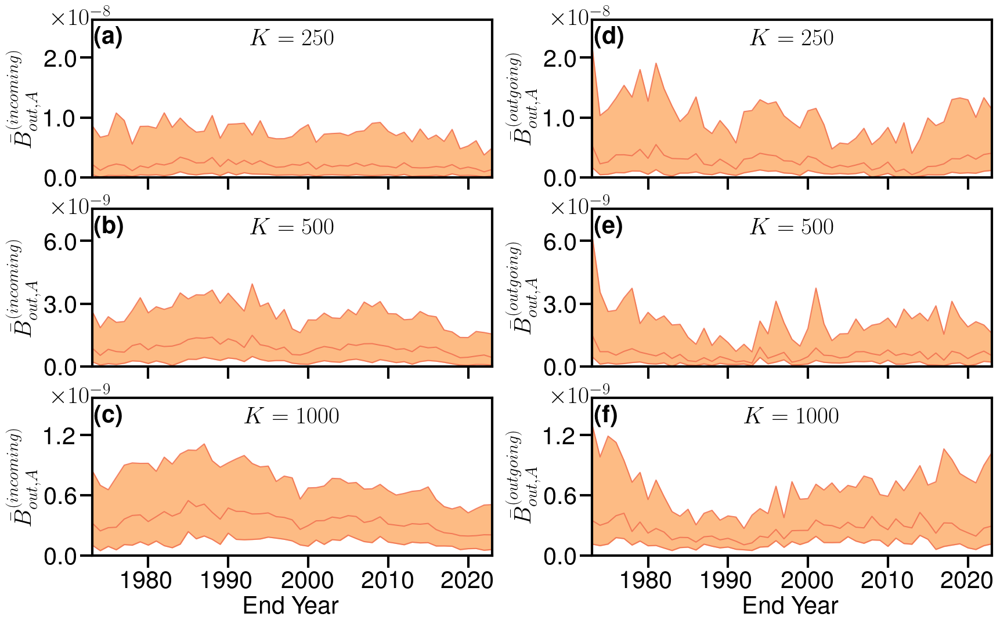

In [20]:
from matplotlib.ticker import ScalarFormatter

class MagnitudeFormatter(mpl.ticker.ScalarFormatter):
    def __init__(self, exponent=None):
        super().__init__()
        self._fixed_exponent = exponent

    def _set_order_of_magnitude(self):
        if self._fixed_exponent:
            self.orderOfMagnitude = self._fixed_exponent
        else:
            super()._set_order_of_magnitude()

def mid_and_bounds(data,p_val,mid_function=np.median):
  low, upp, mid = [], [], []
  for i in range(len(data)):
    low.append(np.percentile(data[i], p_val))
    upp.append(np.percentile(data[i], 100-p_val))
    mid.append(mid_function(data[i]))

  return low, upp, mid

fontsize = 30

plt.rc('text', usetex=True)
plt.rc('xtick',labelsize=fontsize)
plt.rc('ytick',labelsize=fontsize)

p_val = 25
alpha = 1
alpha_bounds = 0.75
color_bounds = '#fee8c8'
color = '#fdbb84'
color_mid = '#ef6548'
ms = 7.5
lw = 2
legendsize = 18

xy_annotate = (0.005, 0.85)

fig, axs = plt.subplots(len(ks), 2, sharex=True, sharey=False, figsize=(20,4*len(ks)))

max_values = np.zeros((len(ks),))

for i in range(2*len(ks)):
  if i < len(ks):
    betweenness = edge_betweenness_dict[ks[i]]['out']['in']
    title = r'$K=' + str(ks[i]) + r'$'
    ax = axs[i,0]

    if i == len(ks) - 1:
      ax.set_xlabel('End Year', fontsize=fontsize)
      ax.set_xticklabels(xticklabels, fontsize=fontsize)
  else:
    betweenness = edge_betweenness_dict[ks[i-len(ks)]]['out']['out']
    title = r'$K=' + str(ks[i-len(ks)]) + r'$'
    ax = axs[i-len(ks),1]

    if i == 2*len(ks) - 1:
      ax.set_xlabel('End Year', fontsize=fontsize)
      ax.set_xticklabels(xticklabels, fontsize=fontsize)

    ax.sharey(axs[i-len(ks),0])

  #   ax.tick_params(bottom=True, top=False, left=True, right=False)
  # elif i == 0:
  #   # handles, labels = ax.get_legend_handles_labels()

  #   # ax.legend(handles, labels, loc='upper right',prop={'size': legendsize})
  #   ax.tick_params(bottom=False, top=False, left=True, right=False)
  # else:
  #   ax.tick_params(bottom=False, top=False, left=True, right=False)


  # low, upp, mid = mid_and_bounds(betweenness, 5)

  # ax.plot(np.arange(len(dates)),mid,color,alpha=alpha_bounds,zorder=2)
  # ax.plot(np.arange(len(dates)),low,'-',c=color,alpha=alpha_bounds,zorder=2)
  # ax.plot(np.arange(len(dates)),upp,'-',c=color,alpha=alpha_bounds,zorder=2)
  # ax.fill_between(np.arange(len(dates)),low, upp, color=color_bounds,
  #                 alpha=alpha,zorder=1)

  low, upp, mid = mid_and_bounds(betweenness, p_val)

  ax.plot(np.arange(len(dates)),mid,color_mid,alpha=alpha_bounds,zorder=2)
  ax.plot(np.arange(len(dates)),low,'-',c=color_mid,alpha=alpha_bounds,zorder=2)
  ax.plot(np.arange(len(dates)),upp,'-',c=color_mid,alpha=alpha_bounds,zorder=2)
  ax.fill_between(np.arange(len(dates)),low, upp, color=color,
                  alpha=alpha,zorder=1)

  if i < len(ks):
    max_values[i] = max(max_values[i], np.max(upp))
  else:
    max_values[i-len(ks)] = max(max_values[i-len(ks)], np.max(upp))


  ax.annotate(r'\textbf{('+chr(97+i)+')}', xy=xy_annotate, xycoords='axes fraction', fontsize=fontsize)

  xticks = np.arange(7,len(dates),10)
  xticklabels = [dates[i].split('-')[1] for i in xticks]
  ax.set_xticks(xticks)

  if i < len(ks):
    ax.set_ylabel(r'$\bar{B}^{(incoming)}_{out,A}$', fontsize=fontsize)
  else:
    ax.set_ylabel(r'$\bar{B}^{(outgoing)}_{out,A}$', fontsize=fontsize)



  # if i == len(ks) or i == len(ks):
  #   ax.set_xlabel('End Year', fontsize=fontsize)
  #   ax.set_xticklabels(xticklabels, fontsize=fontsize)

  #   ax.tick_params(bottom=True, top=False, left=True, right=False)
  # elif i == 0 or i == len(ks):
  #   handles, labels = ax.get_legend_handles_labels()

  #   ax.legend(handles, labels, loc='upper right',prop={'size': legendsize})
  #   ax.tick_params(bottom=False, top=False, left=True, right=False)
  # else:
  #   ax.tick_params(bottom=False, top=False, left=True, right=False)


  # ax.set_title(title, fontsize=fontsize)
  ax.annotate(title, xy=(0.5,0.95), xycoords='axes fraction', ha='center', va='top', fontsize=fontsize)

  ax.set_xlim(0,len(dates)-1)

  ax.tick_params(length=15,width=3)
  plt.setp(ax.spines.values(), linewidth=3, zorder=10)

  # fmt = ScalarFormatter()
  # fmt.set_powerlimits((-3,3))
  # ax.yaxis.set_major_formatter(fmt)
  # plt.ticklabel_format(style='sci', axis='y')
  # print(ax.yaxis.get_major_formatter().__dict__)

  ax.set_xlim(0,len(dates)-1)
  ax.set_ylim(0,max_values[i%len(ks)]*1.2)

  ax.yaxis.set_major_locator(plt.MaxNLocator(3))



  yticks = ax.get_yticks()[:-1]

  multiplier = int('{:e}'.format(yticks[-1]).split('e')[1])
  fmt = MagnitudeFormatter(multiplier)
  ax.yaxis.set_major_formatter(fmt)
  # plt.ticklabel_format(style='sci', axis='y')
  # print(ax.yaxis.get_major_formatter().__dict__)
  ax.yaxis.offsetText.set_visible(False)

  # print(yticks)
  ax.set_yticks(yticks)
  ax.set_yticklabels(['{:.1f}'.format(ytick/10**multiplier) for ytick in yticks])



  if multiplier != 0:
      ax.annotate(r'$\times 10^{'+str(multiplier)+r'}$', xy=(-0.1,1.02), xycoords='axes fraction', ha='left', va='center', fontsize=fontsize)

  ax.yaxis.set_tick_params(labelbottom=True)

plt.subplots_adjust(hspace=0.2, wspace=0.25)

fig.align_labels()

title = 'Edge Betweenness Out Amazon (KNN)'
# plt.savefig(fig_dir+title+'.jpg',bbox_inches='tight',pad_inches=0.2, dpi=300)
# plt.savefig(fig_dir+title+'.pdf',bbox_inches='tight',pad_inches=0.2, dpi=300)

plt.show()

In [ ]:
with gzip.open(data_dir + 'icosahedral_grid.data', 'rb') as file:
  latlon_icos = np.array(pkl.load(file))

months = 300
offset = 365.25
density = 0.05

edge_dir = data_dir + 'edge_list-months='+str(months)+',offset='+str(offset)+',density={:}'.format(density)+'/'

dir_end = '-months={:},offset={:},density={:}/'.format(months,offset,density)

total_networks = len(os.listdir(edge_dir))

num_nodes = 10242

with gzip.open(data_dir + 'year_intervals-months='+str(months)+',offset='+str(offset) + '.data', 'rb') as file:
  year_intervals = pkl.load(file)

with gzip.open(data_dir + 'date_intervals-months='+str(months)+',offset='+str(offset) + '.data', 'rb') as file:
  date_intervals = pkl.load(file)

dates = [year_intervals[i][0] + '-' + year_intervals[i][1] for i in range(len(year_intervals))]
print(dates)

reader = shpreader.Reader(base_dir+'Amazon Biome/amazonia.shp')
amazon = cartopy.feature.ShapelyFeature(list(reader.geometries()), ccrs.PlateCarree())

recompute = False

if recompute:
  amazon_nodes = []

  for i in range(num_nodes):
    if amazon._geoms[0].contains(Point(latlon_icos[i,1]-360,latlon_icos[i,0])):
      amazon_nodes.append(i)

  with gzip.open(data_dir + 'amazon_nodes_new_networks.data', 'wb') as file:
    pkl.dump(amazon_nodes, file)
else:
  with gzip.open(data_dir + 'amazon_nodes_new_networks.data', 'rb') as file:
    amazon_nodes = pkl.load(file)

recompute = False

graph_dir = data_dir + 'G-months='+str(months)+',offset='+str(offset)+',density={:}'.format(density)+'/'
if recompute:
  if not os.path.isdir(graph_dir):
    os.mkdir(graph_dir)

  for i in trange(len(dates)):
    date = dates[i]

    with gzip.open(edge_dir + str(i) + '.data', 'rb') as file:
      edge_list = pkl.load(file)

    G = nx.from_edgelist(edge_list) # initiall unsorted

    H = nx.Graph() # make sorted copy
    H.add_nodes_from(sorted(G.nodes(data=True)))
    H.add_edges_from(G.edges(data=True))
    G = H # write over original with sorted copy
    del H # delete sorted copy

    print(i, nx.density(G))

    with gzip.open(graph_dir + date + '.data', 'wb') as file:
      pkl.dump(G, file)

['1948-1973', '1949-1974', '1950-1975', '1951-1976', '1952-1977', '1953-1978', '1954-1979', '1955-1980', '1956-1981', '1957-1982', '1958-1983', '1959-1984', '1960-1985', '1961-1986', '1962-1987', '1963-1988', '1964-1989', '1965-1990', '1966-1991', '1967-1992', '1968-1993', '1969-1994', '1970-1995', '1971-1996', '1972-1997', '1973-1998', '1974-1999', '1975-2000', '1976-2001', '1977-2002', '1978-2003', '1979-2004', '1980-2005', '1981-2006', '1982-2007', '1983-2008', '1984-2009', '1985-2010', '1986-2011', '1987-2012', '1988-2013', '1989-2014', '1990-2015', '1991-2016', '1992-2017', '1993-2018', '1994-2019', '1995-2020', '1996-2021', '1997-2022', '1998-2023']


In [ ]:
with gzip.open(graph_dir + dates[0] + '.data', 'rb') as file:
  G = pkl.load(file)

In [ ]:
%time edge_betweenness = nx.edge_betweenness_centrality(G,k=20)

CPU times: user 1min, sys: 376 ms, total: 1min 1s
Wall time: 1min 1s


In [ ]:
%time edge_betweenness1 = nx.edge_betweenness_centrality(G,k=50)

CPU times: user 2min 34s, sys: 1.45 s, total: 2min 35s
Wall time: 2min 35s


In [ ]:
%time edge_betweenness2 = nx.edge_betweenness_centrality(G,k=100)

CPU times: user 4min 43s, sys: 1.48 s, total: 4min 44s
Wall time: 4min 43s


In [ ]:
%time edge_betweenness3 = nx.edge_betweenness_centrality(G,k=200)

CPU times: user 9min 35s, sys: 2.25 s, total: 9min 37s
Wall time: 9min 36s


(array([2.621219e+06, 5.930000e+02, 1.800000e+02, 7.300000e+01, 3.900000e+01, 1.900000e+01, 1.900000e+01, 7.000000e+00, 1.400000e+01, 2.000000e+00, 5.000000e+00, 7.000000e+00, 0.000000e+00, 5.000000e+00, 2.000000e+00, 2.000000e+00, 4.000000e+00,
        5.000000e+00, 3.000000e+00, 1.000000e+00, 0.000000e+00, 0.000000e+00, 2.000000e+00, 0.000000e+00, 0.000000e+00, 1.000000e+00, 0.000000e+00, 0.000000e+00, 0.000000e+00, 0.000000e+00, 0.000000e+00, 0.000000e+00, 0.000000e+00, 0.000000e+00,
        0.000000e+00, 0.000000e+00, 0.000000e+00, 0.000000e+00, 1.000000e+00, 1.000000e+00, 0.000000e+00, 2.000000e+00, 0.000000e+00, 0.000000e+00, 0.000000e+00, 0.000000e+00, 0.000000e+00, 0.000000e+00, 0.000000e+00, 0.000000e+00, 0.000000e+00,
        0.000000e+00, 0.000000e+00, 0.000000e+00, 0.000000e+00, 0.000000e+00, 0.000000e+00, 0.000000e+00, 1.000000e+00, 0.000000e+00, 0.000000e+00, 0.000000e+00, 0.000000e+00, 0.000000e+00, 0.000000e+00, 0.000000e+00, 0.000000e+00, 0.000000e+00,
        0.000000

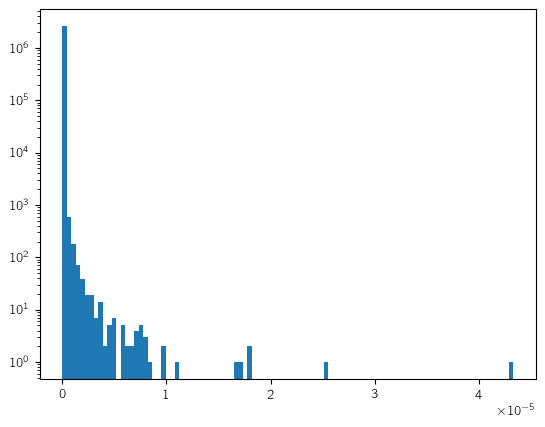

In [ ]:
data = [edge_betweenness[key] for key in edge_betweenness]
plt.hist(data,100,log=True)

(array([2.619482e+06, 1.474000e+03, 5.130000e+02, 2.490000e+02, 1.420000e+02, 9.300000e+01, 5.300000e+01, 3.300000e+01, 3.200000e+01, 3.100000e+01, 1.800000e+01, 1.300000e+01, 8.000000e+00, 8.000000e+00, 8.000000e+00, 9.000000e+00, 5.000000e+00,
        3.000000e+00, 3.000000e+00, 0.000000e+00, 3.000000e+00, 1.000000e+00, 2.000000e+00, 1.000000e+00, 2.000000e+00, 2.000000e+00, 3.000000e+00, 2.000000e+00, 2.000000e+00, 2.000000e+00, 1.000000e+00, 0.000000e+00, 1.000000e+00, 1.000000e+00,
        0.000000e+00, 1.000000e+00, 1.000000e+00, 0.000000e+00, 1.000000e+00, 1.000000e+00, 0.000000e+00, 0.000000e+00, 0.000000e+00, 0.000000e+00, 0.000000e+00, 0.000000e+00, 0.000000e+00, 0.000000e+00, 0.000000e+00, 0.000000e+00, 0.000000e+00,
        1.000000e+00, 0.000000e+00, 0.000000e+00, 0.000000e+00, 0.000000e+00, 0.000000e+00, 1.000000e+00, 0.000000e+00, 0.000000e+00, 0.000000e+00, 0.000000e+00, 0.000000e+00, 0.000000e+00, 0.000000e+00, 0.000000e+00, 0.000000e+00, 0.000000e+00,
        0.000000

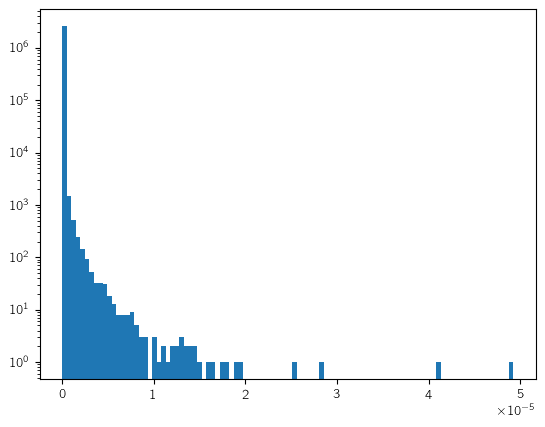

In [ ]:
data = [edge_betweenness1[key] for key in edge_betweenness1]
plt.hist(data,100,log=True)

(array([2.614663e+06, 4.135000e+03, 1.345000e+03, 6.480000e+02, 3.620000e+02, 2.350000e+02, 1.460000e+02, 1.140000e+02, 8.900000e+01, 5.900000e+01, 5.500000e+01, 3.200000e+01, 4.000000e+01, 3.900000e+01, 2.300000e+01, 2.500000e+01, 2.100000e+01,
        2.200000e+01, 1.300000e+01, 1.200000e+01, 1.300000e+01, 9.000000e+00, 1.500000e+01, 1.200000e+01, 9.000000e+00, 5.000000e+00, 4.000000e+00, 8.000000e+00, 3.000000e+00, 2.000000e+00, 1.000000e+00, 4.000000e+00, 2.000000e+00, 5.000000e+00,
        3.000000e+00, 1.000000e+00, 4.000000e+00, 2.000000e+00, 2.000000e+00, 0.000000e+00, 0.000000e+00, 1.000000e+00, 1.000000e+00, 4.000000e+00, 1.000000e+00, 0.000000e+00, 0.000000e+00, 3.000000e+00, 0.000000e+00, 1.000000e+00, 1.000000e+00,
        2.000000e+00, 1.000000e+00, 0.000000e+00, 0.000000e+00, 1.000000e+00, 1.000000e+00, 1.000000e+00, 0.000000e+00, 0.000000e+00, 1.000000e+00, 1.000000e+00, 1.000000e+00, 0.000000e+00, 1.000000e+00, 0.000000e+00, 0.000000e+00, 0.000000e+00,
        1.000000

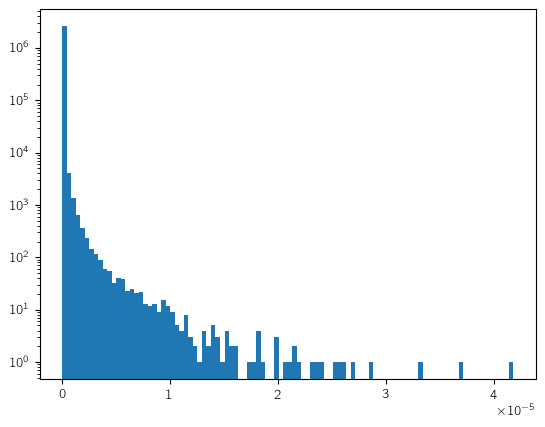

In [ ]:
data = [edge_betweenness2[key] for key in edge_betweenness2]
plt.hist(data,100,log=True)

(array([2.615677e+06, 3.978000e+03, 1.107000e+03, 4.480000e+02, 2.590000e+02, 1.760000e+02, 1.060000e+02, 7.400000e+01, 7.500000e+01, 4.900000e+01, 4.000000e+01, 3.100000e+01, 3.100000e+01, 2.100000e+01, 2.800000e+01, 1.200000e+01, 1.100000e+01,
        7.000000e+00, 8.000000e+00, 9.000000e+00, 6.000000e+00, 7.000000e+00, 3.000000e+00, 4.000000e+00, 5.000000e+00, 5.000000e+00, 4.000000e+00, 2.000000e+00, 3.000000e+00, 2.000000e+00, 2.000000e+00, 2.000000e+00, 1.000000e+00, 3.000000e+00,
        0.000000e+00, 3.000000e+00, 0.000000e+00, 0.000000e+00, 0.000000e+00, 2.000000e+00, 0.000000e+00, 1.000000e+00, 0.000000e+00, 0.000000e+00, 1.000000e+00, 0.000000e+00, 1.000000e+00, 0.000000e+00, 0.000000e+00, 0.000000e+00, 0.000000e+00,
        1.000000e+00, 0.000000e+00, 0.000000e+00, 0.000000e+00, 0.000000e+00, 0.000000e+00, 0.000000e+00, 0.000000e+00, 0.000000e+00, 0.000000e+00, 0.000000e+00, 0.000000e+00, 0.000000e+00, 0.000000e+00, 1.000000e+00, 0.000000e+00, 0.000000e+00,
        0.000000

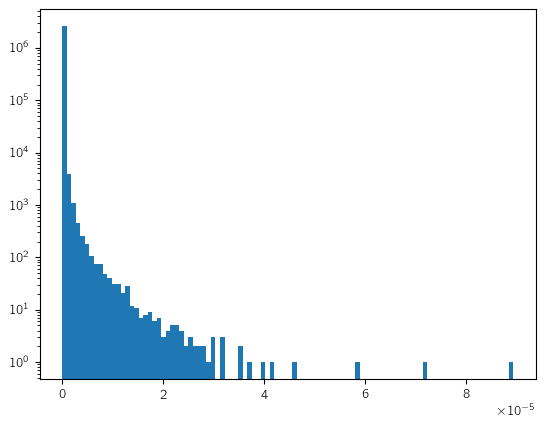

In [ ]:
data = [edge_betweenness3[key] for key in edge_betweenness3]
plt.hist(data,100,log=True)

In [ ]:
print(list(G.edges)[:10])

[(0, 1), (0, 2), (0, 3), (0, 4), (0, 127), (0, 164), (0, 180), (0, 242), (0, 244), (0, 297)]


In [ ]:
print(np.max([edge_betweenness[e] for e in G.edges]))

3.7367093804397975e-05


In [ ]:
for date in dates:
  with gzip.open(graph_dir + date + '.data', 'rb') as file:
    G = pkl.load(file)

  print(date, nx.number_connected_components(G))

1948-1973 1
1949-1974 1
1950-1975 1
1951-1976 1
1952-1977 1
1953-1978 1
1954-1979 1
1955-1980 1
1956-1981 1
1957-1982 1
1958-1983 1
1959-1984 1
1960-1985 1
1961-1986 1
1962-1987 1
1963-1988 1
1964-1989 1
1965-1990 1
1966-1991 1
1967-1992 1
1968-1993 1
1969-1994 1
1970-1995 1
1971-1996 1
1972-1997 1
1973-1998 1
1974-1999 1
1975-2000 1
1976-2001 1
1977-2002 1
1978-2003 1
1979-2004 1
1980-2005 1
1981-2006 1
1982-2007 1
1983-2008 1
1984-2009 1
1985-2010 1
1986-2011 1
1987-2012 1
1988-2013 1
1989-2014 1
1990-2015 1
1991-2016 1
1992-2017 1
1993-2018 1
1994-2019 1
1995-2020 1
1996-2021 1
1997-2022 1
1998-2023 1


In [ ]:
def communicability_matrix(G,date,k_max=11):
    N = G.number_of_nodes()
    nodes = list(G.nodes())

    comm_mat = np.zeros((N,N))

    # permute = []
    # for i in range(N):
    #     permute += [nodes.index(i)]


    A = nx.to_numpy_array(G)
    A1 = A/(N-1)

    for k in trange(2,k_max,desc=date):
          A1 = np.matmul(A1,A)#/(np.power(N-1,k))
          print(np.max(A1)/np.math.factorial(k))
          comm_mat += A1/np.math.factorial(k)
#             for i in range(N):
#                 for j in range(i,N):
#                     comm = A1[i][j]/np.math.factorial(k)
#                     comm_mat[i][j] += comm
#                     comm_mat[j][i] += comm

    # comm_mat_fixed = np.zeros((N,N))
    # for i in range(N):
    #     for j in range(i,N):
    #         comm_mat_fixed[i,j] = comm_mat[permute[i],permute[j]]
    #         comm_mat_fixed[j,i] = comm_mat_fixed[i,j]

    return comm_mat

def communicability_angle_matrix(G,date,comm_mat=None,k_max=11):
    N = G.number_of_nodes()

    if comm_mat is None:
      comm_mat = communicability_matrix(G,date,k_max)

    comm_ang_mat = np.zeros((N,N))
    diag = np.diag(comm_mat)
    for i in trange(N,desc=dates[0]):
        comm_ang_mat[i,:] = np.arccos(comm_mat[i]/np.sqrt(comm_mat[i,i]*diag))*180/np.pi

    return comm_ang_mat

In [ ]:
# for _ in trange(1):
#   comm1 = nx.communicability(G)

# for _ in trange(1):
#   comm2 = nx.communicability_exp(G)

for _ in trange(1):
  comm3 = communicability_matrix(G,dates[0])

  0%|          | 0/1 [00:00<?, ?it/s]

1948-1973:   0%|          | 0/9 [00:00<?, ?it/s]

0.1196172248803829
47.692868534973826
17444.045625427214
5014580.4420906175
1207384484.5245707
249016881737.0885
44948502823833.55
7211716775553153.0
1.0413799081064596e+18


In [ ]:
print(np.max(comm3))

1.0486368236141349e+18


In [ ]:
A = nx.to_numpy_array(G)

In [ ]:
eigvals1, eigvecs1 = sp.linalg.eig(A)

In [ ]:
print(eigvecs)

[[-1.07057347e-07 -6.71364190e-06 -1.83226404e-05 ...  4.01773618e-04  1.56373545e-04 -2.02799091e-04]
 [-8.07091008e-08 -3.87493121e-06 -1.74053123e-05 ...  7.20204383e-04  2.67936164e-03  8.08691001e-03]
 [-7.99544860e-08 -3.15949570e-06 -1.69284341e-05 ... -4.50489418e-03  1.21682320e-02 -1.06238859e-02]
 ...
 [-1.41184672e-05 -7.08754882e-05  5.25546171e-04 ... -1.05634417e-02 -5.46480767e-04 -1.75513071e-02]
 [-9.24741243e-04  1.06253032e-03 -9.88177602e-03 ... -1.66124407e-02 -1.29332166e-02 -2.31403959e-02]
 [-8.00917762e-06 -4.21906058e-05  3.79953378e-04 ...  6.96514487e-03  8.14152157e-03 -7.34492025e-04]]


In [ ]:
print(np.linalg.inv(eigvecs))

[[-1.07057347e-07 -8.07091023e-08 -7.99544912e-08 ... -1.41184672e-05 -9.24741243e-04 -8.00917762e-06]
 [-6.71364190e-06 -3.87493121e-06 -3.15949571e-06 ... -7.08754882e-05  1.06253032e-03 -4.21906058e-05]
 [-1.83226404e-05 -1.74053123e-05 -1.69284341e-05 ...  5.25546171e-04 -9.88177602e-03  3.79953378e-04]
 ...
 [ 4.01773618e-04  7.20204383e-04 -4.50489418e-03 ... -1.05634417e-02 -1.66124407e-02  6.96514487e-03]
 [ 1.56373545e-04  2.67936164e-03  1.21682320e-02 ... -5.46480767e-04 -1.29332166e-02  8.14152157e-03]
 [-2.02799091e-04  8.08691001e-03 -1.06238859e-02 ... -1.75513071e-02 -2.31403959e-02 -7.34492025e-04]]


In [ ]:
comm_exp1 = np.matmul(np.matmul(eigvecs1,np.diag(np.exp(eigvals1))), np.linalg.inv(eigvecs1))

<ipython-input-8-ceba45f5be54>:1: RuntimeWarning: overflow encountered in exp
  comm_exp1 = np.matmul(np.matmul(eigvecs1,np.diag(np.exp(eigvals1))), np.linalg.inv(eigvecs1))
<ipython-input-8-ceba45f5be54>:1: RuntimeWarning: invalid value encountered in matmul
  comm_exp1 = np.matmul(np.matmul(eigvecs1,np.diag(np.exp(eigvals1))), np.linalg.inv(eigvecs1))


In [ ]:
eigvals1, eigvecs1 = eigvals, eigvecs

In [ ]:
idx = eigvals1.argsort()[::-1]
eigvals1 = eigvals1[idx]
eigvecs1 = eigvecs1[:,idx]

In [ ]:
print(eigvecs1)

[[-1.07057347e-07  6.71364190e-06  1.83226404e-05 ... -9.99745637e-06 -3.06335518e-06 -4.60609352e-07]
 [-8.07091008e-08  3.87493121e-06  1.74053123e-05 ... -9.13197458e-06 -3.20899844e-06 -8.39349181e-07]
 [-7.99544861e-08  3.15949570e-06  1.69284341e-05 ... -1.10672320e-05 -3.70343191e-06 -7.72304091e-07]
 ...
 [-1.41184672e-05  7.08754882e-05 -5.25546171e-04 ...  6.46438226e-04  1.09498507e-05 -2.74653277e-05]
 [-9.24741243e-04 -1.06253032e-03  9.88177602e-03 ... -1.77688547e-03 -6.34729849e-03 -2.74635588e-03]
 [-8.00917762e-06  4.21906058e-05 -3.79953378e-04 ...  4.42637874e-04  1.16317522e-04 -3.68937927e-05]]


In [ ]:
a,b = np.min(eigvals),np.max(eigvals)
print(b-(a+b)/2, np.exp(b-(a+b)/2))

874.5675344703516 inf


<ipython-input-39-e7bf9921f58e>:2: RuntimeWarning: overflow encountered in exp
  print(b-(a+b)/2, np.exp(b-(a+b)/2))


In [ ]:
print(np.exp(b-1444))

1.0108419953307275


In [ ]:
with gzip.open(data_dir + 'eigvals_A'+dir_end+'0'+'.data','rb') as file:
  eigvals = np.real(pkl.load(file))

# Read eigvecs
with gzip.open(data_dir + 'eigvecs_A'+dir_end+'0'+'.data','rb') as file:
  eigvecs = np.real(pkl.load(file))

In [ ]:
comm_exp2 = np.matmul(np.matmul(eigvecs,np.diag(np.exp(eigvals-np.max(eigvals)+10))), np.linalg.inv(eigvecs))

In [ ]:
print(comm_exp2)

[[2.52451395e-10 1.90319730e-10 1.88540273e-10 ... 3.32926867e-08 2.18062769e-06 1.88864016e-08]
 [1.90319728e-10 1.43479497e-10 1.42137988e-10 ... 2.50989109e-08 1.64394603e-06 1.42382054e-08]
 [1.88540274e-10 1.42137991e-10 1.40809025e-10 ... 2.48642409e-08 1.62857545e-06 1.41050809e-08]
 ...
 [3.32926870e-08 2.50989113e-08 2.48642408e-08 ... 4.39056001e-06 2.87575971e-04 2.49069353e-06]
 [2.18062771e-06 1.64394606e-06 1.62857544e-06 ... 2.87575971e-04 1.88358522e-02 1.63137188e-04]
 [1.88864017e-08 1.42382056e-08 1.41050808e-08 ... 2.49069353e-06 1.63137188e-04 1.41293007e-06]]


In [ ]:
print(np.min(comm_exp2))

1.5282414421875076e-13


In [ ]:
print(np.allclose(eigvecs1,eigvecs1.T))

False


In [ ]:
comm = np.zeros((num_nodes,num_nodes))
for p in trange(num_nodes):
  for q in trange(p,num_nodes,leave=False,desc=str(p)):
    comm[p,q] = np.sum(np.exp(eigvals)*eigvecs[:,p]*eigvecs[:,q])
    # for u in range(num_nodes):
    #   comm[p,q] += np.exp(eigvals[u])*eigvecs[u,p]*eigvecs[u,q]
    comm[q,p] = comm[p,q]

  0%|          | 0/10242 [00:00<?, ?it/s]

0:   0%|          | 0/10242 [00:00<?, ?it/s]

<ipython-input-12-6dc46724124e>:4: RuntimeWarning: overflow encountered in exp
  comm[p,q] = np.sum(np.exp(eigvals)*eigvecs[:,p]*eigvecs[:,q])
/usr/local/lib/python3.9/dist-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: invalid value encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


1:   0%|          | 0/10241 [00:00<?, ?it/s]

2:   0%|          | 0/10240 [00:00<?, ?it/s]

3:   0%|          | 0/10239 [00:00<?, ?it/s]

4:   0%|          | 0/10238 [00:00<?, ?it/s]

5:   0%|          | 0/10237 [00:00<?, ?it/s]

6:   0%|          | 0/10236 [00:00<?, ?it/s]

7:   0%|          | 0/10235 [00:00<?, ?it/s]

8:   0%|          | 0/10234 [00:00<?, ?it/s]

9:   0%|          | 0/10233 [00:00<?, ?it/s]

10:   0%|          | 0/10232 [00:00<?, ?it/s]

11:   0%|          | 0/10231 [00:00<?, ?it/s]

12:   0%|          | 0/10230 [00:00<?, ?it/s]

13:   0%|          | 0/10229 [00:00<?, ?it/s]

14:   0%|          | 0/10228 [00:00<?, ?it/s]

15:   0%|          | 0/10227 [00:00<?, ?it/s]

16:   0%|          | 0/10226 [00:00<?, ?it/s]

17:   0%|          | 0/10225 [00:00<?, ?it/s]

18:   0%|          | 0/10224 [00:00<?, ?it/s]

19:   0%|          | 0/10223 [00:00<?, ?it/s]

20:   0%|          | 0/10222 [00:00<?, ?it/s]

21:   0%|          | 0/10221 [00:00<?, ?it/s]

22:   0%|          | 0/10220 [00:00<?, ?it/s]

23:   0%|          | 0/10219 [00:00<?, ?it/s]

24:   0%|          | 0/10218 [00:00<?, ?it/s]

25:   0%|          | 0/10217 [00:00<?, ?it/s]

26:   0%|          | 0/10216 [00:00<?, ?it/s]

27:   0%|          | 0/10215 [00:00<?, ?it/s]

28:   0%|          | 0/10214 [00:00<?, ?it/s]

29:   0%|          | 0/10213 [00:00<?, ?it/s]

30:   0%|          | 0/10212 [00:00<?, ?it/s]

31:   0%|          | 0/10211 [00:00<?, ?it/s]

32:   0%|          | 0/10210 [00:00<?, ?it/s]

33:   0%|          | 0/10209 [00:00<?, ?it/s]

34:   0%|          | 0/10208 [00:00<?, ?it/s]

35:   0%|          | 0/10207 [00:00<?, ?it/s]

36:   0%|          | 0/10206 [00:00<?, ?it/s]

37:   0%|          | 0/10205 [00:00<?, ?it/s]

38:   0%|          | 0/10204 [00:00<?, ?it/s]

39:   0%|          | 0/10203 [00:00<?, ?it/s]

40:   0%|          | 0/10202 [00:00<?, ?it/s]

41:   0%|          | 0/10201 [00:00<?, ?it/s]

42:   0%|          | 0/10200 [00:00<?, ?it/s]

43:   0%|          | 0/10199 [00:00<?, ?it/s]

44:   0%|          | 0/10198 [00:00<?, ?it/s]

45:   0%|          | 0/10197 [00:00<?, ?it/s]

46:   0%|          | 0/10196 [00:00<?, ?it/s]

47:   0%|          | 0/10195 [00:00<?, ?it/s]

48:   0%|          | 0/10194 [00:00<?, ?it/s]

49:   0%|          | 0/10193 [00:00<?, ?it/s]

50:   0%|          | 0/10192 [00:00<?, ?it/s]

51:   0%|          | 0/10191 [00:00<?, ?it/s]

52:   0%|          | 0/10190 [00:00<?, ?it/s]

53:   0%|          | 0/10189 [00:00<?, ?it/s]

54:   0%|          | 0/10188 [00:00<?, ?it/s]

55:   0%|          | 0/10187 [00:00<?, ?it/s]

56:   0%|          | 0/10186 [00:00<?, ?it/s]

57:   0%|          | 0/10185 [00:00<?, ?it/s]

58:   0%|          | 0/10184 [00:00<?, ?it/s]

59:   0%|          | 0/10183 [00:00<?, ?it/s]

60:   0%|          | 0/10182 [00:00<?, ?it/s]

61:   0%|          | 0/10181 [00:00<?, ?it/s]

62:   0%|          | 0/10180 [00:00<?, ?it/s]

63:   0%|          | 0/10179 [00:00<?, ?it/s]

64:   0%|          | 0/10178 [00:00<?, ?it/s]

65:   0%|          | 0/10177 [00:00<?, ?it/s]

66:   0%|          | 0/10176 [00:00<?, ?it/s]

67:   0%|          | 0/10175 [00:00<?, ?it/s]

68:   0%|          | 0/10174 [00:00<?, ?it/s]

69:   0%|          | 0/10173 [00:00<?, ?it/s]

70:   0%|          | 0/10172 [00:00<?, ?it/s]

71:   0%|          | 0/10171 [00:00<?, ?it/s]

72:   0%|          | 0/10170 [00:00<?, ?it/s]

73:   0%|          | 0/10169 [00:00<?, ?it/s]

74:   0%|          | 0/10168 [00:00<?, ?it/s]

75:   0%|          | 0/10167 [00:00<?, ?it/s]

76:   0%|          | 0/10166 [00:00<?, ?it/s]

77:   0%|          | 0/10165 [00:00<?, ?it/s]

78:   0%|          | 0/10164 [00:00<?, ?it/s]

79:   0%|          | 0/10163 [00:00<?, ?it/s]

80:   0%|          | 0/10162 [00:00<?, ?it/s]

81:   0%|          | 0/10161 [00:00<?, ?it/s]

82:   0%|          | 0/10160 [00:00<?, ?it/s]

83:   0%|          | 0/10159 [00:00<?, ?it/s]

84:   0%|          | 0/10158 [00:00<?, ?it/s]

85:   0%|          | 0/10157 [00:00<?, ?it/s]

86:   0%|          | 0/10156 [00:00<?, ?it/s]

87:   0%|          | 0/10155 [00:00<?, ?it/s]

88:   0%|          | 0/10154 [00:00<?, ?it/s]

89:   0%|          | 0/10153 [00:00<?, ?it/s]

90:   0%|          | 0/10152 [00:00<?, ?it/s]

91:   0%|          | 0/10151 [00:00<?, ?it/s]

92:   0%|          | 0/10150 [00:00<?, ?it/s]

93:   0%|          | 0/10149 [00:00<?, ?it/s]

94:   0%|          | 0/10148 [00:00<?, ?it/s]

95:   0%|          | 0/10147 [00:00<?, ?it/s]

96:   0%|          | 0/10146 [00:00<?, ?it/s]

97:   0%|          | 0/10145 [00:00<?, ?it/s]

98:   0%|          | 0/10144 [00:00<?, ?it/s]

99:   0%|          | 0/10143 [00:00<?, ?it/s]

100:   0%|          | 0/10142 [00:00<?, ?it/s]

101:   0%|          | 0/10141 [00:00<?, ?it/s]

102:   0%|          | 0/10140 [00:00<?, ?it/s]

103:   0%|          | 0/10139 [00:00<?, ?it/s]

104:   0%|          | 0/10138 [00:00<?, ?it/s]

105:   0%|          | 0/10137 [00:00<?, ?it/s]

106:   0%|          | 0/10136 [00:00<?, ?it/s]

107:   0%|          | 0/10135 [00:00<?, ?it/s]

108:   0%|          | 0/10134 [00:00<?, ?it/s]

109:   0%|          | 0/10133 [00:00<?, ?it/s]

110:   0%|          | 0/10132 [00:00<?, ?it/s]

111:   0%|          | 0/10131 [00:00<?, ?it/s]

112:   0%|          | 0/10130 [00:00<?, ?it/s]

113:   0%|          | 0/10129 [00:00<?, ?it/s]

114:   0%|          | 0/10128 [00:00<?, ?it/s]

115:   0%|          | 0/10127 [00:00<?, ?it/s]

116:   0%|          | 0/10126 [00:00<?, ?it/s]

117:   0%|          | 0/10125 [00:00<?, ?it/s]

118:   0%|          | 0/10124 [00:00<?, ?it/s]

119:   0%|          | 0/10123 [00:00<?, ?it/s]

120:   0%|          | 0/10122 [00:00<?, ?it/s]

121:   0%|          | 0/10121 [00:00<?, ?it/s]

122:   0%|          | 0/10120 [00:00<?, ?it/s]

123:   0%|          | 0/10119 [00:00<?, ?it/s]

124:   0%|          | 0/10118 [00:00<?, ?it/s]

125:   0%|          | 0/10117 [00:00<?, ?it/s]

126:   0%|          | 0/10116 [00:00<?, ?it/s]

127:   0%|          | 0/10115 [00:00<?, ?it/s]

128:   0%|          | 0/10114 [00:00<?, ?it/s]

129:   0%|          | 0/10113 [00:00<?, ?it/s]

130:   0%|          | 0/10112 [00:00<?, ?it/s]

131:   0%|          | 0/10111 [00:00<?, ?it/s]

132:   0%|          | 0/10110 [00:00<?, ?it/s]

133:   0%|          | 0/10109 [00:00<?, ?it/s]

134:   0%|          | 0/10108 [00:00<?, ?it/s]

135:   0%|          | 0/10107 [00:00<?, ?it/s]

136:   0%|          | 0/10106 [00:00<?, ?it/s]

137:   0%|          | 0/10105 [00:00<?, ?it/s]

138:   0%|          | 0/10104 [00:00<?, ?it/s]

139:   0%|          | 0/10103 [00:00<?, ?it/s]

140:   0%|          | 0/10102 [00:00<?, ?it/s]

141:   0%|          | 0/10101 [00:00<?, ?it/s]

142:   0%|          | 0/10100 [00:00<?, ?it/s]

143:   0%|          | 0/10099 [00:00<?, ?it/s]

144:   0%|          | 0/10098 [00:00<?, ?it/s]

145:   0%|          | 0/10097 [00:00<?, ?it/s]

146:   0%|          | 0/10096 [00:00<?, ?it/s]

147:   0%|          | 0/10095 [00:00<?, ?it/s]

148:   0%|          | 0/10094 [00:00<?, ?it/s]

149:   0%|          | 0/10093 [00:00<?, ?it/s]

150:   0%|          | 0/10092 [00:00<?, ?it/s]

151:   0%|          | 0/10091 [00:00<?, ?it/s]

152:   0%|          | 0/10090 [00:00<?, ?it/s]

153:   0%|          | 0/10089 [00:00<?, ?it/s]

154:   0%|          | 0/10088 [00:00<?, ?it/s]

155:   0%|          | 0/10087 [00:00<?, ?it/s]

156:   0%|          | 0/10086 [00:00<?, ?it/s]

157:   0%|          | 0/10085 [00:00<?, ?it/s]

158:   0%|          | 0/10084 [00:00<?, ?it/s]

159:   0%|          | 0/10083 [00:00<?, ?it/s]

160:   0%|          | 0/10082 [00:00<?, ?it/s]

161:   0%|          | 0/10081 [00:00<?, ?it/s]

162:   0%|          | 0/10080 [00:00<?, ?it/s]

163:   0%|          | 0/10079 [00:00<?, ?it/s]

164:   0%|          | 0/10078 [00:00<?, ?it/s]

165:   0%|          | 0/10077 [00:00<?, ?it/s]

166:   0%|          | 0/10076 [00:00<?, ?it/s]

167:   0%|          | 0/10075 [00:00<?, ?it/s]

168:   0%|          | 0/10074 [00:00<?, ?it/s]

169:   0%|          | 0/10073 [00:00<?, ?it/s]

170:   0%|          | 0/10072 [00:00<?, ?it/s]

171:   0%|          | 0/10071 [00:00<?, ?it/s]

172:   0%|          | 0/10070 [00:00<?, ?it/s]

173:   0%|          | 0/10069 [00:00<?, ?it/s]

174:   0%|          | 0/10068 [00:00<?, ?it/s]

175:   0%|          | 0/10067 [00:00<?, ?it/s]

176:   0%|          | 0/10066 [00:00<?, ?it/s]

177:   0%|          | 0/10065 [00:00<?, ?it/s]

178:   0%|          | 0/10064 [00:00<?, ?it/s]

179:   0%|          | 0/10063 [00:00<?, ?it/s]

180:   0%|          | 0/10062 [00:00<?, ?it/s]

181:   0%|          | 0/10061 [00:00<?, ?it/s]

182:   0%|          | 0/10060 [00:00<?, ?it/s]

183:   0%|          | 0/10059 [00:00<?, ?it/s]

184:   0%|          | 0/10058 [00:00<?, ?it/s]

185:   0%|          | 0/10057 [00:00<?, ?it/s]

186:   0%|          | 0/10056 [00:00<?, ?it/s]

187:   0%|          | 0/10055 [00:00<?, ?it/s]

188:   0%|          | 0/10054 [00:00<?, ?it/s]

189:   0%|          | 0/10053 [00:00<?, ?it/s]

190:   0%|          | 0/10052 [00:00<?, ?it/s]

191:   0%|          | 0/10051 [00:00<?, ?it/s]

192:   0%|          | 0/10050 [00:00<?, ?it/s]

193:   0%|          | 0/10049 [00:00<?, ?it/s]

194:   0%|          | 0/10048 [00:00<?, ?it/s]

195:   0%|          | 0/10047 [00:00<?, ?it/s]

196:   0%|          | 0/10046 [00:00<?, ?it/s]

197:   0%|          | 0/10045 [00:00<?, ?it/s]

198:   0%|          | 0/10044 [00:00<?, ?it/s]

199:   0%|          | 0/10043 [00:00<?, ?it/s]

200:   0%|          | 0/10042 [00:00<?, ?it/s]

201:   0%|          | 0/10041 [00:00<?, ?it/s]

202:   0%|          | 0/10040 [00:00<?, ?it/s]

203:   0%|          | 0/10039 [00:00<?, ?it/s]

204:   0%|          | 0/10038 [00:00<?, ?it/s]

205:   0%|          | 0/10037 [00:00<?, ?it/s]

206:   0%|          | 0/10036 [00:00<?, ?it/s]

207:   0%|          | 0/10035 [00:00<?, ?it/s]

208:   0%|          | 0/10034 [00:00<?, ?it/s]

209:   0%|          | 0/10033 [00:00<?, ?it/s]

210:   0%|          | 0/10032 [00:00<?, ?it/s]

211:   0%|          | 0/10031 [00:00<?, ?it/s]

212:   0%|          | 0/10030 [00:00<?, ?it/s]

213:   0%|          | 0/10029 [00:00<?, ?it/s]

214:   0%|          | 0/10028 [00:00<?, ?it/s]

215:   0%|          | 0/10027 [00:00<?, ?it/s]

216:   0%|          | 0/10026 [00:00<?, ?it/s]

217:   0%|          | 0/10025 [00:00<?, ?it/s]

218:   0%|          | 0/10024 [00:00<?, ?it/s]

219:   0%|          | 0/10023 [00:00<?, ?it/s]

220:   0%|          | 0/10022 [00:00<?, ?it/s]

221:   0%|          | 0/10021 [00:00<?, ?it/s]

222:   0%|          | 0/10020 [00:00<?, ?it/s]

223:   0%|          | 0/10019 [00:00<?, ?it/s]

224:   0%|          | 0/10018 [00:00<?, ?it/s]

225:   0%|          | 0/10017 [00:00<?, ?it/s]

226:   0%|          | 0/10016 [00:00<?, ?it/s]

227:   0%|          | 0/10015 [00:00<?, ?it/s]

228:   0%|          | 0/10014 [00:00<?, ?it/s]

229:   0%|          | 0/10013 [00:00<?, ?it/s]

230:   0%|          | 0/10012 [00:00<?, ?it/s]

231:   0%|          | 0/10011 [00:00<?, ?it/s]

232:   0%|          | 0/10010 [00:00<?, ?it/s]

233:   0%|          | 0/10009 [00:00<?, ?it/s]

234:   0%|          | 0/10008 [00:00<?, ?it/s]

235:   0%|          | 0/10007 [00:00<?, ?it/s]

236:   0%|          | 0/10006 [00:00<?, ?it/s]

237:   0%|          | 0/10005 [00:00<?, ?it/s]

238:   0%|          | 0/10004 [00:00<?, ?it/s]

239:   0%|          | 0/10003 [00:00<?, ?it/s]

240:   0%|          | 0/10002 [00:00<?, ?it/s]

241:   0%|          | 0/10001 [00:00<?, ?it/s]

242:   0%|          | 0/10000 [00:00<?, ?it/s]

243:   0%|          | 0/9999 [00:00<?, ?it/s]

244:   0%|          | 0/9998 [00:00<?, ?it/s]

245:   0%|          | 0/9997 [00:00<?, ?it/s]

246:   0%|          | 0/9996 [00:00<?, ?it/s]

247:   0%|          | 0/9995 [00:00<?, ?it/s]

248:   0%|          | 0/9994 [00:00<?, ?it/s]

249:   0%|          | 0/9993 [00:00<?, ?it/s]

250:   0%|          | 0/9992 [00:00<?, ?it/s]

251:   0%|          | 0/9991 [00:00<?, ?it/s]

252:   0%|          | 0/9990 [00:00<?, ?it/s]

253:   0%|          | 0/9989 [00:00<?, ?it/s]

254:   0%|          | 0/9988 [00:00<?, ?it/s]

255:   0%|          | 0/9987 [00:00<?, ?it/s]

256:   0%|          | 0/9986 [00:00<?, ?it/s]

257:   0%|          | 0/9985 [00:00<?, ?it/s]

258:   0%|          | 0/9984 [00:00<?, ?it/s]

259:   0%|          | 0/9983 [00:00<?, ?it/s]

260:   0%|          | 0/9982 [00:00<?, ?it/s]

261:   0%|          | 0/9981 [00:00<?, ?it/s]

262:   0%|          | 0/9980 [00:00<?, ?it/s]

263:   0%|          | 0/9979 [00:00<?, ?it/s]

264:   0%|          | 0/9978 [00:00<?, ?it/s]

265:   0%|          | 0/9977 [00:00<?, ?it/s]

266:   0%|          | 0/9976 [00:00<?, ?it/s]

267:   0%|          | 0/9975 [00:00<?, ?it/s]

268:   0%|          | 0/9974 [00:00<?, ?it/s]

269:   0%|          | 0/9973 [00:00<?, ?it/s]

270:   0%|          | 0/9972 [00:00<?, ?it/s]

271:   0%|          | 0/9971 [00:00<?, ?it/s]

272:   0%|          | 0/9970 [00:00<?, ?it/s]

273:   0%|          | 0/9969 [00:00<?, ?it/s]

274:   0%|          | 0/9968 [00:00<?, ?it/s]

275:   0%|          | 0/9967 [00:00<?, ?it/s]

276:   0%|          | 0/9966 [00:00<?, ?it/s]

277:   0%|          | 0/9965 [00:00<?, ?it/s]

278:   0%|          | 0/9964 [00:00<?, ?it/s]

279:   0%|          | 0/9963 [00:00<?, ?it/s]

280:   0%|          | 0/9962 [00:00<?, ?it/s]

281:   0%|          | 0/9961 [00:00<?, ?it/s]

282:   0%|          | 0/9960 [00:00<?, ?it/s]

283:   0%|          | 0/9959 [00:00<?, ?it/s]

284:   0%|          | 0/9958 [00:00<?, ?it/s]

285:   0%|          | 0/9957 [00:00<?, ?it/s]

286:   0%|          | 0/9956 [00:00<?, ?it/s]

287:   0%|          | 0/9955 [00:00<?, ?it/s]

288:   0%|          | 0/9954 [00:00<?, ?it/s]

289:   0%|          | 0/9953 [00:00<?, ?it/s]

290:   0%|          | 0/9952 [00:00<?, ?it/s]

291:   0%|          | 0/9951 [00:00<?, ?it/s]

292:   0%|          | 0/9950 [00:00<?, ?it/s]

293:   0%|          | 0/9949 [00:00<?, ?it/s]

294:   0%|          | 0/9948 [00:00<?, ?it/s]

295:   0%|          | 0/9947 [00:00<?, ?it/s]

296:   0%|          | 0/9946 [00:00<?, ?it/s]

297:   0%|          | 0/9945 [00:00<?, ?it/s]

298:   0%|          | 0/9944 [00:00<?, ?it/s]

299:   0%|          | 0/9943 [00:00<?, ?it/s]

300:   0%|          | 0/9942 [00:00<?, ?it/s]

301:   0%|          | 0/9941 [00:00<?, ?it/s]

302:   0%|          | 0/9940 [00:00<?, ?it/s]

303:   0%|          | 0/9939 [00:00<?, ?it/s]

304:   0%|          | 0/9938 [00:00<?, ?it/s]

305:   0%|          | 0/9937 [00:00<?, ?it/s]

306:   0%|          | 0/9936 [00:00<?, ?it/s]

307:   0%|          | 0/9935 [00:00<?, ?it/s]

308:   0%|          | 0/9934 [00:00<?, ?it/s]

309:   0%|          | 0/9933 [00:00<?, ?it/s]

310:   0%|          | 0/9932 [00:00<?, ?it/s]

311:   0%|          | 0/9931 [00:00<?, ?it/s]

312:   0%|          | 0/9930 [00:00<?, ?it/s]

313:   0%|          | 0/9929 [00:00<?, ?it/s]

314:   0%|          | 0/9928 [00:00<?, ?it/s]

315:   0%|          | 0/9927 [00:00<?, ?it/s]

316:   0%|          | 0/9926 [00:00<?, ?it/s]

317:   0%|          | 0/9925 [00:00<?, ?it/s]

318:   0%|          | 0/9924 [00:00<?, ?it/s]

319:   0%|          | 0/9923 [00:00<?, ?it/s]

320:   0%|          | 0/9922 [00:00<?, ?it/s]

321:   0%|          | 0/9921 [00:00<?, ?it/s]

322:   0%|          | 0/9920 [00:00<?, ?it/s]

323:   0%|          | 0/9919 [00:00<?, ?it/s]

324:   0%|          | 0/9918 [00:00<?, ?it/s]

325:   0%|          | 0/9917 [00:00<?, ?it/s]

326:   0%|          | 0/9916 [00:00<?, ?it/s]

327:   0%|          | 0/9915 [00:00<?, ?it/s]

328:   0%|          | 0/9914 [00:00<?, ?it/s]

329:   0%|          | 0/9913 [00:00<?, ?it/s]

330:   0%|          | 0/9912 [00:00<?, ?it/s]

331:   0%|          | 0/9911 [00:00<?, ?it/s]

332:   0%|          | 0/9910 [00:00<?, ?it/s]

333:   0%|          | 0/9909 [00:00<?, ?it/s]

334:   0%|          | 0/9908 [00:00<?, ?it/s]

335:   0%|          | 0/9907 [00:00<?, ?it/s]

336:   0%|          | 0/9906 [00:00<?, ?it/s]

337:   0%|          | 0/9905 [00:00<?, ?it/s]

338:   0%|          | 0/9904 [00:00<?, ?it/s]

339:   0%|          | 0/9903 [00:00<?, ?it/s]

340:   0%|          | 0/9902 [00:00<?, ?it/s]

341:   0%|          | 0/9901 [00:00<?, ?it/s]

342:   0%|          | 0/9900 [00:00<?, ?it/s]

343:   0%|          | 0/9899 [00:00<?, ?it/s]

344:   0%|          | 0/9898 [00:00<?, ?it/s]

345:   0%|          | 0/9897 [00:00<?, ?it/s]

346:   0%|          | 0/9896 [00:00<?, ?it/s]

347:   0%|          | 0/9895 [00:00<?, ?it/s]

348:   0%|          | 0/9894 [00:00<?, ?it/s]

349:   0%|          | 0/9893 [00:00<?, ?it/s]

350:   0%|          | 0/9892 [00:00<?, ?it/s]

351:   0%|          | 0/9891 [00:00<?, ?it/s]

352:   0%|          | 0/9890 [00:00<?, ?it/s]

353:   0%|          | 0/9889 [00:00<?, ?it/s]

354:   0%|          | 0/9888 [00:00<?, ?it/s]

355:   0%|          | 0/9887 [00:00<?, ?it/s]

356:   0%|          | 0/9886 [00:00<?, ?it/s]

357:   0%|          | 0/9885 [00:00<?, ?it/s]

358:   0%|          | 0/9884 [00:00<?, ?it/s]

359:   0%|          | 0/9883 [00:00<?, ?it/s]

360:   0%|          | 0/9882 [00:00<?, ?it/s]

361:   0%|          | 0/9881 [00:00<?, ?it/s]

362:   0%|          | 0/9880 [00:00<?, ?it/s]

363:   0%|          | 0/9879 [00:00<?, ?it/s]

364:   0%|          | 0/9878 [00:00<?, ?it/s]

365:   0%|          | 0/9877 [00:00<?, ?it/s]

366:   0%|          | 0/9876 [00:00<?, ?it/s]

367:   0%|          | 0/9875 [00:00<?, ?it/s]

368:   0%|          | 0/9874 [00:00<?, ?it/s]

369:   0%|          | 0/9873 [00:00<?, ?it/s]

370:   0%|          | 0/9872 [00:00<?, ?it/s]

371:   0%|          | 0/9871 [00:00<?, ?it/s]

372:   0%|          | 0/9870 [00:00<?, ?it/s]

373:   0%|          | 0/9869 [00:00<?, ?it/s]

374:   0%|          | 0/9868 [00:00<?, ?it/s]

375:   0%|          | 0/9867 [00:00<?, ?it/s]

376:   0%|          | 0/9866 [00:00<?, ?it/s]

377:   0%|          | 0/9865 [00:00<?, ?it/s]

378:   0%|          | 0/9864 [00:00<?, ?it/s]

379:   0%|          | 0/9863 [00:00<?, ?it/s]

380:   0%|          | 0/9862 [00:00<?, ?it/s]

381:   0%|          | 0/9861 [00:00<?, ?it/s]

382:   0%|          | 0/9860 [00:00<?, ?it/s]

383:   0%|          | 0/9859 [00:00<?, ?it/s]

384:   0%|          | 0/9858 [00:00<?, ?it/s]

385:   0%|          | 0/9857 [00:00<?, ?it/s]

386:   0%|          | 0/9856 [00:00<?, ?it/s]

387:   0%|          | 0/9855 [00:00<?, ?it/s]

388:   0%|          | 0/9854 [00:00<?, ?it/s]

389:   0%|          | 0/9853 [00:00<?, ?it/s]

390:   0%|          | 0/9852 [00:00<?, ?it/s]

391:   0%|          | 0/9851 [00:00<?, ?it/s]

392:   0%|          | 0/9850 [00:00<?, ?it/s]

393:   0%|          | 0/9849 [00:00<?, ?it/s]

394:   0%|          | 0/9848 [00:00<?, ?it/s]

395:   0%|          | 0/9847 [00:00<?, ?it/s]

396:   0%|          | 0/9846 [00:00<?, ?it/s]

397:   0%|          | 0/9845 [00:00<?, ?it/s]

398:   0%|          | 0/9844 [00:00<?, ?it/s]

399:   0%|          | 0/9843 [00:00<?, ?it/s]

400:   0%|          | 0/9842 [00:00<?, ?it/s]

401:   0%|          | 0/9841 [00:00<?, ?it/s]

402:   0%|          | 0/9840 [00:00<?, ?it/s]

403:   0%|          | 0/9839 [00:00<?, ?it/s]

404:   0%|          | 0/9838 [00:00<?, ?it/s]

405:   0%|          | 0/9837 [00:00<?, ?it/s]

406:   0%|          | 0/9836 [00:00<?, ?it/s]

407:   0%|          | 0/9835 [00:00<?, ?it/s]

408:   0%|          | 0/9834 [00:00<?, ?it/s]

409:   0%|          | 0/9833 [00:00<?, ?it/s]

410:   0%|          | 0/9832 [00:00<?, ?it/s]

411:   0%|          | 0/9831 [00:00<?, ?it/s]

412:   0%|          | 0/9830 [00:00<?, ?it/s]

413:   0%|          | 0/9829 [00:00<?, ?it/s]

414:   0%|          | 0/9828 [00:00<?, ?it/s]

415:   0%|          | 0/9827 [00:00<?, ?it/s]

416:   0%|          | 0/9826 [00:00<?, ?it/s]

417:   0%|          | 0/9825 [00:00<?, ?it/s]

418:   0%|          | 0/9824 [00:00<?, ?it/s]

419:   0%|          | 0/9823 [00:00<?, ?it/s]

420:   0%|          | 0/9822 [00:00<?, ?it/s]

421:   0%|          | 0/9821 [00:00<?, ?it/s]

422:   0%|          | 0/9820 [00:00<?, ?it/s]

423:   0%|          | 0/9819 [00:00<?, ?it/s]

424:   0%|          | 0/9818 [00:00<?, ?it/s]

425:   0%|          | 0/9817 [00:00<?, ?it/s]

426:   0%|          | 0/9816 [00:00<?, ?it/s]

427:   0%|          | 0/9815 [00:00<?, ?it/s]

428:   0%|          | 0/9814 [00:00<?, ?it/s]

429:   0%|          | 0/9813 [00:00<?, ?it/s]

430:   0%|          | 0/9812 [00:00<?, ?it/s]

431:   0%|          | 0/9811 [00:00<?, ?it/s]

432:   0%|          | 0/9810 [00:00<?, ?it/s]

433:   0%|          | 0/9809 [00:00<?, ?it/s]

434:   0%|          | 0/9808 [00:00<?, ?it/s]

435:   0%|          | 0/9807 [00:00<?, ?it/s]

436:   0%|          | 0/9806 [00:00<?, ?it/s]

437:   0%|          | 0/9805 [00:00<?, ?it/s]

438:   0%|          | 0/9804 [00:00<?, ?it/s]

439:   0%|          | 0/9803 [00:00<?, ?it/s]

440:   0%|          | 0/9802 [00:00<?, ?it/s]

441:   0%|          | 0/9801 [00:00<?, ?it/s]

442:   0%|          | 0/9800 [00:00<?, ?it/s]

443:   0%|          | 0/9799 [00:00<?, ?it/s]

444:   0%|          | 0/9798 [00:00<?, ?it/s]

445:   0%|          | 0/9797 [00:00<?, ?it/s]

446:   0%|          | 0/9796 [00:00<?, ?it/s]

447:   0%|          | 0/9795 [00:00<?, ?it/s]

448:   0%|          | 0/9794 [00:00<?, ?it/s]

449:   0%|          | 0/9793 [00:00<?, ?it/s]

450:   0%|          | 0/9792 [00:00<?, ?it/s]

451:   0%|          | 0/9791 [00:00<?, ?it/s]

452:   0%|          | 0/9790 [00:00<?, ?it/s]

453:   0%|          | 0/9789 [00:00<?, ?it/s]

454:   0%|          | 0/9788 [00:00<?, ?it/s]

455:   0%|          | 0/9787 [00:00<?, ?it/s]

456:   0%|          | 0/9786 [00:00<?, ?it/s]

457:   0%|          | 0/9785 [00:00<?, ?it/s]

458:   0%|          | 0/9784 [00:00<?, ?it/s]

459:   0%|          | 0/9783 [00:00<?, ?it/s]

460:   0%|          | 0/9782 [00:00<?, ?it/s]

461:   0%|          | 0/9781 [00:00<?, ?it/s]

462:   0%|          | 0/9780 [00:00<?, ?it/s]

463:   0%|          | 0/9779 [00:00<?, ?it/s]

464:   0%|          | 0/9778 [00:00<?, ?it/s]

465:   0%|          | 0/9777 [00:00<?, ?it/s]

466:   0%|          | 0/9776 [00:00<?, ?it/s]

467:   0%|          | 0/9775 [00:00<?, ?it/s]

468:   0%|          | 0/9774 [00:00<?, ?it/s]

469:   0%|          | 0/9773 [00:00<?, ?it/s]

470:   0%|          | 0/9772 [00:00<?, ?it/s]

471:   0%|          | 0/9771 [00:00<?, ?it/s]

472:   0%|          | 0/9770 [00:00<?, ?it/s]

473:   0%|          | 0/9769 [00:00<?, ?it/s]

474:   0%|          | 0/9768 [00:00<?, ?it/s]

475:   0%|          | 0/9767 [00:00<?, ?it/s]

476:   0%|          | 0/9766 [00:00<?, ?it/s]

477:   0%|          | 0/9765 [00:00<?, ?it/s]

478:   0%|          | 0/9764 [00:00<?, ?it/s]

479:   0%|          | 0/9763 [00:00<?, ?it/s]

480:   0%|          | 0/9762 [00:00<?, ?it/s]

481:   0%|          | 0/9761 [00:00<?, ?it/s]

482:   0%|          | 0/9760 [00:00<?, ?it/s]

483:   0%|          | 0/9759 [00:00<?, ?it/s]

484:   0%|          | 0/9758 [00:00<?, ?it/s]

485:   0%|          | 0/9757 [00:00<?, ?it/s]

486:   0%|          | 0/9756 [00:00<?, ?it/s]

487:   0%|          | 0/9755 [00:00<?, ?it/s]

488:   0%|          | 0/9754 [00:00<?, ?it/s]

489:   0%|          | 0/9753 [00:00<?, ?it/s]

490:   0%|          | 0/9752 [00:00<?, ?it/s]

491:   0%|          | 0/9751 [00:00<?, ?it/s]

492:   0%|          | 0/9750 [00:00<?, ?it/s]

493:   0%|          | 0/9749 [00:00<?, ?it/s]

494:   0%|          | 0/9748 [00:00<?, ?it/s]

495:   0%|          | 0/9747 [00:00<?, ?it/s]

496:   0%|          | 0/9746 [00:00<?, ?it/s]

497:   0%|          | 0/9745 [00:00<?, ?it/s]

498:   0%|          | 0/9744 [00:00<?, ?it/s]

499:   0%|          | 0/9743 [00:00<?, ?it/s]

500:   0%|          | 0/9742 [00:00<?, ?it/s]

501:   0%|          | 0/9741 [00:00<?, ?it/s]

502:   0%|          | 0/9740 [00:00<?, ?it/s]

503:   0%|          | 0/9739 [00:00<?, ?it/s]

504:   0%|          | 0/9738 [00:00<?, ?it/s]

505:   0%|          | 0/9737 [00:00<?, ?it/s]

506:   0%|          | 0/9736 [00:00<?, ?it/s]

507:   0%|          | 0/9735 [00:00<?, ?it/s]

508:   0%|          | 0/9734 [00:00<?, ?it/s]

509:   0%|          | 0/9733 [00:00<?, ?it/s]

510:   0%|          | 0/9732 [00:00<?, ?it/s]

511:   0%|          | 0/9731 [00:00<?, ?it/s]

512:   0%|          | 0/9730 [00:00<?, ?it/s]

513:   0%|          | 0/9729 [00:00<?, ?it/s]

514:   0%|          | 0/9728 [00:00<?, ?it/s]

515:   0%|          | 0/9727 [00:00<?, ?it/s]

516:   0%|          | 0/9726 [00:00<?, ?it/s]

517:   0%|          | 0/9725 [00:00<?, ?it/s]

518:   0%|          | 0/9724 [00:00<?, ?it/s]

519:   0%|          | 0/9723 [00:00<?, ?it/s]

520:   0%|          | 0/9722 [00:00<?, ?it/s]

521:   0%|          | 0/9721 [00:00<?, ?it/s]

522:   0%|          | 0/9720 [00:00<?, ?it/s]

523:   0%|          | 0/9719 [00:00<?, ?it/s]

524:   0%|          | 0/9718 [00:00<?, ?it/s]

525:   0%|          | 0/9717 [00:00<?, ?it/s]

526:   0%|          | 0/9716 [00:00<?, ?it/s]

527:   0%|          | 0/9715 [00:00<?, ?it/s]

528:   0%|          | 0/9714 [00:00<?, ?it/s]

529:   0%|          | 0/9713 [00:00<?, ?it/s]

530:   0%|          | 0/9712 [00:00<?, ?it/s]

531:   0%|          | 0/9711 [00:00<?, ?it/s]

532:   0%|          | 0/9710 [00:00<?, ?it/s]

533:   0%|          | 0/9709 [00:00<?, ?it/s]

534:   0%|          | 0/9708 [00:00<?, ?it/s]

535:   0%|          | 0/9707 [00:00<?, ?it/s]

536:   0%|          | 0/9706 [00:00<?, ?it/s]

537:   0%|          | 0/9705 [00:00<?, ?it/s]

538:   0%|          | 0/9704 [00:00<?, ?it/s]

539:   0%|          | 0/9703 [00:00<?, ?it/s]

540:   0%|          | 0/9702 [00:00<?, ?it/s]

541:   0%|          | 0/9701 [00:00<?, ?it/s]

542:   0%|          | 0/9700 [00:00<?, ?it/s]

543:   0%|          | 0/9699 [00:00<?, ?it/s]

544:   0%|          | 0/9698 [00:00<?, ?it/s]

545:   0%|          | 0/9697 [00:00<?, ?it/s]

546:   0%|          | 0/9696 [00:00<?, ?it/s]

547:   0%|          | 0/9695 [00:00<?, ?it/s]

548:   0%|          | 0/9694 [00:00<?, ?it/s]

549:   0%|          | 0/9693 [00:00<?, ?it/s]

550:   0%|          | 0/9692 [00:00<?, ?it/s]

551:   0%|          | 0/9691 [00:00<?, ?it/s]

552:   0%|          | 0/9690 [00:00<?, ?it/s]

553:   0%|          | 0/9689 [00:00<?, ?it/s]

554:   0%|          | 0/9688 [00:00<?, ?it/s]

555:   0%|          | 0/9687 [00:00<?, ?it/s]

556:   0%|          | 0/9686 [00:00<?, ?it/s]

557:   0%|          | 0/9685 [00:00<?, ?it/s]

558:   0%|          | 0/9684 [00:00<?, ?it/s]

559:   0%|          | 0/9683 [00:00<?, ?it/s]

560:   0%|          | 0/9682 [00:00<?, ?it/s]

561:   0%|          | 0/9681 [00:00<?, ?it/s]

562:   0%|          | 0/9680 [00:00<?, ?it/s]

563:   0%|          | 0/9679 [00:00<?, ?it/s]

564:   0%|          | 0/9678 [00:00<?, ?it/s]

565:   0%|          | 0/9677 [00:00<?, ?it/s]

566:   0%|          | 0/9676 [00:00<?, ?it/s]

567:   0%|          | 0/9675 [00:00<?, ?it/s]

568:   0%|          | 0/9674 [00:00<?, ?it/s]

569:   0%|          | 0/9673 [00:00<?, ?it/s]

570:   0%|          | 0/9672 [00:00<?, ?it/s]

571:   0%|          | 0/9671 [00:00<?, ?it/s]

572:   0%|          | 0/9670 [00:00<?, ?it/s]

573:   0%|          | 0/9669 [00:00<?, ?it/s]

574:   0%|          | 0/9668 [00:00<?, ?it/s]

575:   0%|          | 0/9667 [00:00<?, ?it/s]

576:   0%|          | 0/9666 [00:00<?, ?it/s]

577:   0%|          | 0/9665 [00:00<?, ?it/s]

578:   0%|          | 0/9664 [00:00<?, ?it/s]

579:   0%|          | 0/9663 [00:00<?, ?it/s]

580:   0%|          | 0/9662 [00:00<?, ?it/s]

581:   0%|          | 0/9661 [00:00<?, ?it/s]

582:   0%|          | 0/9660 [00:00<?, ?it/s]

583:   0%|          | 0/9659 [00:00<?, ?it/s]

584:   0%|          | 0/9658 [00:00<?, ?it/s]

585:   0%|          | 0/9657 [00:00<?, ?it/s]

586:   0%|          | 0/9656 [00:00<?, ?it/s]

587:   0%|          | 0/9655 [00:00<?, ?it/s]

588:   0%|          | 0/9654 [00:00<?, ?it/s]

589:   0%|          | 0/9653 [00:00<?, ?it/s]

590:   0%|          | 0/9652 [00:00<?, ?it/s]

591:   0%|          | 0/9651 [00:00<?, ?it/s]

592:   0%|          | 0/9650 [00:00<?, ?it/s]

593:   0%|          | 0/9649 [00:00<?, ?it/s]

594:   0%|          | 0/9648 [00:00<?, ?it/s]

595:   0%|          | 0/9647 [00:00<?, ?it/s]

596:   0%|          | 0/9646 [00:00<?, ?it/s]

597:   0%|          | 0/9645 [00:00<?, ?it/s]

598:   0%|          | 0/9644 [00:00<?, ?it/s]

599:   0%|          | 0/9643 [00:00<?, ?it/s]

600:   0%|          | 0/9642 [00:00<?, ?it/s]

601:   0%|          | 0/9641 [00:00<?, ?it/s]

602:   0%|          | 0/9640 [00:00<?, ?it/s]

603:   0%|          | 0/9639 [00:00<?, ?it/s]

604:   0%|          | 0/9638 [00:00<?, ?it/s]

605:   0%|          | 0/9637 [00:00<?, ?it/s]

606:   0%|          | 0/9636 [00:00<?, ?it/s]

607:   0%|          | 0/9635 [00:00<?, ?it/s]

608:   0%|          | 0/9634 [00:00<?, ?it/s]

609:   0%|          | 0/9633 [00:00<?, ?it/s]

610:   0%|          | 0/9632 [00:00<?, ?it/s]

611:   0%|          | 0/9631 [00:00<?, ?it/s]

612:   0%|          | 0/9630 [00:00<?, ?it/s]

613:   0%|          | 0/9629 [00:00<?, ?it/s]

614:   0%|          | 0/9628 [00:00<?, ?it/s]

615:   0%|          | 0/9627 [00:00<?, ?it/s]

616:   0%|          | 0/9626 [00:00<?, ?it/s]

617:   0%|          | 0/9625 [00:00<?, ?it/s]

618:   0%|          | 0/9624 [00:00<?, ?it/s]

619:   0%|          | 0/9623 [00:00<?, ?it/s]

620:   0%|          | 0/9622 [00:00<?, ?it/s]

621:   0%|          | 0/9621 [00:00<?, ?it/s]

622:   0%|          | 0/9620 [00:00<?, ?it/s]

623:   0%|          | 0/9619 [00:00<?, ?it/s]

624:   0%|          | 0/9618 [00:00<?, ?it/s]

625:   0%|          | 0/9617 [00:00<?, ?it/s]

626:   0%|          | 0/9616 [00:00<?, ?it/s]

627:   0%|          | 0/9615 [00:00<?, ?it/s]

628:   0%|          | 0/9614 [00:00<?, ?it/s]

629:   0%|          | 0/9613 [00:00<?, ?it/s]

630:   0%|          | 0/9612 [00:00<?, ?it/s]

631:   0%|          | 0/9611 [00:00<?, ?it/s]

632:   0%|          | 0/9610 [00:00<?, ?it/s]

633:   0%|          | 0/9609 [00:00<?, ?it/s]

634:   0%|          | 0/9608 [00:00<?, ?it/s]

635:   0%|          | 0/9607 [00:00<?, ?it/s]

636:   0%|          | 0/9606 [00:00<?, ?it/s]

637:   0%|          | 0/9605 [00:00<?, ?it/s]

638:   0%|          | 0/9604 [00:00<?, ?it/s]

639:   0%|          | 0/9603 [00:00<?, ?it/s]

640:   0%|          | 0/9602 [00:00<?, ?it/s]

641:   0%|          | 0/9601 [00:00<?, ?it/s]

642:   0%|          | 0/9600 [00:00<?, ?it/s]

643:   0%|          | 0/9599 [00:00<?, ?it/s]

644:   0%|          | 0/9598 [00:00<?, ?it/s]

645:   0%|          | 0/9597 [00:00<?, ?it/s]

646:   0%|          | 0/9596 [00:00<?, ?it/s]

647:   0%|          | 0/9595 [00:00<?, ?it/s]

648:   0%|          | 0/9594 [00:00<?, ?it/s]

649:   0%|          | 0/9593 [00:00<?, ?it/s]

650:   0%|          | 0/9592 [00:00<?, ?it/s]

651:   0%|          | 0/9591 [00:00<?, ?it/s]

652:   0%|          | 0/9590 [00:00<?, ?it/s]

653:   0%|          | 0/9589 [00:00<?, ?it/s]

654:   0%|          | 0/9588 [00:00<?, ?it/s]

655:   0%|          | 0/9587 [00:00<?, ?it/s]

656:   0%|          | 0/9586 [00:00<?, ?it/s]

657:   0%|          | 0/9585 [00:00<?, ?it/s]

658:   0%|          | 0/9584 [00:00<?, ?it/s]

659:   0%|          | 0/9583 [00:00<?, ?it/s]

660:   0%|          | 0/9582 [00:00<?, ?it/s]

661:   0%|          | 0/9581 [00:00<?, ?it/s]

662:   0%|          | 0/9580 [00:00<?, ?it/s]

663:   0%|          | 0/9579 [00:00<?, ?it/s]

664:   0%|          | 0/9578 [00:00<?, ?it/s]

665:   0%|          | 0/9577 [00:00<?, ?it/s]

666:   0%|          | 0/9576 [00:00<?, ?it/s]

667:   0%|          | 0/9575 [00:00<?, ?it/s]

668:   0%|          | 0/9574 [00:00<?, ?it/s]

669:   0%|          | 0/9573 [00:00<?, ?it/s]

670:   0%|          | 0/9572 [00:00<?, ?it/s]

671:   0%|          | 0/9571 [00:00<?, ?it/s]

672:   0%|          | 0/9570 [00:00<?, ?it/s]

673:   0%|          | 0/9569 [00:00<?, ?it/s]

674:   0%|          | 0/9568 [00:00<?, ?it/s]

675:   0%|          | 0/9567 [00:00<?, ?it/s]

676:   0%|          | 0/9566 [00:00<?, ?it/s]

677:   0%|          | 0/9565 [00:00<?, ?it/s]

678:   0%|          | 0/9564 [00:00<?, ?it/s]

679:   0%|          | 0/9563 [00:00<?, ?it/s]

680:   0%|          | 0/9562 [00:00<?, ?it/s]

681:   0%|          | 0/9561 [00:00<?, ?it/s]

682:   0%|          | 0/9560 [00:00<?, ?it/s]

683:   0%|          | 0/9559 [00:00<?, ?it/s]

684:   0%|          | 0/9558 [00:00<?, ?it/s]

685:   0%|          | 0/9557 [00:00<?, ?it/s]

686:   0%|          | 0/9556 [00:00<?, ?it/s]

687:   0%|          | 0/9555 [00:00<?, ?it/s]

688:   0%|          | 0/9554 [00:00<?, ?it/s]

689:   0%|          | 0/9553 [00:00<?, ?it/s]

690:   0%|          | 0/9552 [00:00<?, ?it/s]

691:   0%|          | 0/9551 [00:00<?, ?it/s]

692:   0%|          | 0/9550 [00:00<?, ?it/s]

693:   0%|          | 0/9549 [00:00<?, ?it/s]

694:   0%|          | 0/9548 [00:00<?, ?it/s]

695:   0%|          | 0/9547 [00:00<?, ?it/s]

696:   0%|          | 0/9546 [00:00<?, ?it/s]

697:   0%|          | 0/9545 [00:00<?, ?it/s]

698:   0%|          | 0/9544 [00:00<?, ?it/s]

699:   0%|          | 0/9543 [00:00<?, ?it/s]

700:   0%|          | 0/9542 [00:00<?, ?it/s]

701:   0%|          | 0/9541 [00:00<?, ?it/s]

702:   0%|          | 0/9540 [00:00<?, ?it/s]

703:   0%|          | 0/9539 [00:00<?, ?it/s]

704:   0%|          | 0/9538 [00:00<?, ?it/s]

705:   0%|          | 0/9537 [00:00<?, ?it/s]

706:   0%|          | 0/9536 [00:00<?, ?it/s]

707:   0%|          | 0/9535 [00:00<?, ?it/s]

708:   0%|          | 0/9534 [00:00<?, ?it/s]

709:   0%|          | 0/9533 [00:00<?, ?it/s]

710:   0%|          | 0/9532 [00:00<?, ?it/s]

711:   0%|          | 0/9531 [00:00<?, ?it/s]

712:   0%|          | 0/9530 [00:00<?, ?it/s]

713:   0%|          | 0/9529 [00:00<?, ?it/s]

714:   0%|          | 0/9528 [00:00<?, ?it/s]

715:   0%|          | 0/9527 [00:00<?, ?it/s]

716:   0%|          | 0/9526 [00:00<?, ?it/s]

717:   0%|          | 0/9525 [00:00<?, ?it/s]

718:   0%|          | 0/9524 [00:00<?, ?it/s]

719:   0%|          | 0/9523 [00:00<?, ?it/s]

720:   0%|          | 0/9522 [00:00<?, ?it/s]

721:   0%|          | 0/9521 [00:00<?, ?it/s]

722:   0%|          | 0/9520 [00:00<?, ?it/s]

723:   0%|          | 0/9519 [00:00<?, ?it/s]

724:   0%|          | 0/9518 [00:00<?, ?it/s]

725:   0%|          | 0/9517 [00:00<?, ?it/s]

726:   0%|          | 0/9516 [00:00<?, ?it/s]

727:   0%|          | 0/9515 [00:00<?, ?it/s]

728:   0%|          | 0/9514 [00:00<?, ?it/s]

729:   0%|          | 0/9513 [00:00<?, ?it/s]

730:   0%|          | 0/9512 [00:00<?, ?it/s]

731:   0%|          | 0/9511 [00:00<?, ?it/s]

732:   0%|          | 0/9510 [00:00<?, ?it/s]

733:   0%|          | 0/9509 [00:00<?, ?it/s]

734:   0%|          | 0/9508 [00:00<?, ?it/s]

735:   0%|          | 0/9507 [00:00<?, ?it/s]

736:   0%|          | 0/9506 [00:00<?, ?it/s]

737:   0%|          | 0/9505 [00:00<?, ?it/s]

738:   0%|          | 0/9504 [00:00<?, ?it/s]

739:   0%|          | 0/9503 [00:00<?, ?it/s]

740:   0%|          | 0/9502 [00:00<?, ?it/s]

741:   0%|          | 0/9501 [00:00<?, ?it/s]

742:   0%|          | 0/9500 [00:00<?, ?it/s]

743:   0%|          | 0/9499 [00:00<?, ?it/s]

744:   0%|          | 0/9498 [00:00<?, ?it/s]

745:   0%|          | 0/9497 [00:00<?, ?it/s]

746:   0%|          | 0/9496 [00:00<?, ?it/s]

747:   0%|          | 0/9495 [00:00<?, ?it/s]

748:   0%|          | 0/9494 [00:00<?, ?it/s]

749:   0%|          | 0/9493 [00:00<?, ?it/s]

750:   0%|          | 0/9492 [00:00<?, ?it/s]

751:   0%|          | 0/9491 [00:00<?, ?it/s]

752:   0%|          | 0/9490 [00:00<?, ?it/s]

753:   0%|          | 0/9489 [00:00<?, ?it/s]

754:   0%|          | 0/9488 [00:00<?, ?it/s]

755:   0%|          | 0/9487 [00:00<?, ?it/s]

756:   0%|          | 0/9486 [00:00<?, ?it/s]

757:   0%|          | 0/9485 [00:00<?, ?it/s]

758:   0%|          | 0/9484 [00:00<?, ?it/s]

759:   0%|          | 0/9483 [00:00<?, ?it/s]

760:   0%|          | 0/9482 [00:00<?, ?it/s]

761:   0%|          | 0/9481 [00:00<?, ?it/s]

762:   0%|          | 0/9480 [00:00<?, ?it/s]

763:   0%|          | 0/9479 [00:00<?, ?it/s]

764:   0%|          | 0/9478 [00:00<?, ?it/s]

765:   0%|          | 0/9477 [00:00<?, ?it/s]

766:   0%|          | 0/9476 [00:00<?, ?it/s]

767:   0%|          | 0/9475 [00:00<?, ?it/s]

768:   0%|          | 0/9474 [00:00<?, ?it/s]

769:   0%|          | 0/9473 [00:00<?, ?it/s]

770:   0%|          | 0/9472 [00:00<?, ?it/s]

771:   0%|          | 0/9471 [00:00<?, ?it/s]

772:   0%|          | 0/9470 [00:00<?, ?it/s]

773:   0%|          | 0/9469 [00:00<?, ?it/s]

774:   0%|          | 0/9468 [00:00<?, ?it/s]

775:   0%|          | 0/9467 [00:00<?, ?it/s]

776:   0%|          | 0/9466 [00:00<?, ?it/s]

777:   0%|          | 0/9465 [00:00<?, ?it/s]

778:   0%|          | 0/9464 [00:00<?, ?it/s]

779:   0%|          | 0/9463 [00:00<?, ?it/s]

780:   0%|          | 0/9462 [00:00<?, ?it/s]

781:   0%|          | 0/9461 [00:00<?, ?it/s]

782:   0%|          | 0/9460 [00:00<?, ?it/s]

783:   0%|          | 0/9459 [00:00<?, ?it/s]

784:   0%|          | 0/9458 [00:00<?, ?it/s]

785:   0%|          | 0/9457 [00:00<?, ?it/s]

786:   0%|          | 0/9456 [00:00<?, ?it/s]

787:   0%|          | 0/9455 [00:00<?, ?it/s]

788:   0%|          | 0/9454 [00:00<?, ?it/s]

789:   0%|          | 0/9453 [00:00<?, ?it/s]

790:   0%|          | 0/9452 [00:00<?, ?it/s]

791:   0%|          | 0/9451 [00:00<?, ?it/s]

792:   0%|          | 0/9450 [00:00<?, ?it/s]

793:   0%|          | 0/9449 [00:00<?, ?it/s]

794:   0%|          | 0/9448 [00:00<?, ?it/s]

795:   0%|          | 0/9447 [00:00<?, ?it/s]

796:   0%|          | 0/9446 [00:00<?, ?it/s]

797:   0%|          | 0/9445 [00:00<?, ?it/s]

798:   0%|          | 0/9444 [00:00<?, ?it/s]

799:   0%|          | 0/9443 [00:00<?, ?it/s]

800:   0%|          | 0/9442 [00:00<?, ?it/s]

801:   0%|          | 0/9441 [00:00<?, ?it/s]

802:   0%|          | 0/9440 [00:00<?, ?it/s]

803:   0%|          | 0/9439 [00:00<?, ?it/s]

804:   0%|          | 0/9438 [00:00<?, ?it/s]

805:   0%|          | 0/9437 [00:00<?, ?it/s]

806:   0%|          | 0/9436 [00:00<?, ?it/s]

807:   0%|          | 0/9435 [00:00<?, ?it/s]

808:   0%|          | 0/9434 [00:00<?, ?it/s]

809:   0%|          | 0/9433 [00:00<?, ?it/s]

810:   0%|          | 0/9432 [00:00<?, ?it/s]

811:   0%|          | 0/9431 [00:00<?, ?it/s]

812:   0%|          | 0/9430 [00:00<?, ?it/s]

813:   0%|          | 0/9429 [00:00<?, ?it/s]

814:   0%|          | 0/9428 [00:00<?, ?it/s]

815:   0%|          | 0/9427 [00:00<?, ?it/s]

816:   0%|          | 0/9426 [00:00<?, ?it/s]

817:   0%|          | 0/9425 [00:00<?, ?it/s]

818:   0%|          | 0/9424 [00:00<?, ?it/s]

819:   0%|          | 0/9423 [00:00<?, ?it/s]

820:   0%|          | 0/9422 [00:00<?, ?it/s]

821:   0%|          | 0/9421 [00:00<?, ?it/s]

822:   0%|          | 0/9420 [00:00<?, ?it/s]

823:   0%|          | 0/9419 [00:00<?, ?it/s]

824:   0%|          | 0/9418 [00:00<?, ?it/s]

825:   0%|          | 0/9417 [00:00<?, ?it/s]

826:   0%|          | 0/9416 [00:00<?, ?it/s]

827:   0%|          | 0/9415 [00:00<?, ?it/s]

828:   0%|          | 0/9414 [00:00<?, ?it/s]

829:   0%|          | 0/9413 [00:00<?, ?it/s]

830:   0%|          | 0/9412 [00:00<?, ?it/s]

831:   0%|          | 0/9411 [00:00<?, ?it/s]

832:   0%|          | 0/9410 [00:00<?, ?it/s]

833:   0%|          | 0/9409 [00:00<?, ?it/s]

834:   0%|          | 0/9408 [00:00<?, ?it/s]

835:   0%|          | 0/9407 [00:00<?, ?it/s]

836:   0%|          | 0/9406 [00:00<?, ?it/s]

837:   0%|          | 0/9405 [00:00<?, ?it/s]

838:   0%|          | 0/9404 [00:00<?, ?it/s]

839:   0%|          | 0/9403 [00:00<?, ?it/s]

840:   0%|          | 0/9402 [00:00<?, ?it/s]

841:   0%|          | 0/9401 [00:00<?, ?it/s]

842:   0%|          | 0/9400 [00:00<?, ?it/s]

843:   0%|          | 0/9399 [00:00<?, ?it/s]

844:   0%|          | 0/9398 [00:00<?, ?it/s]

845:   0%|          | 0/9397 [00:00<?, ?it/s]

846:   0%|          | 0/9396 [00:00<?, ?it/s]

847:   0%|          | 0/9395 [00:00<?, ?it/s]

848:   0%|          | 0/9394 [00:00<?, ?it/s]

849:   0%|          | 0/9393 [00:00<?, ?it/s]

850:   0%|          | 0/9392 [00:00<?, ?it/s]

851:   0%|          | 0/9391 [00:00<?, ?it/s]

852:   0%|          | 0/9390 [00:00<?, ?it/s]

853:   0%|          | 0/9389 [00:00<?, ?it/s]

854:   0%|          | 0/9388 [00:00<?, ?it/s]

855:   0%|          | 0/9387 [00:00<?, ?it/s]

856:   0%|          | 0/9386 [00:00<?, ?it/s]

857:   0%|          | 0/9385 [00:00<?, ?it/s]

858:   0%|          | 0/9384 [00:00<?, ?it/s]

859:   0%|          | 0/9383 [00:00<?, ?it/s]

860:   0%|          | 0/9382 [00:00<?, ?it/s]

861:   0%|          | 0/9381 [00:00<?, ?it/s]

862:   0%|          | 0/9380 [00:00<?, ?it/s]

863:   0%|          | 0/9379 [00:00<?, ?it/s]

864:   0%|          | 0/9378 [00:00<?, ?it/s]

865:   0%|          | 0/9377 [00:00<?, ?it/s]

866:   0%|          | 0/9376 [00:00<?, ?it/s]

867:   0%|          | 0/9375 [00:00<?, ?it/s]

868:   0%|          | 0/9374 [00:00<?, ?it/s]

869:   0%|          | 0/9373 [00:00<?, ?it/s]

870:   0%|          | 0/9372 [00:00<?, ?it/s]

871:   0%|          | 0/9371 [00:00<?, ?it/s]

872:   0%|          | 0/9370 [00:00<?, ?it/s]

873:   0%|          | 0/9369 [00:00<?, ?it/s]

874:   0%|          | 0/9368 [00:00<?, ?it/s]

875:   0%|          | 0/9367 [00:00<?, ?it/s]

876:   0%|          | 0/9366 [00:00<?, ?it/s]

877:   0%|          | 0/9365 [00:00<?, ?it/s]

878:   0%|          | 0/9364 [00:00<?, ?it/s]

879:   0%|          | 0/9363 [00:00<?, ?it/s]

880:   0%|          | 0/9362 [00:00<?, ?it/s]

881:   0%|          | 0/9361 [00:00<?, ?it/s]

882:   0%|          | 0/9360 [00:00<?, ?it/s]

883:   0%|          | 0/9359 [00:00<?, ?it/s]

884:   0%|          | 0/9358 [00:00<?, ?it/s]

885:   0%|          | 0/9357 [00:00<?, ?it/s]

886:   0%|          | 0/9356 [00:00<?, ?it/s]

887:   0%|          | 0/9355 [00:00<?, ?it/s]

888:   0%|          | 0/9354 [00:00<?, ?it/s]

889:   0%|          | 0/9353 [00:00<?, ?it/s]

890:   0%|          | 0/9352 [00:00<?, ?it/s]

891:   0%|          | 0/9351 [00:00<?, ?it/s]

892:   0%|          | 0/9350 [00:00<?, ?it/s]

893:   0%|          | 0/9349 [00:00<?, ?it/s]

894:   0%|          | 0/9348 [00:00<?, ?it/s]

895:   0%|          | 0/9347 [00:00<?, ?it/s]

896:   0%|          | 0/9346 [00:00<?, ?it/s]

897:   0%|          | 0/9345 [00:00<?, ?it/s]

898:   0%|          | 0/9344 [00:00<?, ?it/s]

899:   0%|          | 0/9343 [00:00<?, ?it/s]

900:   0%|          | 0/9342 [00:00<?, ?it/s]

901:   0%|          | 0/9341 [00:00<?, ?it/s]

902:   0%|          | 0/9340 [00:00<?, ?it/s]

903:   0%|          | 0/9339 [00:00<?, ?it/s]

904:   0%|          | 0/9338 [00:00<?, ?it/s]

905:   0%|          | 0/9337 [00:00<?, ?it/s]

906:   0%|          | 0/9336 [00:00<?, ?it/s]

907:   0%|          | 0/9335 [00:00<?, ?it/s]

908:   0%|          | 0/9334 [00:00<?, ?it/s]

909:   0%|          | 0/9333 [00:00<?, ?it/s]

910:   0%|          | 0/9332 [00:00<?, ?it/s]

911:   0%|          | 0/9331 [00:00<?, ?it/s]

912:   0%|          | 0/9330 [00:00<?, ?it/s]

913:   0%|          | 0/9329 [00:00<?, ?it/s]

914:   0%|          | 0/9328 [00:00<?, ?it/s]

915:   0%|          | 0/9327 [00:00<?, ?it/s]

916:   0%|          | 0/9326 [00:00<?, ?it/s]

917:   0%|          | 0/9325 [00:00<?, ?it/s]

918:   0%|          | 0/9324 [00:00<?, ?it/s]

919:   0%|          | 0/9323 [00:00<?, ?it/s]

920:   0%|          | 0/9322 [00:00<?, ?it/s]

921:   0%|          | 0/9321 [00:00<?, ?it/s]

922:   0%|          | 0/9320 [00:00<?, ?it/s]

923:   0%|          | 0/9319 [00:00<?, ?it/s]

924:   0%|          | 0/9318 [00:00<?, ?it/s]

925:   0%|          | 0/9317 [00:00<?, ?it/s]

926:   0%|          | 0/9316 [00:00<?, ?it/s]

927:   0%|          | 0/9315 [00:00<?, ?it/s]

928:   0%|          | 0/9314 [00:00<?, ?it/s]

929:   0%|          | 0/9313 [00:00<?, ?it/s]

930:   0%|          | 0/9312 [00:00<?, ?it/s]

931:   0%|          | 0/9311 [00:00<?, ?it/s]

932:   0%|          | 0/9310 [00:00<?, ?it/s]

933:   0%|          | 0/9309 [00:00<?, ?it/s]

934:   0%|          | 0/9308 [00:00<?, ?it/s]

935:   0%|          | 0/9307 [00:00<?, ?it/s]

936:   0%|          | 0/9306 [00:00<?, ?it/s]

937:   0%|          | 0/9305 [00:00<?, ?it/s]

938:   0%|          | 0/9304 [00:00<?, ?it/s]

939:   0%|          | 0/9303 [00:00<?, ?it/s]

940:   0%|          | 0/9302 [00:00<?, ?it/s]

941:   0%|          | 0/9301 [00:00<?, ?it/s]

942:   0%|          | 0/9300 [00:00<?, ?it/s]

943:   0%|          | 0/9299 [00:00<?, ?it/s]

944:   0%|          | 0/9298 [00:00<?, ?it/s]

945:   0%|          | 0/9297 [00:00<?, ?it/s]

946:   0%|          | 0/9296 [00:00<?, ?it/s]

947:   0%|          | 0/9295 [00:00<?, ?it/s]

948:   0%|          | 0/9294 [00:00<?, ?it/s]

949:   0%|          | 0/9293 [00:00<?, ?it/s]

950:   0%|          | 0/9292 [00:00<?, ?it/s]

951:   0%|          | 0/9291 [00:00<?, ?it/s]

952:   0%|          | 0/9290 [00:00<?, ?it/s]

953:   0%|          | 0/9289 [00:00<?, ?it/s]

954:   0%|          | 0/9288 [00:00<?, ?it/s]

955:   0%|          | 0/9287 [00:00<?, ?it/s]

956:   0%|          | 0/9286 [00:00<?, ?it/s]

957:   0%|          | 0/9285 [00:00<?, ?it/s]

958:   0%|          | 0/9284 [00:00<?, ?it/s]

959:   0%|          | 0/9283 [00:00<?, ?it/s]

960:   0%|          | 0/9282 [00:00<?, ?it/s]

961:   0%|          | 0/9281 [00:00<?, ?it/s]

962:   0%|          | 0/9280 [00:00<?, ?it/s]

963:   0%|          | 0/9279 [00:00<?, ?it/s]

964:   0%|          | 0/9278 [00:00<?, ?it/s]

965:   0%|          | 0/9277 [00:00<?, ?it/s]

966:   0%|          | 0/9276 [00:00<?, ?it/s]

967:   0%|          | 0/9275 [00:00<?, ?it/s]

968:   0%|          | 0/9274 [00:00<?, ?it/s]

969:   0%|          | 0/9273 [00:00<?, ?it/s]

970:   0%|          | 0/9272 [00:00<?, ?it/s]

971:   0%|          | 0/9271 [00:00<?, ?it/s]

972:   0%|          | 0/9270 [00:00<?, ?it/s]

973:   0%|          | 0/9269 [00:00<?, ?it/s]

974:   0%|          | 0/9268 [00:00<?, ?it/s]

975:   0%|          | 0/9267 [00:00<?, ?it/s]

976:   0%|          | 0/9266 [00:00<?, ?it/s]

977:   0%|          | 0/9265 [00:00<?, ?it/s]

978:   0%|          | 0/9264 [00:00<?, ?it/s]

979:   0%|          | 0/9263 [00:00<?, ?it/s]

980:   0%|          | 0/9262 [00:00<?, ?it/s]

981:   0%|          | 0/9261 [00:00<?, ?it/s]

982:   0%|          | 0/9260 [00:00<?, ?it/s]

983:   0%|          | 0/9259 [00:00<?, ?it/s]

984:   0%|          | 0/9258 [00:00<?, ?it/s]

985:   0%|          | 0/9257 [00:00<?, ?it/s]

986:   0%|          | 0/9256 [00:00<?, ?it/s]

987:   0%|          | 0/9255 [00:00<?, ?it/s]

988:   0%|          | 0/9254 [00:00<?, ?it/s]

989:   0%|          | 0/9253 [00:00<?, ?it/s]

990:   0%|          | 0/9252 [00:00<?, ?it/s]

991:   0%|          | 0/9251 [00:00<?, ?it/s]

992:   0%|          | 0/9250 [00:00<?, ?it/s]

993:   0%|          | 0/9249 [00:00<?, ?it/s]

994:   0%|          | 0/9248 [00:00<?, ?it/s]

995:   0%|          | 0/9247 [00:00<?, ?it/s]

996:   0%|          | 0/9246 [00:00<?, ?it/s]

997:   0%|          | 0/9245 [00:00<?, ?it/s]

998:   0%|          | 0/9244 [00:00<?, ?it/s]

999:   0%|          | 0/9243 [00:00<?, ?it/s]

1000:   0%|          | 0/9242 [00:00<?, ?it/s]

1001:   0%|          | 0/9241 [00:00<?, ?it/s]

1002:   0%|          | 0/9240 [00:00<?, ?it/s]

1003:   0%|          | 0/9239 [00:00<?, ?it/s]

1004:   0%|          | 0/9238 [00:00<?, ?it/s]

1005:   0%|          | 0/9237 [00:00<?, ?it/s]

1006:   0%|          | 0/9236 [00:00<?, ?it/s]

1007:   0%|          | 0/9235 [00:00<?, ?it/s]

1008:   0%|          | 0/9234 [00:00<?, ?it/s]

1009:   0%|          | 0/9233 [00:00<?, ?it/s]

1010:   0%|          | 0/9232 [00:00<?, ?it/s]

1011:   0%|          | 0/9231 [00:00<?, ?it/s]

1012:   0%|          | 0/9230 [00:00<?, ?it/s]

1013:   0%|          | 0/9229 [00:00<?, ?it/s]

1014:   0%|          | 0/9228 [00:00<?, ?it/s]

1015:   0%|          | 0/9227 [00:00<?, ?it/s]

1016:   0%|          | 0/9226 [00:00<?, ?it/s]

1017:   0%|          | 0/9225 [00:00<?, ?it/s]

1018:   0%|          | 0/9224 [00:00<?, ?it/s]

1019:   0%|          | 0/9223 [00:00<?, ?it/s]

1020:   0%|          | 0/9222 [00:00<?, ?it/s]

1021:   0%|          | 0/9221 [00:00<?, ?it/s]

1022:   0%|          | 0/9220 [00:00<?, ?it/s]

1023:   0%|          | 0/9219 [00:00<?, ?it/s]

1024:   0%|          | 0/9218 [00:00<?, ?it/s]

1025:   0%|          | 0/9217 [00:00<?, ?it/s]

1026:   0%|          | 0/9216 [00:00<?, ?it/s]

1027:   0%|          | 0/9215 [00:00<?, ?it/s]

1028:   0%|          | 0/9214 [00:00<?, ?it/s]

1029:   0%|          | 0/9213 [00:00<?, ?it/s]

1030:   0%|          | 0/9212 [00:00<?, ?it/s]

1031:   0%|          | 0/9211 [00:00<?, ?it/s]

1032:   0%|          | 0/9210 [00:00<?, ?it/s]

1033:   0%|          | 0/9209 [00:00<?, ?it/s]

1034:   0%|          | 0/9208 [00:00<?, ?it/s]

1035:   0%|          | 0/9207 [00:00<?, ?it/s]

1036:   0%|          | 0/9206 [00:00<?, ?it/s]

1037:   0%|          | 0/9205 [00:00<?, ?it/s]

1038:   0%|          | 0/9204 [00:00<?, ?it/s]

1039:   0%|          | 0/9203 [00:00<?, ?it/s]

1040:   0%|          | 0/9202 [00:00<?, ?it/s]

1041:   0%|          | 0/9201 [00:00<?, ?it/s]

1042:   0%|          | 0/9200 [00:00<?, ?it/s]

1043:   0%|          | 0/9199 [00:00<?, ?it/s]

1044:   0%|          | 0/9198 [00:00<?, ?it/s]

1045:   0%|          | 0/9197 [00:00<?, ?it/s]

1046:   0%|          | 0/9196 [00:00<?, ?it/s]

1047:   0%|          | 0/9195 [00:00<?, ?it/s]

1048:   0%|          | 0/9194 [00:00<?, ?it/s]

1049:   0%|          | 0/9193 [00:00<?, ?it/s]

1050:   0%|          | 0/9192 [00:00<?, ?it/s]

1051:   0%|          | 0/9191 [00:00<?, ?it/s]

1052:   0%|          | 0/9190 [00:00<?, ?it/s]

1053:   0%|          | 0/9189 [00:00<?, ?it/s]

1054:   0%|          | 0/9188 [00:00<?, ?it/s]

1055:   0%|          | 0/9187 [00:00<?, ?it/s]

1056:   0%|          | 0/9186 [00:00<?, ?it/s]

1057:   0%|          | 0/9185 [00:00<?, ?it/s]

1058:   0%|          | 0/9184 [00:00<?, ?it/s]

1059:   0%|          | 0/9183 [00:00<?, ?it/s]

1060:   0%|          | 0/9182 [00:00<?, ?it/s]

1061:   0%|          | 0/9181 [00:00<?, ?it/s]

1062:   0%|          | 0/9180 [00:00<?, ?it/s]

1063:   0%|          | 0/9179 [00:00<?, ?it/s]

1064:   0%|          | 0/9178 [00:00<?, ?it/s]

1065:   0%|          | 0/9177 [00:00<?, ?it/s]

1066:   0%|          | 0/9176 [00:00<?, ?it/s]

1067:   0%|          | 0/9175 [00:00<?, ?it/s]

1068:   0%|          | 0/9174 [00:00<?, ?it/s]

1069:   0%|          | 0/9173 [00:00<?, ?it/s]

1070:   0%|          | 0/9172 [00:00<?, ?it/s]

1071:   0%|          | 0/9171 [00:00<?, ?it/s]

1072:   0%|          | 0/9170 [00:00<?, ?it/s]

1073:   0%|          | 0/9169 [00:00<?, ?it/s]

1074:   0%|          | 0/9168 [00:00<?, ?it/s]

1075:   0%|          | 0/9167 [00:00<?, ?it/s]

1076:   0%|          | 0/9166 [00:00<?, ?it/s]

1077:   0%|          | 0/9165 [00:00<?, ?it/s]

1078:   0%|          | 0/9164 [00:00<?, ?it/s]

1079:   0%|          | 0/9163 [00:00<?, ?it/s]

1080:   0%|          | 0/9162 [00:00<?, ?it/s]

1081:   0%|          | 0/9161 [00:00<?, ?it/s]

1082:   0%|          | 0/9160 [00:00<?, ?it/s]

1083:   0%|          | 0/9159 [00:00<?, ?it/s]

1084:   0%|          | 0/9158 [00:00<?, ?it/s]

1085:   0%|          | 0/9157 [00:00<?, ?it/s]

1086:   0%|          | 0/9156 [00:00<?, ?it/s]

1087:   0%|          | 0/9155 [00:00<?, ?it/s]

1088:   0%|          | 0/9154 [00:00<?, ?it/s]

1089:   0%|          | 0/9153 [00:00<?, ?it/s]

1090:   0%|          | 0/9152 [00:00<?, ?it/s]

1091:   0%|          | 0/9151 [00:00<?, ?it/s]

1092:   0%|          | 0/9150 [00:00<?, ?it/s]

1093:   0%|          | 0/9149 [00:00<?, ?it/s]

1094:   0%|          | 0/9148 [00:00<?, ?it/s]

1095:   0%|          | 0/9147 [00:00<?, ?it/s]

1096:   0%|          | 0/9146 [00:00<?, ?it/s]

1097:   0%|          | 0/9145 [00:00<?, ?it/s]

1098:   0%|          | 0/9144 [00:00<?, ?it/s]

1099:   0%|          | 0/9143 [00:00<?, ?it/s]

1100:   0%|          | 0/9142 [00:00<?, ?it/s]

1101:   0%|          | 0/9141 [00:00<?, ?it/s]

1102:   0%|          | 0/9140 [00:00<?, ?it/s]

1103:   0%|          | 0/9139 [00:00<?, ?it/s]

1104:   0%|          | 0/9138 [00:00<?, ?it/s]

1105:   0%|          | 0/9137 [00:00<?, ?it/s]

1106:   0%|          | 0/9136 [00:00<?, ?it/s]

1107:   0%|          | 0/9135 [00:00<?, ?it/s]

1108:   0%|          | 0/9134 [00:00<?, ?it/s]

1109:   0%|          | 0/9133 [00:00<?, ?it/s]

1110:   0%|          | 0/9132 [00:00<?, ?it/s]

1111:   0%|          | 0/9131 [00:00<?, ?it/s]

1112:   0%|          | 0/9130 [00:00<?, ?it/s]

1113:   0%|          | 0/9129 [00:00<?, ?it/s]

1114:   0%|          | 0/9128 [00:00<?, ?it/s]

1115:   0%|          | 0/9127 [00:00<?, ?it/s]

1116:   0%|          | 0/9126 [00:00<?, ?it/s]

1117:   0%|          | 0/9125 [00:00<?, ?it/s]

1118:   0%|          | 0/9124 [00:00<?, ?it/s]

1119:   0%|          | 0/9123 [00:00<?, ?it/s]

1120:   0%|          | 0/9122 [00:00<?, ?it/s]

1121:   0%|          | 0/9121 [00:00<?, ?it/s]

1122:   0%|          | 0/9120 [00:00<?, ?it/s]

1123:   0%|          | 0/9119 [00:00<?, ?it/s]

1124:   0%|          | 0/9118 [00:00<?, ?it/s]

1125:   0%|          | 0/9117 [00:00<?, ?it/s]

1126:   0%|          | 0/9116 [00:00<?, ?it/s]

1127:   0%|          | 0/9115 [00:00<?, ?it/s]

1128:   0%|          | 0/9114 [00:00<?, ?it/s]

1129:   0%|          | 0/9113 [00:00<?, ?it/s]

1130:   0%|          | 0/9112 [00:00<?, ?it/s]

1131:   0%|          | 0/9111 [00:00<?, ?it/s]

1132:   0%|          | 0/9110 [00:00<?, ?it/s]

1133:   0%|          | 0/9109 [00:00<?, ?it/s]

1134:   0%|          | 0/9108 [00:00<?, ?it/s]

1135:   0%|          | 0/9107 [00:00<?, ?it/s]

1136:   0%|          | 0/9106 [00:00<?, ?it/s]

1137:   0%|          | 0/9105 [00:00<?, ?it/s]

1138:   0%|          | 0/9104 [00:00<?, ?it/s]

1139:   0%|          | 0/9103 [00:00<?, ?it/s]

1140:   0%|          | 0/9102 [00:00<?, ?it/s]

1141:   0%|          | 0/9101 [00:00<?, ?it/s]

1142:   0%|          | 0/9100 [00:00<?, ?it/s]

1143:   0%|          | 0/9099 [00:00<?, ?it/s]

1144:   0%|          | 0/9098 [00:00<?, ?it/s]

1145:   0%|          | 0/9097 [00:00<?, ?it/s]

1146:   0%|          | 0/9096 [00:00<?, ?it/s]

1147:   0%|          | 0/9095 [00:00<?, ?it/s]

1148:   0%|          | 0/9094 [00:00<?, ?it/s]

1149:   0%|          | 0/9093 [00:00<?, ?it/s]

1150:   0%|          | 0/9092 [00:00<?, ?it/s]

1151:   0%|          | 0/9091 [00:00<?, ?it/s]

1152:   0%|          | 0/9090 [00:00<?, ?it/s]

1153:   0%|          | 0/9089 [00:00<?, ?it/s]

1154:   0%|          | 0/9088 [00:00<?, ?it/s]

1155:   0%|          | 0/9087 [00:00<?, ?it/s]

KeyboardInterrupt: ignored

In [ ]:
def save_data(data, fname, dir):
  with gzip.open(dir + str(fname) + '.data', 'wb') as file:
    pkl.dump(data, file)

def get_communicability(j, date, data_dir, dir_end):
  with gzip.open(data_dir + 'eigvals_A'+dir_end+str(j)+'.data','rb') as file:
    eigvals = np.real(pkl.load(file))

  with gzip.open(data_dir + 'eigvecs_A'+dir_end+str(j)+'.data','rb') as file:
    eigvecs = np.real(pkl.load(file))

  comm_exp = np.matmul(np.matmul(eigvecs,np.diag(np.exp(eigvals-np.max(eigvals)+10))), np.linalg.inv(eigvecs))

  save_data(comm_exp, date, data_dir+'comm_exp'+dir_end)

  return j

def get_communicability_angle(j, date, data_dir, dir_end):
  with gzip.open(data_dir + 'comm_exp'+dir_end+date+'.data', 'rb') as file:
    comm_exp = pkl.load(file)

  N = len(comm_exp)

  comm_ang = np.zeros((N,N))
  diag = np.diag(comm_exp)
  for i in trange(N,desc=dates[0]):
      comm_ang[i,:] = np.arccos(comm_exp[i]/np.sqrt(comm_exp[i,i]*diag))*180/np.pi

  save_data(comm_ang, date, data_dir+'comm_ang'+dir_end)

  return j

def get_edge_betweenness(j, date, data_dir, graph_dir, dir_end):
  with gzip.open(graph_dir + date + '.data', 'rb') as file:
    G = pkl.load(file)

  save_data(nx.edge_betweenness_centrality(G,k=100), date, data_dir+'edge_betweenness'+dir_end)

  return j

def get_betweenness(j, date, data_dir, graph_dir, dir_end):
    with gzip.open(graph_dir + date + '.data', 'rb') as file:
        G = pkl.load(file)

    save_data(nx.betweenness_centrality(G,k=100), date, data_dir+'betweenness'+dir_end)

    return j

In [ ]:
!pip install multiprocessing

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 108.0/108.0 kB 3.4 MB/s eta 0:00:00
  error: subprocess-exited-with-error
  
  × python setup.py egg_info did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  Preparing metadata (setup.py) ... error
error: metadata-generation-failed

× Encountered error while generating package metadata.
╰─> See above for output.

note: This is an issue with the package mentioned above, not pip.
hint: See above for details.


In [ ]:
import multiprocessing as mp

ks = [500, 1000]

for k in ks:
    dir_end = '-months={:},offset={:},k={:}/'.format(months,offset,k)
    if not os.path.isdir(data_dir + 'betweenness'+dir_end):
        os.mkdir(data_dir + 'betweenness'+dir_end)

    graph_dir = data_dir + 'G' + dir_end

    parallel = True


    if parallel:
        def handle_error(error):
            print(error)


        n_tasks = 3
        pool = mp.Pool(n_tasks)

        jobs = [pool.apply_async(get_betweenness,
                                args=[j, dates[j], data_dir, graph_dir, dir_end],
                                error_callback=handle_error) for j in range(len(dates))]
        pool.close()

        result_lst = []
        lst = tqdm(jobs)
        for job in lst:
            j = job.get()
            result_lst.append(j)
            try:
                lst.set_description(str(j))
            except:
                pass

        pool.join()
    else:
        for j in trange(total_networks):
            get_betweenness(j, dates[j], data_dir, graph_dir, dir_end)

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

In [ ]:
import multiprocessing as mp

densities = [0.1]

for density in densities:
    dir_end = '-months={:},offset={:},density={:}/'.format(months,offset,density)
    if not os.path.isdir(data_dir + 'betweenness'+dir_end):
        os.mkdir(data_dir + 'betweenness'+dir_end)

    graph_dir = data_dir + 'G' + dir_end

    parallel = True


    if parallel:
        def handle_error(error):
            print(error)

        if density < 0.05:
          n_tasks = 12
        else:
          n_tasks = 4
        pool = mp.Pool(n_tasks)

        jobs = [pool.apply_async(get_betweenness,
                                args=[j, dates[j], data_dir, graph_dir, dir_end],
                                error_callback=handle_error) for j in range(len(dates))]
        pool.close()

        result_lst = []
        lst = tqdm(jobs)
        for job in lst:
            j = job.get()
            result_lst.append(j)
            try:
                lst.set_description(str(j))
            except:
                pass

        pool.join()
    else:
        for j in trange(total_networks):
            get_betweenness(j, dates[j], data_dir, graph_dir, dir_end)

NameError: ignored

In [ ]:
import multiprocessing as mp

ks = [1000]

for k in ks:
  dir_end = '-months={:},offset={:},k={:}/'.format(months,offset,k)
  if not os.path.isdir(data_dir + 'edge_betweenness'+dir_end):
    os.mkdir(data_dir + 'edge_betweenness'+dir_end)

  graph_dir = data_dir + 'G' + dir_end

  parallel = True


  if parallel:
    def handle_error(error):
        print(error)


    n_tasks = 4
    pool = mp.Pool(n_tasks)

    jobs = [pool.apply_async(get_edge_betweenness,
                            args=[j, dates[j], data_dir, graph_dir, dir_end],
                            error_callback=handle_error) for j in range(total_networks)]
    pool.close()

    result_lst = []
    lst = tqdm(jobs)
    for job in lst:
        j = job.get()
        result_lst.append(j)
        try:
          lst.set_description(str(j))
        except:
          pass

    pool.join()
  else:
    for j in trange(total_networks):
      get_edge_betweenness(j, dates[j], data_dir, graph_dir, dir_end)

  0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
import multiprocessing as mp

densities = [.025, .05, .1]

for density in densities:
  dir_end = '-months={:},offset={:},density={:}/'.format(months,offset,density)
  if not os.path.isdir(data_dir + 'edge_betweenness'+dir_end):
    os.mkdir(data_dir + 'edge_betweenness'+dir_end)

  graph_dir = data_dir + 'G' + dir_end

  parallel = True


  if parallel:
    def handle_error(error):
        print(error)


    n_tasks = 4
    pool = mp.Pool(n_tasks)

    jobs = [pool.apply_async(get_edge_betweenness,
                            args=[j, dates[j], data_dir, graph_dir, dir_end],
                            error_callback=handle_error) for j in range(total_networks)]
    pool.close()

    result_lst = []
    lst = tqdm(jobs)
    for job in lst:
        j = job.get()
        result_lst.append(j)
        try:
          lst.set_description(str(j))
        except:
          pass

    pool.join()
  else:
    for j in trange(total_networks):
      get_edge_betweenness(j, dates[j], data_dir, graph_dir, dir_end)

  0%|          | 0/51 [00:00<?, ?it/s]

Process ForkPoolWorker-15:
Process ForkPoolWorker-16:
Process ForkPoolWorker-13:
Process ForkPoolWorker-14:
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
  File "/usr/lib/python3.10/multiprocessing/process.py", line 314, in _bootstrap
    self.run()
  File "/usr/lib/python3.10/multiprocessing/process.py", line 314, in _bootstrap
    self.run()
  File "/usr/lib/python3.10/multiprocessing/process.py", line 314, in _bootstrap
    self.run()
  File "/usr/lib/python3.10/multiprocessing/process.py", line 108, in run
    self._target(*self._args, **self._kwargs)
  File "/usr/lib/python3.10/multiprocessing/process.py", line 108, in run
    self._target(*self._args, **self._kwargs)
  File "/usr/lib/python3.10/multiprocessing/process.py", line 314, in _bootstrap
    self.run()
  File "/usr/lib/python3.10/multiprocessing/process.py", line 108, in run
    self._target(*self._args, **self._kwargs)


KeyboardInterrupt: ignored

  File "/usr/lib/python3.10/multiprocessing/pool.py", line 125, in worker
    result = (True, func(*args, **kwds))
  File "<ipython-input-5-31ae6c911712>", line 37, in get_edge_betweenness
    save_data(nx.edge_betweenness_centrality(G,k=100), date, data_dir+'edge_betweenness'+dir_end)
  File "/usr/local/lib/python3.10/dist-packages/networkx/classes/backends.py", line 148, in wrapper
    return func(*args, **kwds)
  File "/usr/lib/python3.10/multiprocessing/pool.py", line 125, in worker
    result = (True, func(*args, **kwds))
  File "/usr/lib/python3.10/multiprocessing/process.py", line 108, in run
    self._target(*self._args, **self._kwargs)
  File "/usr/lib/python3.10/multiprocessing/pool.py", line 125, in worker
    result = (True, func(*args, **kwds))
  File "<ipython-input-5-31ae6c911712>", line 37, in get_edge_betweenness
    save_data(nx.edge_betweenness_centrality(G,k=100), date, data_dir+'edge_betweenness'+dir_end)
  File "/usr/local/lib/python3.10/dist-packages/networkx/uti

In [ ]:
import multiprocessing as mp

dir_end = '-months={:},offset={:},density={:}/'.format(months,offset,density)
if not os.path.isdir(data_dir + 'edge_betweenness'+dir_end):
  os.mkdir(data_dir + 'edge_betweenness'+dir_end)

parallel = True


if parallel:
  def handle_error(error):
      print(error)


  n_tasks = 4
  pool = mp.Pool(n_tasks)

  jobs = [pool.apply_async(get_edge_betweenness,
                          args=[j, dates[j], data_dir, graph_dir, dir_end],
                          error_callback=handle_error) for j in range(total_networks)]
  pool.close()

  result_lst = []
  lst = tqdm(jobs)
  for job in lst:
      j = job.get()
      result_lst.append(j)
      try:
        lst.set_description(str(j))
      except:
        pass

  pool.join()
else:
  for j in trange(total_networks):
   get_edge_betweenness(j, dates[j], data_dir, graph_dir, dir_end)

  0%|          | 0/51 [00:00<?, ?it/s]

In [ ]:
import multiprocessing as mp

dir_end = '-months={:},offset={:},density={:}/'.format(months,offset,density)
if not os.path.isdir(data_dir + 'comm_exp'+dir_end):
  os.mkdir(data_dir + 'comm_exp'+dir_end)

parallel = True


if parallel:
  def handle_error(error):
      print(error)

  n_tasks = 4
  pool = mp.Pool(n_tasks)

  jobs = [pool.apply_async(get_communicability,
                          args=[j, dates[j], data_dir, dir_end],
                          error_callback=handle_error) for j in range(total_networks)]
  pool.close()

  result_lst = []
  lst = tqdm(jobs)
  for job in lst:
      j = job.get()
      result_lst.append(j)
      try:
        lst.set_description(str(j))
      except:
        pass

  pool.join()
else:
  for j in trange(total_networks):
   get_communicability(j, dates[j], data_dir, dir_end)

  0%|          | 0/51 [00:00<?, ?it/s]

In [ ]:
import multiprocessing as mp

dir_end = '-months={:},offset={:},density={:}/'.format(months,offset,density)
if not os.path.isdir(data_dir + 'comm_ang'+dir_end):
  os.mkdir(data_dir + 'comm_ang'+dir_end)

parallel = True


if parallel:
  def handle_error(error):
      print(error)

  n_tasks = 4
  pool = mp.Pool(n_tasks)

  jobs = [pool.apply_async(get_communicability_angle,
                          args=[j, dates[j], data_dir, dir_end],
                          error_callback=handle_error) for j in range(total_networks)]
  pool.close()

  result_lst = []
  lst = tqdm(jobs)
  for job in lst:
      j = job.get()
      result_lst.append(j)
      try:
        lst.set_description(str(j))
      except:
        pass

  pool.join()
else:
  for j in trange(total_networks):
   get_communicability_angle(j, dates[j], data_dir, dir_end)

In [ ]:
# with gzip.open(data_dir + 'eigvals_A'+dir_end+'0'+'.data','rb') as file:
#   eigvals = np.real(pkl.load(file))

# with gzip.open(data_dir + 'eigvecs_A'+dir_end+'0'+'.data','rb') as file:
#   eigvecs = np.real(pkl.load(file))

comm_exp = np.matmul(np.matmul(eigvecs,np.diag(np.exp(eigvals/3))), np.linalg.inv(eigvecs))

In [ ]:
# with gzip.open(data_dir + 'comm_exp'+dir_end+dates[0]+'.data', 'rb') as file:
#   comm_exp = pkl.load(file)

comm_exp1 = comm_exp

N = len(comm_exp1)

comm_ang = np.zeros((N,N))
diag = np.diag(comm_exp1)
for i in trange(N,desc=dates[0]):
    comm_ang[i,:] = np.arccos(np.clip(comm_exp1[i]/np.sqrt(comm_exp1[i,i]*diag),-1,1))*180/np.pi


1948-1973:   0%|          | 0/10242 [00:00<?, ?it/s]

<ipython-input-66-a04786c0527c>:11: RuntimeWarning: overflow encountered in multiply
  comm_ang[i,:] = np.arccos(np.clip(comm_exp1[i]/np.sqrt(comm_exp1[i,i]*diag),-1,1))*180/np.pi


In [ ]:
print(len(np.where(comm_ang > 1e-3)[0])/len(comm_ang)**2)

1.0


In [ ]:
print(np.min(comm_ang), np.percentile(comm_ang, 0.05), np.median(comm_ang), np.max(comm_ang))

90.0 90.0 90.0 90.0
